<a href="https://colab.research.google.com/github/Polinochka-2/Messages-format-and-user-trust-in-chatbots/blob/main/conjoint_data_preparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('drive')

Mounted at drive


## Установка пакетов

In [ ]:
!pip install --upgrade matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip uninstall scipy
!pip install scipy

Found existing installation: scipy 1.7.3
Uninstalling scipy-1.7.3:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/scipy-1.7.3.dist-info/*
    /usr/local/lib/python3.7/dist-packages/scipy.libs/libgfortran-2e0d59d6.so.5.0.0
    /usr/local/lib/python3.7/dist-packages/scipy.libs/libopenblasp-r0-2d23e62b.3.17.so
    /usr/local/lib/python3.7/dist-packages/scipy.libs/libquadmath-2d0c479f.so.0.0.0
    /usr/local/lib/python3.7/dist-packages/scipy/*
Proceed (y/n)? y
  Successfully uninstalled scipy-1.7.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached scipy-1.7.3-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (38.1 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
!pip install pycountry-convert

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.1 MB 9.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 208 kB 46.7 MB/s 
     |████████████████████████████████| 297 kB 46.7 MB/s 
     |████████████████████████████████| 297 kB 34.1 MB/s 
     |████████████████████████████████| 297 kB 14.1 MB/s 
     |████████████████████████████████| 296 kB 47.0 MB/s 
     |████████████████████████████████| 296 kB 9.6 MB/s 
     |████████████████████████████████| 280 kB 47.4 MB/s 
     |████████████████████████████████| 280 kB 44.9 MB/s 
     |████████████████████████████████| 280 kB 10.3 MB/s 
     |████████████████████████████████| 280 kB 19.4 MB/s 
     |████████████████████████████████| 279 kB 46.1 MB/s 
     |████████████████████████████████| 279 kB 52.2 MB/s 
     |████████████████

In [ ]:
!pip install geopy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# for countries' map
# Conversion to Alpha 2 codes and Continents
from pycountry_convert import country_alpha2_to_continent_code, country_name_to_country_alpha2
# deriving longtitude and latitude
from geopy.geocoders import Nominatim
# Create a world map to show distributions of users 
import folium 
from folium.plugins import MarkerCluster
import matplotlib.ticker as mtick

In [ ]:
import scipy.stats as stat
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import mannwhitneyu
from scipy.stats import chi2_contingency
import statsmodels.api as sm

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from IPython.core.pylabtools import figsize

# Интересные факты

## Данные

In [ ]:
facts_full = pd.read_csv("results_interesting_facts.csv")
facts_full.head()

,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,A1,RESPONDENT_IP_ADDRESS,RESPONDENT_CITY,RESPONDENT_REGION,RESPONDENT_POSTCODE,...,RESPONDENT_UNIQUE_CODE,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
0,120470652,1,1,1,0,11- + - -,176.32.155.236,Armavir,Krasnodarskiy Kray,352931,...,NaN,0,0,0,0,1,3,7,4,3
1,120470672,1,1,1,0,11- + - -,80.237.18.167,Vladimir,Vladimirskaya Oblast',600000,...,NaN,0,0,0,0,1,5,6,5,2
2,120470938,1,1,1,1,11- + - -,37.144.130.120,Moscow,Moscow,129594,...,NaN,0,0,1,0,0,4,5,5,3
3,120471154,1,1,1,1,11- + - -,37.120.201.122,Milan,Lombardy,20159,...,NaN,0,0,0,0,1,3,6,4,3
4,120471184,1,1,1,1,11- + - -,81.9.113.215,Aldan,Sakha,678900,...,NaN,0,0,0,0,1,5,7,5,2


In [ ]:
def get_continent(col):
    try:
        cn_a2_code =  country_name_to_country_alpha2(col)
    except:
        cn_a2_code = 'Unknown' 
    try:
        cn_continent = country_alpha2_to_continent_code(cn_a2_code)
    except:
        cn_continent = 'Unknown' 
    return (cn_a2_code, cn_continent)

In [ ]:
geolocator = Nominatim()
def geolocate(country):
    try:
        # Geolocate the center of the country
        loc = geolocator.geocode(country)
        # And return latitude and longitude
        return (loc.latitude, loc.longitude)
    except:
        # Return missing value
        return np.nan

/usr/local/lib/python3.7/dist-packages/geopy/geocoders/osm.py:143: UserWarning: Using Nominatim with the default "geopy/1.17.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  UserWarning


In [ ]:
def graph_device_used(df):
  block = [0] * len(df)
  block[0] = df.loc['desktop', 'number_device_type']
  block[1] = df.loc['mobile', 'number_device_type']
  # перевод в проценты каждого числа
  sizes = block / sum(block) * 100

  # наглядный график

  # чтобы ячейки были объемные
  explode = (0, 0.1)

  fig, ax = plt.subplots()
  ax.pie(sizes, explode=explode, labels=list(df.index.values), autopct='%1.1f%%',
         shadow=True, startangle=90)
  plt.title('% пользователей, которые использовали конкретный гаджет')
  # чтобы pie чарт точно был круглым
  ax.axis('equal')
  plt.show()
  plt.savefig('groups_device_out.png')

In [ ]:
def graph_snet_use(list_net_perc, list_net):

  labels = ['Менее полугода', 'От погугода до года', 'От года до 3 лет', 'От 3 до 5 лет', 'Свыше 5 лет']


  # наглядный график
  fig, ax = plt.subplots(figsize=(15,8))
  bars = ax.barh(labels, list_net_perc)
  ax.bar_label(bars, labels=['%.2f%%' % e for e in list_net_perc])

  for i in range(len(ax.containers)):
    ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in list_net], color='white', label_type='center', size=13)

  ax.xaxis.set_major_formatter(mtick.PercentFormatter())
  plt.ylabel('Опыт использования социальных сетей')
  plt.xlabel('% пользователей')
  plt.title('Количество пользователей, которые пользуются социальными сетями заданный промежуток времени')
  plt.show()


In [ ]:
def graph_emoticons(data_perc, data):

  labels = ['1 -> Вообще не нравится', '2', '3 -> Без разницы', '4', '5 -> Очень нравится']


  # наглядный график
  fig, ax = plt.subplots(figsize=(15,8))
  bars = ax.bar(labels, data_perc)
  ax.bar_label(bars, labels=['%.2f%%' % e for e in data_perc])

  for i in range(len(ax.containers)):
    ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in data], color='white', label_type='center', size=13)

  plt.ylabel('% пользователей')
  ax.yaxis.set_major_formatter(mtick.PercentFormatter())
  plt.xlabel('Привлекательность')
  plt.title('Насколько вам нравится, что в сообщениях используются смайлики?')
  plt.show()

In [ ]:
def graph_gr_punc_orth(data_perc, data):

  labels = ['1 -> Вообще не важно', '2', '3 -> Без разницы', '4', '5 -> Очень важно']


  # наглядный график
  fig, ax = plt.subplots(figsize=(15,8))
  bars = ax.bar(labels, data_perc)
  ax.bar_label(bars, labels=['%.2f%%' % e for e in data_perc])

  for i in range(len(ax.containers)):
    ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in data], color='white', label_type='center', size=13)

  plt.ylabel('% пользователей')
  ax.yaxis.set_major_formatter(mtick.PercentFormatter())
  plt.xlabel('Важность')
  plt.title('Насколько вам важно, что в сообщениях соблюдены грамматика, орфография и пунктуация?')
  plt.show()

In [ ]:
def graph_jokes(data_perc, data):

  labels = ['1 -> Вообще не нравится', '2', '3 -> Без разницы', '4', '5 -> Очень нравится']


  # наглядный график
  fig, ax = plt.subplots(figsize=(15,8))
  bars = ax.bar(labels, data_perc)
  ax.bar_label(bars, labels=['%.2f%%' % e  for e in data_perc])

  for i in range(len(ax.containers)):
    ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in data], color='white', label_type='center', size=13)


  plt.ylabel('% пользователей')
  ax.yaxis.set_major_formatter(mtick.PercentFormatter())
  plt.xlabel('Привлекательность')
  plt.title('Насколько вам нравится, что в сообщениях присутствуют шутки, остроумные ответы?')
  plt.show()


In [ ]:
def graph_large_text(data_perc, data):

  labels = ['1 -> Разбиение', '2', '3 -> Без разницы', '4', '5 -> Без разбиения']


  # наглядный график
  fig, ax = plt.subplots(figsize=(15,8))
  bars = ax.bar(labels, data_perc)
  ax.bar_label(bars, labels=['%.2f%%' % e for e in data_perc])
  
  for i in range(len(ax.containers)):
    ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in data], color='white', label_type='center', size=13)

  plt.ylabel('% пользователей')
  ax.yaxis.set_major_formatter(mtick.PercentFormatter())
  plt.xlabel('Предпочтение')
  plt.title('Вы предпочитаете, чтобы вся информация была в одном сообщении без разбиения на части?')
  plt.show()

In [ ]:
def xi2(df1, df2):
  df_new4=pd.crosstab(df1, df2)

  #заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
  df_new4=df_new4.fillna(0) 
  alpha = .05
  stat4, p4, dof, expected = chi2_contingency(df_new4)
  if p4 < alpha:
      print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p4)
  else:
      print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p4)
  return stat4, p4, df_new4


## Модификация данных

In [ ]:
facts_regr = facts_full.copy()
facts_regr_sorted_bo = facts_regr.sort_values(by=['RESPONDENT_ID', 'SURVEY_ID', 'CHOICE_SET', 'LABEL'], ascending=True)

In [ ]:
facts_regr.loc[facts_regr['RESPONDENT_ID'] == 120500720]

,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,A1,RESPONDENT_IP_ADDRESS,RESPONDENT_CITY,RESPONDENT_REGION,RESPONDENT_POSTCODE,...,RESPONDENT_UNIQUE_CODE,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
11,120500720,1,1,1,1,11- + - -,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5
93,120500720,1,1,2,0,11+ - - +,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5
175,120500720,1,2,1,1,11- + + -,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5
257,120500720,1,2,2,0,11+ - + -,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5
339,120500720,1,3,1,0,11- - - -,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5
421,120500720,1,3,2,1,11- + + +,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5
503,120500720,1,4,1,1,11- - - +,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5
585,120500720,1,4,2,0,11+ - + +,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5
667,120500720,1,5,1,1,11- + - +,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5
749,120500720,1,5,2,0,11+ - - -,176.59.18.192,St Petersburg,St.-Petersburg,190923,...,NaN,0,0,0,0,1,1,7,5,5


In [ ]:
facts_regr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8120 entries, 0 to 8119
Data columns (total 26 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   RESPONDENT_ID                           8120 non-null   int64  
 1   SURVEY_ID                               8120 non-null   int64  
 2   CHOICE_SET                              8120 non-null   int64  
 3   LABEL                                   8120 non-null   int64  
 4   CHOICE_INDICATOR                        8120 non-null   int64  
 5   A1                                      8120 non-null   object 
 6   RESPONDENT_IP_ADDRESS                   8120 non-null   object 
 7   RESPONDENT_CITY                         8120 non-null   object 
 8   RESPONDENT_REGION                       8120 non-null   object 
 9   RESPONDENT_POSTCODE                     7880 non-null   object 
 10  RESPONDENT_COUNTRY                      8120 non-null   obje

In [ ]:
facts_regr.describe()

,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY,RESPONDENT_UNIQUE_CODE,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
count,8.120000e+03,8120.000000,8120.000000,8120.000000,8120.000000,8120.000000,8120.000000,0.0,8120.000000,8120.000000,8120.000000,8120.000000,8120.000000,8120.000000,8120.000000,8120.000000,8120.000000
mean,1.205419e+08,2.995074,5.500000,1.500000,0.420197,261.342365,0.266010,NaN,0.024631,0.004926,0.046798,0.049261,0.874384,3.337438,6.150246,3.931034,3.300493
std,4.615308e+04,1.416033,2.872458,0.500031,0.493621,160.908382,0.441897,NaN,0.155006,0.070017,0.211219,0.216426,0.331436,1.313868,1.294093,1.031669,1.280223
min,1.204706e+08,1.000000,1.000000,1.000000,0.000000,102.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,1.205014e+08,2.000000,3.000000,1.000000,0.000000,165.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,6.000000,3.000000,2.000000
50%,1.205498e+08,3.000000,5.500000,1.500000,0.000000,222.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,7.000000,4.000000,3.000000
75%,1.205678e+08,4.000000,8.000000,2.000000,1.000000,308.000000,1.000000,NaN,0.000000,0.000000,0.000000,0.000000,1.000000,5.000000,7.000000,5.000000,4.000000
max,1.208831e+08,5.000000,10.000000,2.000000,1.000000,1741.000000,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,7.000000,5.000000,5.000000


### Выбросы (те, кто отвечал всегда, что ему без разницы, какая форма представления ответа)

In [ ]:
# таблица, где каждому пользователю соответствует сумма выбранных профилей (то есть был сделан выбран, а не "Без разницы")
count_chosen0 = facts_regr_sorted_bo.groupby('RESPONDENT_ID')['CHOICE_INDICATOR'].sum().to_frame(name='count').reset_index()

In [ ]:
# количество пользователей, которые выбрали везде "Нет разницы"
# в данных - это CHOICE_INDICATOR = 0 у конкретного пользователя с одинаковыми SURVEY_ID, CHOICE_SET, LABEL
respondents_outliers = count_chosen0[count_chosen0['count'] == 0]

In [ ]:
respondents_outliers.head(5)

,RESPONDENT_ID,count
1,120470652,0
6,120470863,0
10,120470899,0
19,120471124,0
31,120483701,0


In [ ]:
# полная информация о пользователях - выбросах
outliers_info = facts_regr_sorted_bo[facts_regr_sorted_bo['RESPONDENT_ID'].isin(respondents_outliers['RESPONDENT_ID'])]
print('размер (строки, столбцы):', outliers_info.shape)
print('количество пользователей: ', outliers_info.shape[0] // 20)
outliers_info.head(4)

размер (строки, столбцы): (420, 26)
количество пользователей:  21


,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,A1,RESPONDENT_IP_ADDRESS,RESPONDENT_CITY,RESPONDENT_REGION,RESPONDENT_POSTCODE,...,RESPONDENT_UNIQUE_CODE,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
0,120470652,1,1,1,0,11- + - -,176.32.155.236,Armavir,Krasnodarskiy Kray,352931,...,NaN,0,0,0,0,1,3,7,4,3
82,120470652,1,1,2,0,11+ - - +,176.32.155.236,Armavir,Krasnodarskiy Kray,352931,...,NaN,0,0,0,0,1,3,7,4,3
164,120470652,1,2,1,0,11- + + -,176.32.155.236,Armavir,Krasnodarskiy Kray,352931,...,NaN,0,0,0,0,1,3,7,4,3
246,120470652,1,2,2,0,11+ - + -,176.32.155.236,Armavir,Krasnodarskiy Kray,352931,...,NaN,0,0,0,0,1,3,7,4,3


In [ ]:
# удаляем эти выбросы
facts_regr_sorted = facts_regr_sorted_bo.drop(outliers_info.index, inplace=False, axis=0)

# проверяем, что таких респондентов больше нет
count_chosen_check = facts_regr_sorted.groupby('RESPONDENT_ID')['CHOICE_INDICATOR'].sum().to_frame(name='count').reset_index()
print('Респонденты, отвечающие всегда без разницы после удаления выбросов: ', count_chosen_check[count_chosen_check['count'] == 0])

Респонденты, отвечающие всегда без разницы после удаления выбросов:  Empty DataFrame
Columns: [RESPONDENT_ID, count]
Index: []


In [ ]:
number_respondents = facts_regr_sorted.shape[0] // 20
print('В выборке осталось {} респондентов из первоначальных {}.'.format(number_respondents, facts_regr_sorted_bo.shape[0] // 20))

В выборке осталось 385 респондентов из первоначальных 406.


#### Анализ выбросов с точки зрения характеристики респондентов

In [ ]:
# исправляем опечатку, сливаем 2 и 3 в 2 и 5 и 6 в 4
outliers_info_q6 = outliers_info.copy()

outliers_info_q6.loc[outliers_info_q6['Q6'] == 3, 'Q6'] = 2
outliers_info_q6.loc[outliers_info_q6['Q6'] == 4, 'Q6'] = 3
outliers_info_q6.loc[outliers_info_q6['Q6'] == 5, 'Q6'] = 4
outliers_info_q6.loc[outliers_info_q6['Q6'] == 6, 'Q6'] = 4
outliers_info_q6.loc[outliers_info_q6['Q6'] == 7, 'Q6'] = 5

##### Тип используемого гаджета

Без процентов:  RESPONDENT_DEVICE_USED_IN_SURVEY
desktop    18
mobile      3
Name: number_device_type, dtype: int64


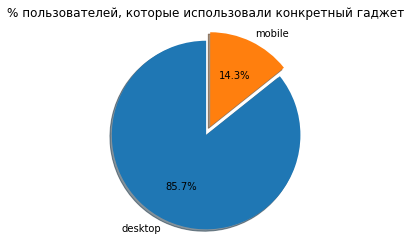

<Figure size 432x288 with 0 Axes>

In [ ]:
#группируем пользователей в зависимости от типа используемого гаджета
groups_device_out = outliers_info.groupby(by=['RESPONDENT_DEVICE_USED_IN_SURVEY']).size().to_frame(name = 'number_device_type')
# делим на 20, так как у каждого респондента в базе данных по 20 строк, где 20 строк - один блок
groups_device_out['number_device_type'] = groups_device_out['number_device_type'] // 20
print('Без процентов: ', groups_device_out['number_device_type'] )

graph_device_used(groups_device_out)


То есть в 85.7% (18 человек) - это пользователи, проходящие опрос с компьютерной версии сайта. Остальные 14.3% (3 человека) проходили опрос с мобильной версии опроса. 

##### Среднее время прохождения опроса

In [ ]:
time_respondent = outliers_info.groupby('RESPONDENT_ID')['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'].min()
min_time = np.min(time_respondent)
max_time = np.max(time_respondent)
av_time = np.mean(time_respondent)
print('Минимальное время прохождения опроса: {min: .0f} минута и {sec: .2f} секунды'.format(min = min_time // 60, sec = min_time % 60))
print('Максимальное время прохождения опроса: {min: .0f} минут и {sec: .2f} секунд'.format(min = max_time // 60, sec = max_time % 60))
print('Среднее время прохождения опроса: {min: .0f} минуты и {sec: .2f} секунды'.format(min = av_time // 60, sec = av_time % 60))

Минимальное время прохождения опроса:  1 минута и  52.00 секунды
Максимальное время прохождения опроса:  7 минут и  46.00 секунд
Среднее время прохождения опроса:  3 минуты и  34.19 секунды


##### Опыт использования социальных сетей

[2, 0, 2, 2, 15]
[ 9.52380952  0.          9.52380952  9.52380952 71.42857143]


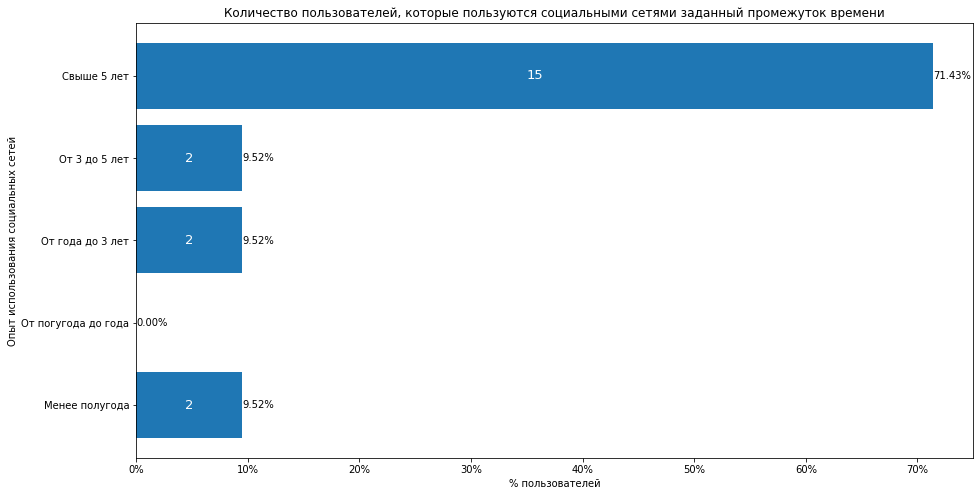

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по опыту пользования соц. сетями
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
soc_netw_out = [0] * 5
soc_netw_out[0] = (outliers_info.groupby(by='Q3_O1', as_index=False)['Q3_O1'].sum() // 20)['Q3_O1'][1]
soc_netw_out[1] = (outliers_info.groupby(by='Q3_O2', as_index=False)['Q3_O2'].sum() // 20)['Q3_O2'][1] if len((outliers_info.groupby(by='Q3_O2', as_index=False)['Q3_O2'].sum() // 20)['Q3_O2']) > 1 else 0
soc_netw_out[2] = (outliers_info.groupby(by='Q3_O3_3', as_index=False)['Q3_O3_3'].sum() // 20)['Q3_O3_3'][1]
soc_netw_out[3] = (outliers_info.groupby(by='Q3_O4_3_5', as_index=False)['Q3_O4_3_5'].sum() // 20)['Q3_O4_3_5'][1]
soc_netw_out[4] = (outliers_info.groupby(by='Q3_O5_5', as_index=False)['Q3_O5_5'].sum() // 20)['Q3_O5_5'][1]
soc_netw_out_perc = soc_netw_out / sum(soc_netw_out) * 100
print(soc_netw_out)
print(soc_netw_out_perc)


graph_snet_use(soc_netw_out_perc, soc_netw_out)

Таким образом, большинство - 71.43% (15 пользователей из 21). 

##### Привлекательность смайликов

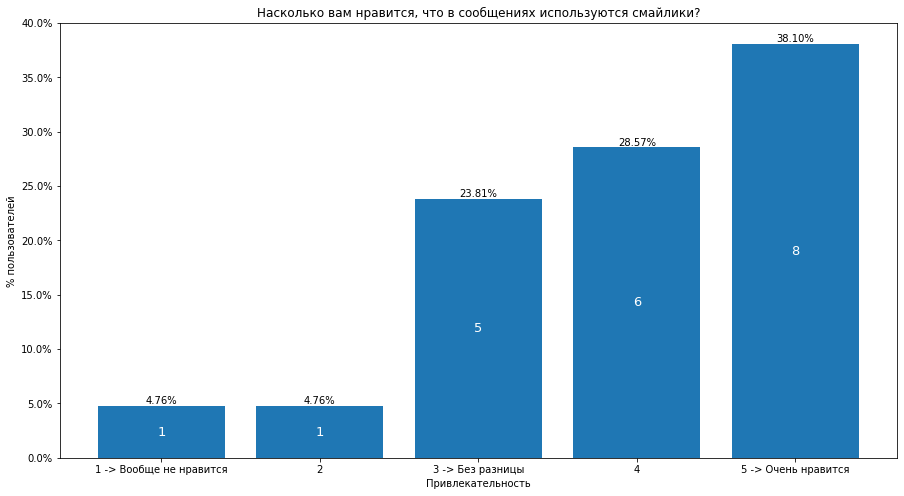

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к смайликам
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
emoticons_out = outliers_info.groupby(by='Q5', as_index=False)['Q5'].count() // 20
emoticons_out_perc = emoticons_out.copy()

emoticons_out = emoticons_out['Q5'].to_list()

# to show %
emoticons_out_perc['Q5'] = round(emoticons_out_perc['Q5'] / sum(emoticons_out_perc['Q5']) * 100, 2)
emoticons_out_perc = emoticons_out_perc['Q5'].to_list()


graph_emoticons(emoticons_out_perc, emoticons_out)

##### Важность грамматики, пунктуации и орфографии

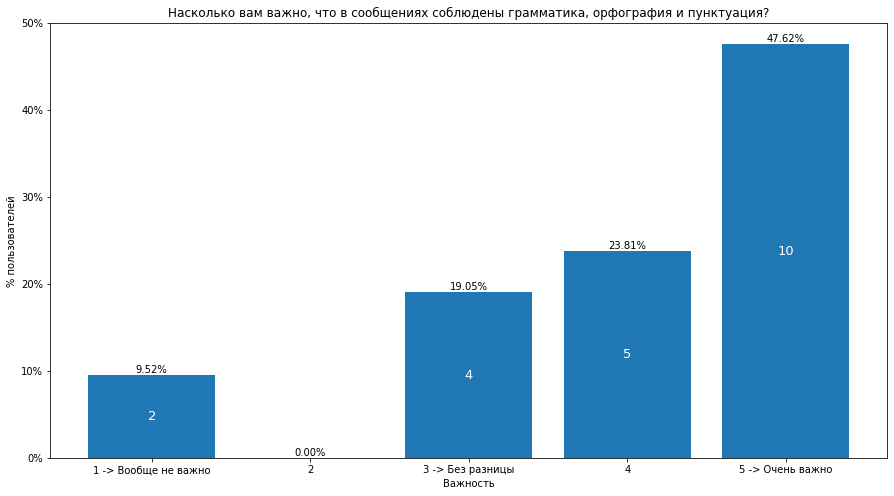

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к пунктуации, грамматики, орфографии
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
gr_out = outliers_info_q6.groupby(by='Q6', as_index=False)['RESPONDENT_ID'].count()
gr_out['RESPONDENT_ID'] = gr_out['RESPONDENT_ID'] // 20
gr_out_perc = gr_out.copy()
gr_out_list = gr_out['RESPONDENT_ID'].to_list()

# to show %
gr_out_perc['RESPONDENT_ID'] = round(gr_out_perc['RESPONDENT_ID'] / sum(gr_out_perc['RESPONDENT_ID']) * 100, 2)
gr_out_perc_list = gr_out_perc['RESPONDENT_ID'].to_list()

# заполняем пропуски: если в какой-то группе 0 пользователей, добавляем 0 в список
for i in range(5):
  if (i + 1) not in gr_out['Q6'].to_list():
    gr_out_list.insert(i, 0)
    gr_out_perc_list.insert(i, 0)


graph_gr_punc_orth(gr_out_perc_list, gr_out_list)

##### Отношение к шуткам

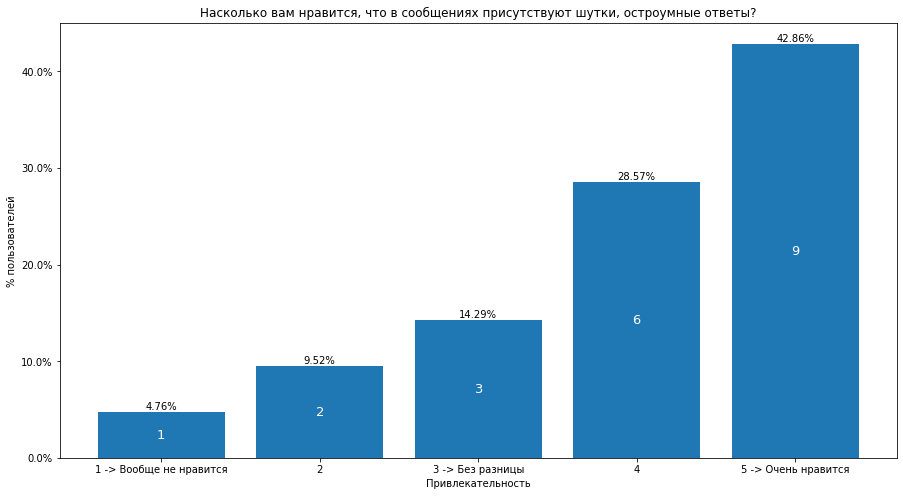

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к шуткам
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
jokes_out = outliers_info.groupby(by='Q7', as_index=False)['Q7'].count() // 20
jokes_out_perc = jokes_out.copy()

jokes_out = jokes_out['Q7'].to_list()

# to show %
jokes_out_perc['Q7'] = round(jokes_out_perc['Q7'] / sum(jokes_out_perc['Q7']) * 100, 2)
jokes_out_perc = jokes_out_perc['Q7'].to_list()



graph_jokes(jokes_out_perc, jokes_out)

42.86% нравятся шутки очень сильно и 28.57% просто нравятся, что составляет 15 человек из 21. 

##### Отношение к тексту без разбиений на части

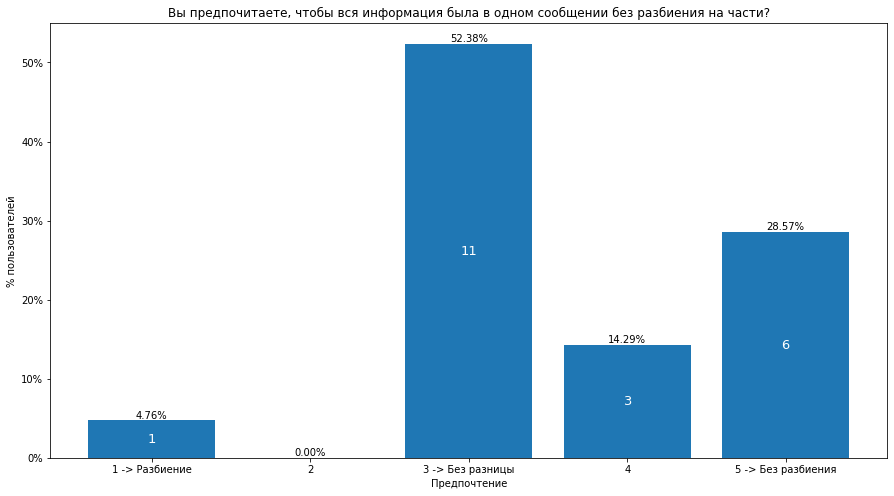

In [ ]:
text_out = outliers_info.groupby(by='Q8', as_index=False)['RESPONDENT_ID'].count()
text_out['RESPONDENT_ID'] = text_out['RESPONDENT_ID'] // 20
text_out_perc = text_out.copy()
text_out_list = text_out['RESPONDENT_ID'].to_list()

# to show %
text_out_perc['RESPONDENT_ID'] = round(text_out_perc['RESPONDENT_ID'] / sum(text_out_perc['RESPONDENT_ID']) * 100, 2)
text_out_perc_list = text_out_perc['RESPONDENT_ID'].to_list()

# заполняем пропуски: если в какой-то группе 0 пользователей, добавляем 0 в список
for i in range(5):
  if (i + 1) not in text_out['Q8'].to_list():
    text_out_list.insert(i, 0)
    text_out_perc_list.insert(i, 0)



graph_large_text(text_out_perc_list, text_out_list)

Половине пользователей, 11 из 21, без разницы, каким образом будет представлен текст. 

##### Все графики на одной картинке

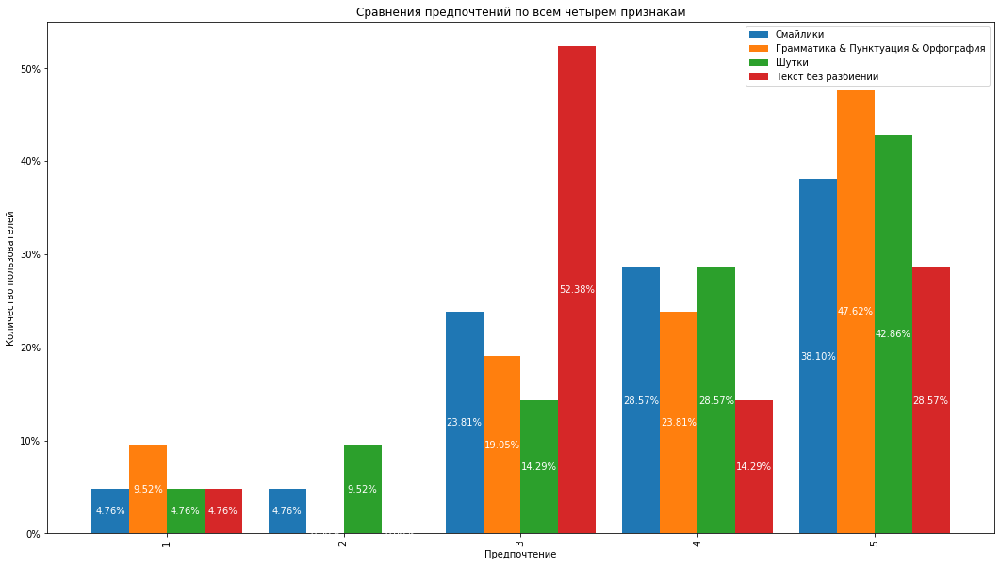

In [ ]:
# create data
df = pd.DataFrame([['1', emoticons_out_perc[0], gr_out_perc_list[0], jokes_out_perc[0], text_out_perc_list[0]],
                   ['2', emoticons_out_perc[1], gr_out_perc_list[1], jokes_out_perc[1], text_out_perc_list[1]],
                   ['3', emoticons_out_perc[2], gr_out_perc_list[2], jokes_out_perc[2], text_out_perc_list[2]],
                   ['4', emoticons_out_perc[3], gr_out_perc_list[3], jokes_out_perc[3], text_out_perc_list[3]],
                   ['5', emoticons_out_perc[4], gr_out_perc_list[4], jokes_out_perc[4], text_out_perc_list[4]]],
                  columns=['Предпочтение', 'Смайлики', 'Грамматика & Пунктуация & Орфография', 'Шутки', 'Текст без разбиений'])

  
# plot grouped bar chart
ax = df.plot(x='Предпочтение',
             ylabel='Количество пользователей',
        kind='bar',
        stacked=False,
        figsize = (18,10),
        width=0.85,
        title='Сравнения предпочтений по всем четырем признакам')

ax.bar_label(ax.containers[0], labels=['%.2f%%' % e for e in df['Смайлики']], color='white', label_type='center')
ax.bar_label(ax.containers[1], labels=['%.2f%%' % e for e in df['Грамматика & Пунктуация & Орфография']], color='white', label_type='center')
ax.bar_label(ax.containers[2], labels=['%.2f%%' % e for e in df['Шутки']], color='white', label_type='center')
ax.bar_label(ax.containers[3], labels=['%.2f%%' % e for e in df['Текст без разбиений']], color='white', label_type='center')

ax.yaxis.set_major_formatter(mtick.PercentFormatter())

### Удаление излишних данных и преобразование 0 в 1, если пользователь ответил "Без разницы", потому что это значит, он выбрал оба варианта, а не ни один из предложенных. 

Удаляем RESPONDENT_IP_ADDRESS, RESPONDENT_REGION, RESPONDENT_POSTCODE, RESPONDENT_TIME_OF_OPENING_SURVEY, RESPONDENT_TIME_OF_COMPLETING_SURVEY, RESPONDENT_UNIQUE_CODE, поскольку регион определим по городу, IP адрес и почтовый индекс не нужны в последующем анализе. А время у нас посчитано в отдельном столбце, поэтому время начала и конца прохождения опроса нам не нужно. 


In [ ]:
# удаляем колонки RESPONDENT_IP_ADDRESS RESPONDENT_REGION RESPONDENT_POSTCODE RESPONDENT_TIME_OF_OPENING_SURVEY 
# RESPONDENT_TIME_OF_COMPLETING_SURVEY RESPONDENT_UNIQUE_CODE 
# поскольку большинство респондентов пользуются соц. сетями больше 5 лет, то есть выбирают Q3_O5_5, это 87.4%, поэтому удаляем эту dummy переменную
# УДАЛИТЬ Q3_O5_5 ПОСЛЕ АНАЛИЗА
# https://dss.princeton.edu/online_help/analysis/dummy_variables.html
delete_columns = ['RESPONDENT_IP_ADDRESS', 'RESPONDENT_REGION', 'RESPONDENT_POSTCODE', 'RESPONDENT_TIME_OF_OPENING_SURVEY',
                  'RESPONDENT_TIME_OF_COMPLETING_SURVEY', 'RESPONDENT_UNIQUE_CODE']
facts_regr_sorted.drop(delete_columns, inplace=True, axis=1)
facts_regr_sorted = facts_regr_sorted.reset_index()
facts_regr_sorted.drop('index', inplace=True, axis=1)

# проверяем, нет ли лишних пробелов в начале и конце элементов столбца A1
# нужно будет знать при переводе названия в 4 столбца
facts_regr_sorted['A1'] = facts_regr_sorted['A1'].str.strip()

In [ ]:
# Замена 0 на 1, если пользователь выбрал "Нет различий, обоим вариантам доверяю."

# список списков, запоминающий две карточки, для которых было выбрано "Без разницы"
indiff0 = []
indexes = facts_regr_sorted.index.tolist()
for i in indexes[0::2]:
  altern1 = facts_regr_sorted.loc[i]
  altern2 = facts_regr_sorted.loc[i + 1]
  # если ответы двух альтернатив одинаковые -> это 0 (другого быть не может) -> заменяем на 1
  if altern1['CHOICE_INDICATOR'] == altern2['CHOICE_INDICATOR'] and altern1['RESPONDENT_ID'] == altern2['RESPONDENT_ID'] and altern1['SURVEY_ID'] == altern2['SURVEY_ID'] and altern1['CHOICE_SET'] == altern2['CHOICE_SET']:
    indiff0.append([altern1['A1'], altern2['A1']])
    facts_regr_sorted.at[i, 'CHOICE_INDICATOR'] = 1
    facts_regr_sorted.at[i + 1, 'CHOICE_INDICATOR'] = 1
print("Список профилей, на которые ответили 'Без разницы': {}.".format(indiff0))
print("Количество таких пар профилей: {}.".format(len(indiff0)))


# проверка на частном случае, что все заменилось
facts_regr_sorted[facts_regr_sorted['RESPONDENT_ID'] == 120470865]

Список профилей, на которые ответили 'Без разницы': [['11- - + +', '11- + + -'], ['11+ + - +', '11+ + + +'], ['11- - - +', '11- + + +'], ['11- - + +', '11+ - - -'], ['11- - - -', '11- + - +'], ['11- + - -', '11+ - + -'], ['11- - + +', '11+ + + +'], ['11+ - - -', '11+ + - -'], ['11- - + -', '11+ + - -'], ['11- + + -', '11+ + - +'], ['11- - + -', '11+ + - +'], ['11- - - -', '11- + + +'], ['11- + - +', '11+ - - -'], ['11- + - +', '11+ + + +'], ['11+ - - +', '11+ + - -'], ['11- + + -', '11- + + +'], ['11- - + -', '11+ + + -'], ['11- - - +', '11+ - + -'], ['11- + + -', '11+ + + +'], ['11+ - + -', '11+ + - -'], ['11+ + - +', '11+ + + -'], ['11- + - +', '11+ - + -'], ['11- - + -', '11+ - - +'], ['11+ + + -', '11+ + + +'], ['11- - - -', '11- + - -'], ['11- - - +', '11- + - +'], ['11+ + - +', '11+ + + +'], ['11- - - +', '11- + + +'], ['11- - + -', '11+ + - +'], ['11- - - +', '11- + - +'], ['11+ - - +', '11+ - + +'], ['11- + + -', '11+ - + -'], ['11- - - -', '11- + + +'], ['11- + + -', '11+ + - 

,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,A1,RESPONDENT_CITY,RESPONDENT_COUNTRY,RESPONDENT_DEVICE_USED_IN_SURVEY,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
100,120470865,4,1,1,1,11- - + +,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5
101,120470865,4,1,2,1,11- + + -,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5
102,120470865,4,2,1,0,11- + - -,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5
103,120470865,4,2,2,1,11+ + + -,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5
104,120470865,4,3,1,1,11- + - -,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5
105,120470865,4,3,2,0,11+ - - -,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5
106,120470865,4,4,1,0,11- + + -,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5
107,120470865,4,4,2,1,11+ - - +,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5
108,120470865,4,5,1,1,11+ + - +,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5
109,120470865,4,5,2,1,11+ + + +,Novosibirsk,Russia,desktop,154,0,0,0,1,0,0,1,5,4,5


In [ ]:
# перевод названий типа "11+ + - +" в четыре колонки соответствующих атрибутов
# если - -> ставим 0, то есть отсутствует атрибут
# если + -> ставим 1, то есть присутствует атрибут в виньетке

profiles = [('11- - - -', 0, 0, 0, 0),
            ('11- - - +', 0, 0, 0, 1),
            ('11- - + -', 0, 0, 1, 0),
            ('11- - + +', 0, 0, 1, 1),
            ('11- + - -', 0, 1, 0, 0),
            ('11- + - +', 0, 1, 0, 1),
            ('11- + + -', 0, 1, 1, 0),
            ('11- + + +', 0, 0, 0, 0),
            ('11+ - - -', 1, 0, 0, 0),
            ('11+ - - +', 1, 0, 0, 1),
            ('11+ - + -', 1, 0, 1, 0),
            ('11+ - + +', 1, 0, 1, 1),
            ('11+ + - -', 1, 1, 0, 0),
            ('11+ + - +', 1, 1, 0, 1),
            ('11+ + + -', 1, 1, 1, 0),
            ('11+ + + +', 1, 1, 1, 1)           
]

attributes = pd.DataFrame(profiles, columns = ['A1', 'emoticons', 'gr_pun_orth', 'jokes', 'large_text'])

In [ ]:
# соединяем две таблицы с помощью inner join для создания отдельных атрибутов
facts_regr_merge = pd.merge(facts_regr_sorted, attributes, how='inner', on='A1')

# facts_regr_merge_sorted = facts_regr_sorted = facts_regr_merge.sort_values(by=['RESPONDENT_ID', 'SURVEY_ID', 'CHOICE_SET', 'LABEL'], ascending=True).reset_index()

facts_regr_merge_sorted = facts_regr_merge.sort_values(by=['RESPONDENT_ID', 'SURVEY_ID', 'CHOICE_SET', 'LABEL'], ascending=True).reset_index()
facts_regr_merge_sorted.drop(['index', 'A1'], inplace=True, axis=1)
# также можно удалить choice_set, label, так как они полностью определяются survey_id
facts_regr_merge_sorted.drop(['CHOICE_SET', 'LABEL'], inplace=True, axis=1)

In [ ]:
facts_regr_merge_sorted

,RESPONDENT_ID,SURVEY_ID,CHOICE_INDICATOR,RESPONDENT_CITY,RESPONDENT_COUNTRY,RESPONDENT_DEVICE_USED_IN_SURVEY,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY,Q3_O1,Q3_O2,...,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8,emoticons,gr_pun_orth,jokes,large_text
0,120470635,5,0,Cherepovets,Russia,desktop,116,0,0,0,...,0,1,5,7,5,5,1,0,0,1
1,120470635,5,1,Cherepovets,Russia,desktop,116,0,0,0,...,0,1,5,7,5,5,1,1,0,0
2,120470635,5,1,Cherepovets,Russia,desktop,116,0,0,0,...,0,1,5,7,5,5,0,0,1,1
3,120470635,5,0,Cherepovets,Russia,desktop,116,0,0,0,...,0,1,5,7,5,5,1,0,1,1
4,120470635,5,0,Cherepovets,Russia,desktop,116,0,0,0,...,0,1,5,7,5,5,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7695,120883106,1,1,Verkhnyaya Salda,Russia,mobile,353,1,0,0,...,0,1,1,7,1,2,1,1,1,0
7696,120883106,1,1,Verkhnyaya Salda,Russia,mobile,353,1,0,0,...,0,1,1,7,1,2,0,1,0,1
7697,120883106,1,0,Verkhnyaya Salda,Russia,mobile,353,1,0,0,...,0,1,1,7,1,2,1,1,1,1
7698,120883106,1,0,Verkhnyaya Salda,Russia,mobile,353,1,0,0,...,0,1,1,7,1,2,0,0,1,1


In [ ]:
facts_regr_merge_sorted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7700 entries, 0 to 7699
Data columns (total 21 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   RESPONDENT_ID                           7700 non-null   int64 
 1   SURVEY_ID                               7700 non-null   int64 
 2   CHOICE_INDICATOR                        7700 non-null   int64 
 3   RESPONDENT_CITY                         7700 non-null   object
 4   RESPONDENT_COUNTRY                      7700 non-null   object
 5   RESPONDENT_DEVICE_USED_IN_SURVEY        7700 non-null   object
 6   RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS  7700 non-null   int64 
 7   RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY  7700 non-null   int64 
 8   Q3_O1                                   7700 non-null   int64 
 9   Q3_O2                                   7700 non-null   int64 
 10  Q3_O3_3                                 7700 non-null   int64 
 11  Q3_O

In [ ]:
# исправляем опечатку, сливаем 2 и 3 в 2 и 5 и 6 в 4
facts_regr_merge_sorted_q6 = facts_regr_merge_sorted.copy()

facts_regr_merge_sorted_q6.loc[facts_regr_merge_sorted_q6['Q6'] == 3, 'Q6'] = 2
facts_regr_merge_sorted_q6.loc[facts_regr_merge_sorted_q6['Q6'] == 4, 'Q6'] = 3
facts_regr_merge_sorted_q6.loc[facts_regr_merge_sorted_q6['Q6'] == 5, 'Q6'] = 4
facts_regr_merge_sorted_q6.loc[facts_regr_merge_sorted_q6['Q6'] == 6, 'Q6'] = 4
facts_regr_merge_sorted_q6.loc[facts_regr_merge_sorted_q6['Q6'] == 7, 'Q6'] = 5

## Основные статистические графики, кто сколько прошел, кому что показалось

### Отрисовка стран участников в опроса

In [ ]:
# поскольку у каждого пользователя по 20 строчек в таблице, то общее количество пользователей из каждой страны делим на 20

countries = facts_regr_sorted.groupby('RESPONDENT_COUNTRY')['RESPONDENT_COUNTRY'].count().to_frame(
    name='count').reset_index()
countries['count'] = countries['count'] // 20

In [ ]:
countries

,RESPONDENT_COUNTRY,count
0,Armenia,1
1,Belarus,2
2,Finland,1
3,Georgia,1
4,Germany,1
5,Indonesia,1
6,Italy,1
7,Japan,1
8,Kazakhstan,1
9,Netherlands,3


In [ ]:
countries['codes'] = countries.apply(lambda row: get_continent(row['RESPONDENT_COUNTRY']), axis=1)
countries[['country', 'continent']] = pd.DataFrame(countries['codes'].tolist(), index=countries.index)   

In [ ]:
countries

,RESPONDENT_COUNTRY,count,codes,country,continent
0,Armenia,1,"(AM, AS)",AM,AS
1,Belarus,2,"(BY, EU)",BY,EU
2,Finland,1,"(FI, EU)",FI,EU
3,Georgia,1,"(GE, AS)",GE,AS
4,Germany,1,"(DE, EU)",DE,EU
5,Indonesia,1,"(ID, AS)",ID,AS
6,Italy,1,"(IT, EU)",IT,EU
7,Japan,1,"(JP, AS)",JP,AS
8,Kazakhstan,1,"(KZ, AS)",KZ,AS
9,Netherlands,3,"(NL, EU)",NL,EU


In [ ]:
countries['geolocate'] = countries.apply(lambda row: geolocate(row['country']), axis=1)

In [ ]:
countries[['latitude', 'longitude']] = pd.DataFrame(countries['geolocate'].tolist(), index=countries.index)  
# поменяли latitude и longitude России, так как они были неправильные и указывали на Великобританию
countries.loc[countries.index[countries['RESPONDENT_COUNTRY'] == 'Russia'], 'latitude'] = 55.755871
countries.loc[countries.index[countries['RESPONDENT_COUNTRY'] == 'Russia'], 'longitude'] = 37.617680

In [ ]:
countries

,RESPONDENT_COUNTRY,count,codes,country,continent,geolocate,latitude,longitude
0,Armenia,1,"(AM, AS)",AM,AS,"(40.7696272, 44.6736646)",40.769627,44.673665
1,Belarus,2,"(BY, EU)",BY,EU,"(53.4250605, 27.6971358)",53.425061,27.697136
2,Finland,1,"(FI, EU)",FI,EU,"(63.2467777, 25.9209164)",63.246778,25.920916
3,Georgia,1,"(GE, AS)",GE,AS,"(41.6809707, 44.0287382)",41.680971,44.028738
4,Germany,1,"(DE, EU)",DE,EU,"(51.0834196, 10.4234469)",51.083420,10.423447
5,Indonesia,1,"(ID, AS)",ID,AS,"(-2.4833826, 117.8902853)",-2.483383,117.890285
6,Italy,1,"(IT, EU)",IT,EU,"(42.6384261, 12.674297)",42.638426,12.674297
7,Japan,1,"(JP, AS)",JP,AS,"(36.5748441, 139.2394179)",36.574844,139.239418
8,Kazakhstan,1,"(KZ, AS)",KZ,AS,"(47.2286086, 65.2093197)",47.228609,65.209320
9,Netherlands,3,"(NL, EU)",NL,EU,"(52.24764975, 5.541246849406163)",52.247650,5.541247


In [ ]:
#empty map
world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)
#for each coordinate, create circlemarker of user percent
for i in range(len(countries)):
  lat = countries.iloc[i]['latitude']
  long = countries.iloc[i]['longitude']
  radius=5
  popup_text = """Country : {}<br>
                    № of Users : {}<br>"""
  popup_text = popup_text.format(countries.iloc[i]['country'],
                                   countries.iloc[i]['count']
                                   )
  folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)
#show the map
world_map

### Сколько раз был показан каждый блок и профиль опроса

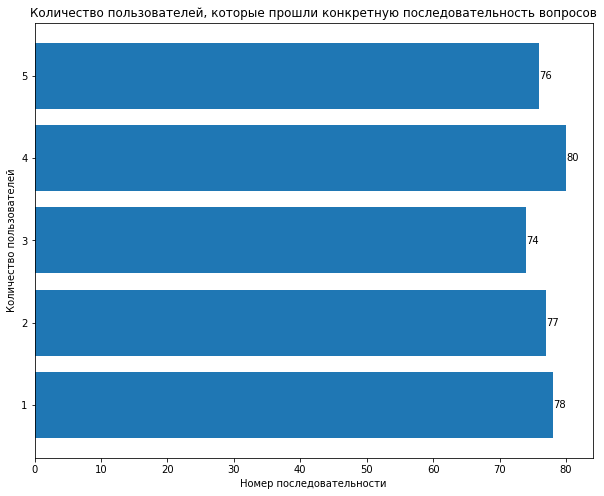

In [ ]:
#группируем пользователей в зависимости от пройденного блока вопросов
groups = facts_regr_merge_sorted.groupby(by=['SURVEY_ID'], sort=True).size().to_frame(name = 'times block shown')
# делим на 20, так как у каждого респондента в базе данных по 20 строк, где 20 строк - один блок
groups['times block shown'] = groups['times block shown'] // 20

def graph_blocks_shown(df):
  block = [0] * len(df)
  for i in range(len(df)):
    # +1 так как SURVEY_ID начинается с 1 -> индекс таблицы тоже с 1
    block[i] = df.loc[i + 1, 'times block shown']
  
  # наглядный график
  fig, ax = plt.subplots(figsize=(10,8))
  bars = ax.barh(list(df.index.values), block)
  ax.bar_label(bars)
  plt.xlabel('Номер последовательности')
  plt.ylabel('Количество пользователей')
  plt.title('Количество пользователей, которые прошли конкретную последовательность вопросов')
  plt.show()

graph_blocks_shown(groups)
  

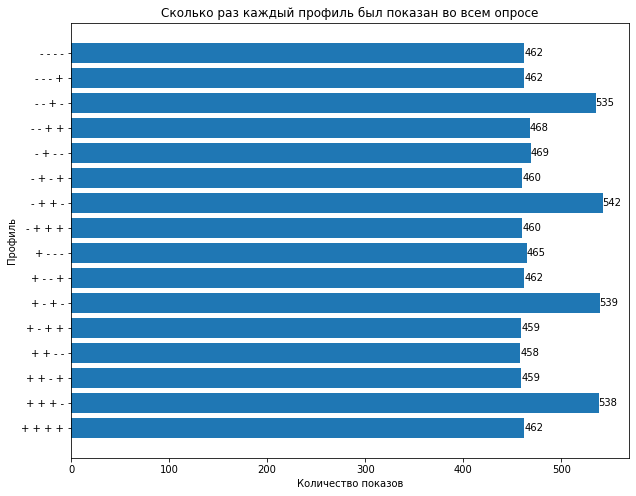

In [ ]:
# считаем, сколько раз был показан каждый профиль, поскольку они должны быть показаны примерно одинаковое количество раз
#группируем пользователей в зависимости от пройденного блока вопросов
groups = facts_regr_sorted.groupby(by=['A1'], sort=True, as_index=False).size()


def graph_profile_shown(df):
  profile = [0] * len(df)
  for i in range(len(df)):
    # +1 так как SURVEY_ID начинается с 1 -> индекс таблицы тоже с 1
    profile[i] = df.loc[i, 'size']
  
  # наглядный график
  fig, ax = plt.subplots(figsize=(10,8))
  bars = ax.barh([df['A1'][i][2:] for i in range(len(df['A1']))], profile)
  ax.bar_label(bars)
  plt.xlabel('Количество показов')
  plt.ylabel('Профиль')
  plt.title('Сколько раз каждый профиль был показан во всем опросе')
  plt.show()

graph_profile_shown(groups)


In [ ]:
list(reversed(groups['size']))

[462,
 462,
 535,
 468,
 469,
 460,
 542,
 460,
 465,
 462,
 539,
 459,
 458,
 459,
 538,
 462]

### Тип использованного гаджета для прохождения опроса

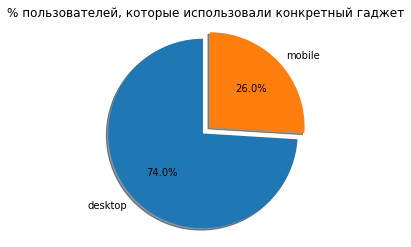

<Figure size 432x288 with 0 Axes>

In [ ]:
#группируем пользователей в зависимости от типа используемого гаджета
groups_device = facts_regr_merge_sorted.groupby(by=['RESPONDENT_DEVICE_USED_IN_SURVEY']).size().to_frame(name = 'number_device_type')
# делим на 20, так как у каждого респондента в базе данных по 20 строк, где 20 строк - один блок
groups_device['number_device_type'] = groups_device['number_device_type'] // 20


graph_device_used(groups_device)


### Среднее время прохождения опроса

In [ ]:
time_respondent = facts_regr_merge_sorted.groupby('RESPONDENT_ID')['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'].min()
av_time = np.mean(time_respondent)
print('Среднее время прохождения опроса: {min: .0f} минуты и {sec: .2f} секунды'.format(min = av_time // 60, sec = av_time % 60))

Среднее время прохождения опроса:  4 минуты и  23.91 секунды


In [ ]:
resp_length_device = facts_regr_merge_sorted.groupby(['RESPONDENT_ID', 'RESPONDENT_DEVICE_USED_IN_SURVEY'],as_index=False)['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'].min()
av_length_device = resp_length_device.groupby('RESPONDENT_DEVICE_USED_IN_SURVEY', as_index=False)['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'].mean()
av_length_device['min'] = av_length_device['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'] // 60
av_length_device['sec'] = av_length_device['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'] % 60

In [ ]:
av_length_device

,RESPONDENT_DEVICE_USED_IN_SURVEY,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,min,sec
0,desktop,264.249123,4.0,24.249123
1,mobile,262.960000,4.0,22.960000


### Количество дисквалифицированных участников и причина на этапе выгрузки данных

In [ ]:
excel_intfacts = pd.read_excel('interesting-facts.xlsx', sheet_name='Respondents').iloc[1:, :]
excel_intfacts.columns = excel_intfacts.iloc[0]
excel_intfacts = excel_intfacts[1:]

In [ ]:
excel_intfacts.head()

1,participant_id,Assigned conjoint block,Datetime of participant creation,Datetime of entering survey,Datetime of finishing survey,Length of interview in seconds,IP address,Location: City,Location: Region,Location: Postcode,...,Q3: Как давно вы пользуетесь социальными сетями?\nOption 1: Менее полугода,Q3: Как давно вы пользуетесь социальными сетями?\nOption 2: От погугода до года,Q3: Как давно вы пользуетесь социальными сетями?\nOption 3: От года до 3 лет,Q3: Как давно вы пользуетесь социальными сетями?\nOption 4: От 3 до 5 лет,Q3: Как давно вы пользуетесь социальными сетями?\nOption 5: Свыше 5 лет,Q3: Как давно вы пользуетесь социальными сетями?,"Q5: Насколько вам нравится, что в сообщениях используются смайлики?","Q6: Насколько вам важно, что в сообщениях соблюдены грамматика, орфография","Q7: Насколько вам нравится, что в сообщениях присутствуют шутки, остроумны","Q8: Я предпочитаю, чтобы вся информация была в одном сообщении без разбиен"
2,120470334,2,2022-04-06 09:45:36,2022-04-06 09:45:36,2022-04-06 09:45:42,6,91.108.0.206,St Petersburg,St.-Petersburg,190923,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,120470597,1,2022-04-06 10:10:43,2022-04-06 10:10:43,2022-04-06 10:10:50,7,91.108.0.206,St Petersburg,St.-Petersburg,190923,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,120470632,1,2022-04-06 10:15:55,2022-04-06 10:15:55,2022-04-06 10:20:40,285,81.4.206.24,Sarov,Nizhny Novgorod Oblast,607188,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,120470635,5,2022-04-06 10:16:15,2022-04-06 10:16:15,2022-04-06 10:18:11,116,128.70.155.249,Cherepovets,Vologda Oblast,162608,...,0,0,0,0,1,Option 5: Свыше 5 лет,5,7,5,5
6,120470640,2,2022-04-06 10:16:58,2022-04-06 10:16:58,NaN,NaN,188.128.75.50,Nevel,Pskov Oblast,182503,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Общее количество полученных ответов любого качества: 952
Количество пользователей, которые не были дисквалифицированы: 406


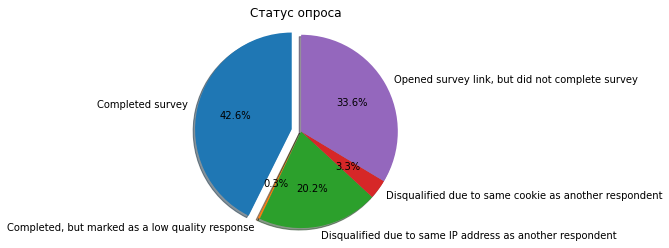

In [ ]:
#группируем пользователей в зависимости от статуса опроса: прошел, дисквалифицирован, не прошел до конца
status_response = excel_intfacts.groupby(by='Status of response', as_index=False).size()

def graph_completed_number(df):

  # перевод в проценты каждого числа
  sizes = df['size'] / sum(df['size']) * 100

  # наглядный график

  # чтобы ячейки были объемные
  explode = (0.1, 0, 0, 0, 0)

  fig, ax = plt.subplots()
  ax.pie(sizes, explode=explode, labels=df['Status of response'], autopct='%1.1f%%',
         shadow=True, startangle=90)
  plt.title('Статус опроса')
  # чтобы pie чарт точно был круглым
  ax.axis('equal')
  plt.show()


print('Общее количество полученных ответов любого качества: {}'.format(excel_intfacts.shape[0]))
print('Количество пользователей, которые не были дисквалифицированы: {}'.format(excel_intfacts[excel_intfacts['Status of response'] == 'Completed survey'].shape[0]))

graph_completed_number(status_response)


### Как давно пользуются социальными сетями

385


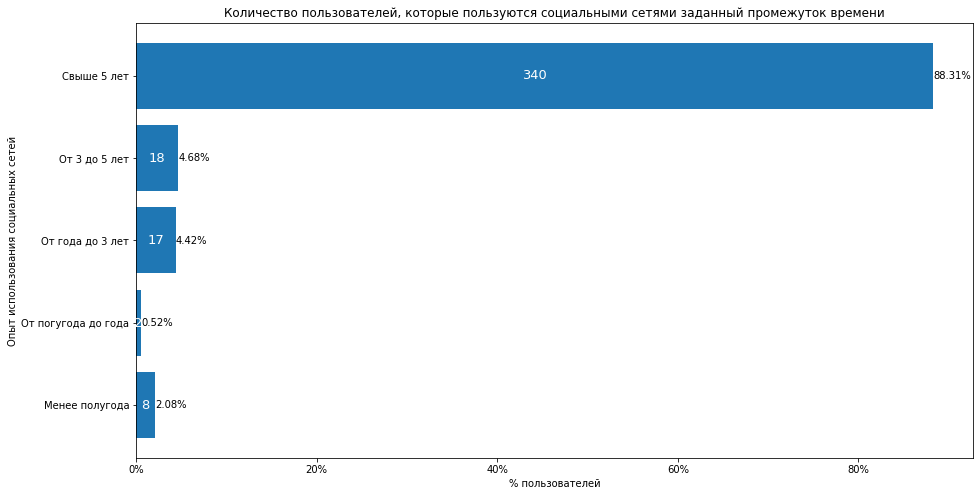

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по опыту пользования соц. сетями
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
soc_netw = [0] * 5
soc_netw[0] = (facts_regr_merge_sorted.groupby(by='Q3_O1', as_index=False)['Q3_O1'].sum() // 20)['Q3_O1'][1]
soc_netw[1] = (facts_regr_merge_sorted.groupby(by='Q3_O2', as_index=False)['Q3_O2'].sum() // 20)['Q3_O2'][1]
soc_netw[2] = (facts_regr_merge_sorted.groupby(by='Q3_O3_3', as_index=False)['Q3_O3_3'].sum() // 20)['Q3_O3_3'][1]
soc_netw[3] = (facts_regr_merge_sorted.groupby(by='Q3_O4_3_5', as_index=False)['Q3_O4_3_5'].sum() // 20)['Q3_O4_3_5'][1]
soc_netw[4] = (facts_regr_merge_sorted.groupby(by='Q3_O5_5', as_index=False)['Q3_O5_5'].sum() // 20)['Q3_O5_5'][1]
soc_netw_perc = soc_netw / sum(soc_netw) * 100
print(sum(soc_netw))

graph_snet_use(soc_netw_perc, soc_netw)

#### Опыт в зависимости от смайликов

In [ ]:
# количество пользователей (RESPONDENT_ID), которые ответили на эмодзи "Q5" и выбрали соответствующий из "Q3_i" ответ по поводу опыта использования социальными сетями
emoticon_exp = facts_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q5', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False)['Q5'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
emoticon_exp['Q5'] = emoticon_exp['Q5'] // 20

sum_emoticon_by_exp = emoticon_exp.groupby(by=['Q5', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False).count()

sum_emoticon_by_exp.head(5)

,Q5,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,RESPONDENT_ID
0,1,0,0,0,0,1,41
1,1,0,0,0,1,0,2
2,1,0,0,1,0,0,1
3,1,1,0,0,0,0,1
4,2,0,0,0,0,1,52


In [ ]:
sum_emoticon_by_exp.iloc[:, 1:6] = sum_emoticon_by_exp.iloc[:, 1:6].apply(lambda x: x * sum_emoticon_by_exp.iloc[:,6])
sum_emoticon_by_exp.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по смайликам соответствует количество респондентов, которые выбрали именно этот score для смайкликов
# и дальше эти пользователи расписаны согласно их опыту
sum_emoticon_by_exp = sum_emoticon_by_exp.groupby(by='Q5', as_index=False).sum()
sum_emoticon_by_exp

,Q5,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5
0,1,1,0,1,2,41
1,2,3,0,3,5,52
2,3,1,1,6,4,89
3,4,2,1,3,2,73
4,5,1,0,4,5,85


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенный опыт
sum_emoticon_by_exp_perc = sum_emoticon_by_exp.copy()
sum_emoticon_by_exp_perc['total'] = sum_emoticon_by_exp_perc.iloc[:, 1:6].sum(axis=1)
print(sum_emoticon_by_exp_perc)
sum_emoticon_by_exp_perc.iloc[:, 1:6] = sum_emoticon_by_exp_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_emoticon_by_exp_perc.iloc[:, 6] * 100, 2) )
sum_emoticon_by_exp_perc

   Q5  Q3_O1  Q3_O2  Q3_O3_3  Q3_O4_3_5  Q3_O5_5  total
0   1      1      0        1          2       41     45
1   2      3      0        3          5       52     63
2   3      1      1        6          4       89    101
3   4      2      1        3          2       73     81
4   5      1      0        4          5       85     95


,Q5,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,total
0,1,2.22,0.00,2.22,4.44,91.11,45
1,2,4.76,0.00,4.76,7.94,82.54,63
2,3,0.99,0.99,5.94,3.96,88.12,101
3,4,2.47,1.23,3.70,2.47,90.12,81
4,5,1.05,0.00,4.21,5.26,89.47,95


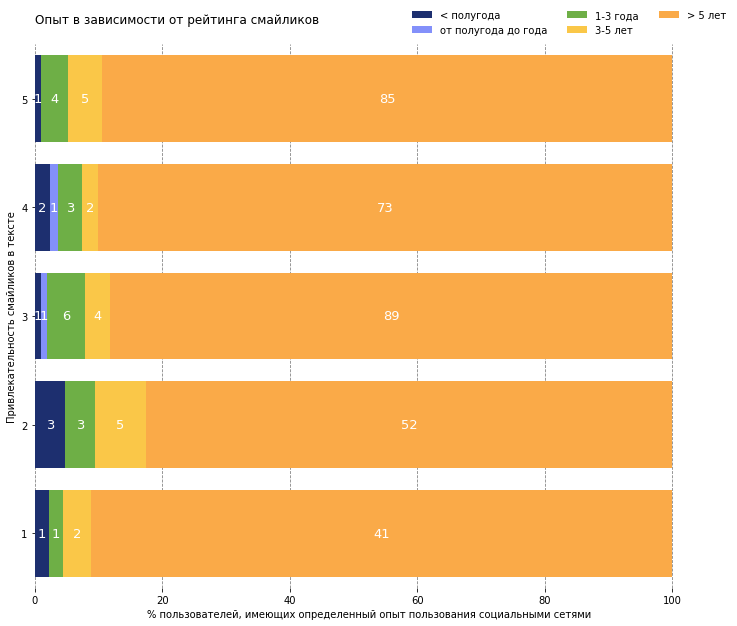

In [ ]:
fields = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['< полугода', 'от полугода до года', '1-3 года', '3-5 лет', '> 5 лет']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_emoticon_by_exp_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_emoticon_by_exp_perc.index + 1, sum_emoticon_by_exp_perc[name], left = left, color=colors[idx])
    left = left + sum_emoticon_by_exp_perc[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_emoticon_by_exp.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Опыт в зависимости от рейтинга смайликов\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность смайликов в тексте')
plt.xlabel('% пользователей, имеющих определенный опыт пользования социальными сетями')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Таким образом, подавляющее большинство во всех категориях пользуется соц. сетями больше 5 лет. 

#### Опыт в зависимости от шуток

In [ ]:
# количество пользователей (RESPONDENT_ID), которые ответили на шутки "Q6" и выбрали соответствующий из "Q3_i" ответ по поводу опыта использования социальными сетями
jokes_exp = facts_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q7', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False)['Q7'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
jokes_exp['Q7'] = jokes_exp['Q7'] // 20

sum_jokes_by_exp = jokes_exp.groupby(by=['Q7', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False).count()

sum_jokes_by_exp.head(5)

,Q7,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,RESPONDENT_ID
0,1,0,0,0,0,1,8
1,1,1,0,0,0,0,1
2,2,0,0,0,0,1,20
3,2,0,0,0,1,0,2
4,2,1,0,0,0,0,2


In [ ]:
sum_jokes_by_exp.iloc[:, 1:6] = sum_jokes_by_exp.iloc[:, 1:6].apply(lambda x: x * sum_jokes_by_exp.iloc[:,6])
sum_jokes_by_exp.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по шуткам соответствует количество респондентов, которые выбрали именно этот score для шуток
# и дальше эти пользователи расписаны согласно их опыту
sum_jokes_by_exp = sum_jokes_by_exp.groupby(by='Q7', as_index=False).sum()
sum_jokes_by_exp

,Q7,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5
0,1,1,0,0,0,8
1,2,2,0,0,2,20
2,3,0,2,4,6,78
3,4,3,0,5,6,110
4,5,2,0,8,4,124


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенный опыт пользования соц. сетями
sum_jokes_by_exp_perc = sum_jokes_by_exp.copy()
sum_jokes_by_exp_perc['total'] = sum_jokes_by_exp_perc.iloc[:, 1:6].sum(axis=1)
print(sum_jokes_by_exp_perc)
sum_jokes_by_exp_perc.iloc[:, 1:6] = sum_jokes_by_exp_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_jokes_by_exp_perc.iloc[:, 6] * 100, 2) )
sum_jokes_by_exp_perc

   Q7  Q3_O1  Q3_O2  Q3_O3_3  Q3_O4_3_5  Q3_O5_5  total
0   1      1      0        0          0        8      9
1   2      2      0        0          2       20     24
2   3      0      2        4          6       78     90
3   4      3      0        5          6      110    124
4   5      2      0        8          4      124    138


,Q7,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,total
0,1,11.11,0.00,0.00,0.00,88.89,9
1,2,8.33,0.00,0.00,8.33,83.33,24
2,3,0.00,2.22,4.44,6.67,86.67,90
3,4,2.42,0.00,4.03,4.84,88.71,124
4,5,1.45,0.00,5.80,2.90,89.86,138


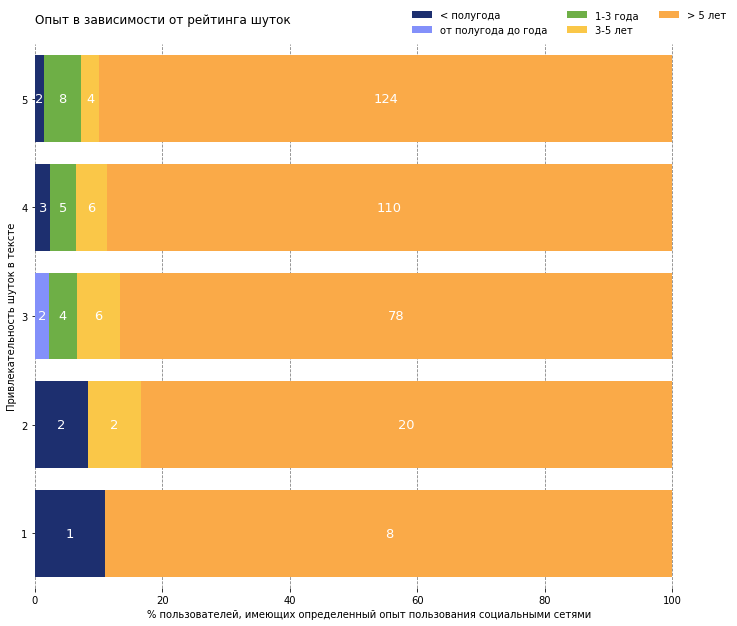

In [ ]:
fields = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['< полугода', 'от полугода до года', '1-3 года', '3-5 лет', '> 5 лет']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_jokes_by_exp_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_jokes_by_exp_perc.index + 1, sum_jokes_by_exp_perc[name], left = left, color=colors[idx])
    left = left + sum_jokes_by_exp_perc[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_jokes_by_exp.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Опыт в зависимости от рейтинга шуток\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность шуток в тексте')
plt.xlabel('% пользователей, имеющих определенный опыт пользования социальными сетями')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Таким образом, подавляющее большинство во всех категориях пользуется соц. сетями больше 5 лет. 

#### Опыт в зависимости от орфографии, грамматики и пунктуации

In [ ]:
# количество пользователей (RESPONDENT_ID), которые ответили на офографию и т.д. "Q6" и выбрали соответствующий из "Q3_i" ответ по поводу опыта использования социальными сетями
orth_exp = facts_regr_merge_sorted_q6.groupby(by=['RESPONDENT_ID', 'Q6', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False)['Q6'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
orth_exp['Q6'] = orth_exp['Q6'] // 20

sum_orth_by_exp = orth_exp.groupby(by=['Q6', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False).count()

sum_orth_by_exp.head(5)

,Q6,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,RESPONDENT_ID
0,1,0,0,0,0,1,4
1,1,0,0,0,1,0,1
2,2,0,0,0,0,1,10
3,2,0,0,1,0,0,1
4,3,0,0,0,0,1,20


In [ ]:
sum_orth_by_exp.iloc[:, 1:6] = sum_orth_by_exp.iloc[:, 1:6].apply(lambda x: x * sum_orth_by_exp.iloc[:,6])
sum_orth_by_exp.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по орфографии и т.д. соответствует количество респондентов, которые выбрали именно этот score по орфографии
# и дальше эти пользователи расписаны согласно их опыту
sum_orth_by_exp = sum_orth_by_exp.groupby(by='Q6', as_index=False).sum()
sum_orth_by_exp

,Q6,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5
0,1,0,0,0,1,4
1,2,0,0,1,0,10
2,3,2,0,2,2,20
3,4,1,1,8,6,110
4,5,5,1,6,9,196


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенный опыт пользования соц. сетями
sum_orth_by_exp_perc = sum_orth_by_exp.copy()
sum_orth_by_exp_perc['total'] = sum_orth_by_exp_perc.iloc[:, 1:6].sum(axis=1)
print(sum_orth_by_exp_perc)
sum_orth_by_exp_perc.iloc[:, 1:6] = sum_orth_by_exp_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_orth_by_exp_perc.iloc[:, 6] * 100, 2) )
sum_orth_by_exp_perc

   Q6  Q3_O1  Q3_O2  Q3_O3_3  Q3_O4_3_5  Q3_O5_5  total
0   1      0      0        0          1        4      5
1   2      0      0        1          0       10     11
2   3      2      0        2          2       20     26
3   4      1      1        8          6      110    126
4   5      5      1        6          9      196    217


,Q6,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,total
0,1,0.00,0.00,0.00,20.00,80.00,5
1,2,0.00,0.00,9.09,0.00,90.91,11
2,3,7.69,0.00,7.69,7.69,76.92,26
3,4,0.79,0.79,6.35,4.76,87.30,126
4,5,2.30,0.46,2.76,4.15,90.32,217


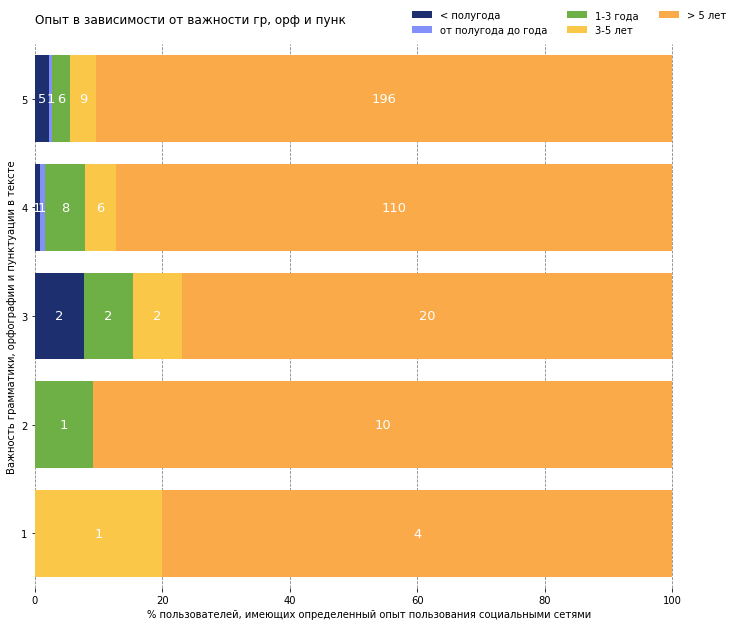

In [ ]:
fields = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['< полугода', 'от полугода до года', '1-3 года', '3-5 лет', '> 5 лет']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_orth_by_exp_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_orth_by_exp_perc.index + 1, sum_orth_by_exp_perc[name], left = left, color=colors[idx])
    left = left + sum_orth_by_exp_perc[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_orth_by_exp.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Опыт в зависимости от важности гр, орф и пунк\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Важность грамматики, орфографии и пунктуации в тексте')
plt.xlabel('% пользователей, имеющих определенный опыт пользования социальными сетями')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Таким образом, подавляющее большинство во всех категориях пользуется соц. сетями больше 5 лет. 

Выделяются еще категории 1 и 2, где есть только опыт больше 5 лет и только 3-5 лет или 1-3 года соответственно. 

#### Опыт в зависимости от текста без разбиений

In [ ]:
# количество пользователей (RESPONDENT_ID), которые ответили на шутки "Q6" и выбрали соответствующий из "Q3_i" ответ по поводу опыта использования социальными сетями
text_exp = facts_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q8', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False)['Q8'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
text_exp['Q8'] = text_exp['Q8'] // 20

sum_text_by_exp = text_exp.groupby(by=['Q8', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False).count()

sum_text_by_exp.head(5)

,Q8,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,RESPONDENT_ID
0,1,0,0,0,0,1,38
1,1,0,0,0,1,0,2
2,1,0,0,1,0,0,3
3,2,0,0,0,0,1,48
4,2,0,0,0,1,0,3


In [ ]:
sum_text_by_exp.iloc[:, 1:6] = sum_text_by_exp.iloc[:, 1:6].apply(lambda x: x * sum_text_by_exp.iloc[:,6])
sum_text_by_exp.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по разбиению текста соответствует количество респондентов, которые выбрали именно этот score для разбиения
# и дальше эти пользователи расписаны согласно их опыту
sum_text_by_exp = sum_text_by_exp.groupby(by='Q8', as_index=False).sum()
sum_text_by_exp

,Q8,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5
0,1,0,0,3,2,38
1,2,2,1,5,3,48
2,3,3,0,2,3,114
3,4,1,0,4,4,59
4,5,2,1,3,6,81


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенный опыт пользования соц. сетями
sum_text_by_exp_perc = sum_text_by_exp.copy()
sum_text_by_exp_perc['total'] = sum_text_by_exp_perc.iloc[:, 1:6].sum(axis=1)
print(sum_text_by_exp_perc)
sum_text_by_exp_perc.iloc[:, 1:6] = sum_text_by_exp_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_text_by_exp_perc.iloc[:, 6] * 100, 2) )
sum_text_by_exp_perc

   Q8  Q3_O1  Q3_O2  Q3_O3_3  Q3_O4_3_5  Q3_O5_5  total
0   1      0      0        3          2       38     43
1   2      2      1        5          3       48     59
2   3      3      0        2          3      114    122
3   4      1      0        4          4       59     68
4   5      2      1        3          6       81     93


,Q8,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,total
0,1,0.00,0.00,6.98,4.65,88.37,43
1,2,3.39,1.69,8.47,5.08,81.36,59
2,3,2.46,0.00,1.64,2.46,93.44,122
3,4,1.47,0.00,5.88,5.88,86.76,68
4,5,2.15,1.08,3.23,6.45,87.10,93


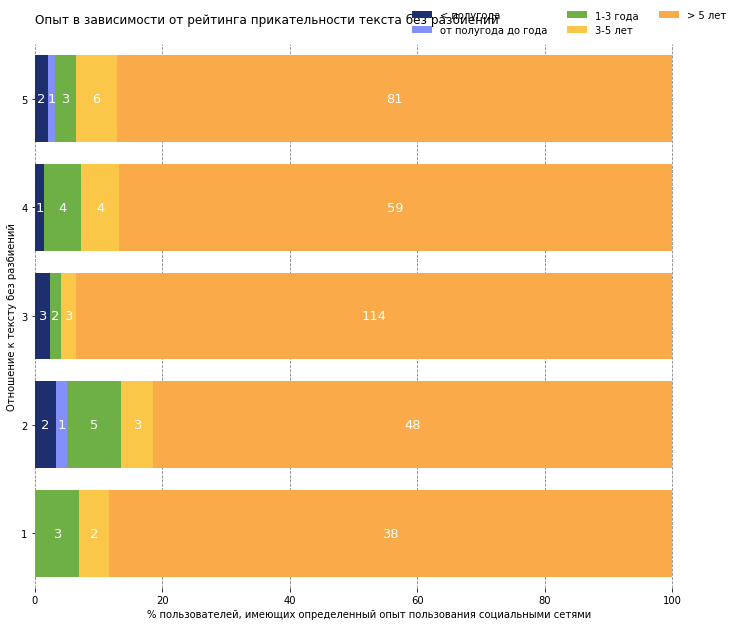

In [ ]:
fields = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['< полугода', 'от полугода до года', '1-3 года', '3-5 лет', '> 5 лет']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_text_by_exp_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_text_by_exp_perc.index + 1, sum_text_by_exp_perc[name], left = left, color=colors[idx])
    left = left + sum_text_by_exp_perc[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_text_by_exp.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Опыт в зависимости от рейтинга прикательности текста без разбиений\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Отношение к тексту без разбиений')
plt.xlabel('% пользователей, имеющих определенный опыт пользования социальными сетями')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Таким образом, подавляющее большинство во всех категориях пользуется соц. сетями больше 5 лет. 

### Насколько вам нравится, что в сообщениях используются смайлики

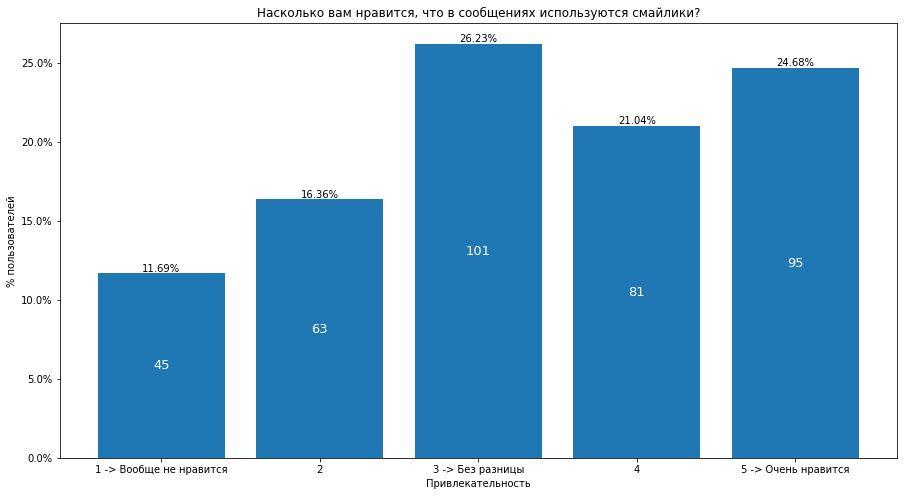

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к смайликам
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
emoticons = facts_regr_merge_sorted.groupby(by='Q5', as_index=False)['Q5'].count() // 20
emoticons_perc = emoticons.copy()

emoticons = emoticons['Q5'].to_list()

# to show %
emoticons_perc['Q5'] = round(emoticons_perc['Q5'] / sum(emoticons_perc['Q5']) * 100, 2)
emoticons_perc = emoticons_perc['Q5'].to_list()


graph_emoticons(emoticons_perc, emoticons)

#### Шутки в зависимости от смайликов

In [ ]:
emoticon_jokes = facts_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q5', 'Q7'], as_index=False)['Q5'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
emoticon_jokes['Q5'] = emoticon_jokes['Q5'] // 20
emoticon_jokes = pd.get_dummies(emoticon_jokes.astype(str), columns = ['Q7'])

# количество пользователей (RESPONDENT_ID), которые ответили на эмодзи "Q5" и выбрали соответствующий из "Q7_i" ответ по поводу щуток
sum_emoticon_by_jokes = emoticon_jokes.groupby(by=['Q5', 'Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5'], as_index=False).count()
sum_emoticon_by_jokes.head(5)

,Q5,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,RESPONDENT_ID
0,1,0,0,0,0,1,12
1,1,0,0,0,1,0,11
2,1,0,0,1,0,0,11
3,1,0,1,0,0,0,5
4,1,1,0,0,0,0,6


In [ ]:
sum_emoticon_by_jokes.iloc[:, 1:6] = sum_emoticon_by_jokes.iloc[:, 1:6].apply(lambda x: x * sum_emoticon_by_jokes.iloc[:,6])
sum_emoticon_by_jokes.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по смайликам соответствует количество респондентов, которые выбрали именно этот score для смайкликов
# и дальше эти пользователи расписаны согласно их предпочтению по шуткам
sum_emoticon_by_jokes = sum_emoticon_by_jokes.groupby(by='Q5', as_index=False).sum()
sum_emoticon_by_jokes

,Q5,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5
0,1,6.0,5.0,11.0,11.0,12.0
1,2,1.0,7.0,23.0,17.0,15.0
2,3,2.0,8.0,34.0,42.0,15.0
3,4,0.0,4.0,19.0,36.0,22.0
4,5,0.0,0.0,3.0,18.0,74.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_emoticon_by_jokes_perc = sum_emoticon_by_jokes.copy()
sum_emoticon_by_jokes_perc['total'] = sum_emoticon_by_jokes_perc.iloc[:, 1:6].sum(axis=1)
print(sum_emoticon_by_jokes_perc)
sum_emoticon_by_jokes_perc.iloc[:, 1:6] = sum_emoticon_by_jokes_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_emoticon_by_jokes_perc.iloc[:, 6] * 100, 2) )
sum_emoticon_by_jokes_perc

  Q5  Q7_1  Q7_2  Q7_3  Q7_4  Q7_5  total
0  1   6.0   5.0  11.0  11.0  12.0   45.0
1  2   1.0   7.0  23.0  17.0  15.0   63.0
2  3   2.0   8.0  34.0  42.0  15.0  101.0
3  4   0.0   4.0  19.0  36.0  22.0   81.0
4  5   0.0   0.0   3.0  18.0  74.0   95.0


,Q5,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,total
0,1,13.33,11.11,24.44,24.44,26.67,45.0
1,2,1.59,11.11,36.51,26.98,23.81,63.0
2,3,1.98,7.92,33.66,41.58,14.85,101.0
3,4,0.00,4.94,23.46,44.44,27.16,81.0
4,5,0.00,0.00,3.16,18.95,77.89,95.0


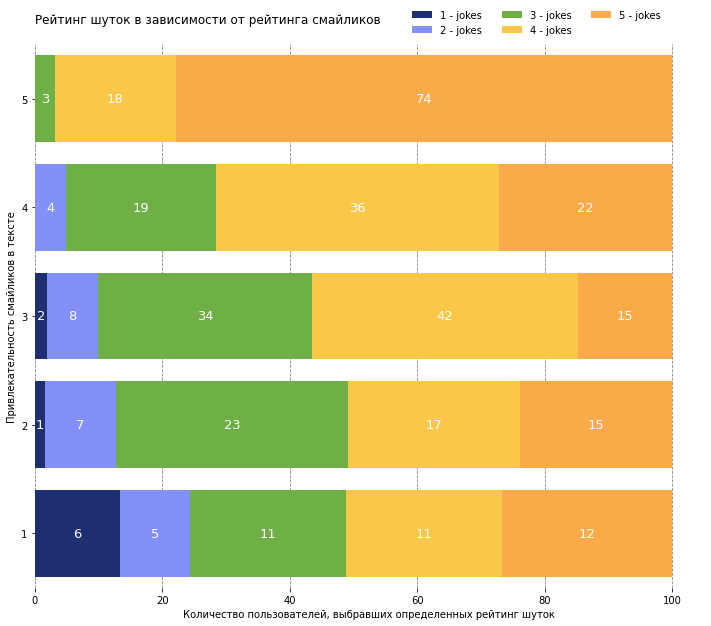

In [ ]:
fields = ['Q7_1','Q7_2','Q7_3','Q7_4', 'Q7_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - jokes', '2 - jokes', '3 - jokes', '4 - jokes', '5 - jokes']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_emoticon_by_jokes_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_emoticon_by_jokes_perc.index + 1, sum_emoticon_by_jokes_perc[name], left = left, color=colors[idx])
    left = left + sum_emoticon_by_jokes_perc[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_emoticon_by_jokes.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Рейтинг шуток в зависимости от рейтинга смайликов\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность смайликов в тексте')
plt.xlabel('Количество пользователей, выбравших определенных рейтинг шуток')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

То есть те, кто проголосовал 4 или 5 за смайлики, вообще не выбирали 1 за шутки. 

Больше всего рейтинг "Без разницы" и 4 для шуток поставили пользователи, которые аналогично проголосовали и за смайлики. 

**Однако те, кто поставил 5 за смайлики, больше всего поставил рейтинг 5 за шутки среди всех участников: 79 участников.**

то есть существует зависимость между смайликами и шутками. 

#### Орфография и т.д. в зависимости от смайликов 

In [ ]:
emoticon_gr = facts_regr_merge_sorted_q6.groupby(by=['RESPONDENT_ID', 'Q5', 'Q6'], as_index=False)['Q5'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
emoticon_gr['Q5'] = emoticon_gr['Q5'] // 20
emoticon_gr = pd.get_dummies(emoticon_gr.astype(str), columns = ['Q6'])

# количество пользователей (RESPONDENT_ID), которые ответили на эмодзи "Q5" и выбрали соответствующий из "Q6_i" ответ по поводу грамматики и т.д.
sum_emoticon_by_gr = emoticon_gr.groupby(by=['Q5', 'Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5'], as_index=False).count()
sum_emoticon_by_gr.head(5)

,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,RESPONDENT_ID
0,1,0,0,0,0,1,28
1,1,0,0,0,1,0,12
2,1,0,0,1,0,0,4
3,1,1,0,0,0,0,1
4,2,0,0,0,0,1,35


In [ ]:
sum_emoticon_by_gr.iloc[:, 1:6] = sum_emoticon_by_gr.iloc[:, 1:6].apply(lambda x: x * sum_emoticon_by_gr.iloc[:,6])
sum_emoticon_by_gr.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по смайликам соответствует количество респондентов, которые выбрали именно этот score для смайликов
# и дальше эти пользователи расписаны согласно их предпочтению по грамматике и т.д.
sum_emoticon_by_gr = sum_emoticon_by_gr.groupby(by='Q5', as_index=False).sum()
sum_emoticon_by_gr

,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5
0,1,1.0,0.0,4.0,12.0,28.0
1,2,1.0,4.0,7.0,16.0,35.0
2,3,1.0,4.0,6.0,36.0,54.0
3,4,1.0,1.0,3.0,32.0,44.0
4,5,1.0,2.0,6.0,30.0,56.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_emoticon_by_gr_perc = sum_emoticon_by_gr.copy()
sum_emoticon_by_gr_perc['total'] = sum_emoticon_by_gr_perc.iloc[:, 1:6].sum(axis=1)
print(sum_emoticon_by_gr_perc)
sum_emoticon_by_gr_perc.iloc[:, 1:6] = sum_emoticon_by_gr_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_emoticon_by_gr_perc.iloc[:, 6] * 100, 2) )
sum_emoticon_by_gr_perc

  Q5  Q6_1  Q6_2  Q6_3  Q6_4  Q6_5  total
0  1   1.0   0.0   4.0  12.0  28.0   45.0
1  2   1.0   4.0   7.0  16.0  35.0   63.0
2  3   1.0   4.0   6.0  36.0  54.0  101.0
3  4   1.0   1.0   3.0  32.0  44.0   81.0
4  5   1.0   2.0   6.0  30.0  56.0   95.0


,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,total
0,1,2.22,0.00,8.89,26.67,62.22,45.0
1,2,1.59,6.35,11.11,25.40,55.56,63.0
2,3,0.99,3.96,5.94,35.64,53.47,101.0
3,4,1.23,1.23,3.70,39.51,54.32,81.0
4,5,1.05,2.11,6.32,31.58,58.95,95.0


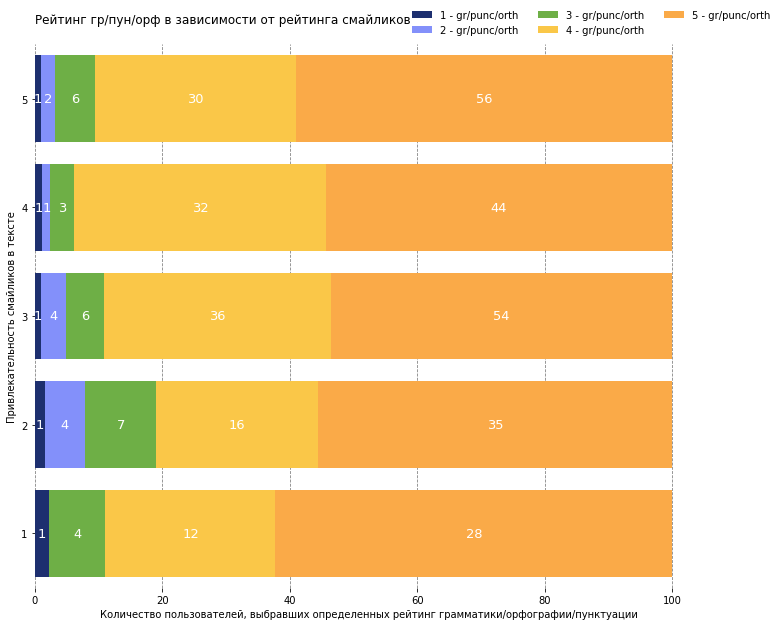

In [ ]:
fields = ['Q6_1','Q6_2','Q6_3','Q6_4', 'Q6_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - gr/punc/orth', '2 - gr/punc/orth', '3 - gr/punc/orth', '4 - gr/punc/orth', '5 - gr/punc/orth']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_emoticon_by_gr_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_emoticon_by_gr_perc.index + 1, sum_emoticon_by_gr_perc[name], left = left, color=colors[idx])
    left = left + sum_emoticon_by_gr_perc[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_emoticon_by_gr.iloc[:, i + 1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Рейтинг гр/пун/орф в зависимости от рейтинга смайликов\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность смайликов в тексте')
plt.xlabel('Количество пользователей, выбравших определенных рейтинг грамматики/орфографии/пунктуации')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Единственное, что тут прослеживается, - важность грамматики, пунктуации, орфографии у всех рейтингов смайликов. 

#### Большой текст без разбиений в зависимости от смайликов 

In [ ]:
emoticon_text = facts_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q5', 'Q8'], as_index=False)['Q5'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
emoticon_text['Q5'] = emoticon_text['Q5'] // 20
emoticon_text = pd.get_dummies(emoticon_text.astype(str), columns = ['Q8'])

# количество пользователей (RESPONDENT_ID), которые ответили на эмодзи "Q5" и выбрали соответствующий из "Q8_i" ответ по поводу текста без разбиений
sum_emoticon_by_text = emoticon_text.groupby(by=['Q5', 'Q8_1', 'Q8_2', 'Q8_3', 'Q8_4', 'Q8_5'], as_index=False).count()
sum_emoticon_by_text.head(5)

,Q5,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,RESPONDENT_ID
0,1,0,0,0,0,1,25
1,1,0,0,0,1,0,4
2,1,0,0,1,0,0,6
3,1,0,1,0,0,0,6
4,1,1,0,0,0,0,4


In [ ]:
sum_emoticon_by_text.iloc[:, 1:6] = sum_emoticon_by_text.iloc[:, 1:6].apply(lambda x: x * sum_emoticon_by_text.iloc[:,6])
sum_emoticon_by_text.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по смайликам соответствует количество респондентов, которые выбрали именно этот score для смайкликов
# и дальше эти пользователи расписаны согласно их предпочтению по тексту без разбиений
sum_emoticon_by_text = sum_emoticon_by_text.groupby(by='Q5', as_index=False).sum()
sum_emoticon_by_text

,Q5,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5
0,1,4.0,6.0,6.0,4.0,25.0
1,2,7.0,9.0,14.0,14.0,19.0
2,3,10.0,14.0,38.0,21.0,18.0
3,4,9.0,15.0,35.0,17.0,5.0
4,5,13.0,15.0,29.0,12.0,26.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_emoticon_by_text_perc = sum_emoticon_by_text.copy()
sum_emoticon_by_text_perc['total'] = sum_emoticon_by_text_perc.iloc[:, 1:6].sum(axis=1)
print(sum_emoticon_by_text_perc)
sum_emoticon_by_text_perc.iloc[:, 1:6] = sum_emoticon_by_text_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_emoticon_by_text_perc.iloc[:, 6] * 100, 2) )
sum_emoticon_by_text_perc

  Q5  Q8_1  Q8_2  Q8_3  Q8_4  Q8_5  total
0  1   4.0   6.0   6.0   4.0  25.0   45.0
1  2   7.0   9.0  14.0  14.0  19.0   63.0
2  3  10.0  14.0  38.0  21.0  18.0  101.0
3  4   9.0  15.0  35.0  17.0   5.0   81.0
4  5  13.0  15.0  29.0  12.0  26.0   95.0


,Q5,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,total
0,1,8.89,13.33,13.33,8.89,55.56,45.0
1,2,11.11,14.29,22.22,22.22,30.16,63.0
2,3,9.90,13.86,37.62,20.79,17.82,101.0
3,4,11.11,18.52,43.21,20.99,6.17,81.0
4,5,13.68,15.79,30.53,12.63,27.37,95.0


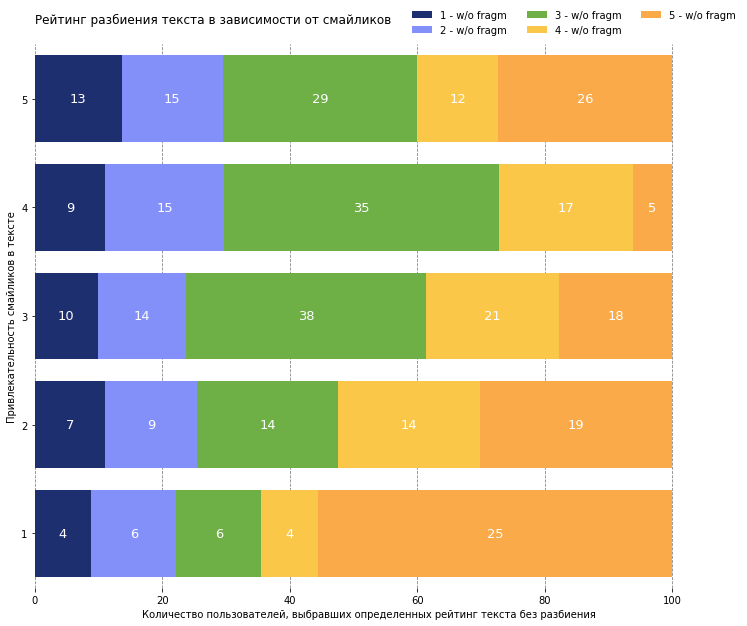

In [ ]:
fields = ['Q8_1','Q8_2','Q8_3','Q8_4', 'Q8_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - w/o fragm', '2 - w/o fragm', '3 - w/o fragm', '4 - w/o fragm', '5 - w/o fragm']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_emoticon_by_text_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_emoticon_by_text_perc.index + 1, sum_emoticon_by_text_perc[name], left = left, color=colors[idx])
    left = left + sum_emoticon_by_text_perc[name]

for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_emoticon_by_text.iloc[:, i + 1]], color='white', label_type='center', size=13)

# title, legend, labels
plt.title('Рейтинг разбиения текста в зависимости от смайликов\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность смайликов в тексте')
plt.xlabel('Количество пользователей, выбравших определенных рейтинг текста без разбиения')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

бОльшая часть пользователей, выбравших рейтинг 1 у смайликов, выбрала ярко положительный ответ касаемо разбиения текста. 

Может зависимость смайлики - текст. 

### Насколько вам важно, что в сообщениях соблюдены грамматика, орфография и пунктуация?

Я сливаю 2 и 3 и 5 и 6 в 2 и 4, чтобы сделать пятибалльную шкалу

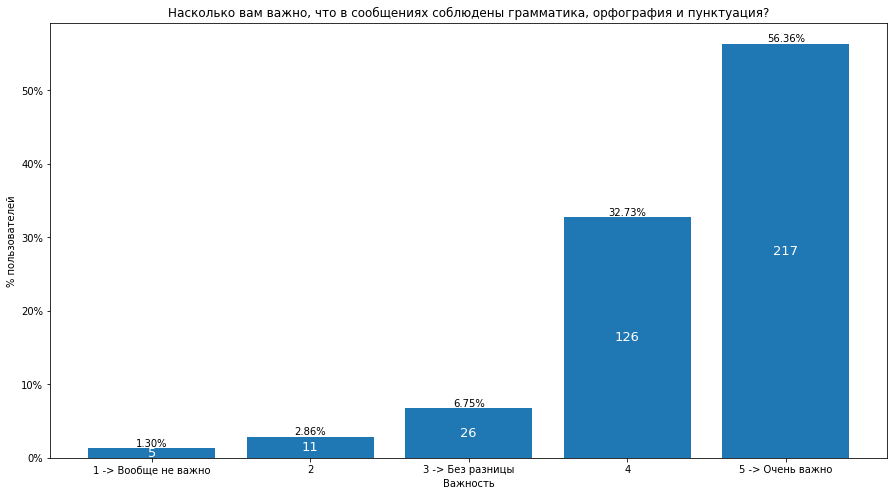

In [ ]:
gr_punc_orth = facts_regr_merge_sorted_q6.groupby(by='Q6', as_index=False)['RESPONDENT_ID'].count()
gr_punc_orth['RESPONDENT_ID'] = gr_punc_orth['RESPONDENT_ID'] // 20
gr_punc_orth_perc = gr_punc_orth.copy()
gr_punc_orth_list = gr_punc_orth['RESPONDENT_ID'].to_list()

# to show %
gr_punc_orth_perc['RESPONDENT_ID'] = round(gr_punc_orth_perc['RESPONDENT_ID'] / sum(gr_punc_orth_perc['RESPONDENT_ID']) * 100, 2)
gr_punc_orth_perc_list = gr_punc_orth_perc['RESPONDENT_ID'].to_list()

# заполняем пропуски: если в какой-то группе 0 пользователей, добавляем 0 в список
for i in range(5):
  if (i + 1) not in gr_punc_orth['Q6'].to_list():
    gr_punc_orth_list.insert(i, 0)
    gr_punc_orth_perc_list.insert(i, 0)


graph_gr_punc_orth(gr_punc_orth_perc_list, gr_punc_orth_list)

#### Грамматика, пунктуация, орфография в зависимости от шуток

In [ ]:
gr_jokes = facts_regr_merge_sorted_q6.groupby(by=['RESPONDENT_ID', 'Q6', 'Q7'], as_index=False)['Q6'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
gr_jokes['Q6'] = gr_jokes['Q6'] // 20
gr_jokes = pd.get_dummies(gr_jokes.astype(str), columns = ['Q7'])

# количество пользователей (RESPONDENT_ID), которые ответили на гр/пунк/шутки "Q6" и выбрали соответствующий из "Q7_i" ответ по поводу шуток
sum_gr_by_jokes = gr_jokes.groupby(by=['Q6', 'Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5'], as_index=False).count()
sum_gr_by_jokes.head(9)

,Q6,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,RESPONDENT_ID
0,1,0,0,0,0,1,2
1,1,0,0,0,1,0,1
2,1,0,0,1,0,0,1
3,1,0,1,0,0,0,1
4,2,0,0,0,0,1,1
5,2,0,0,0,1,0,5
6,2,0,0,1,0,0,3
7,2,0,1,0,0,0,2
8,3,0,0,0,0,1,5


In [ ]:
sum_gr_by_jokes.iloc[:, 1:6] = sum_gr_by_jokes.iloc[:, 1:6].apply(lambda x: x * sum_gr_by_jokes.iloc[:,6])
sum_gr_by_jokes.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по грамматике и т.д. соответствует количество респондентов, которые выбрали именно этот score по грамматике
# и дальше эти пользователи расписаны согласно их предпочтению по шуткам
sum_gr_by_jokes = sum_gr_by_jokes.groupby(by='Q6', as_index=False).sum()
sum_gr_by_jokes

,Q6,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5
0,1,0.0,1.0,1.0,1.0,2.0
1,2,0.0,2.0,3.0,5.0,1.0
2,3,0.0,3.0,10.0,8.0,5.0
3,4,0.0,2.0,32.0,48.0,44.0
4,5,9.0,16.0,44.0,62.0,86.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_gr_by_jokes_perc = sum_gr_by_jokes.copy()
sum_gr_by_jokes_perc['total'] = sum_gr_by_jokes_perc.iloc[:, 1:6].sum(axis=1)
print(sum_gr_by_jokes_perc)
sum_gr_by_jokes_perc.iloc[:, 1:6] = sum_gr_by_jokes_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_gr_by_jokes_perc.iloc[:, 6] * 100, 2) )
sum_gr_by_jokes_perc

  Q6  Q7_1  Q7_2  Q7_3  Q7_4  Q7_5  total
0  1   0.0   1.0   1.0   1.0   2.0    5.0
1  2   0.0   2.0   3.0   5.0   1.0   11.0
2  3   0.0   3.0  10.0   8.0   5.0   26.0
3  4   0.0   2.0  32.0  48.0  44.0  126.0
4  5   9.0  16.0  44.0  62.0  86.0  217.0


,Q6,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,total
0,1,0.00,20.00,20.00,20.00,40.00,5.0
1,2,0.00,18.18,27.27,45.45,9.09,11.0
2,3,0.00,11.54,38.46,30.77,19.23,26.0
3,4,0.00,1.59,25.40,38.10,34.92,126.0
4,5,4.15,7.37,20.28,28.57,39.63,217.0


In [ ]:
((sum_gr_by_jokes_perc['Q7_1'] + sum_gr_by_jokes_perc['Q7_2'])/2).mean()

6.2829999999999995

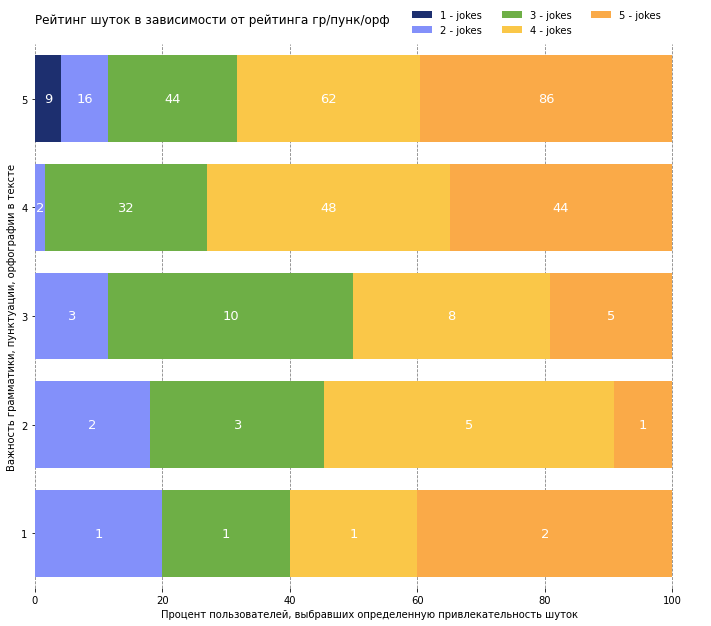

In [ ]:
fields = ['Q7_1','Q7_2','Q7_3','Q7_4', 'Q7_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - jokes', '2 - jokes', '3 - jokes', '4 - jokes', '5 - jokes']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_gr_by_jokes_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_gr_by_jokes_perc.index + 1, sum_gr_by_jokes_perc[name], left = left, color=colors[idx])
    #plt.text(x=sum_gr_by_jokes[name] + 1, y=(sum_gr_by_jokes_perc.index + 1), color="w", verticalalignment="center", horizontalalignment="left", size=18)
    left = left + sum_gr_by_jokes_perc[name]

for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_gr_by_jokes.iloc[:, i + 1]], color='white', label_type='center', size=13)
  
# title, legend, labels
plt.title('Рейтинг шуток в зависимости от рейтинга гр/пунк/орф\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Важность грамматики, пунктуации, орфографии в тексте')
plt.xlabel('Процент пользователей, выбравших определенную привлекательность шуток')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Пользователи, выбравшие важность грамматики, пунктуации и орфографии на 4, только в 1.5% случаях выбирают определенную неприязнь к шуткам, большинство же выбирают либо без разницы, либо положительный вариант. 

зависимость грамматика шутки

#### Грамматика, пунктуация, орфография в зависимости от текста без разбиений

In [ ]:
gr_text = facts_regr_merge_sorted_q6.groupby(by=['RESPONDENT_ID', 'Q6', 'Q8'], as_index=False)['Q6'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
gr_text['Q6'] = gr_text['Q6'] // 20
gr_text = pd.get_dummies(gr_text.astype(str), columns = ['Q8'])

# количество пользователей (RESPONDENT_ID), которые ответили на гр/пунк/шутки "Q6" и выбрали соответствующий из "Q7_i" ответ по поводу шуток
sum_gr_by_text = gr_text.groupby(by=['Q6', 'Q8_1', 'Q8_2', 'Q8_3', 'Q8_4', 'Q8_5'], as_index=False).count()
sum_gr_by_text.head(9)

,Q6,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,RESPONDENT_ID
0,1,0,0,0,0,1,1
1,1,0,0,0,1,0,1
2,1,0,0,1,0,0,1
3,1,0,1,0,0,0,1
4,1,1,0,0,0,0,1
5,2,0,0,0,1,0,6
6,2,0,0,1,0,0,3
7,2,0,1,0,0,0,2
8,3,0,0,0,0,1,2


In [ ]:
sum_gr_by_text.iloc[:, 1:6] = sum_gr_by_text.iloc[:, 1:6].apply(lambda x: x * sum_gr_by_text.iloc[:,6])
sum_gr_by_text.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по грамматике и т.д. соответствует количество респондентов, которые выбрали именно этот score по грамматике
# и дальше эти пользователи расписаны согласно их предпочтению по тексту без разбиений
sum_gr_by_text = sum_gr_by_text.groupby(by='Q6', as_index=False).sum()
sum_gr_by_text

,Q6,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5
0,1,1.0,1.0,1.0,1.0,1.0
1,2,0.0,2.0,3.0,6.0,0.0
2,3,3.0,5.0,13.0,3.0,2.0
3,4,10.0,23.0,42.0,28.0,23.0
4,5,29.0,28.0,63.0,30.0,67.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_gr_by_text_perc = sum_gr_by_text.copy()
sum_gr_by_text_perc['total'] = sum_gr_by_text_perc.iloc[:, 1:6].sum(axis=1)
print(sum_gr_by_text_perc)
sum_gr_by_text_perc.iloc[:, 1:6] = sum_gr_by_text_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_gr_by_text_perc.iloc[:, 6] * 100, 2) )
sum_gr_by_text_perc


  Q6  Q8_1  Q8_2  Q8_3  Q8_4  Q8_5  total
0  1   1.0   1.0   1.0   1.0   1.0    5.0
1  2   0.0   2.0   3.0   6.0   0.0   11.0
2  3   3.0   5.0  13.0   3.0   2.0   26.0
3  4  10.0  23.0  42.0  28.0  23.0  126.0
4  5  29.0  28.0  63.0  30.0  67.0  217.0


,Q6,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,total
0,1,20.00,20.00,20.00,20.00,20.00,5.0
1,2,0.00,18.18,27.27,54.55,0.00,11.0
2,3,11.54,19.23,50.00,11.54,7.69,26.0
3,4,7.94,18.25,33.33,22.22,18.25,126.0
4,5,13.36,12.90,29.03,13.82,30.88,217.0


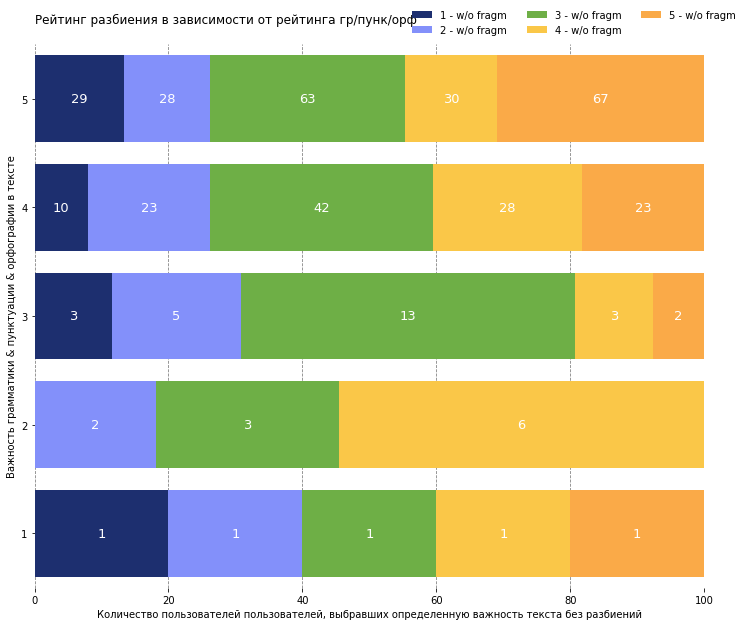

In [ ]:
fields = ['Q8_1','Q8_2','Q8_3','Q8_4', 'Q8_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - w/o fragm', '2 - w/o fragm', '3 - w/o fragm', '4 - w/o fragm', '5 - w/o fragm']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_gr_by_text_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_gr_by_text_perc.index + 1, sum_gr_by_text_perc[name], left = left, color=colors[idx])
    left = left + sum_gr_by_text_perc[name]

for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_gr_by_text.iloc[:, i + 1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Рейтинг разбиения в зависимости от рейтинга гр/пунк/орф\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Важность грамматики & пунктуации & орфографии в тексте')
plt.xlabel('Количество пользователей пользователей, выбравших определенную важность текста без разбиений')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Вдвое больше людей в категории 5 выбирают либо "Без разницы", либо "Очень нравится" шутка. И много людей за разбиение, кто за грамматику. 

Если без разницы по грамматике, орфографии и пунктуации, то в 50% случаях без разницы по тексту без разбиений. 

### Насколько вам нравится, что в сообщениях присутствуют шутки, остроумные ответы?

    Q7
0    9
1   24
2   90
3  124
4  138


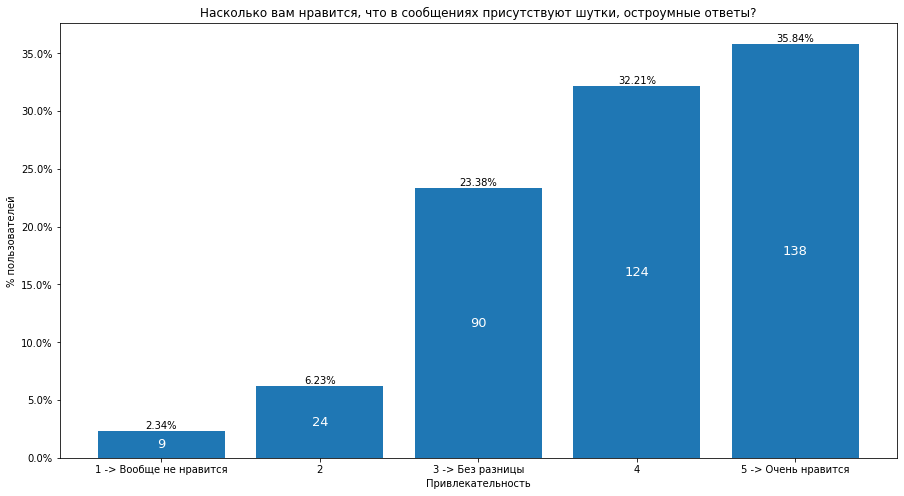

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к шуткам
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
jokes = facts_regr_merge_sorted.groupby(by='Q7', as_index=False)['Q7'].count() // 20
print(jokes)
# to show %
jokes_perc = jokes.copy()
jokes_perc['Q7'] = round(jokes_perc['Q7'] / sum(jokes_perc['Q7']) * 100, 2)

graph_jokes(jokes_perc['Q7'], jokes['Q7'])

#### Отношение к шуткам в зависимости от разбиения текста

In [ ]:
jokes_text = facts_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q7', 'Q8'], as_index=False)['Q7'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
jokes_text['Q7'] = jokes_text['Q7'] // 20
jokes_text = pd.get_dummies(jokes_text.astype(str), columns = ['Q8'])

# количество пользователей (RESPONDENT_ID), которые ответили на шутки "Q7" и выбрали соответствующий из "Q8_i" ответ по поводу текста без разбиений
sum_jokes_by_text = jokes_text.groupby(by=['Q7', 'Q8_1', 'Q8_2', 'Q8_3', 'Q8_4', 'Q8_5'], as_index=False).count()
sum_jokes_by_text.head(5)

,Q7,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,RESPONDENT_ID
0,1,0,0,0,0,1,5
1,1,0,0,1,0,0,1
2,1,0,1,0,0,0,1
3,1,1,0,0,0,0,2
4,2,0,0,0,0,1,5


In [ ]:
sum_jokes_by_text.iloc[:, 1:6] = sum_jokes_by_text.iloc[:, 1:6].apply(lambda x: x * sum_jokes_by_text.iloc[:,6])
sum_jokes_by_text.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по шуткам соответствует количество респондентов, которые выбрали именно этот score по шуткам
# и дальше эти пользователи расписаны согласно их предпочтению по тексту без разбиений
sum_jokes_by_text = sum_jokes_by_text.groupby(by='Q7', as_index=False).sum()
sum_jokes_by_text

,Q7,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5
0,1,2.0,1.0,1.0,0.0,5.0
1,2,2.0,7.0,7.0,3.0,5.0
2,3,12.0,11.0,30.0,18.0,19.0
3,4,11.0,18.0,45.0,28.0,22.0
4,5,16.0,22.0,39.0,19.0,42.0


In [ ]:
# проверка
sum_jokes_by_text.iloc[:, 1:6].sum(axis=0)

Q8_1     43.0
Q8_2     59.0
Q8_3    122.0
Q8_4     68.0
Q8_5     93.0
dtype: float64

In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_jokes_by_text_perc = sum_jokes_by_text.copy()
sum_jokes_by_text_perc['total'] = sum_jokes_by_text_perc.iloc[:, 1:6].sum(axis=1)
print(sum_jokes_by_text_perc)
sum_jokes_by_text_perc.iloc[:, 1:6] = sum_jokes_by_text_perc.iloc[:, 1:6].apply(
    lambda x: round(x / sum_jokes_by_text_perc.iloc[:, 6] * 100, 2) )
sum_jokes_by_text_perc


  Q7  Q8_1  Q8_2  Q8_3  Q8_4  Q8_5  total
0  1   2.0   1.0   1.0   0.0   5.0    9.0
1  2   2.0   7.0   7.0   3.0   5.0   24.0
2  3  12.0  11.0  30.0  18.0  19.0   90.0
3  4  11.0  18.0  45.0  28.0  22.0  124.0
4  5  16.0  22.0  39.0  19.0  42.0  138.0


,Q7,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,total
0,1,22.22,11.11,11.11,0.00,55.56,9.0
1,2,8.33,29.17,29.17,12.50,20.83,24.0
2,3,13.33,12.22,33.33,20.00,21.11,90.0
3,4,8.87,14.52,36.29,22.58,17.74,124.0
4,5,11.59,15.94,28.26,13.77,30.43,138.0


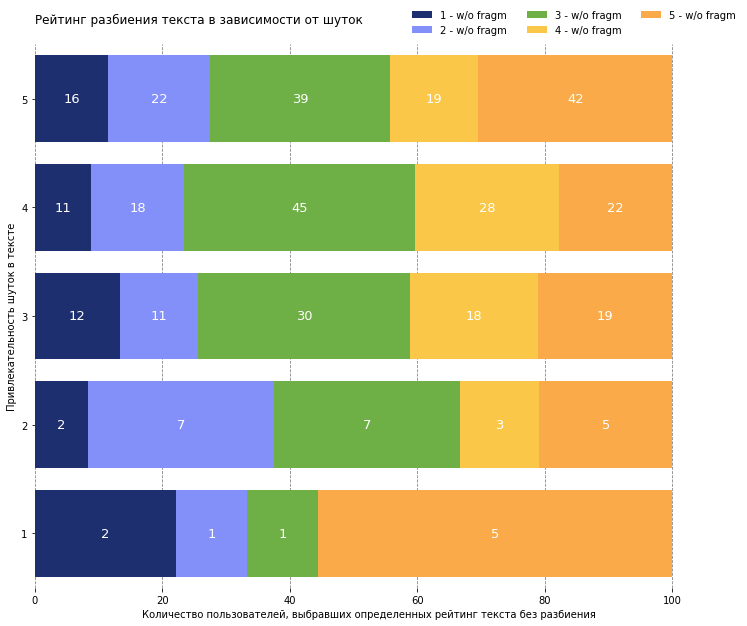

In [ ]:
fields = ['Q8_1','Q8_2','Q8_3','Q8_4', 'Q8_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - w/o fragm', '2 - w/o fragm', '3 - w/o fragm', '4 - w/o fragm', '5 - w/o fragm']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_jokes_by_text_perc) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_jokes_by_text_perc.index + 1, sum_jokes_by_text_perc[name], left = left, color=colors[idx])
    left = left + sum_jokes_by_text_perc[name]

for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_jokes_by_text.iloc[:, i + 1] ], color='white', label_type='center', size=13)

# title, legend, labels
plt.title('Рейтинг разбиения текста в зависимости от шуток\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность шуток в тексте')
plt.xlabel('Количество пользователей, выбравших определенных рейтинг текста без разбиения')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Кто к шуткам относится на 4, тому в 37% будет без разницы на разбиение текста или нет. 

### Предпочтение к одному сообщению без разбиения на части или с разбиением.

Я предпочитаю, чтобы вся информация была в одном сообщении без разбиения на части.

    Q8
0   43
1   59
2  122
3   68
4   93


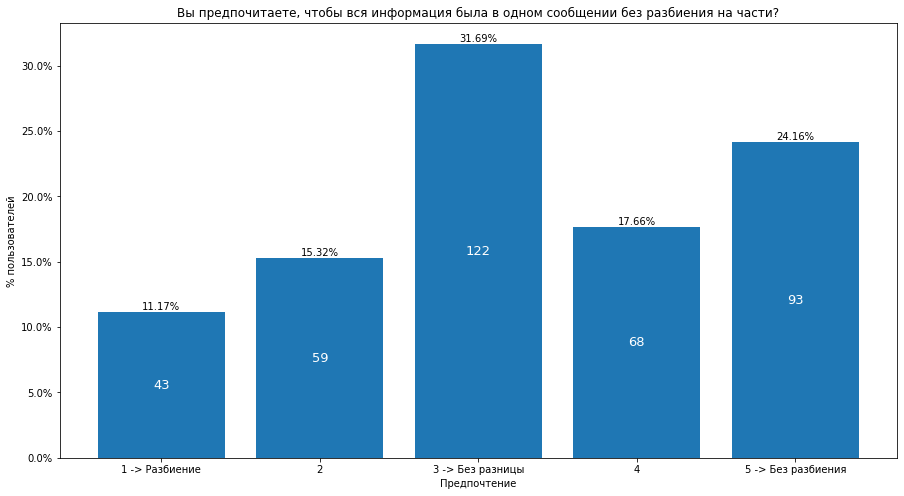

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к разбиению сообщения
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
large_text = facts_regr_merge_sorted.groupby(by='Q8', as_index=False)['Q8'].count() // 20
print(large_text)
# to show %
large_text_perc = large_text.copy()
large_text_perc['Q8'] = round(large_text_perc['Q8'] / sum(large_text_perc['Q8']) * 100, 2)



graph_large_text(large_text_perc['Q8'], large_text['Q8'])

### Все четыре ответа про атрибуты в одном графике


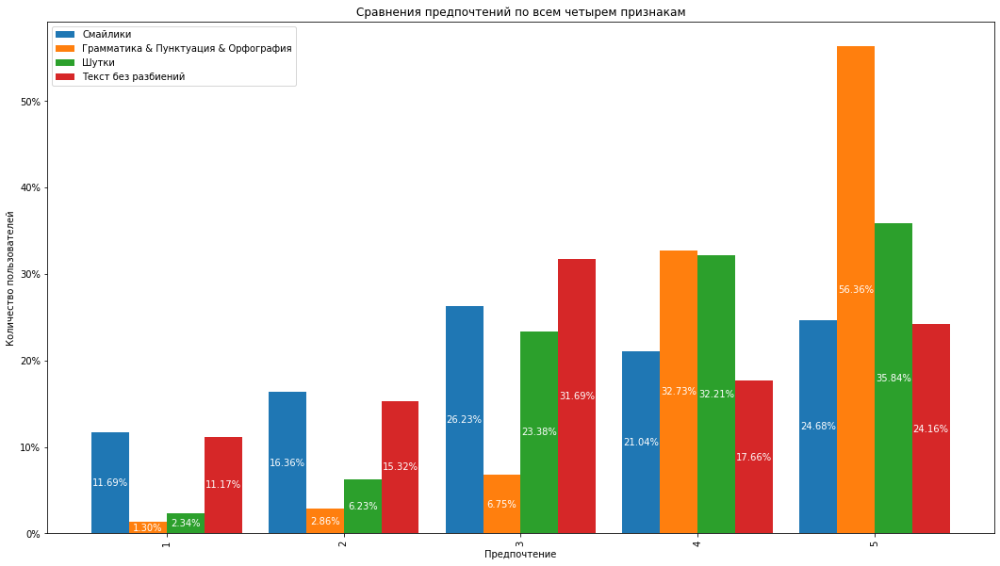

In [ ]:
# create data
df = pd.DataFrame([['1', emoticons_perc[0], gr_punc_orth_perc_list[0], jokes_perc['Q7'][0], large_text_perc['Q8'][0]],
                   ['2', emoticons_perc[1], gr_punc_orth_perc_list[1], jokes_perc['Q7'][1], large_text_perc['Q8'][1]],
                   ['3', emoticons_perc[2], gr_punc_orth_perc_list[2], jokes_perc['Q7'][2], large_text_perc['Q8'][2]],
                   ['4', emoticons_perc[3], gr_punc_orth_perc_list[3], jokes_perc['Q7'][3], large_text_perc['Q8'][3]],
                   ['5', emoticons_perc[4], gr_punc_orth_perc_list[4], jokes_perc['Q7'][4], large_text_perc['Q8'][4]]],
                  columns=['Предпочтение', 'Смайлики', 'Грамматика & Пунктуация & Орфография', 'Шутки', 'Текст без разбиений'])

  
# plot grouped bar chart
ax = df.plot(x='Предпочтение',
             ylabel='Количество пользователей',
        kind='bar',
        stacked=False,
        figsize = (18,10),
        width=0.85,
        title='Сравнения предпочтений по всем четырем признакам')

ax.bar_label(ax.containers[0], labels=['%.2f%%' % e for e in df['Смайлики']], color='white', label_type='center')
ax.bar_label(ax.containers[1], labels=['%.2f%%' % e for e in df['Грамматика & Пунктуация & Орфография']], color='white', label_type='center')
ax.bar_label(ax.containers[2], labels=['%.2f%%' % e for e in df['Шутки']], color='white', label_type='center')
ax.bar_label(ax.containers[3], labels=['%.2f%%' % e for e in df['Текст без разбиений']], color='white', label_type='center')

ax.yaxis.set_major_formatter(mtick.PercentFormatter())

**Эмодзи**: какой-то явной тенденции по выбору замечено не было. Однако более популярны ответы "Без разницы", 4 и 5 - очень нравится с вероятностью выбора 26.11%, 21.43% и 25.37% соответственно. 

**Грамматика & Пунктуация & Орфография**: большинство пользователей выбирают либо 4, либо 5 - очень важно с 32.27% и 55.91% соответственно. Остальные варианты ответа составляют лишь 11.82% от всех выборки. 

**Шутки**: лишь 8.86% пользователей негативно относятся к шуткам. Остальные либо выбирают "Без разницы" с вероятностью 22.91%, либо выбирают 4/5 - 32.02% и 36.21% соответственно. 

**Текст без разбиений**: единственное, что сильно выделяется, что 32.76% пользователям без разницы будет ли текст весь написан в одном блоке сообщения, либо в нескольких. 

## Проверка гипотез

### Зависимость категориальных переменных, используя критерий $\chi^2$

$H_0$ - категориальные переменные независимы <br>
$H_1$ - категориальные переменные зависимы. <br>
На вход должна подаваться таблица сопряженности двух рассматриваемых величин.

#### Соц.сети VS остальное

In [ ]:
facts_regr_merge_sorted_q6.columns

Index(['RESPONDENT_ID', 'SURVEY_ID', 'CHOICE_INDICATOR', 'RESPONDENT_CITY',
       'RESPONDENT_COUNTRY', 'RESPONDENT_DEVICE_USED_IN_SURVEY',
       'RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS',
       'RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY', 'Q3_O1', 'Q3_O2', 'Q3_O3_3',
       'Q3_O4_3_5', 'Q3_O5_5', 'Q5', 'Q6', 'Q7', 'Q8', 'emoticons',
       'gr_pun_orth', 'jokes', 'large_text'],
      dtype='object')

In [ ]:
facts_regr_merge_sorted_q6_q3 = facts_regr_merge_sorted_q6.copy()
facts_regr_merge_sorted_q6_q3['Q3'] = facts_regr_merge_sorted_q6_q3['Q3_O1'] + facts_regr_merge_sorted_q6_q3['Q3_O2'] * 2 + facts_regr_merge_sorted_q6_q3['Q3_O3_3'] * 3  +facts_regr_merge_sorted_q6_q3['Q3_O4_3_5'] * 4 + facts_regr_merge_sorted_q6_q3['Q3_O5_5'] * 5
facts_regr_merge_sorted_q6_q3.head()

,RESPONDENT_ID,SURVEY_ID,CHOICE_INDICATOR,RESPONDENT_CITY,RESPONDENT_COUNTRY,RESPONDENT_DEVICE_USED_IN_SURVEY,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY,Q3_O1,Q3_O2,...,Q3_O5_5,Q5,Q6,Q7,Q8,emoticons,gr_pun_orth,jokes,large_text,Q3
0,120470635,5,0,Cherepovets,Russia,desktop,116,0,0,0,...,1,5,5,5,5,1,0,0,1,5
1,120470635,5,1,Cherepovets,Russia,desktop,116,0,0,0,...,1,5,5,5,5,1,1,0,0,5
2,120470635,5,1,Cherepovets,Russia,desktop,116,0,0,0,...,1,5,5,5,5,0,0,1,1,5
3,120470635,5,0,Cherepovets,Russia,desktop,116,0,0,0,...,1,5,5,5,5,1,0,1,1,5
4,120470635,5,0,Cherepovets,Russia,desktop,116,0,0,0,...,1,5,5,5,5,1,1,0,1,5


In [ ]:
xi2(facts_regr_merge_sorted_q6_q3['Q3'], facts_regr_merge_sorted_q6_q3['Q5'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  7.335735131535646e-32


(190.25367234196946, 7.335735131535646e-32, Q5    1     2     3     4     5
 Q3                             
 1    20    60    20    40    20
 2     0     0    20    20     0
 3    20    60   120    60    80
 4    40   100    80    40   100
 5   820  1040  1780  1460  1700)

То есть в зависимости от опыта использования социальными сетями разное количество пользователей выбирают определенный рейтинг за смайлики. [Ссылка хи2](https://www.jmp.com/en_au/statistics-knowledge-portal/chi-square-test/chi-square-test-of-independence.html)

In [ ]:
xi2(facts_regr_merge_sorted_q6_q3['Q3'], facts_regr_merge_sorted_q6_q3['Q6'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  3.564012110652749e-49


(275.10075982419437, 3.564012110652749e-49, Q6   1    2    3     4     5
 Q3                          
 1    0    0   40    20   100
 2    0    0    0    20    20
 3    0   20   40   160   120
 4   20    0   40   120   180
 5   80  200  400  2200  3920)

In [ ]:
xi2(facts_regr_merge_sorted_q6_q3['Q3'], facts_regr_merge_sorted_q6_q3['Q7'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  6.158410119225443e-83


(437.023738644593, 6.158410119225443e-83, Q7    1    2     3     4     5
 Q3                            
 1    20   40     0    60    40
 2     0    0    40     0     0
 3     0    0    80   100   160
 4     0   40   120   120    80
 5   160  400  1560  2200  2480)

In [ ]:
xi2(facts_regr_merge_sorted_q6_q3['Q3'], facts_regr_merge_sorted_q6_q3['Q8'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  1.184900411645313e-47


(267.71477523930474, 1.184900411645313e-47, Q8    1    2     3     4     5
 Q3                            
 1     0   40    60    20    40
 2     0   20     0     0    20
 3    60  100    40    80    60
 4    40   60    60    80   120
 5   760  960  2280  1180  1620)

#### Эмодзи VS Шутки

In [ ]:
table = facts_regr_merge_sorted_q6[['Q5', 'Q6']].values

#построение таблицы сопряженности
df_new=pd.crosstab(facts_regr_merge_sorted_q6['Q5'],facts_regr_merge_sorted_q6['Q6'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new=df_new.fillna(0)
df_new

Q6,1,2,3,4,5
Q5,,,,,
1,20,0,80,240,560
2,20,80,140,320,700
3,20,80,120,720,1080
4,20,20,60,640,880
5,20,40,120,600,1120


In [ ]:
# probability of false positive error (ошибка первого рода)
alpha = .05

In [ ]:
stat1, p1, dof, expected = chi2_contingency(df_new)
if p1 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p1)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p1)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  8.226654197736788e-45


In [ ]:
stat1

253.89276822469765

In [ ]:
p1

8.226654197736788e-45

In [ ]:
expected

array([[  11.68831169,   25.71428571,   60.77922078,  294.54545455,
         507.27272727],
       [  16.36363636,   36.        ,   85.09090909,  412.36363636,
         710.18181818],
       [  26.23376623,   57.71428571,  136.41558442,  661.09090909,
        1138.54545455],
       [  21.03896104,   46.28571429,  109.4025974 ,  530.18181818,
         913.09090909],
       [  24.67532468,   54.28571429,  128.31168831,  621.81818182,
        1070.90909091]])

In [ ]:
# conjoint
xi2(facts_regr_merge_sorted_q6['emoticons'], facts_regr_merge_sorted_q6['jokes'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  8.341036464393886e-26


(110.31935217684193, 8.341036464393886e-26, jokes         0     1
 emoticons            
 0          2313  1545
 1          1844  1998)

**Вывод:** переменные Смайлики и Шутки являются зависимыми и в пост-вопросах, и в конджоинте. Иными словами, в зависимости от выбранного рейтинга шуток, пользователи выбирают разные рейтинги у смайликов. 

#### Эмодзи VS Орфография & Грамматика & Пунктуация

In [ ]:
table1 = facts_regr_merge_sorted_q6[['Q5', 'Q7']].values

#построение таблицы сопряженности
df_new1=pd.crosstab(facts_regr_merge_sorted_q6['Q5'],facts_regr_merge_sorted_q6['Q7'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new1=df_new1.fillna(0)
df_new1

Q7,1,2,3,4,5
Q5,,,,,
1,120,100,220,220,240
2,20,140,460,340,300
3,40,160,680,840,300
4,0,80,380,720,440
5,0,0,60,360,1480


In [ ]:
alpha = .05
stat2, p2, dof, expected = chi2_contingency(df_new1)
if p2 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p2)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p2)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  0.0


In [ ]:
stat2

2836.938023366442

In [ ]:
p2

0.0

In [ ]:
# conjoint
xi2(facts_regr_merge_sorted_q6['emoticons'], facts_regr_merge_sorted_q6['gr_pun_orth'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  3.123711431577942e-25


(107.70210190146881, 3.123711431577942e-25, gr_pun_orth     0     1
 emoticons              
 0            2387  1471
 1            1925  1917)

#### Эмодзи VS Текст без разбиений

In [ ]:
table2 = facts_regr_merge_sorted_q6[['Q5', 'Q8']].values

#построение таблицы сопряженности
df_new2=pd.crosstab(facts_regr_merge_sorted_q6['Q5'],facts_regr_merge_sorted_q6['Q8'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new2=df_new2.fillna(0)
df_new2

Q8,1,2,3,4,5
Q5,,,,,
1,80,120,120,80,500
2,140,180,280,280,380
3,200,280,760,420,360
4,180,300,700,340,100
5,260,300,580,240,520


In [ ]:
alpha = .05
stat3, p3, dof, expected = chi2_contingency(df_new2)
if p3 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p3)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p3)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  1.0947309775817446e-203


In [ ]:
stat3

1004.716606079206

In [ ]:
p3

1.0947309775817446e-203

In [ ]:
# conjoint
xi2(facts_regr_merge_sorted_q6['emoticons'], facts_regr_merge_sorted_q6['large_text'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  4.131663455874316e-26


(111.71203829293262, 4.131663455874316e-26, large_text     0     1
 emoticons             
 0           2468  1390
 1           2000  1842)

#### Шутки VS Орфография & Грамматика & Пунктуация

In [ ]:
table4 = facts_regr_merge_sorted_q6[['Q6', 'Q7']].values

#построение таблицы сопряженности
df_new4=pd.crosstab(facts_regr_merge_sorted_q6['Q6'],facts_regr_merge_sorted_q6['Q7'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new4=df_new4.fillna(0)
df_new4

Q7,1,2,3,4,5
Q6,,,,,
1,0,20,20,20,40
2,0,40,60,100,20
3,0,60,200,160,100
4,0,40,640,960,880
5,180,320,880,1240,1720


In [ ]:
alpha = .05
stat4, p4, dof, expected = chi2_contingency(df_new4)
if p4 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p4)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p4)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  6.457676127399161e-113


In [ ]:
stat4

579.0064788509154

In [ ]:
p4

6.457676127399161e-113

In [ ]:
# conjoint
xi2(facts_regr_merge_sorted_q6['gr_pun_orth'], facts_regr_merge_sorted_q6['jokes'])

Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.4494396238857936


(0.5720647006898562, 0.4494396238857936, jokes           0     1
 gr_pun_orth            
 0            2311  2001
 1            1846  1542)

По пост-вопросам зависимы, а по конджоинту нет. 

#### Шутки VS Текст без разбиений

In [ ]:
table6 = facts_regr_merge_sorted_q6[['Q7', 'Q8']].values

#построение таблицы сопряженности
df_new6=pd.crosstab(facts_regr_merge_sorted_q6['Q7'],facts_regr_merge_sorted_q6['Q8'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new6=df_new6.fillna(0)
df_new6

Q8,1,2,3,4,5
Q7,,,,,
1,40,20,20,0,100
2,40,140,140,60,100
3,240,220,600,360,380
4,220,360,900,560,440
5,320,440,780,380,840


In [ ]:
alpha = .05
stat5, p5, dof, expected = chi2_contingency(df_new6)
if p5 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p5)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p5)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  2.685906551095793e-84


In [ ]:
stat5

443.4932854505502

In [ ]:
# conjoint
xi2(facts_regr_merge_sorted_q6['jokes'], facts_regr_merge_sorted_q6['large_text'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  6.076466907839165e-06


(20.463961638574883, 6.076466907839165e-06, large_text     0     1
 jokes                 
 0           2314  1843
 1           2154  1389)

#### Текст без разбиений VS Орфография & Грамматика & Пунктуация

In [ ]:
table5 = facts_regr_merge_sorted_q6[['Q6', 'Q8']].values

#построение таблицы сопряженности
df_new5=pd.crosstab(facts_regr_merge_sorted_q6['Q6'],facts_regr_merge_sorted_q6['Q8'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new5=df_new5.fillna(0)
df_new5

Q8,1,2,3,4,5
Q6,,,,,
1,20,20,20,20,20
2,0,40,60,120,0
3,60,100,260,60,40
4,200,460,840,560,460
5,580,560,1260,600,1340


In [ ]:
alpha = .05
stat5, p5, dof, expected = chi2_contingency(df_new5)
if p5 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p5)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p5)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  2.278482989619197e-130


In [ ]:
stat5

661.2308302348318

In [ ]:
xi2(facts_regr_merge_sorted_q6['large_text'], facts_regr_merge_sorted_q6['gr_pun_orth'])

Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.05905933579859353


(3.563605253696239, 0.05905933579859353, gr_pun_orth     0     1
 large_text             
 0            2461  2007
 1            1851  1381)

# Здравоохранение

## Данные

In [ ]:
health_full = pd.read_csv("results_health.csv")
health_full.head()

,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,A1,RESPONDENT_IP_ADDRESS,RESPONDENT_CITY,RESPONDENT_REGION,RESPONDENT_POSTCODE,...,RESPONDENT_UNIQUE_CODE,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
0,120457015,4,1,1,0,22- - + +,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3
1,120457015,4,1,2,1,22- + + -,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3
2,120457015,4,2,1,0,22- + - -,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3
3,120457015,4,2,2,1,22+ + + -,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3
4,120457015,4,3,1,0,22- + - -,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3


## Модификация данных

In [ ]:
health_regr = health_full.copy()
health_regr_sorted_bo = health_regr.sort_values(by=['RESPONDENT_ID', 'SURVEY_ID', 'CHOICE_SET', 'LABEL'], ascending=True)

In [ ]:
health_regr_sorted_bo

,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,A1,RESPONDENT_IP_ADDRESS,RESPONDENT_CITY,RESPONDENT_REGION,RESPONDENT_POSTCODE,...,RESPONDENT_UNIQUE_CODE,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
0,120457015,4,1,1,0,22- - + +,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3
1,120457015,4,1,2,1,22- + + -,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3
2,120457015,4,2,1,0,22- + - -,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3
3,120457015,4,2,2,1,22+ + + -,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3
4,120457015,4,3,1,0,22- + - -,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,NaN,0,0,0,0,1,3,5,5,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8315,120887305,4,8,2,1,22- + - +,217.10.42.77,Ghonchí,Viloyati Sughd,NaN,...,NaN,0,0,0,1,0,1,5,2,2
8316,120887305,4,9,1,0,22- - + -,217.10.42.77,Ghonchí,Viloyati Sughd,NaN,...,NaN,0,0,0,1,0,1,5,2,2
8317,120887305,4,9,2,1,22+ - + +,217.10.42.77,Ghonchí,Viloyati Sughd,NaN,...,NaN,0,0,0,1,0,1,5,2,2
8318,120887305,4,10,1,1,22- + - -,217.10.42.77,Ghonchí,Viloyati Sughd,NaN,...,NaN,0,0,0,1,0,1,5,2,2


In [ ]:
print('Количество пользователей:', health_regr.shape[0] // 20)

Количество пользователей: 416


In [ ]:
health_regr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8320 entries, 0 to 8319
Data columns (total 26 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   RESPONDENT_ID                           8320 non-null   int64  
 1   SURVEY_ID                               8320 non-null   int64  
 2   CHOICE_SET                              8320 non-null   int64  
 3   LABEL                                   8320 non-null   int64  
 4   CHOICE_INDICATOR                        8320 non-null   int64  
 5   A1                                      8320 non-null   object 
 6   RESPONDENT_IP_ADDRESS                   8320 non-null   object 
 7   RESPONDENT_CITY                         8320 non-null   object 
 8   RESPONDENT_REGION                       8320 non-null   object 
 9   RESPONDENT_POSTCODE                     7940 non-null   object 
 10  RESPONDENT_COUNTRY                      8320 non-null   obje

In [ ]:
health_regr.describe()

,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY,RESPONDENT_UNIQUE_CODE,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
count,8.320000e+03,8320.000000,8320.000000,8320.00000,8320.000000,8320.000000,8320.000000,0.0,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000
mean,1.205325e+08,2.807692,5.500000,1.50000,0.376202,234.930288,0.324519,NaN,0.028846,0.016827,0.024038,0.043269,0.887019,3.120192,4.382212,3.009615,3.588942
std,8.587374e+04,1.463270,2.872454,0.50003,0.484461,152.034715,0.468223,NaN,0.167384,0.128630,0.153178,0.203475,0.316588,1.414290,1.051880,1.390263,1.254595
min,1.204570e+08,1.000000,1.000000,1.00000,0.000000,49.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,1.204618e+08,1.000000,3.000000,1.00000,0.000000,140.500000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,4.000000,2.000000,3.000000
50%,1.205628e+08,3.000000,5.500000,1.50000,0.000000,203.500000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,5.000000,3.000000,4.000000
75%,1.205677e+08,4.000000,8.000000,2.00000,1.000000,287.250000,1.000000,NaN,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000,5.000000,4.000000,5.000000
max,1.208873e+08,5.000000,10.000000,2.00000,1.000000,1730.000000,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,5.000000,5.000000,5.000000


### Выбросы (те, кто отвечал всегда, что ему без разницы, какая форма представления ответа)

In [ ]:
# таблица, где каждому пользователю соответствует сумма выбранных профилей (то есть был сделан выбран, а не "Без разницы")
count_chosen_h0 = health_regr_sorted_bo.groupby('RESPONDENT_ID')['CHOICE_INDICATOR'].sum().to_frame(name='count').reset_index()

# количество пользователей, которые выбрали везде "Нет разницы"
# в данных - это CHOICE_INDICATOR = 0 у конкретного пользователя с одинаковыми SURVEY_ID, CHOICE_SET, LABEL
respondents_outliers_h = count_chosen_h0[count_chosen_h0['count'] == 0]

In [ ]:
# полная информация о пользователях - выбросах
outliers_info_h = health_regr_sorted_bo[health_regr_sorted_bo['RESPONDENT_ID'].isin(respondents_outliers_h['RESPONDENT_ID'])]
print('размер (строки, столбцы):', outliers_info_h.shape)
print('количество пользователей: ', outliers_info_h.shape[0] // 20)
outliers_info_h.head(4)

размер (строки, столбцы): (660, 26)
количество пользователей:  33


,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,A1,RESPONDENT_IP_ADDRESS,RESPONDENT_CITY,RESPONDENT_REGION,RESPONDENT_POSTCODE,...,RESPONDENT_UNIQUE_CODE,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
20,120457017,4,1,1,0,22- - + +,92.47.172.189,Aktobe,Aktyubinskaya Oblast',30000,...,NaN,1,0,0,0,0,3,4,4,4
21,120457017,4,1,2,0,22- + + -,92.47.172.189,Aktobe,Aktyubinskaya Oblast',30000,...,NaN,1,0,0,0,0,3,4,4,4
22,120457017,4,2,1,0,22- + - -,92.47.172.189,Aktobe,Aktyubinskaya Oblast',30000,...,NaN,1,0,0,0,0,3,4,4,4
23,120457017,4,2,2,0,22+ + + -,92.47.172.189,Aktobe,Aktyubinskaya Oblast',30000,...,NaN,1,0,0,0,0,3,4,4,4


In [ ]:
# удаляем эти выбросы
health_regr_sorted = health_regr_sorted_bo.drop(outliers_info_h.index, inplace=False, axis=0)

# проверяем, что таких респондентов больше нет
count_chosen_check_h = health_regr_sorted.groupby('RESPONDENT_ID')['CHOICE_INDICATOR'].sum().to_frame(name='count').reset_index()
print('Респонденты, отвечающие всегда без разницы после удаления выбросов: ', count_chosen_check_h[count_chosen_check_h['count'] == 0])

Респонденты, отвечающие всегда без разницы после удаления выбросов:  Empty DataFrame
Columns: [RESPONDENT_ID, count]
Index: []


In [ ]:
number_respondents_h = health_regr_sorted.shape[0] // 20
print('В выборке осталось {} респондента из первоначальных {}.'.format(number_respondents_h, health_regr_sorted_bo.shape[0] // 20))

В выборке осталось 383 респондента из первоначальных 416.


#### Анализ выбросов с точки зрения характеристики респондентов

##### Тип используемого гаджета

Без процентов:  RESPONDENT_DEVICE_USED_IN_SURVEY
desktop    17
mobile     16
Name: number_device_type, dtype: int64


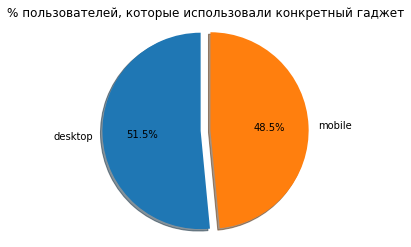

<Figure size 432x288 with 0 Axes>

In [ ]:
#группируем пользователей в зависимости от типа используемого гаджета
groups_device_out_h = outliers_info_h.groupby(by=['RESPONDENT_DEVICE_USED_IN_SURVEY']).size().to_frame(name = 'number_device_type')
# делим на 20, так как у каждого респондента в базе данных по 20 строк, где 20 строк - один блок
groups_device_out_h['number_device_type'] = groups_device_out_h['number_device_type'] // 20
print('Без процентов: ', groups_device_out_h['number_device_type'] )

graph_device_used(groups_device_out_h)

Однако тут половина пользователей использовали компьютерную версию, а вторая - мобильную. 

##### Среднее время прохождения опроса

In [ ]:
time_respondent_h = outliers_info_h.groupby('RESPONDENT_ID')['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'].min()
min_time_h = np.min(time_respondent_h)
max_time_h = np.max(time_respondent_h)
av_time_h = np.mean(time_respondent_h)
print('Минимальное время прохождения опроса: {min: .0f} минута и {sec: .2f} секунды'.format(min = min_time_h // 60, sec = min_time_h % 60))
print('Максимальное время прохождения опроса: {min: .0f} минут и {sec: .2f} секунд'.format(min = max_time_h // 60, sec = max_time_h % 60))
print('Среднее время прохождения опроса: {min: .0f} минуты и {sec: .2f} секунды'.format(min = av_time_h // 60, sec = av_time_h % 60))

Минимальное время прохождения опроса:  0 минута и  49.00 секунды
Максимальное время прохождения опроса:  12 минут и  11.00 секунд
Среднее время прохождения опроса:  2 минуты и  14.45 секунды


Среднее время прохождения опроса меньше на 1 минуту по сравнению с предыдущей выборкой, то же самое наблюдается и с минимальным временем. 

##### Опыт использования социальных сетей

[5, 1, 2, 1, 24]
[15.15151515  3.03030303  6.06060606  3.03030303 72.72727273]


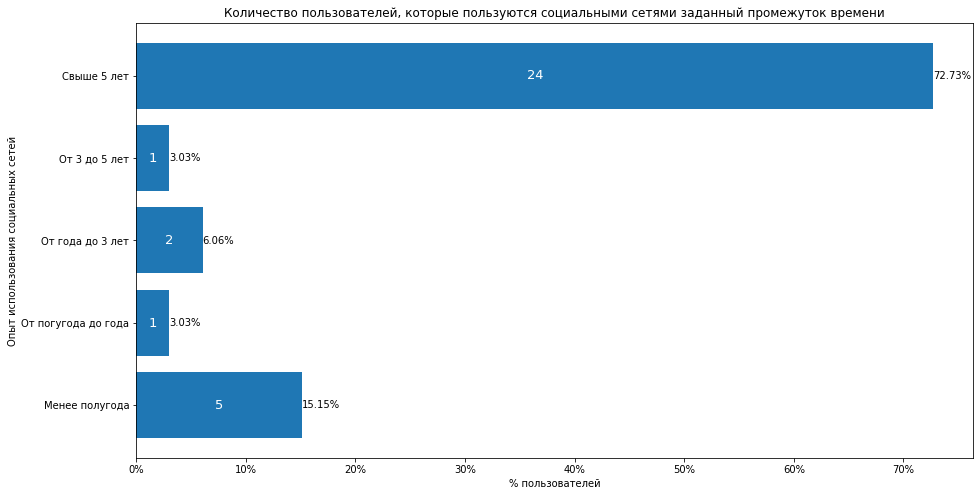

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по опыту пользования соц. сетями
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
soc_netw_out_h = [0] * 5
soc_netw_out_h[0] = (outliers_info_h.groupby(by='Q3_O1', as_index=False)['Q3_O1'].sum() // 20)['Q3_O1'][1]
soc_netw_out_h[1] = (outliers_info_h.groupby(by='Q3_O2', as_index=False)['Q3_O2'].sum() // 20)['Q3_O2'][1] if len((outliers_info_h.groupby(by='Q3_O2', as_index=False)['Q3_O2'].sum() // 20)['Q3_O2']) > 1 else 0
soc_netw_out_h[2] = (outliers_info_h.groupby(by='Q3_O3_3', as_index=False)['Q3_O3_3'].sum() // 20)['Q3_O3_3'][1]
soc_netw_out_h[3] = (outliers_info_h.groupby(by='Q3_O4_3_5', as_index=False)['Q3_O4_3_5'].sum() // 20)['Q3_O4_3_5'][1]
soc_netw_out_h[4] = (outliers_info_h.groupby(by='Q3_O5_5', as_index=False)['Q3_O5_5'].sum() // 20)['Q3_O5_5'][1]
soc_netw_out_perc_h = soc_netw_out_h / sum(soc_netw_out_h) * 100
print(soc_netw_out_h)
print(soc_netw_out_perc_h)


graph_snet_use(soc_netw_out_perc_h, soc_netw_out_h)

Таким образом, большинство - 72.73% (24 пользователей из 33), аналогичный процент был получен и в интересных фактах. 

##### Привлекательность смайликов

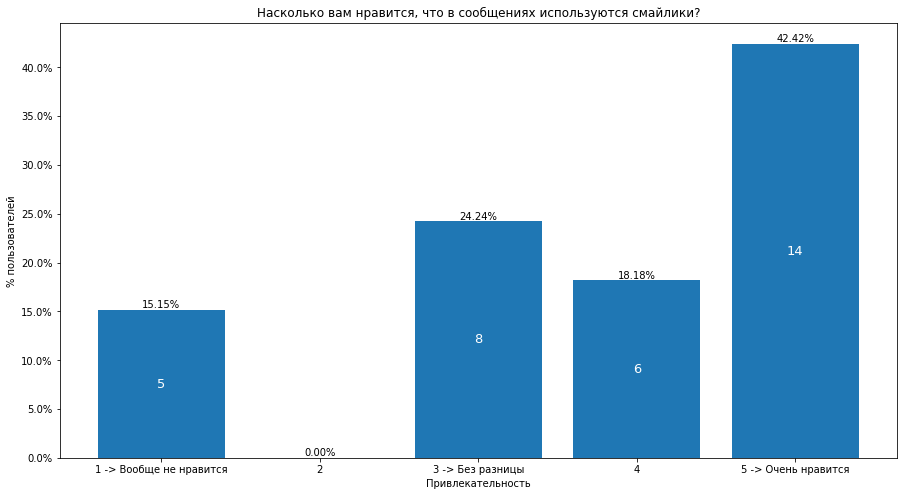

In [ ]:
emoticons_out_h = outliers_info_h.groupby(by='Q5', as_index=False)['RESPONDENT_ID'].count()
emoticons_out_h['RESPONDENT_ID'] = emoticons_out_h['RESPONDENT_ID'] // 20
emoticons_out_h_perc = emoticons_out_h.copy()
emoticons_out_h_list = emoticons_out_h['RESPONDENT_ID'].to_list()

# to show %
emoticons_out_h_perc['RESPONDENT_ID'] = round(emoticons_out_h_perc['RESPONDENT_ID'] / sum(emoticons_out_h_perc['RESPONDENT_ID']) * 100, 2)
emoticons_out_h_perc_list = emoticons_out_h_perc['RESPONDENT_ID'].to_list()

# заполняем пропуски: если в какой-то группе 0 пользователей, добавляем 0 в список
for i in range(5):
  if (i + 1) not in emoticons_out_h['Q5'].to_list():
    emoticons_out_h_list.insert(i, 0)
    emoticons_out_h_perc_list.insert(i, 0)



graph_emoticons(emoticons_out_h_perc_list, emoticons_out_h_list)

Самым популярным вариантом является оценка 5, составляющая 42.42% от общего количества пользователей-выбросов. Однако в сравнении с интересными фактами вторым по популярности ответом является оценка 3, 24.24%. 

Также стоит отметить, что 15.15% вообще не нравятся смайлики, когда как в интересных фактах эта точка зрения составляла только 9.52%, в которое входят 4.76% оценки 2, которая не является такой радикальной, как 1. 

##### Важность грамматики, пунктуации и орфографии

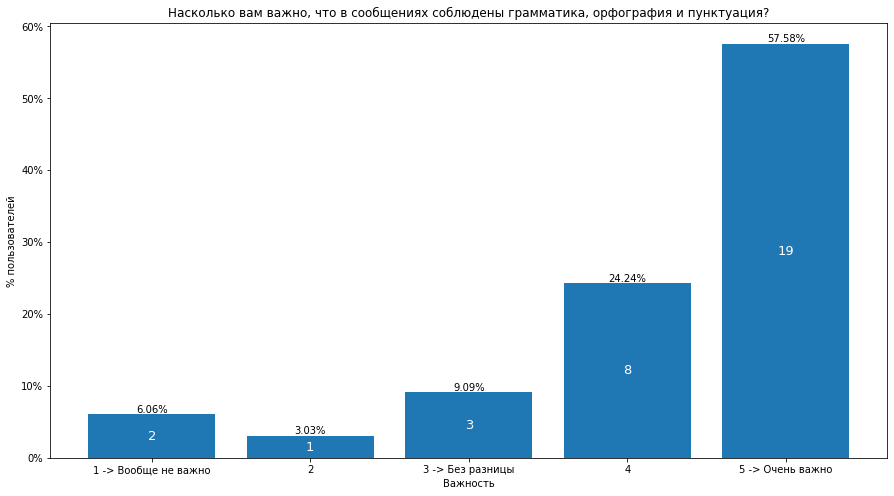

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к пунктуации, грамматики, орфографии
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
gr_out_h = outliers_info_h.groupby(by='Q6', as_index=False)['RESPONDENT_ID'].count()
gr_out_h['RESPONDENT_ID'] = gr_out_h['RESPONDENT_ID'] // 20
gr_out_perc_h = gr_out_h.copy()
gr_out_list_h = gr_out_h['RESPONDENT_ID'].to_list()

# to show %
gr_out_perc_h['RESPONDENT_ID'] = round(gr_out_perc_h['RESPONDENT_ID'] / sum(gr_out_perc_h['RESPONDENT_ID']) * 100, 2)
gr_out_perc_list_h = gr_out_perc_h['RESPONDENT_ID'].to_list()

# заполняем пропуски: если в какой-то группе 0 пользователей, добавляем 0 в список
for i in range(5):
  if (i + 1) not in gr_out_h['Q6'].to_list():
    gr_out_list_h.insert(i, 0)
    gr_out_perc_list_h.insert(i, 0)


graph_gr_punc_orth(gr_out_perc_list_h, gr_out_list_h)

В тематике здравоохранения вариант "Очень важно" выбрало 57.58%. Хотя в интересных фактах оценка "Очень важно" составляла 47.62%. То есть один из возможных выводов, что в здравоохранении это более важно. 

##### Отношение к шуткам

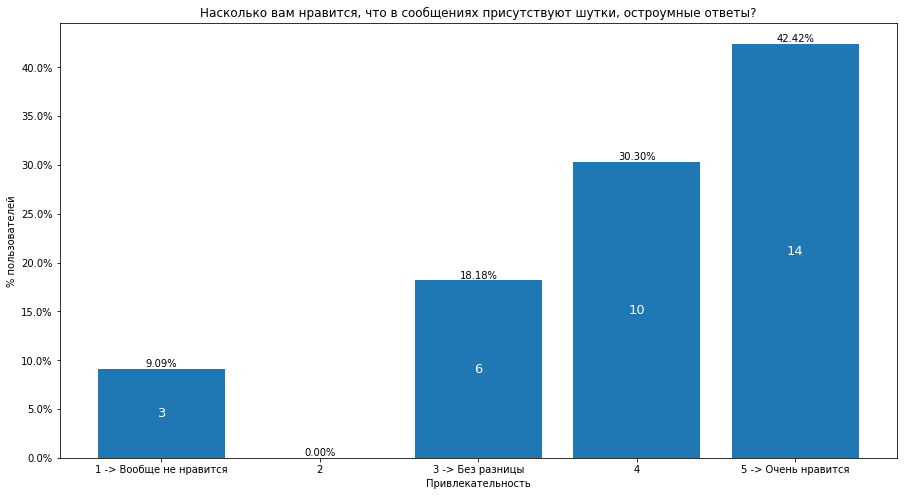

In [ ]:
jokes_out_h = outliers_info_h.groupby(by='Q7', as_index=False)['RESPONDENT_ID'].count()
jokes_out_h['RESPONDENT_ID'] = jokes_out_h['RESPONDENT_ID'] // 20
jokes_out_h_perc = jokes_out_h.copy()
jokes_out_h_list = jokes_out_h['RESPONDENT_ID'].to_list()

# to show %
jokes_out_h_perc['RESPONDENT_ID'] = round(jokes_out_h_perc['RESPONDENT_ID'] / sum(jokes_out_h_perc['RESPONDENT_ID']) * 100, 2)
jokes_out_h_perc_list = jokes_out_h_perc['RESPONDENT_ID'].to_list()

# заполняем пропуски: если в какой-то группе 0 пользователей, добавляем 0 в список
for i in range(5):
  if (i + 1) not in jokes_out_h['Q7'].to_list():
    jokes_out_h_list.insert(i, 0)
    jokes_out_h_perc_list.insert(i, 0)



graph_jokes(jokes_out_h_perc_list, jokes_out_h_list)

42.42% нравятся шутки очень сильно и 30.30% просто нравятся, что составляет 24 человека из 33. Это удивительно, потому что в сумме это больше, чем положительная оценка шуток в интересных фактах: 71.43% (28.57% и 42.86%). 

##### Отношение к тексту без разбиений на части

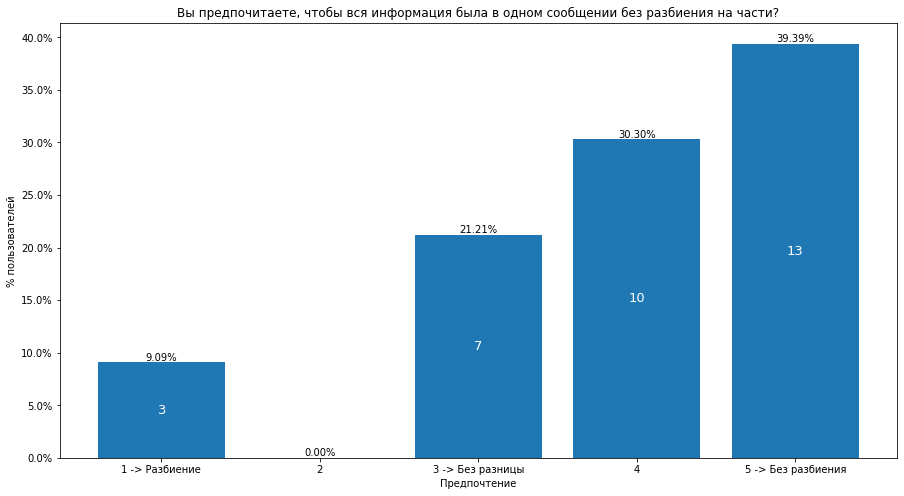

In [ ]:
text_out_h = outliers_info_h.groupby(by='Q8', as_index=False)['RESPONDENT_ID'].count()
text_out_h['RESPONDENT_ID'] = text_out_h['RESPONDENT_ID'] // 20
text_out_perc_h = text_out_h.copy()
text_out_list_h = text_out_h['RESPONDENT_ID'].to_list()

# to show %
text_out_perc_h['RESPONDENT_ID'] = round(text_out_perc_h['RESPONDENT_ID'] / sum(text_out_perc_h['RESPONDENT_ID']) * 100, 2)
text_out_perc_list_h = text_out_perc_h['RESPONDENT_ID'].to_list()

# заполняем пропуски: если в какой-то группе 0 пользователей, добавляем 0 в список
for i in range(5):
  if (i + 1) not in text_out_h['Q8'].to_list():
    text_out_list_h.insert(i, 0)
    text_out_perc_list_h.insert(i, 0)



graph_large_text(text_out_perc_list_h, text_out_list_h)

В сравнении с интересными фактами тут бОльшему количеству пользователей предпочтительна подача информация в одном блоке сообщений, это 30.30% и 39.39% (в сумме 69.69%). В интересных фактах эти группы составляют 14.29% и 28.57% (в сумме 42.86%), там 52.38% пользователей индифферентно относятся к разбиению. 

##### Все графики на одной картинке

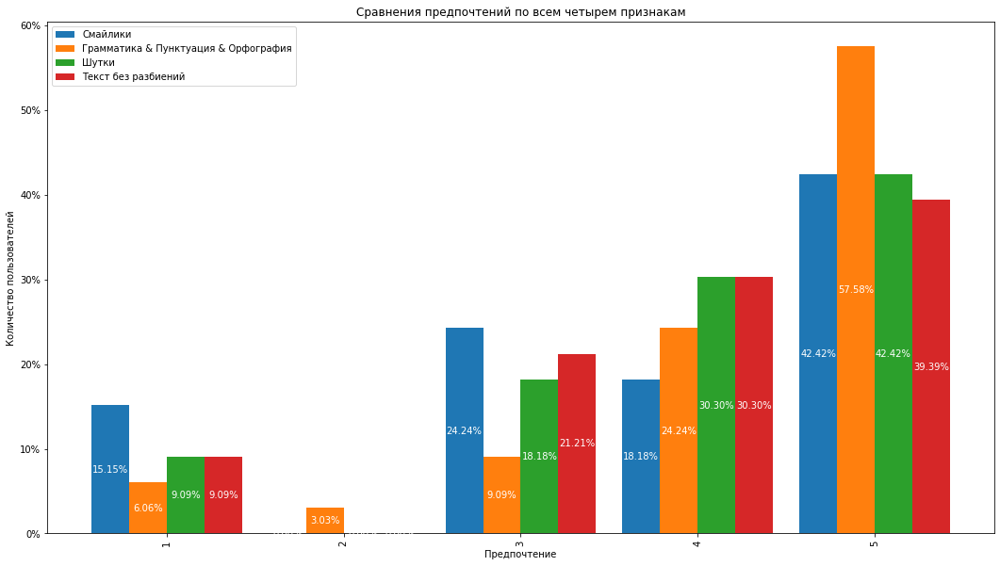

In [ ]:
# create data
df_h = pd.DataFrame([['1', emoticons_out_h_perc_list[0], gr_out_perc_list_h[0], jokes_out_h_perc_list[0], text_out_perc_list_h[0]],
                   ['2', emoticons_out_h_perc_list[1], gr_out_perc_list_h[1], jokes_out_h_perc_list[1], text_out_perc_list_h[1]],
                   ['3', emoticons_out_h_perc_list[2], gr_out_perc_list_h[2], jokes_out_h_perc_list[2], text_out_perc_list_h[2]],
                   ['4', emoticons_out_h_perc_list[3], gr_out_perc_list_h[3], jokes_out_h_perc_list[3], text_out_perc_list_h[3]],
                   ['5', emoticons_out_h_perc_list[4], gr_out_perc_list_h[4], jokes_out_h_perc_list[4], text_out_perc_list_h[4]]],
                  columns=['Предпочтение', 'Смайлики', 'Грамматика & Пунктуация & Орфография', 'Шутки', 'Текст без разбиений'])

  
# plot grouped bar chart
ax = df_h.plot(x='Предпочтение',
             ylabel='Количество пользователей',
        kind='bar',
        stacked=False,
        figsize = (18,10),
        width=0.85,
        title='Сравнения предпочтений по всем четырем признакам')

ax.bar_label(ax.containers[0], labels=['%.2f%%' % e for e in df_h['Смайлики']], color='white', label_type='center')
ax.bar_label(ax.containers[1], labels=['%.2f%%' % e for e in df_h['Грамматика & Пунктуация & Орфография']], color='white', label_type='center')
ax.bar_label(ax.containers[2], labels=['%.2f%%' % e for e in df_h['Шутки']], color='white', label_type='center')
ax.bar_label(ax.containers[3], labels=['%.2f%%' % e for e in df_h['Текст без разбиений']], color='white', label_type='center')

ax.yaxis.set_major_formatter(mtick.PercentFormatter())

### Удаление излишних данных и преобразование 0 в 1, если пользователь ответил "Без разницы", потому что это значит, он выбрал оба варианта, а не ни один из предложенных. 

Удаляем RESPONDENT_IP_ADDRESS, RESPONDENT_REGION, RESPONDENT_POSTCODE, RESPONDENT_TIME_OF_OPENING_SURVEY, RESPONDENT_TIME_OF_COMPLETING_SURVEY, RESPONDENT_UNIQUE_CODE, поскольку регион определим по городу, IP адрес и почтовый индекс не нужны в последующем анализе. А время у нас посчитано в отдельном столбце, поэтому время начала и конца прохождения опроса нам не нужно. 


In [ ]:
# удаляем колонки RESPONDENT_IP_ADDRESS RESPONDENT_REGION RESPONDENT_POSTCODE RESPONDENT_TIME_OF_OPENING_SURVEY 
# RESPONDENT_TIME_OF_COMPLETING_SURVEY RESPONDENT_UNIQUE_CODE 
# поскольку большинство респондентов пользуются соц. сетями больше 5 лет, то есть выбирают Q3_O5_5, это 87.4%, поэтому удаляем эту dummy переменную
# УДАЛИТЬ Q3_O5_5 ПОСЛЕ АНАЛИЗА
# https://dss.princeton.edu/online_help/analysis/dummy_variables.html
delete_columns = ['RESPONDENT_IP_ADDRESS', 'RESPONDENT_REGION', 'RESPONDENT_POSTCODE', 'RESPONDENT_TIME_OF_OPENING_SURVEY',
                  'RESPONDENT_TIME_OF_COMPLETING_SURVEY', 'RESPONDENT_UNIQUE_CODE']
health_regr_sorted.drop(delete_columns, inplace=True, axis=1)
health_regr_sorted = health_regr_sorted.reset_index()
health_regr_sorted.drop('index', inplace=True, axis=1)

# проверяем, нет ли лишних пробелов в начале и конце элементов столбца A1
# нужно будет знать при переводе названия в 4 столбца
health_regr_sorted['A1'] = health_regr_sorted['A1'].str.strip()

In [ ]:
# Замена 0 на 1, если пользователь выбрал "Нет различий, обоим вариантам доверяю."

# список списков, запоминающий две карточки, для которых было выбрано "Без разницы"
indiff0_h = []
indexes_h = health_regr_sorted.index.tolist()
for i in indexes_h[0::2]:
  altern1 = health_regr_sorted.loc[i]
  altern2 = health_regr_sorted.loc[i + 1]
  # если ответы двух альтернатив одинаковые -> это 0 (другого быть не может) -> заменяем на 1
  if altern1['CHOICE_INDICATOR'] == altern2['CHOICE_INDICATOR'] and altern1['RESPONDENT_ID'] == altern2['RESPONDENT_ID'] and altern1['SURVEY_ID'] == altern2['SURVEY_ID'] and altern1['CHOICE_SET'] == altern2['CHOICE_SET']:
    indiff0_h.append([altern1['A1'], altern2['A1']])
    health_regr_sorted.at[i, 'CHOICE_INDICATOR'] = 1
    health_regr_sorted.at[i + 1, 'CHOICE_INDICATOR'] = 1
print("Список профилей, на которые ответили 'Без разницы': {}.".format(indiff0_h))
print("Количество таких пар профилей: {}.".format(len(indiff0_h)))


# проверка на частном случае, что все заменилось
health_regr_sorted[health_regr_sorted['RESPONDENT_ID'] == 120887291]

Список профилей, на которые ответили 'Без разницы': [['22- - - +', '22- + - +'], ['22+ - + -', '22+ + + -'], ['22- - - -', '22+ + + +'], ['22- + + -', '22+ - - -'], ['22- + + +', '22+ - + +'], ['22- - - +', '22- + - +'], ['22- + + +', '22+ + - -'], ['22- + - +', '22+ + - +'], ['22+ - - +', '22+ - + +'], ['22- - + +', '22+ - + +'], ['22- + + -', '22- + + +'], ['22- - + +', '22+ + + +'], ['22- - - -', '22+ - - -'], ['22- - - +', '22+ - - +'], ['22- - + +', '22+ + - +'], ['22- - - -', '22- + - -'], ['22- + - +', '22+ + + +'], ['22- + + +', '22+ - + +'], ['22- - - +', '22- + - +'], ['22+ - + -', '22+ + + -'], ['22- + - +', '22+ + - +'], ['22+ - - +', '22+ + - -'], ['22- + + -', '22- + + +'], ['22- - + -', '22+ + + -'], ['22- - - -', '22- - + -'], ['22- + + -', '22+ + + +'], ['22+ - - +', '22+ + - -'], ['22+ + - +', '22+ + + -'], ['22+ - - -', '22+ + - -'], ['22- + + -', '22- + + +'], ['22- - + -', '22+ + + -'], ['22- + - +', '22+ - + -'], ['22- - - +', '22+ - + -'], ['22- - - -', '22- - + 

,RESPONDENT_ID,SURVEY_ID,CHOICE_SET,LABEL,CHOICE_INDICATOR,A1,RESPONDENT_CITY,RESPONDENT_COUNTRY,RESPONDENT_DEVICE_USED_IN_SURVEY,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8
7440,120887291,5,1,1,0,22+ - - +,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1
7441,120887291,5,1,2,1,22+ + - -,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1
7442,120887291,5,2,1,1,22- - + +,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1
7443,120887291,5,2,2,1,22+ - + +,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1
7444,120887291,5,3,1,1,22+ + - +,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1
7445,120887291,5,3,2,0,22+ + + -,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1
7446,120887291,5,4,1,0,22+ - - -,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1
7447,120887291,5,4,2,1,22+ + - -,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1
7448,120887291,5,5,1,1,22- + + -,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1
7449,120887291,5,5,2,1,22- + + +,St Petersburg,Russia,mobile,514,1,0,0,0,0,1,3,5,2,1


In [ ]:
# перевод названий типа "22+ + - +" в четыре колонки соответствующих атрибутов
# если - -> ставим 0, то есть отсутствует атрибут
# если + -> ставим 1, то есть присутствует атрибут в виньетке

profiles_h = [('22- - - -', 0, 0, 0, 0),
            ('22- - - +', 0, 0, 0, 1),
            ('22- - + -', 0, 0, 1, 0),
            ('22- - + +', 0, 0, 1, 1),
            ('22- + - -', 0, 1, 0, 0),
            ('22- + - +', 0, 1, 0, 1),
            ('22- + + -', 0, 1, 1, 0),
            ('22- + + +', 0, 0, 0, 0),
            ('22+ - - -', 1, 0, 0, 0),
            ('22+ - - +', 1, 0, 0, 1),
            ('22+ - + -', 1, 0, 1, 0),
            ('22+ - + +', 1, 0, 1, 1),
            ('22+ + - -', 1, 1, 0, 0),
            ('22+ + - +', 1, 1, 0, 1),
            ('22+ + + -', 1, 1, 1, 0),
            ('22+ + + +', 1, 1, 1, 1)           
]

attributes_h = pd.DataFrame(profiles_h, columns = ['A1', 'emoticons', 'gr_pun_orth', 'jokes', 'large_text'])

In [ ]:
# соединяем две таблицы с помощью inner join для создания отдельных атрибутов
health_regr_merge = pd.merge(health_regr_sorted, attributes_h, how='inner', on='A1')

health_regr_merge_sorted = health_regr_merge.sort_values(by=['RESPONDENT_ID', 'SURVEY_ID', 'CHOICE_SET', 'LABEL'], ascending=True).reset_index()
health_regr_merge_sorted.drop(['index', 'A1'], inplace=True, axis=1)
# также можно удалить choice_set, label, так как они полностью определяются survey_id
health_regr_merge_sorted.drop(['CHOICE_SET', 'LABEL'], inplace=True, axis=1)

In [ ]:
health_regr_merge_sorted

,RESPONDENT_ID,SURVEY_ID,CHOICE_INDICATOR,RESPONDENT_CITY,RESPONDENT_COUNTRY,RESPONDENT_DEVICE_USED_IN_SURVEY,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY,Q3_O1,Q3_O2,...,Q3_O4_3_5,Q3_O5_5,Q5,Q6,Q7,Q8,emoticons,gr_pun_orth,jokes,large_text
0,120457015,4,0,Troitsk,Russia,desktop,131,0,0,0,...,0,1,3,5,5,3,0,0,1,1
1,120457015,4,1,Troitsk,Russia,desktop,131,0,0,0,...,0,1,3,5,5,3,0,1,1,0
2,120457015,4,0,Troitsk,Russia,desktop,131,0,0,0,...,0,1,3,5,5,3,0,1,0,0
3,120457015,4,1,Troitsk,Russia,desktop,131,0,0,0,...,0,1,3,5,5,3,1,1,1,0
4,120457015,4,0,Troitsk,Russia,desktop,131,0,0,0,...,0,1,3,5,5,3,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7655,120887305,4,1,Ghonchí,Tajikistan,mobile,445,1,0,0,...,1,0,1,5,2,2,0,1,0,1
7656,120887305,4,0,Ghonchí,Tajikistan,mobile,445,1,0,0,...,1,0,1,5,2,2,0,0,1,0
7657,120887305,4,1,Ghonchí,Tajikistan,mobile,445,1,0,0,...,1,0,1,5,2,2,1,0,1,1
7658,120887305,4,1,Ghonchí,Tajikistan,mobile,445,1,0,0,...,1,0,1,5,2,2,0,1,0,0


In [ ]:
health_regr_merge_sorted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7660 entries, 0 to 7659
Data columns (total 21 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   RESPONDENT_ID                           7660 non-null   int64 
 1   SURVEY_ID                               7660 non-null   int64 
 2   CHOICE_INDICATOR                        7660 non-null   int64 
 3   RESPONDENT_CITY                         7660 non-null   object
 4   RESPONDENT_COUNTRY                      7660 non-null   object
 5   RESPONDENT_DEVICE_USED_IN_SURVEY        7660 non-null   object
 6   RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS  7660 non-null   int64 
 7   RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY  7660 non-null   int64 
 8   Q3_O1                                   7660 non-null   int64 
 9   Q3_O2                                   7660 non-null   int64 
 10  Q3_O3_3                                 7660 non-null   int64 
 11  Q3_O

## Основные статистические графики, кто сколько прошел, кому что показалось

### Отрисовка стран участников в опроса

In [ ]:
# поскольку у каждого пользователя по 20 строчек в таблице, то общее количество пользователей из каждой страны делим на 20

countries_h = health_regr_sorted.groupby('RESPONDENT_COUNTRY')['RESPONDENT_COUNTRY'].count().to_frame(
    name='count').reset_index()
countries_h['count'] = countries_h['count'] // 20

In [ ]:
countries_h

,RESPONDENT_COUNTRY,count
0,Armenia,1
1,Belarus,11
2,France,1
3,Germany,3
4,Kazakhstan,7
5,Kyrgyzstan,1
6,Moldova,2
7,Netherlands,6
8,Pakistan,1
9,Poland,3


In [ ]:
countries_h['codes'] = countries_h.apply(lambda row: get_continent(row['RESPONDENT_COUNTRY']), axis=1)
countries_h[['country', 'continent']] = pd.DataFrame(countries_h['codes'].tolist(), index=countries_h.index)   

In [ ]:
countries_h

,RESPONDENT_COUNTRY,count,codes,country,continent
0,Armenia,1,"(AM, AS)",AM,AS
1,Belarus,11,"(BY, EU)",BY,EU
2,France,1,"(FR, EU)",FR,EU
3,Germany,3,"(DE, EU)",DE,EU
4,Kazakhstan,7,"(KZ, AS)",KZ,AS
5,Kyrgyzstan,1,"(KG, AS)",KG,AS
6,Moldova,2,"(MD, EU)",MD,EU
7,Netherlands,6,"(NL, EU)",NL,EU
8,Pakistan,1,"(PK, AS)",PK,AS
9,Poland,3,"(PL, EU)",PL,EU


In [ ]:
countries_h['geolocate'] = countries_h.apply(lambda row: geolocate(row['country']), axis=1)

In [ ]:
countries_h[['latitude', 'longitude']] = pd.DataFrame(countries_h['geolocate'].tolist(), index=countries_h.index)  
# поменяли latitude и longitude России и Молдавии, так как они были неправильные и указывали на Великобританию и США
countries_h.loc[countries_h.index[countries_h['RESPONDENT_COUNTRY'] == 'Russia'], 'latitude'] = 55.755871
countries_h.loc[countries_h.index[countries_h['RESPONDENT_COUNTRY'] == 'Russia'], 'longitude'] = 37.617680

countries_h.loc[countries_h.index[countries_h['RESPONDENT_COUNTRY'] == 'Moldova'], 'latitude'] = 47.411633
countries_h.loc[countries_h.index[countries_h['RESPONDENT_COUNTRY'] == 'Moldova'], 'longitude'] = 28.369884

In [ ]:
countries_h

,RESPONDENT_COUNTRY,count,codes,country,continent,geolocate,latitude,longitude
0,Armenia,1,"(AM, AS)",AM,AS,"(40.7696272, 44.6736646)",40.769627,44.673665
1,Belarus,11,"(BY, EU)",BY,EU,"(53.4250605, 27.6971358)",53.425061,27.697136
2,France,1,"(FR, EU)",FR,EU,"(46.603354, 1.8883335)",46.603354,1.888334
3,Germany,3,"(DE, EU)",DE,EU,"(51.0834196, 10.4234469)",51.083420,10.423447
4,Kazakhstan,7,"(KZ, AS)",KZ,AS,"(47.2286086, 65.2093197)",47.228609,65.209320
5,Kyrgyzstan,1,"(KG, AS)",KG,AS,"(41.5089324, 74.724091)",41.508932,74.724091
6,Moldova,2,"(MD, EU)",MD,EU,"(39.5162234, -76.9382069)",47.411633,28.369884
7,Netherlands,6,"(NL, EU)",NL,EU,"(52.24764975, 5.541246849406163)",52.247650,5.541247
8,Pakistan,1,"(PK, AS)",PK,AS,"(30.3308401, 71.247499)",30.330840,71.247499
9,Poland,3,"(PL, EU)",PL,EU,"(52.215933, 19.134422)",52.215933,19.134422


In [ ]:
#empty map
world_map_h = folium.Map(tiles="cartodbpositron")
marker_cluster_h = MarkerCluster().add_to(world_map_h)
#for each coordinate, create circlemarker of user percent
for i in range(len(countries_h)):
  lat = countries_h.iloc[i]['latitude']
  long = countries_h.iloc[i]['longitude']
  radius=5
  popup_text = """Страна : {}<br>
                    № пользователей : {}<br>"""
  popup_text = popup_text.format(countries_h.iloc[i]['country'],
                                   countries_h.iloc[i]['count']
                                   )
  folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster_h)
#show the map
world_map_h

### Сколько раз был показан каждый блок и профиль опроса

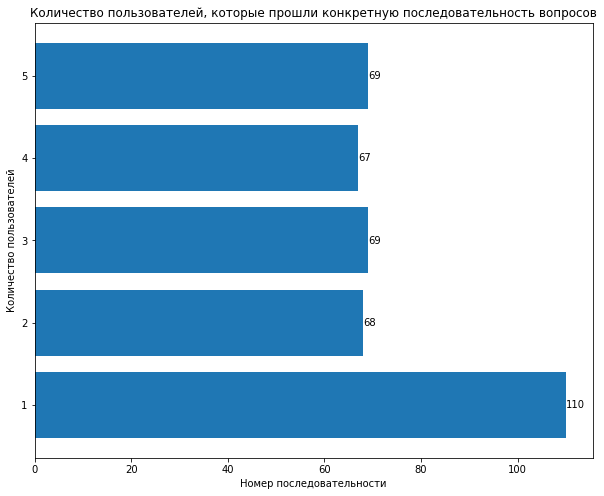

In [ ]:
#группируем пользователей в зависимости от пройденного блока вопросов
groups_h = health_regr_merge_sorted.groupby(by=['SURVEY_ID'], sort=True).size().to_frame(name = 'times block shown')
# делим на 20, так как у каждого респондента в базе данных по 20 строк, где 20 строк - один блок
groups_h['times block shown'] = groups_h['times block shown'] // 20

graph_blocks_shown(groups_h)
  

Наблюдается перекос в количестве показов первого блока. Однако плюсом является, что только в первом блоке показываются все профили пользователю. 

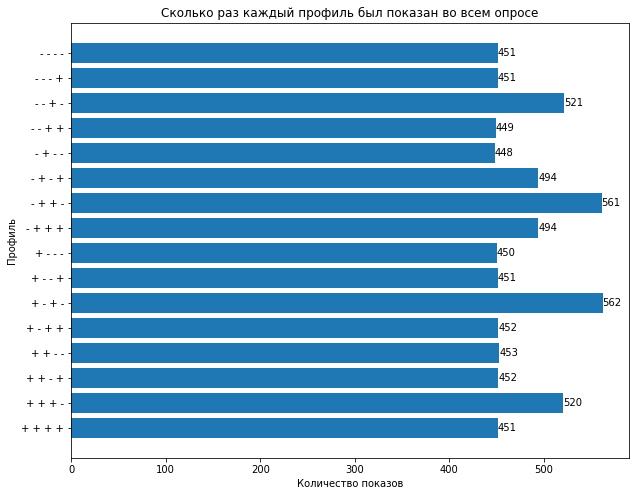

In [ ]:
# считаем, сколько раз был показан каждый профиль, поскольку они должны быть показаны примерно одинаковое количество раз
#группируем пользователей в зависимости от пройденного блока вопросов
groups_h = health_regr_sorted.groupby(by=['A1'], sort=True, as_index=False).size()

graph_profile_shown(groups_h)


In [ ]:
groups_h

,A1,size
0,22+ + + +,451
1,22+ + + -,520
2,22+ + - +,452
3,22+ + - -,453
4,22+ - + +,452
5,22+ - + -,562
6,22+ - - +,451
7,22+ - - -,450
8,22- + + +,494
9,22- + + -,561


### Тип использованного гаджета для прохождения опроса

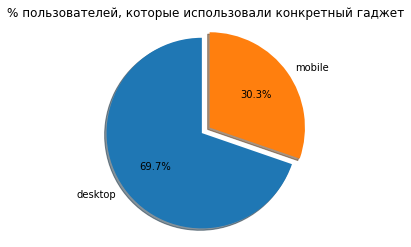

<Figure size 432x288 with 0 Axes>

In [ ]:
#группируем пользователей в зависимости от типа используемого гаджета
groups_device_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_DEVICE_USED_IN_SURVEY']).size().to_frame(name = 'number_device_type')
# делим на 20, так как у каждого респондента в базе данных по 20 строк, где 20 строк - один блок
groups_device_h['number_device_type'] = groups_device_h['number_device_type'] // 20


graph_device_used(groups_device_h)


69.7% проходили опрос с компьютерной версии, что меньше, чем в интересных фактах, 74%. 

### Среднее время прохождения опроса

In [ ]:
time_respondent_h = health_regr_merge_sorted.groupby('RESPONDENT_ID')['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'].min()
av_time_h = np.mean(time_respondent_h)
print('Среднее время прохождения опроса: {min: .0f} минуты и {sec: .2f} секунды'.format(min = av_time_h // 60, sec = av_time_h % 60))

Среднее время прохождения опроса:  4 минуты и  3.59 секунды


Среднее время прохождения этого теста меньше, чем интересных фактов. Может быть связано с тем фактом, что тут больше людей было набрано с толоки. 

In [ ]:
resp_length_device_h = health_regr_merge_sorted.groupby(['RESPONDENT_ID', 'RESPONDENT_DEVICE_USED_IN_SURVEY'],as_index=False)['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'].min()
av_length_device_h = resp_length_device_h.groupby('RESPONDENT_DEVICE_USED_IN_SURVEY', as_index=False)['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'].mean()
av_length_device_h['min'] = av_length_device_h['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'] // 60
av_length_device_h['sec'] = av_length_device_h['RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS'] % 60

In [ ]:
av_length_device_h

,RESPONDENT_DEVICE_USED_IN_SURVEY,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,min,sec
0,desktop,238.569288,3.0,58.569288
1,mobile,255.137931,4.0,15.137931


В мобильном приложении среднее время прохождения опроса больше на 20 секунд в среднем. 

### Количество дисквалифицированных участников и причина на этапе выгрузки данных

In [ ]:
excel_health = pd.read_excel('health.xlsx', sheet_name='Respondents').iloc[1:, :]
excel_health.columns = excel_health.iloc[0]
excel_health = excel_health[1:]

In [ ]:
excel_health.head()

1,participant_id,Assigned conjoint block,Datetime of participant creation,Datetime of entering survey,Datetime of finishing survey,Length of interview in seconds,IP address,Location: City,Location: Region,Location: Postcode,...,Q3: Как давно вы пользуетесь социальными сетями?\nOption 1: Менее полугода,Q3: Как давно вы пользуетесь социальными сетями?\nOption 2: От полугода до года,Q3: Как давно вы пользуетесь социальными сетями?\nOption 3: От года до 3 лет,Q3: Как давно вы пользуетесь социальными сетями?\nOption 4: От 3 до 5 лет,Q3: Как давно вы пользуетесь социальными сетями?\nOption 5: Свыше 5 лет,Q3: Как давно вы пользуетесь социальными сетями?,"Q5: Насколько вам нравится, что в сообщениях используются смайлики?","Q6: Насколько вам важно, что в сообщениях соблюдены грамматика, орфография","Q7: Насколько вам нравится, что в сообщениях присутствуют шутки, остроумны","Q8: Я предпочитаю, чтобы вся информация была в одном сообщении без разбиен"
2,120456989,2,2022-04-06 08:14:15,2022-04-06 08:14:15,2022-04-06 08:14:21,6,91.108.0.206,St Petersburg,St.-Petersburg,190923,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,120457015,4,2022-04-06 08:20:18,2022-04-06 08:20:18,2022-04-06 08:22:29,131,5.79.231.37,Troitsk,Chelyabinsk Oblast,457111,...,0,0,0,0,1,Option 5: Свыше 5 лет,3,5,5,3
4,120457016,4,2022-04-06 08:20:21,2022-04-06 08:20:21,2022-04-06 08:21:24,63,176.59.196.117,Chelyabinsk,Chelyabinsk Oblast,454013,...,0,0,0,0,1,Option 5: Свыше 5 лет,2,5,5,5
5,120457017,4,2022-04-06 08:20:23,2022-04-06 08:20:23,2022-04-06 08:22:03,100,92.47.172.189,Aktobe,Aktyubinskaya Oblast',030000,...,1,0,0,0,0,Option 1: Менее полугода,3,4,4,4
6,120457022,2,2022-04-06 08:21:36,2022-04-06 08:21:37,NaN,NaN,176.59.196.117,Chelyabinsk,Chelyabinsk Oblast,454013,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Общее количество полученных ответов любого качества: 1012
Количество пользователей, которые не были дисквалифицированы: 414


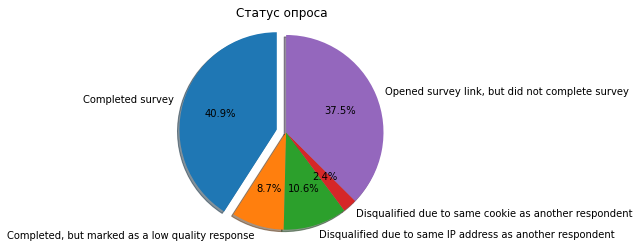

In [ ]:
#группируем пользователей в зависимости от статуса опроса: прошел, дисквалифицирован, не прошел до конца
status_response_h = excel_health.groupby(by='Status of response', as_index=False).size()


print('Общее количество полученных ответов любого качества: {}'.format(excel_health.shape[0]))
print('Количество пользователей, которые не были дисквалифицированы: {}'.format(excel_health[excel_health['Status of response'] == 'Completed survey'].shape[0]))

graph_completed_number(status_response_h)


В сравнении с данными по интересным фактам тут больше пользователей, которые были дисквалифицированы ввиду ответов низкого качества, 8.7% вместо 0.3%. 

### Как давно пользуются социальными сетями

383


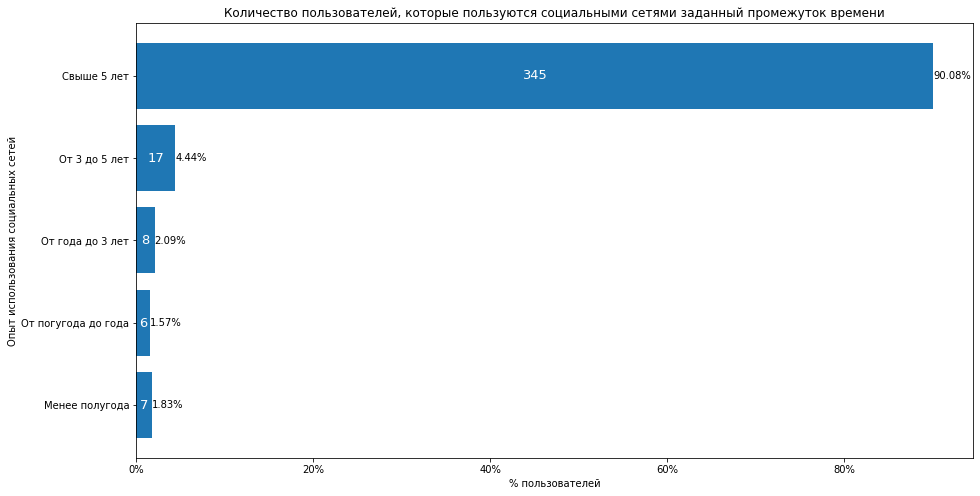

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по опыту пользования соц. сетями
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
soc_netw_h = [0] * 5
soc_netw_h[0] = (health_regr_merge_sorted.groupby(by='Q3_O1', as_index=False)['Q3_O1'].sum() // 20)['Q3_O1'][1]
soc_netw_h[1] = (health_regr_merge_sorted.groupby(by='Q3_O2', as_index=False)['Q3_O2'].sum() // 20)['Q3_O2'][1]
soc_netw_h[2] = (health_regr_merge_sorted.groupby(by='Q3_O3_3', as_index=False)['Q3_O3_3'].sum() // 20)['Q3_O3_3'][1]
soc_netw_h[3] = (health_regr_merge_sorted.groupby(by='Q3_O4_3_5', as_index=False)['Q3_O4_3_5'].sum() // 20)['Q3_O4_3_5'][1]
soc_netw_h[4] = (health_regr_merge_sorted.groupby(by='Q3_O5_5', as_index=False)['Q3_O5_5'].sum() // 20)['Q3_O5_5'][1]
soc_netw_perc_h = soc_netw_h / sum(soc_netw_h) * 100
print(sum(soc_netw_h))

graph_snet_use(soc_netw_perc_h, soc_netw_h)

Аналогично интересным фактам большинство пользователей имеют опыт пользования социальными сетями более 5 лет. 

#### Опыт в зависимости от смайликов

In [ ]:
# количество пользователей (RESPONDENT_ID), которые ответили на эмодзи "Q5" и выбрали соответствующий из "Q3_i" ответ по поводу опыта использования социальными сетями
emoticon_exp_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q5', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False)['Q5'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
emoticon_exp_h['Q5'] = emoticon_exp_h['Q5'] // 20

sum_emoticon_by_exp_h = emoticon_exp_h.groupby(by=['Q5', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False).count()

sum_emoticon_by_exp_h.head(5)

,Q5,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,RESPONDENT_ID
0,1,0,0,0,0,1,65
1,1,0,0,0,1,0,5
2,1,0,0,1,0,0,3
3,1,0,1,0,0,0,1
4,1,1,0,0,0,0,1


In [ ]:
sum_emoticon_by_exp_h.iloc[:, 1:6] = sum_emoticon_by_exp_h.iloc[:, 1:6].apply(lambda x: x * sum_emoticon_by_exp_h.iloc[:,6])
sum_emoticon_by_exp_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по смайликам соответствует количество респондентов, которые выбрали именно этот score для смайкликов
# и дальше эти пользователи расписаны согласно их опыту
sum_emoticon_by_exp_h = sum_emoticon_by_exp_h.groupby(by='Q5', as_index=False).sum()
sum_emoticon_by_exp_h

,Q5,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5
0,1,1,1,3,5,65
1,2,1,0,0,0,56
2,3,3,1,1,5,91
3,4,1,2,2,3,59
4,5,1,2,2,4,74


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенный опыт
sum_emoticon_by_exp_perc_h = sum_emoticon_by_exp_h.copy()
sum_emoticon_by_exp_perc_h['total'] = sum_emoticon_by_exp_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_emoticon_by_exp_perc_h)
sum_emoticon_by_exp_perc_h.iloc[:, 1:6] = sum_emoticon_by_exp_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_emoticon_by_exp_perc_h.iloc[:, 6] * 100, 2) )
sum_emoticon_by_exp_perc_h

   Q5  Q3_O1  Q3_O2  Q3_O3_3  Q3_O4_3_5  Q3_O5_5  total
0   1      1      1        3          5       65     75
1   2      1      0        0          0       56     57
2   3      3      1        1          5       91    101
3   4      1      2        2          3       59     67
4   5      1      2        2          4       74     83


,Q5,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,total
0,1,1.33,1.33,4.00,6.67,86.67,75
1,2,1.75,0.00,0.00,0.00,98.25,57
2,3,2.97,0.99,0.99,4.95,90.10,101
3,4,1.49,2.99,2.99,4.48,88.06,67
4,5,1.20,2.41,2.41,4.82,89.16,83


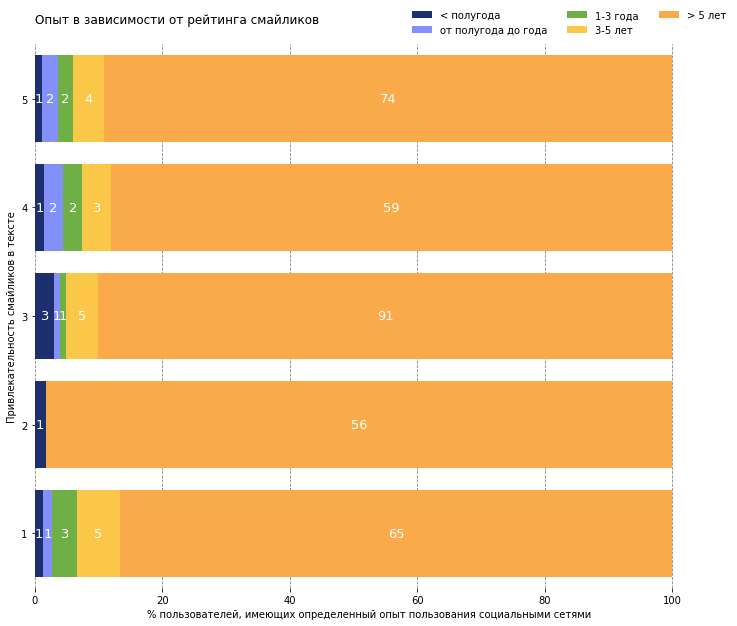

In [ ]:
fields = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['< полугода', 'от полугода до года', '1-3 года', '3-5 лет', '> 5 лет']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_emoticon_by_exp_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_emoticon_by_exp_perc_h.index + 1, sum_emoticon_by_exp_perc_h[name], left = left, color=colors[idx])
    left = left + sum_emoticon_by_exp_perc_h[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_emoticon_by_exp_h.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Опыт в зависимости от рейтинга смайликов\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность смайликов в тексте')
plt.xlabel('% пользователей, имеющих определенный опыт пользования социальными сетями')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Все без одного, кто проголосал за смайлики 2, имеют опыт взаимодействия с социальными сетями больше 5 пяти лет. 

#### Опыт в зависимости от шуток

In [ ]:
# количество пользователей (RESPONDENT_ID), которые ответили на шутки "Q6" и выбрали соответствующий из "Q3_i" ответ по поводу опыта использования социальными сетями
jokes_exp_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q7', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False)['Q7'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
jokes_exp_h['Q7'] = jokes_exp_h['Q7'] // 20

sum_jokes_by_exp_h = jokes_exp_h.groupby(by=['Q7', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False).count()

sum_jokes_by_exp_h.head(5)

,Q7,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,RESPONDENT_ID
0,1,0,0,0,0,1,71
1,1,0,0,0,1,0,5
2,1,0,0,1,0,0,2
3,1,0,1,0,0,0,1
4,1,1,0,0,0,0,1


In [ ]:
sum_jokes_by_exp_h.iloc[:, 1:6] = sum_jokes_by_exp_h.iloc[:, 1:6].apply(lambda x: x * sum_jokes_by_exp_h.iloc[:,6])
sum_jokes_by_exp_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по шуткам соответствует количество респондентов, которые выбрали именно этот score для шуток
# и дальше эти пользователи расписаны согласно их опыту
sum_jokes_by_exp_h = sum_jokes_by_exp_h.groupby(by='Q7', as_index=False).sum()
sum_jokes_by_exp_h

,Q7,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5
0,1,1,1,2,5,71
1,2,2,1,2,3,62
2,3,2,0,1,4,91
3,4,1,3,2,1,61
4,5,1,1,1,4,60


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенный опыт пользования соц. сетями
sum_jokes_by_exp_perc_h = sum_jokes_by_exp_h.copy()
sum_jokes_by_exp_perc_h['total'] = sum_jokes_by_exp_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_jokes_by_exp_perc_h)
sum_jokes_by_exp_perc_h.iloc[:, 1:6] = sum_jokes_by_exp_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_jokes_by_exp_perc_h.iloc[:, 6] * 100, 2) )
sum_jokes_by_exp_perc_h

   Q7  Q3_O1  Q3_O2  Q3_O3_3  Q3_O4_3_5  Q3_O5_5  total
0   1      1      1        2          5       71     80
1   2      2      1        2          3       62     70
2   3      2      0        1          4       91     98
3   4      1      3        2          1       61     68
4   5      1      1        1          4       60     67


,Q7,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,total
0,1,1.25,1.25,2.50,6.25,88.75,80
1,2,2.86,1.43,2.86,4.29,88.57,70
2,3,2.04,0.00,1.02,4.08,92.86,98
3,4,1.47,4.41,2.94,1.47,89.71,68
4,5,1.49,1.49,1.49,5.97,89.55,67


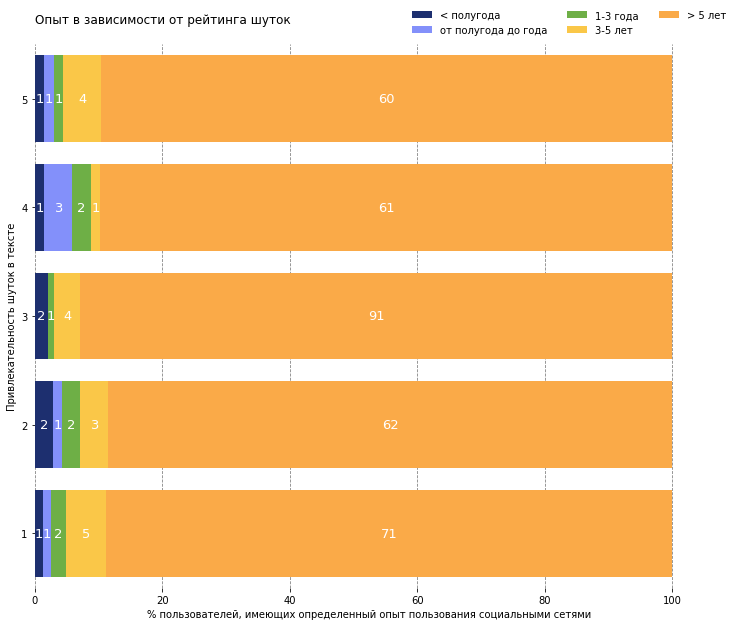

In [ ]:
fields = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['< полугода', 'от полугода до года', '1-3 года', '3-5 лет', '> 5 лет']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_jokes_by_exp_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_jokes_by_exp_perc_h.index + 1, sum_jokes_by_exp_perc_h[name], left = left, color=colors[idx])
    left = left + sum_jokes_by_exp_perc_h[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_jokes_by_exp_h.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Опыт в зависимости от рейтинга шуток\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность шуток в тексте')
plt.xlabel('% пользователей, имеющих определенный опыт пользования социальными сетями')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Таким образом, подавляющее большинство во всех категориях пользуется соц. сетями больше 5 лет. 

Причем использования социальных сетей более 5 лет имеет примерно одинаковое соотношение во всех группах кроме рейтинга 3, 1. 

#### Опыт в зависимости от орфографии, грамматики и пунктуации

In [ ]:
# количество пользователей (RESPONDENT_ID), которые ответили на офографию и т.д. "Q6" и выбрали соответствующий из "Q3_i" ответ по поводу опыта использования социальными сетями
orth_exp_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q6', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False)['Q6'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
orth_exp_h['Q6'] = orth_exp_h['Q6'] // 20

sum_orth_by_exp_h = orth_exp_h.groupby(by=['Q6', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False).count()

sum_orth_by_exp_h.head(5)

,Q6,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,RESPONDENT_ID
0,1,0,0,0,0,1,13
1,1,0,0,0,1,0,1
2,1,0,0,1,0,0,2
3,1,0,1,0,0,0,1
4,2,0,0,0,0,1,8


In [ ]:
sum_orth_by_exp_h.iloc[:, 1:6] = sum_orth_by_exp_h.iloc[:, 1:6].apply(lambda x: x * sum_orth_by_exp_h.iloc[:,6])
sum_orth_by_exp_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по орфографии и т.д. соответствует количество респондентов, которые выбрали именно этот score по орфографии
# и дальше эти пользователи расписаны согласно их опыту
sum_orth_by_exp_h = sum_orth_by_exp_h.groupby(by='Q6', as_index=False).sum()
sum_orth_by_exp_h

,Q6,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5
0,1,0,1,2,1,13
1,2,0,0,0,1,8
2,3,1,2,0,4,27
3,4,2,2,1,1,63
4,5,4,1,5,10,234


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенный опыт пользования соц. сетями
sum_orth_by_exp_perc_h = sum_orth_by_exp_h.copy()
sum_orth_by_exp_perc_h['total'] = sum_orth_by_exp_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_orth_by_exp_perc_h)
sum_orth_by_exp_perc_h.iloc[:, 1:6] = sum_orth_by_exp_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_orth_by_exp_perc_h.iloc[:, 6] * 100, 2) )
sum_orth_by_exp_perc_h

   Q6  Q3_O1  Q3_O2  Q3_O3_3  Q3_O4_3_5  Q3_O5_5  total
0   1      0      1        2          1       13     17
1   2      0      0        0          1        8      9
2   3      1      2        0          4       27     34
3   4      2      2        1          1       63     69
4   5      4      1        5         10      234    254


,Q6,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,total
0,1,0.00,5.88,11.76,5.88,76.47,17
1,2,0.00,0.00,0.00,11.11,88.89,9
2,3,2.94,5.88,0.00,11.76,79.41,34
3,4,2.90,2.90,1.45,1.45,91.30,69
4,5,1.57,0.39,1.97,3.94,92.13,254


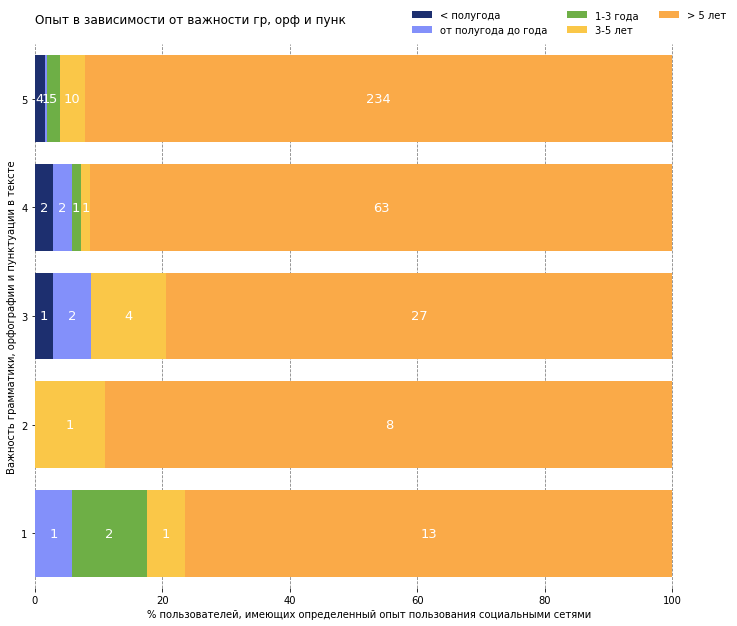

In [ ]:
fields = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['< полугода', 'от полугода до года', '1-3 года', '3-5 лет', '> 5 лет']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_orth_by_exp_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_orth_by_exp_perc_h.index + 1, sum_orth_by_exp_perc_h[name], left = left, color=colors[idx])
    left = left + sum_orth_by_exp_perc_h[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_orth_by_exp_h.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Опыт в зависимости от важности гр, орф и пунк\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Важность грамматики, орфографии и пунктуации в тексте')
plt.xlabel('% пользователей, имеющих определенный опыт пользования социальными сетями')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Большая часть пользователей с опытом более 5 лет выбирают важность грамматики, орфографии и пунктуации. 

#### Опыт в зависимости от текста без разбиений

In [ ]:
# количество пользователей (RESPONDENT_ID), которые ответили на шутки "Q6" и выбрали соответствующий из "Q3_i" ответ по поводу опыта использования социальными сетями
text_exp_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q8', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False)['Q8'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
text_exp_h['Q8'] = text_exp_h['Q8'] // 20

sum_text_by_exp_h = text_exp_h.groupby(by=['Q8', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5'], as_index=False).count()

sum_text_by_exp_h.head(5)

,Q8,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,RESPONDENT_ID
0,1,0,0,0,0,1,24
1,1,0,0,0,1,0,3
2,1,0,0,1,0,0,2
3,1,0,1,0,0,0,1
4,2,0,0,0,0,1,32


In [ ]:
sum_text_by_exp_h.iloc[:, 1:6] = sum_text_by_exp_h.iloc[:, 1:6].apply(lambda x: x * sum_text_by_exp_h.iloc[:,6])
sum_text_by_exp_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по разбиению текста соответствует количество респондентов, которые выбрали именно этот score для разбиения
# и дальше эти пользователи расписаны согласно их опыту
sum_text_by_exp_h = sum_text_by_exp_h.groupby(by='Q8', as_index=False).sum()
sum_text_by_exp_h

,Q8,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5
0,1,0,1,2,3,24
1,2,3,0,1,3,32
2,3,3,2,3,6,112
3,4,0,1,2,2,57
4,5,1,2,0,3,120


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенный опыт пользования соц. сетями
sum_text_by_exp_perc_h = sum_text_by_exp_h.copy()
sum_text_by_exp_perc_h['total'] = sum_text_by_exp_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_text_by_exp_perc_h)
sum_text_by_exp_perc_h.iloc[:, 1:6] = sum_text_by_exp_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_text_by_exp_perc_h.iloc[:, 6] * 100, 2) )
sum_text_by_exp_perc_h

   Q8  Q3_O1  Q3_O2  Q3_O3_3  Q3_O4_3_5  Q3_O5_5  total
0   1      0      1        2          3       24     30
1   2      3      0        1          3       32     39
2   3      3      2        3          6      112    126
3   4      0      1        2          2       57     62
4   5      1      2        0          3      120    126


,Q8,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,Q3_O5_5,total
0,1,0.00,3.33,6.67,10.00,80.00,30
1,2,7.69,0.00,2.56,7.69,82.05,39
2,3,2.38,1.59,2.38,4.76,88.89,126
3,4,0.00,1.61,3.23,3.23,91.94,62
4,5,0.79,1.59,0.00,2.38,95.24,126


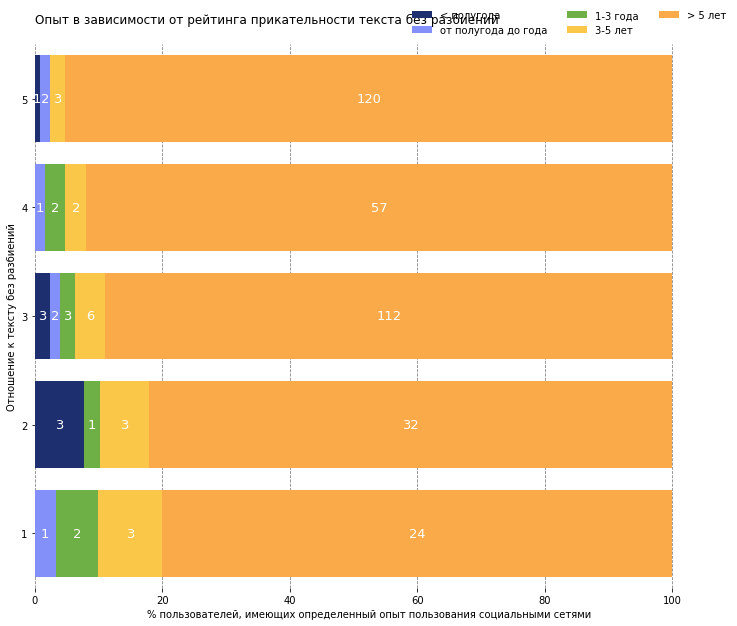

In [ ]:
fields = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5', 'Q3_O5_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['< полугода', 'от полугода до года', '1-3 года', '3-5 лет', '> 5 лет']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_text_by_exp_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_text_by_exp_perc_h.index + 1, sum_text_by_exp_perc_h[name], left = left, color=colors[idx])
    left = left + sum_text_by_exp_perc_h[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_text_by_exp_h.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Опыт в зависимости от рейтинга прикательности текста без разбиений\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Отношение к тексту без разбиений')
plt.xlabel('% пользователей, имеющих определенный опыт пользования социальными сетями')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Таким образом, подавляющее большинство во всех категориях пользуется соц. сетями больше 5 лет. 

### Насколько вам нравится, что в сообщениях используются смайлики

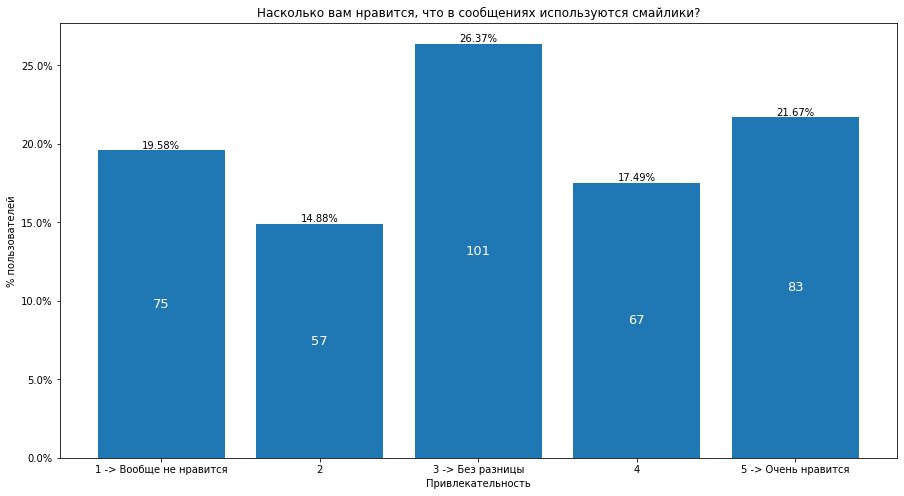

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к смайликам
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
emoticons_h = health_regr_merge_sorted.groupby(by='Q5', as_index=False)['Q5'].count() // 20
emoticons_perc_h = emoticons_h.copy()

emoticons_h = emoticons_h['Q5'].to_list()

# to show %
emoticons_perc_h['Q5'] = round(emoticons_perc_h['Q5'] / sum(emoticons_perc_h['Q5']) * 100, 2)
emoticons_perc_h = emoticons_perc_h['Q5'].to_list()


graph_emoticons(emoticons_perc_h, emoticons_h)

Тут бОльший процент пользователей негативно относятся к смайликам, это 19.58% + 14.88% (34.46%), когда как в интересных фактах это 11.69% + 16.36%. Примерно один и тот же процент пользователь составляет оценку "Без разницы" 26.27% и 26.37% соотстветственно. 

#### Шутки в зависимости от смайликов

In [ ]:
emoticon_jokes_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q5', 'Q7'], as_index=False)['Q5'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
emoticon_jokes_h['Q5'] = emoticon_jokes_h['Q5'] // 20
emoticon_jokes_h = pd.get_dummies(emoticon_jokes_h.astype(str), columns = ['Q7'])

# количество пользователей (RESPONDENT_ID), которые ответили на эмодзи "Q5" и выбрали соответствующий из "Q7_i" ответ по поводу щуток
sum_emoticon_by_jokes_h = emoticon_jokes_h.groupby(by=['Q5', 'Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5'], as_index=False).count()
sum_emoticon_by_jokes_h.head(5)

,Q5,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,RESPONDENT_ID
0,1,0,0,0,1,0,2
1,1,0,0,1,0,0,11
2,1,0,1,0,0,0,15
3,1,1,0,0,0,0,47
4,2,0,0,0,0,1,4


In [ ]:
sum_emoticon_by_jokes_h.iloc[:, 1:6] = sum_emoticon_by_jokes_h.iloc[:, 1:6].apply(lambda x: x * sum_emoticon_by_jokes_h.iloc[:,6])
sum_emoticon_by_jokes_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по смайликам соответствует количество респондентов, которые выбрали именно этот score для смайкликов
# и дальше эти пользователи расписаны согласно их предпочтению по шуткам
sum_emoticon_by_jokes_h = sum_emoticon_by_jokes_h.groupby(by='Q5', as_index=False).sum()
sum_emoticon_by_jokes_h

,Q5,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5
0,1,47.0,15.0,11.0,2.0,0.0
1,2,16.0,14.0,15.0,8.0,4.0
2,3,11.0,25.0,41.0,17.0,7.0
3,4,1.0,10.0,17.0,32.0,7.0
4,5,5.0,6.0,14.0,9.0,49.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_emoticon_by_jokes_perc_h = sum_emoticon_by_jokes_h.copy()
sum_emoticon_by_jokes_perc_h['total'] = sum_emoticon_by_jokes_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_emoticon_by_jokes_perc_h)
sum_emoticon_by_jokes_perc_h.iloc[:, 1:6] = sum_emoticon_by_jokes_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_emoticon_by_jokes_perc_h.iloc[:, 6] * 100, 2) )
sum_emoticon_by_jokes_perc_h

  Q5  Q7_1  Q7_2  Q7_3  Q7_4  Q7_5  total
0  1  47.0  15.0  11.0   2.0   0.0   75.0
1  2  16.0  14.0  15.0   8.0   4.0   57.0
2  3  11.0  25.0  41.0  17.0   7.0  101.0
3  4   1.0  10.0  17.0  32.0   7.0   67.0
4  5   5.0   6.0  14.0   9.0  49.0   83.0


,Q5,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,total
0,1,62.67,20.00,14.67,2.67,0.00,75.0
1,2,28.07,24.56,26.32,14.04,7.02,57.0
2,3,10.89,24.75,40.59,16.83,6.93,101.0
3,4,1.49,14.93,25.37,47.76,10.45,67.0
4,5,6.02,7.23,16.87,10.84,59.04,83.0


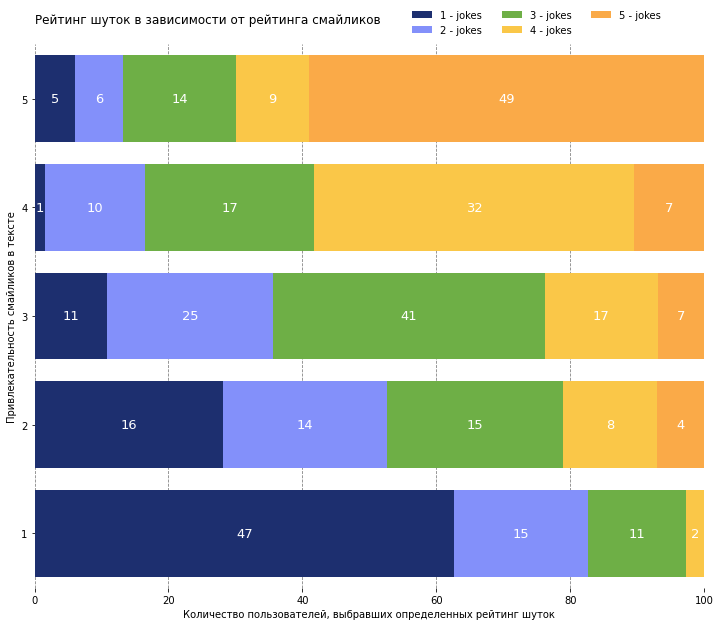

In [ ]:
fields = ['Q7_1','Q7_2','Q7_3','Q7_4', 'Q7_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - jokes', '2 - jokes', '3 - jokes', '4 - jokes', '5 - jokes']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_emoticon_by_jokes_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_emoticon_by_jokes_perc_h.index + 1, sum_emoticon_by_jokes_perc_h[name], left = left, color=colors[idx])
    left = left + sum_emoticon_by_jokes_perc_h[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], labels=['%.0f' % e if e != 0 else '' for e in sum_emoticon_by_jokes_h.iloc[:, i+1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Рейтинг шуток в зависимости от рейтинга смайликов\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность смайликов в тексте')
plt.xlabel('Количество пользователей, выбравших определенных рейтинг шуток')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

В сравнении с интересными фактами тут прослеживается тенденция, что если пользователь не любит смайлики, то он и против шуток. Так, 62.67% составляют пользователи, которые к шуткам и смайликам относятся негативно одновременно, в интересных фактах эта категория составляет 13.33% от всех, кто проголосовал за смайлики рейтингом 1. 

Также кто негативно относится к смайликам, вообще никто из них не выбрал рейтинг 5 для шуток. 

#### Орфография и т.д. в зависимости от смайликов 

In [ ]:
emoticon_gr_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q5', 'Q6'], as_index=False)['Q5'].sum()

# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
emoticon_gr_h['Q5'] = emoticon_gr_h['Q5'] // 20
emoticon_gr_h = pd.get_dummies(emoticon_gr_h.astype(str), columns = ['Q6'])

# количество пользователей (RESPONDENT_ID), которые ответили на эмодзи "Q5" и выбрали соответствующий из "Q6_i" ответ по поводу грамматики и т.д.
sum_emoticon_by_gr_h = emoticon_gr_h.groupby(by=['Q5', 'Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5'], as_index=False).count()
sum_emoticon_by_gr_h.head(5)

,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,RESPONDENT_ID
0,1,0,0,0,0,1,56
1,1,0,0,0,1,0,7
2,1,0,0,1,0,0,6
3,1,0,1,0,0,0,2
4,1,1,0,0,0,0,4


In [ ]:
sum_emoticon_by_gr_h.iloc[:, 1:6] = sum_emoticon_by_gr_h.iloc[:, 1:6].apply(lambda x: x * sum_emoticon_by_gr_h.iloc[:,6])
sum_emoticon_by_gr_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по смайликам соответствует количество респондентов, которые выбрали именно этот score для смайликов
# и дальше эти пользователи расписаны согласно их предпочтению по грамматике и т.д.
sum_emoticon_by_gr_h = sum_emoticon_by_gr_h.groupby(by='Q5', as_index=False).sum()
sum_emoticon_by_gr_h

,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5
0,1,4.0,2.0,6.0,7.0,56.0
1,2,2.0,3.0,7.0,7.0,38.0
2,3,4.0,0.0,10.0,26.0,61.0
3,4,2.0,2.0,4.0,20.0,39.0
4,5,5.0,2.0,7.0,9.0,60.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_emoticon_by_gr_perc_h = sum_emoticon_by_gr_h.copy()
sum_emoticon_by_gr_perc_h['total'] = sum_emoticon_by_gr_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_emoticon_by_gr_perc_h)
sum_emoticon_by_gr_perc_h.iloc[:, 1:6] = sum_emoticon_by_gr_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_emoticon_by_gr_perc_h.iloc[:, 6] * 100, 2) )
sum_emoticon_by_gr_perc_h

  Q5  Q6_1  Q6_2  Q6_3  Q6_4  Q6_5  total
0  1   4.0   2.0   6.0   7.0  56.0   75.0
1  2   2.0   3.0   7.0   7.0  38.0   57.0
2  3   4.0   0.0  10.0  26.0  61.0  101.0
3  4   2.0   2.0   4.0  20.0  39.0   67.0
4  5   5.0   2.0   7.0   9.0  60.0   83.0


,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,total
0,1,5.33,2.67,8.00,9.33,74.67,75.0
1,2,3.51,5.26,12.28,12.28,66.67,57.0
2,3,3.96,0.00,9.90,25.74,60.40,101.0
3,4,2.99,2.99,5.97,29.85,58.21,67.0
4,5,6.02,2.41,8.43,10.84,72.29,83.0


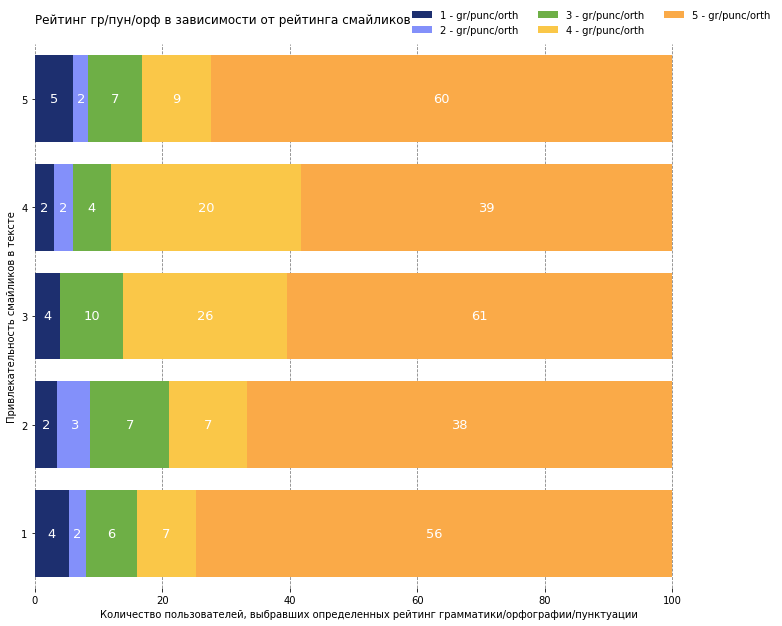

In [ ]:
fields = ['Q6_1','Q6_2','Q6_3','Q6_4', 'Q6_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - gr/punc/orth', '2 - gr/punc/orth', '3 - gr/punc/orth', '4 - gr/punc/orth', '5 - gr/punc/orth']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_emoticon_by_gr_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_emoticon_by_gr_perc_h.index + 1, sum_emoticon_by_gr_perc_h[name], left = left, color=colors[idx])
    left = left + sum_emoticon_by_gr_perc_h[name]


for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_emoticon_by_gr_h.iloc[:, i + 1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Рейтинг гр/пун/орф в зависимости от рейтинга смайликов\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность смайликов в тексте')
plt.xlabel('Количество пользователей, выбравших определенных рейтинг грамматики/орфографии/пунктуации')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Единственное, что тут прослеживается, - важность грамматики, пунктуации, орфографии у всех рейтингов смайликов. Какой-то явной тенденции нет. 

#### Большой текст без разбиений в зависимости от смайликов 

In [ ]:
emoticon_text_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q5', 'Q8'], as_index=False)['Q5'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
emoticon_text_h['Q5'] = emoticon_text_h['Q5'] // 20
emoticon_text_h = pd.get_dummies(emoticon_text_h.astype(str), columns = ['Q8'])

# количество пользователей (RESPONDENT_ID), которые ответили на эмодзи "Q5" и выбрали соответствующий из "Q8_i" ответ по поводу текста без разбиений
sum_emoticon_by_text_h = emoticon_text_h.groupby(by=['Q5', 'Q8_1', 'Q8_2', 'Q8_3', 'Q8_4', 'Q8_5'], as_index=False).count()
sum_emoticon_by_text_h.head(5)

,Q5,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,RESPONDENT_ID
0,1,0,0,0,0,1,31
1,1,0,0,0,1,0,9
2,1,0,0,1,0,0,21
3,1,0,1,0,0,0,6
4,1,1,0,0,0,0,8


In [ ]:
sum_emoticon_by_text_h.iloc[:, 1:6] = sum_emoticon_by_text_h.iloc[:, 1:6].apply(lambda x: x * sum_emoticon_by_text_h.iloc[:,6])
sum_emoticon_by_text_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по смайликам соответствует количество респондентов, которые выбрали именно этот score для смайкликов
# и дальше эти пользователи расписаны согласно их предпочтению по тексту без разбиений
sum_emoticon_by_text_h = sum_emoticon_by_text_h.groupby(by='Q5', as_index=False).sum()
sum_emoticon_by_text_h

,Q5,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5
0,1,8.0,6.0,21.0,9.0,31.0
1,2,4.0,8.0,17.0,12.0,16.0
2,3,8.0,9.0,43.0,15.0,26.0
3,4,3.0,9.0,22.0,18.0,15.0
4,5,7.0,7.0,23.0,8.0,38.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_emoticon_by_text_perc_h = sum_emoticon_by_text_h.copy()
sum_emoticon_by_text_perc_h['total'] = sum_emoticon_by_text_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_emoticon_by_text_perc_h)
sum_emoticon_by_text_perc_h.iloc[:, 1:6] = sum_emoticon_by_text_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_emoticon_by_text_perc_h.iloc[:, 6] * 100, 2) )
sum_emoticon_by_text_perc_h

  Q5  Q8_1  Q8_2  Q8_3  Q8_4  Q8_5  total
0  1   8.0   6.0  21.0   9.0  31.0   75.0
1  2   4.0   8.0  17.0  12.0  16.0   57.0
2  3   8.0   9.0  43.0  15.0  26.0  101.0
3  4   3.0   9.0  22.0  18.0  15.0   67.0
4  5   7.0   7.0  23.0   8.0  38.0   83.0


,Q5,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,total
0,1,10.67,8.00,28.00,12.00,41.33,75.0
1,2,7.02,14.04,29.82,21.05,28.07,57.0
2,3,7.92,8.91,42.57,14.85,25.74,101.0
3,4,4.48,13.43,32.84,26.87,22.39,67.0
4,5,8.43,8.43,27.71,9.64,45.78,83.0


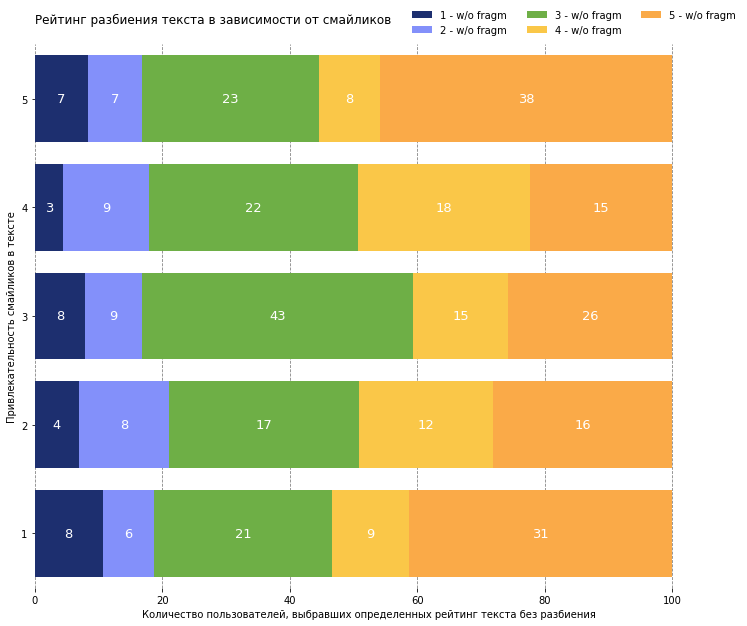

In [ ]:
fields = ['Q8_1','Q8_2','Q8_3','Q8_4', 'Q8_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - w/o fragm', '2 - w/o fragm', '3 - w/o fragm', '4 - w/o fragm', '5 - w/o fragm']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_emoticon_by_text_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_emoticon_by_text_perc_h.index + 1, sum_emoticon_by_text_perc_h[name], left = left, color=colors[idx])
    left = left + sum_emoticon_by_text_perc_h[name]

for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_emoticon_by_text_h.iloc[:, i + 1]], color='white', label_type='center', size=13)

# title, legend, labels
plt.title('Рейтинг разбиения текста в зависимости от смайликов\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность смайликов в тексте')
plt.xlabel('Количество пользователей, выбравших определенных рейтинг текста без разбиения')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Как в интересных фактах, тут такой закономерности нет, что в 1 большую часть составляют рейтинг 5 по разбиению текст.  

### Насколько вам важно, что в сообщениях соблюдены грамматика, орфография и пунктуация?

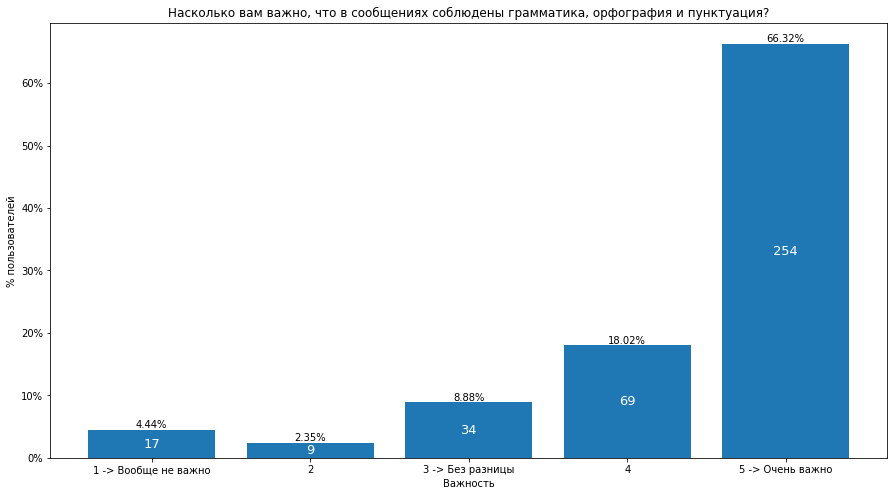

In [ ]:
gr_punc_orth_h = health_regr_merge_sorted.groupby(by='Q6', as_index=False)['RESPONDENT_ID'].count()
gr_punc_orth_h['RESPONDENT_ID'] = gr_punc_orth_h['RESPONDENT_ID'] // 20
gr_punc_orth_perc_h = gr_punc_orth_h.copy()
gr_punc_orth_list_h = gr_punc_orth_h['RESPONDENT_ID'].to_list()

# to show %
gr_punc_orth_perc_h['RESPONDENT_ID'] = round(gr_punc_orth_perc_h['RESPONDENT_ID'] / sum(gr_punc_orth_perc_h['RESPONDENT_ID']) * 100, 2)
gr_punc_orth_perc_list_h = gr_punc_orth_perc_h['RESPONDENT_ID'].to_list()

# заполняем пропуски: если в какой-то группе 0 пользователей, добавляем 0 в список
for i in range(5):
  if (i + 1) not in gr_punc_orth_h['Q6'].to_list():
    gr_punc_orth_list_h.insert(i, 0)
    gr_punc_orth_perc_list_h.insert(i, 0)


graph_gr_punc_orth(gr_punc_orth_perc_list_h, gr_punc_orth_list_h)

#### Грамматика, пунктуация, орфография в зависимости от шуток

In [ ]:
gr_jokes_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q6', 'Q7'], as_index=False)['Q6'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
gr_jokes_h['Q6'] = gr_jokes_h['Q6'] // 20
gr_jokes_h = pd.get_dummies(gr_jokes_h.astype(str), columns = ['Q7'])

# количество пользователей (RESPONDENT_ID), которые ответили на гр/пунк/шутки "Q6" и выбрали соответствующий из "Q7_i" ответ по поводу шуток
sum_gr_by_jokes_h = gr_jokes_h.groupby(by=['Q6', 'Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5'], as_index=False).count()
sum_gr_by_jokes_h.head(9)

,Q6,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,RESPONDENT_ID
0,1,0,0,0,0,1,4
1,1,0,0,0,1,0,2
2,1,0,0,1,0,0,3
3,1,0,1,0,0,0,3
4,1,1,0,0,0,0,5
5,2,0,0,0,1,0,3
6,2,0,1,0,0,0,2
7,2,1,0,0,0,0,4
8,3,0,0,0,0,1,5


In [ ]:
sum_gr_by_jokes_h.iloc[:, 1:6] = sum_gr_by_jokes_h.iloc[:, 1:6].apply(lambda x: x * sum_gr_by_jokes_h.iloc[:,6])
sum_gr_by_jokes_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по грамматике и т.д. соответствует количество респондентов, которые выбрали именно этот score по грамматике
# и дальше эти пользователи расписаны согласно их предпочтению по шуткам
sum_gr_by_jokes_h = sum_gr_by_jokes_h.groupby(by='Q6', as_index=False).sum()
sum_gr_by_jokes_h

,Q6,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5
0,1,5.0,3.0,3.0,2.0,4.0
1,2,4.0,2.0,0.0,3.0,0.0
2,3,6.0,8.0,11.0,4.0,5.0
3,4,5.0,11.0,24.0,24.0,5.0
4,5,60.0,46.0,60.0,35.0,53.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_gr_by_jokes_perc_h = sum_gr_by_jokes_h.copy()
sum_gr_by_jokes_perc_h['total'] = sum_gr_by_jokes_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_gr_by_jokes_perc_h)
sum_gr_by_jokes_perc_h.iloc[:, 1:6] = sum_gr_by_jokes_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_gr_by_jokes_perc_h.iloc[:, 6] * 100, 2) )
sum_gr_by_jokes_perc_h

  Q6  Q7_1  Q7_2  Q7_3  Q7_4  Q7_5  total
0  1   5.0   3.0   3.0   2.0   4.0   17.0
1  2   4.0   2.0   0.0   3.0   0.0    9.0
2  3   6.0   8.0  11.0   4.0   5.0   34.0
3  4   5.0  11.0  24.0  24.0   5.0   69.0
4  5  60.0  46.0  60.0  35.0  53.0  254.0


,Q6,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,total
0,1,29.41,17.65,17.65,11.76,23.53,17.0
1,2,44.44,22.22,0.00,33.33,0.00,9.0
2,3,17.65,23.53,32.35,11.76,14.71,34.0
3,4,7.25,15.94,34.78,34.78,7.25,69.0
4,5,23.62,18.11,23.62,13.78,20.87,254.0


In [ ]:
((sum_gr_by_jokes_perc_h['Q7_1'] + sum_gr_by_jokes_perc_h['Q7_2'])/2).mean()

21.982

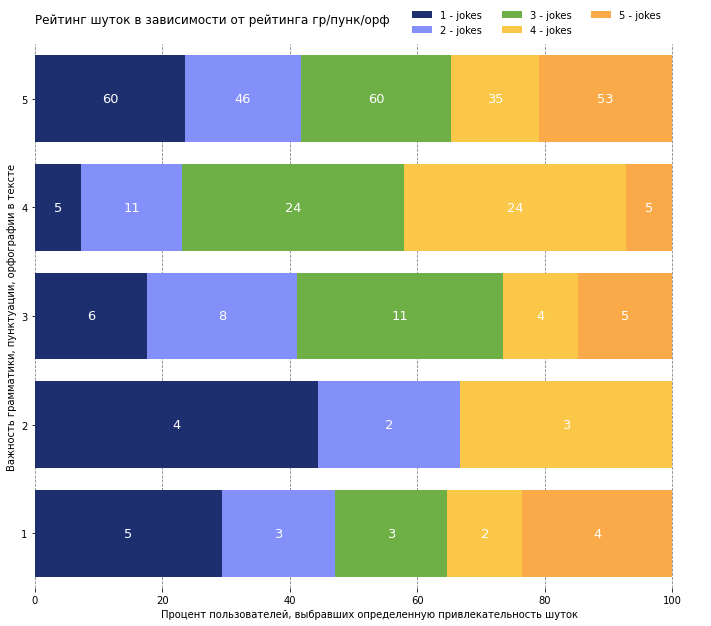

In [ ]:
fields = ['Q7_1','Q7_2','Q7_3','Q7_4', 'Q7_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - jokes', '2 - jokes', '3 - jokes', '4 - jokes', '5 - jokes']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_gr_by_jokes_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_gr_by_jokes_perc_h.index + 1, sum_gr_by_jokes_perc_h[name], left = left, color=colors[idx])
    #plt.text(x=sum_gr_by_jokes[name] + 1, y=(sum_gr_by_jokes_perc.index + 1), color="w", verticalalignment="center", horizontalalignment="left", size=18)
    left = left + sum_gr_by_jokes_perc_h[name]

for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_gr_by_jokes_h.iloc[:, i + 1]], color='white', label_type='center', size=13)
  
# title, legend, labels
plt.title('Рейтинг шуток в зависимости от рейтинга гр/пунк/орф\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Важность грамматики, пунктуации, орфографии в тексте')
plt.xlabel('Процент пользователей, выбравших определенную привлекательность шуток')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Более 23% пользователей, которые считают грамматику важной, очень негативно относятся к шуткам. В интересных фактах этот процент составляет 4. 

А у тех, кто не очень серьезно относится к грамматике и т.д., 44.4% и 29% пользователей негативно относятся к шуткам, когда как в интересных фактах таких вообще нет. 

В интересных фактах очень негативно относятся к шуткам только те, кто предпочитает хорошо поставленную грамматику, орфографию и пунктуацию, а в здравоохранении такие люди есть во всех рейтингах. 

#### Грамматика, пунктуация, орфография в зависимости от текста без разбиений

In [ ]:
gr_text_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q6', 'Q8'], as_index=False)['Q6'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
gr_text_h['Q6'] = gr_text_h['Q6'] // 20
gr_text_h = pd.get_dummies(gr_text_h.astype(str), columns = ['Q8'])

# количество пользователей (RESPONDENT_ID), которые ответили на гр/пунк/шутки "Q6" и выбрали соответствующий из "Q7_i" ответ по поводу шуток
sum_gr_by_text_h = gr_text_h.groupby(by=['Q6', 'Q8_1', 'Q8_2', 'Q8_3', 'Q8_4', 'Q8_5'], as_index=False).count()
sum_gr_by_text_h.head(9)

,Q6,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,RESPONDENT_ID
0,1,0,0,0,0,1,7
1,1,0,0,0,1,0,2
2,1,0,0,1,0,0,4
3,1,0,1,0,0,0,1
4,1,1,0,0,0,0,3
5,2,0,0,0,0,1,1
6,2,0,0,0,1,0,1
7,2,0,0,1,0,0,4
8,2,0,1,0,0,0,2


In [ ]:
sum_gr_by_text_h.iloc[:, 1:6] = sum_gr_by_text_h.iloc[:, 1:6].apply(lambda x: x * sum_gr_by_text_h.iloc[:,6])
sum_gr_by_text_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по грамматике и т.д. соответствует количество респондентов, которые выбрали именно этот score по грамматике
# и дальше эти пользователи расписаны согласно их предпочтению по тексту без разбиений
sum_gr_by_text_h = sum_gr_by_text_h.groupby(by='Q6', as_index=False).sum()
sum_gr_by_text_h

,Q6,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5
0,1,3.0,1.0,4.0,2.0,7.0
1,2,1.0,2.0,4.0,1.0,1.0
2,3,3.0,1.0,16.0,6.0,8.0
3,4,2.0,12.0,26.0,19.0,10.0
4,5,21.0,23.0,76.0,34.0,100.0


In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_gr_by_text_perc_h = sum_gr_by_text_h.copy()
sum_gr_by_text_perc_h['total'] = sum_gr_by_text_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_gr_by_text_perc_h)
sum_gr_by_text_perc_h.iloc[:, 1:6] = sum_gr_by_text_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_gr_by_text_perc_h.iloc[:, 6] * 100, 2) )
sum_gr_by_text_perc_h


  Q6  Q8_1  Q8_2  Q8_3  Q8_4   Q8_5  total
0  1   3.0   1.0   4.0   2.0    7.0   17.0
1  2   1.0   2.0   4.0   1.0    1.0    9.0
2  3   3.0   1.0  16.0   6.0    8.0   34.0
3  4   2.0  12.0  26.0  19.0   10.0   69.0
4  5  21.0  23.0  76.0  34.0  100.0  254.0


,Q6,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,total
0,1,17.65,5.88,23.53,11.76,41.18,17.0
1,2,11.11,22.22,44.44,11.11,11.11,9.0
2,3,8.82,2.94,47.06,17.65,23.53,34.0
3,4,2.90,17.39,37.68,27.54,14.49,69.0
4,5,8.27,9.06,29.92,13.39,39.37,254.0


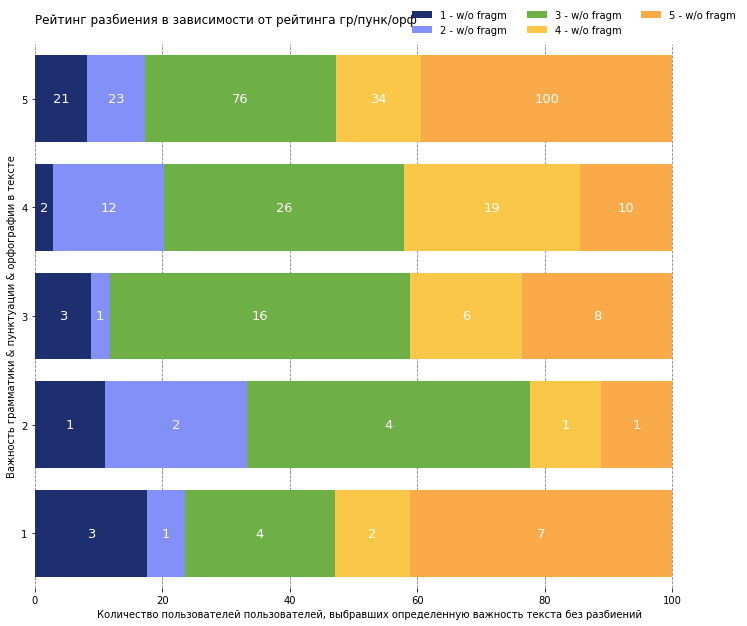

In [ ]:
fields = ['Q8_1','Q8_2','Q8_3','Q8_4', 'Q8_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - w/o fragm', '2 - w/o fragm', '3 - w/o fragm', '4 - w/o fragm', '5 - w/o fragm']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_gr_by_text_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_gr_by_text_perc_h.index + 1, sum_gr_by_text_perc_h[name], left = left, color=colors[idx])
    left = left + sum_gr_by_text_perc_h[name]

for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_gr_by_text_h.iloc[:, i + 1]], color='white', label_type='center', size=13)


# title, legend, labels
plt.title('Рейтинг разбиения в зависимости от рейтинга гр/пунк/орф\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Важность грамматики & пунктуации & орфографии в тексте')
plt.xlabel('Количество пользователей пользователей, выбравших определенную важность текста без разбиений')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

Кто очень серьезно относится к грамматике в 39.37% очень положительно относятся к тексту без разбиений. В интересных фактах этот процент составляет 30.88%. 

### Насколько вам нравится, что в сообщениях присутствуют шутки, остроумные ответы?

   Q7
0  80
1  70
2  98
3  68
4  67


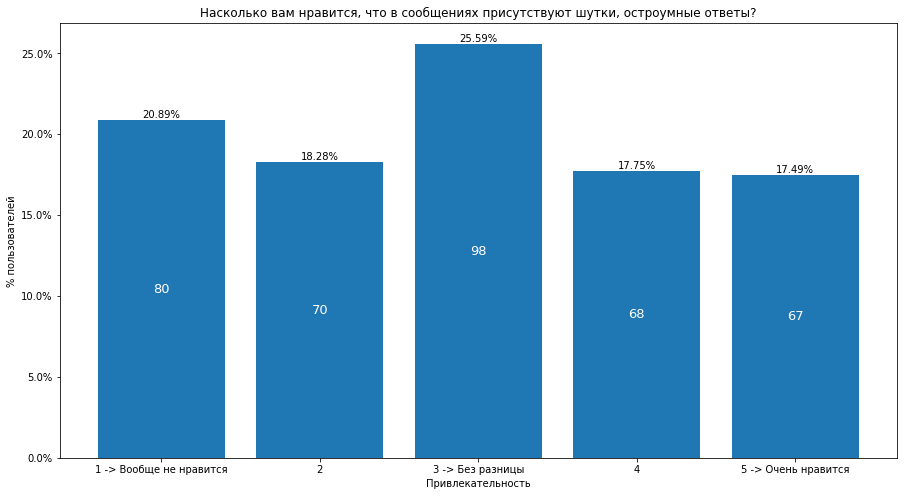

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к шуткам
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
jokes_h = health_regr_merge_sorted.groupby(by='Q7', as_index=False)['Q7'].count() // 20
print(jokes_h)
# to show %
jokes_perc_h = jokes_h.copy()
jokes_perc_h['Q7'] = round(jokes_perc_h['Q7'] / sum(jokes_perc_h['Q7']) * 100, 2)

graph_jokes(jokes_perc_h['Q7'], jokes_h['Q7'])

Тут прослеживается яркое отличие от интересных фактов. 

Намного больший процент составляют пользователи, которые против шуток в здравоохранении, это 39.17%, когда как без разницы 25.29% пользователей. Такая же доля приходится на людей, которым нравятся шутки, это 35.24%. 

А в интересных фактах не нравятся шутки лишь 8.57% пользователей. 

#### Отношение к шуткам в зависимости от разбиения текста

In [ ]:
jokes_text_h = health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q7', 'Q8'], as_index=False)['Q7'].sum()
# так как у каждого респондента 20 строчек с разными значениями только для конджоинт анализа
jokes_text_h['Q7'] = jokes_text_h['Q7'] // 20
jokes_text_h = pd.get_dummies(jokes_text_h.astype(str), columns = ['Q8'])

# количество пользователей (RESPONDENT_ID), которые ответили на шутки "Q7" и выбрали соответствующий из "Q8_i" ответ по поводу текста без разбиений
sum_jokes_by_text_h = jokes_text_h.groupby(by=['Q7', 'Q8_1', 'Q8_2', 'Q8_3', 'Q8_4', 'Q8_5'], as_index=False).count()
sum_jokes_by_text_h.head(5)

,Q7,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,RESPONDENT_ID
0,1,0,0,0,0,1,28
1,1,0,0,0,1,0,9
2,1,0,0,1,0,0,25
3,1,0,1,0,0,0,7
4,1,1,0,0,0,0,11


In [ ]:
sum_jokes_by_text_h.iloc[:, 1:6] = sum_jokes_by_text_h.iloc[:, 1:6].apply(lambda x: x * sum_jokes_by_text_h.iloc[:,6])
sum_jokes_by_text_h.drop('RESPONDENT_ID', inplace=True, axis=1)

# таблица, где каждому score по шуткам соответствует количество респондентов, которые выбрали именно этот score по шуткам
# и дальше эти пользователи расписаны согласно их предпочтению по тексту без разбиений
sum_jokes_by_text_h = sum_jokes_by_text_h.groupby(by='Q7', as_index=False).sum()
sum_jokes_by_text_h

,Q7,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5
0,1,11.0,7.0,25.0,9.0,28.0
1,2,6.0,12.0,19.0,12.0,21.0
2,3,6.0,7.0,40.0,16.0,29.0
3,4,2.0,9.0,21.0,20.0,16.0
4,5,5.0,4.0,21.0,5.0,32.0


In [ ]:
# проверка
sum_jokes_by_text_h.iloc[:, 1:6].sum(axis=0)

Q8_1     30.0
Q8_2     39.0
Q8_3    126.0
Q8_4     62.0
Q8_5    126.0
dtype: float64

In [ ]:
# посчитаем в процентах эту таблицу в зависимости от общего количества пользователей, выбравших определенную важность гр/пункт/орф
sum_jokes_by_text_perc_h = sum_jokes_by_text_h.copy()
sum_jokes_by_text_perc_h['total'] = sum_jokes_by_text_perc_h.iloc[:, 1:6].sum(axis=1)
print(sum_jokes_by_text_perc_h)
sum_jokes_by_text_perc_h.iloc[:, 1:6] = sum_jokes_by_text_perc_h.iloc[:, 1:6].apply(
    lambda x: round(x / sum_jokes_by_text_perc_h.iloc[:, 6] * 100, 2) )
sum_jokes_by_text_perc_h


  Q7  Q8_1  Q8_2  Q8_3  Q8_4  Q8_5  total
0  1  11.0   7.0  25.0   9.0  28.0   80.0
1  2   6.0  12.0  19.0  12.0  21.0   70.0
2  3   6.0   7.0  40.0  16.0  29.0   98.0
3  4   2.0   9.0  21.0  20.0  16.0   68.0
4  5   5.0   4.0  21.0   5.0  32.0   67.0


,Q7,Q8_1,Q8_2,Q8_3,Q8_4,Q8_5,total
0,1,13.75,8.75,31.25,11.25,35.00,80.0
1,2,8.57,17.14,27.14,17.14,30.00,70.0
2,3,6.12,7.14,40.82,16.33,29.59,98.0
3,4,2.94,13.24,30.88,29.41,23.53,68.0
4,5,7.46,5.97,31.34,7.46,47.76,67.0


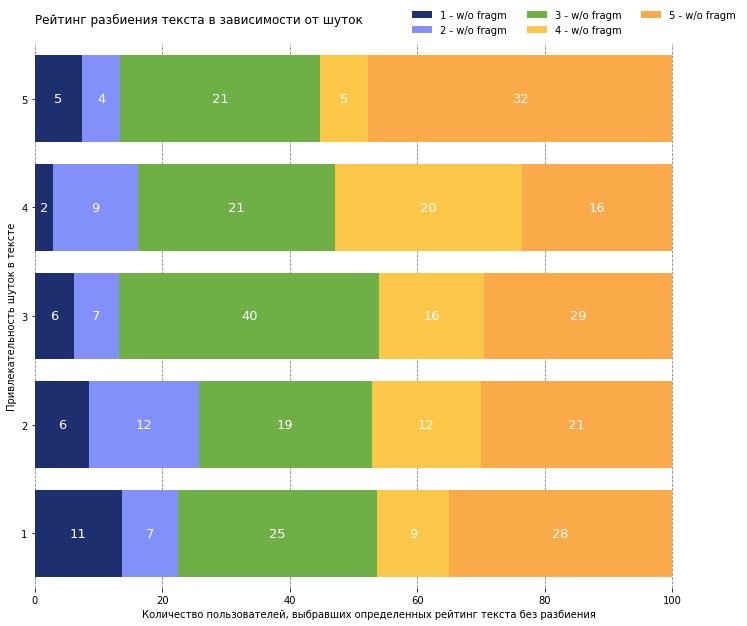

In [ ]:
fields = ['Q8_1','Q8_2','Q8_3','Q8_4', 'Q8_5']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748', '#faaa48']
labels = ['1 - w/o fragm', '2 - w/o fragm', '3 - w/o fragm', '4 - w/o fragm', '5 - w/o fragm']
# figure and axis
fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
left = len(sum_jokes_by_text_perc_h) * [0]
for idx, name in enumerate(fields):
    plt.barh(sum_jokes_by_text_perc_h.index + 1, sum_jokes_by_text_perc_h[name], left = left, color=colors[idx])
    left = left + sum_jokes_by_text_perc_h[name]

for i in range(len(ax.containers)):
  ax.bar_label(ax.containers[i], 
               labels=['%.0f' % e if e != 0 else '' for e in sum_jokes_by_text_h.iloc[:, i + 1] ], color='white', label_type='center', size=13)

# title, legend, labels
plt.title('Рейтинг разбиения текста в зависимости от шуток\n', loc='left')
plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=3, frameon=False)
plt.ylabel('Привлекательность шуток в тексте')
plt.xlabel('Количество пользователей, выбравших определенных рейтинг текста без разбиения')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(0.5, ax.get_yticks()[-1] -0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.show()

В здравоохранении 47.76% пользователей, кто проголосовал за шутки, против разбиения текста на сообщения. Однако в интересных фактах примерно такой же процент (55.56%) составляют пользователи, которые очень негативно относятся к шуткам. 

### Предпочтение к одному сообщению без разбиения на части или с разбиением.

Я предпочитаю, чтобы вся информация была в одном сообщении без разбиения на части.

    Q8
0   30
1   39
2  126
3   62
4  126


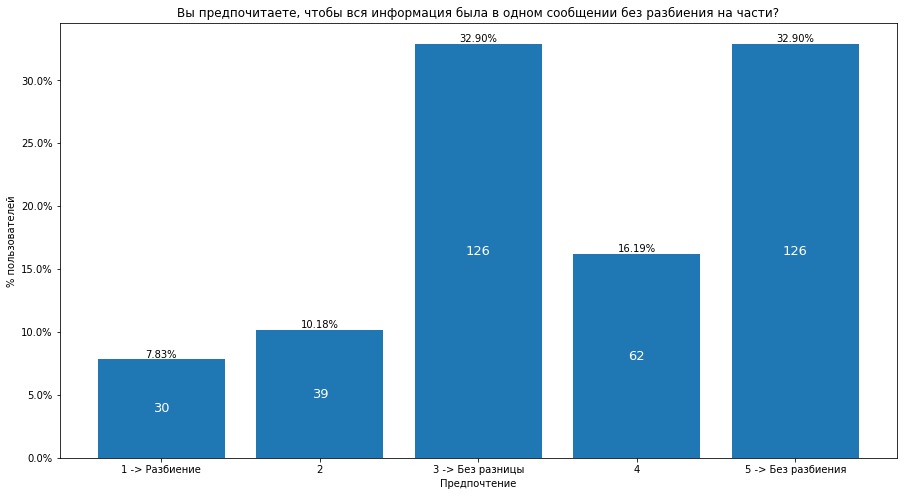

In [ ]:
# считаем, сколько пользователей отнесли себя в каждую из категорий по предпочтению к разбиению сообщения
# каждый результат делим нацело на 20 ввиду упомянутых ранее причин
large_text_h = health_regr_merge_sorted.groupby(by='Q8', as_index=False)['Q8'].count() // 20
print(large_text_h)
# to show %
large_text_perc_h = large_text_h.copy()
large_text_perc_h['Q8'] = round(large_text_perc_h['Q8'] / sum(large_text_perc_h['Q8']) * 100, 2)



graph_large_text(large_text_perc_h['Q8'], large_text_h['Q8'])

В интересных фактах все же лидирует вариант "без разницы" с 31.69%, а затем 5 - 24.16%. 

Однако в здравоохранении эти два варианта вообще не отличаются: 32.90%. За разбиение проголосовало меньшее количество людей. Может быть люди любят более сжатую информацию, когда она организационная? (Прикрепить Анин отзыв, что хочется быстрее записаться, а не растягивать запись, задавая каждый вопрос по отдельности. )

### Все четыре ответа про атрибуты в одном графике


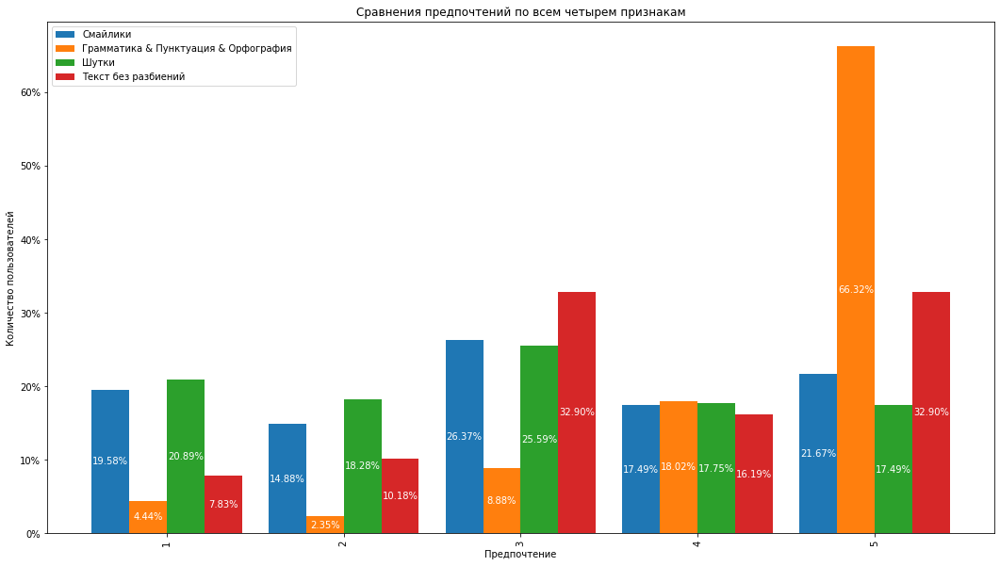

In [ ]:
# create data
df_h = pd.DataFrame([['1', emoticons_perc_h[0], gr_punc_orth_perc_list_h[0], jokes_perc_h['Q7'][0], large_text_perc_h['Q8'][0]],
                   ['2', emoticons_perc_h[1], gr_punc_orth_perc_list_h[1], jokes_perc_h['Q7'][1], large_text_perc_h['Q8'][1]],
                   ['3', emoticons_perc_h[2], gr_punc_orth_perc_list_h[2], jokes_perc_h['Q7'][2], large_text_perc_h['Q8'][2]],
                   ['4', emoticons_perc_h[3], gr_punc_orth_perc_list_h[3], jokes_perc_h['Q7'][3], large_text_perc_h['Q8'][3]],
                   ['5', emoticons_perc_h[4], gr_punc_orth_perc_list_h[4], jokes_perc_h['Q7'][4], large_text_perc_h['Q8'][4]]],
                  columns=['Предпочтение', 'Смайлики', 'Грамматика & Пунктуация & Орфография', 'Шутки', 'Текст без разбиений'])

  
# plot grouped bar chart
ax = df_h.plot(x='Предпочтение',
             ylabel='Количество пользователей',
        kind='bar',
        stacked=False,
        figsize = (18,10),
        width=0.85,
        title='Сравнения предпочтений по всем четырем признакам')

ax.bar_label(ax.containers[0], labels=['%.2f%%' % e for e in df_h['Смайлики']], color='white', label_type='center')
ax.bar_label(ax.containers[1], labels=['%.2f%%' % e for e in df_h['Грамматика & Пунктуация & Орфография']], color='white', label_type='center')
ax.bar_label(ax.containers[2], labels=['%.2f%%' % e for e in df_h['Шутки']], color='white', label_type='center')
ax.bar_label(ax.containers[3], labels=['%.2f%%' % e for e in df_h['Текст без разбиений']], color='white', label_type='center')

ax.yaxis.set_major_formatter(mtick.PercentFormatter())

**Эмодзи**: какой-то явной тенденции по выбору замечено не было. Однако более популярны ответы "Без разницы", 1 и 5 - очень нравится с вероятностью выбора 26.37%, 19.58% и 21.67% соответственно. 

**Грамматика & Пунктуация & Орфография**: большинство пользователей выбирают либо 4, либо 5 - очень важно с 18.02% и 66.32% соответственно. Остальные варианты ответа составляют лишь 15.67% от всех выборки. 

**Шутки**: лишь 39.17% пользователей негативно относятся к шуткам. Остальные либо выбирают "Без разницы" с вероятностью 25.59%, либо выбирают 4/5 - 17.75% и 17.49% соответственно. То есть шутки нравятся в меньшей мере по сравнению с интересными фактами. 

**Текст без разбиений**: единственное, что сильно выделяется, что 32.90% пользователям без разницы будет ли текст весь написан в одном блоке сообщения, либо в нескольких, либо жетско против разбиения. 


## Проверка гипотез

### Зависимость категориальных переменных, используя критерий $\chi^2$

$H_0$ - категориальные переменные независимы <br>
$H_1$ - категориальные переменные зависимы. <br>
На вход должна подаваться таблица сопряженности двух рассматриваемых величин.

#### Соц.сети VS остальное

In [ ]:
health_regr_merge_sorted_q3 = health_regr_merge_sorted.copy()
health_regr_merge_sorted_q3['Q3'] = health_regr_merge_sorted_q3['Q3_O1'] + health_regr_merge_sorted_q3['Q3_O2'] * 2 + health_regr_merge_sorted_q3['Q3_O3_3'] * 3  + health_regr_merge_sorted_q3['Q3_O4_3_5'] * 4 + health_regr_merge_sorted_q3['Q3_O5_5'] * 5
health_regr_merge_sorted_q3.head()

,RESPONDENT_ID,SURVEY_ID,CHOICE_INDICATOR,RESPONDENT_CITY,RESPONDENT_COUNTRY,RESPONDENT_DEVICE_USED_IN_SURVEY,RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS,RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY,Q3_O1,Q3_O2,...,Q3_O5_5,Q5,Q6,Q7,Q8,emoticons,gr_pun_orth,jokes,large_text,Q3
0,120457015,4,0,Troitsk,Russia,desktop,131,0,0,0,...,1,3,5,5,3,0,0,1,1,5
1,120457015,4,1,Troitsk,Russia,desktop,131,0,0,0,...,1,3,5,5,3,0,1,1,0,5
2,120457015,4,0,Troitsk,Russia,desktop,131,0,0,0,...,1,3,5,5,3,0,1,0,0,5
3,120457015,4,1,Troitsk,Russia,desktop,131,0,0,0,...,1,3,5,5,3,1,1,1,0,5
4,120457015,4,0,Troitsk,Russia,desktop,131,0,0,0,...,1,3,5,5,3,0,1,0,0,5


In [ ]:
xi2(health_regr_merge_sorted_q3['Q3'], health_regr_merge_sorted_q3['Q5'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  4.187425903520696e-37


(216.17023929112452, 4.187425903520696e-37, Q5     1     2     3     4     5
 Q3                              
 1     20    20    60    20    20
 2     20     0    20    40    40
 3     60     0    20    40    40
 4    100     0   100    60    80
 5   1300  1120  1820  1180  1480)

То есть в зависимости от опыта использования социальными сетями разное количество пользователей выбирают определенный рейтинг за смайлики. [Ссылка хи2](https://www.jmp.com/en_au/statistics-knowledge-portal/chi-square-test/chi-square-test-of-independence.html)

In [ ]:
xi2(health_regr_merge_sorted_q3['Q3'], health_regr_merge_sorted_q3['Q6'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  3.48104528221012e-103


(533.0367715612227, 3.48104528221012e-103, Q6    1    2    3     4     5
 Q3                           
 1     0    0   20    40    80
 2    20    0   40    40    20
 3    40    0    0    20   100
 4    20   20   80    20   200
 5   260  160  540  1260  4680)

In [ ]:
xi2(health_regr_merge_sorted_q3['Q3'], health_regr_merge_sorted_q3['Q7'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  2.7015895040641857e-31


(187.44007888346115, 2.7015895040641857e-31, Q7     1     2     3     4     5
 Q3                              
 1     20    40    40    20    20
 2     20    20     0    60    20
 3     40    40    20    40    20
 4    100    60    80    20    80
 5   1420  1240  1820  1220  1200)

In [ ]:
xi2(health_regr_merge_sorted_q3['Q3'], health_regr_merge_sorted_q3['Q8'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  6.970962052570891e-87


(455.78224043792125, 6.970962052570891e-87, Q8    1    2     3     4     5
 Q3                            
 1     0   60    60     0    20
 2    20    0    40    20    40
 3    40   20    60    40     0
 4    60   60   120    40    60
 5   480  640  2240  1140  2400)

#### Эмодзи VS Шутки

In [ ]:
table = health_regr_merge_sorted[['Q5', 'Q6']].values

#построение таблицы сопряженности
df_new=pd.crosstab(health_regr_merge_sorted['Q5'],health_regr_merge_sorted['Q6'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new=df_new.fillna(0)
df_new

Q6,1,2,3,4,5
Q5,,,,,
1,80,40,120,140,1120
2,40,60,140,140,760
3,80,0,200,520,1220
4,40,40,80,400,780
5,100,40,140,180,1200


In [ ]:
# probability of false positive error (ошибка первого рода)
alpha = .05

In [ ]:
stat1, p1, dof, expected = chi2_contingency(df_new)
if p1 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p1)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p1)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  2.533360940375286e-95


In [ ]:
stat1

495.8217673516177

In [ ]:
health_regr_merge_sorted['emoticons']

0       0
1       0
2       0
3       1
4       0
       ..
7655    0
7656    0
7657    1
7658    0
7659    1
Name: emoticons, Length: 7660, dtype: int64

In [ ]:
xi2(health_regr_merge_sorted['emoticons'], health_regr_merge_sorted['jokes'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  3.7164885157132607e-29


(125.62388623414643, 3.7164885157132607e-29, jokes         0     1
 emoticons            
 0          2338  1531
 1          1806  1985)

**Вывод:** переменные Смайлики и Шутки являются зависимыми. 

#### Эмодзи VS Орфография & Грамматика & Пунктуация

In [ ]:
table1 = health_regr_merge_sorted[['Q5', 'Q7']].values

#построение таблицы сопряженности
df_new1=pd.crosstab(health_regr_merge_sorted['Q5'],health_regr_merge_sorted['Q7'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new1=df_new1.fillna(0)
df_new1

Q7,1,2,3,4,5
Q5,,,,,
1,940,300,220,40,0
2,320,280,300,160,80
3,220,500,820,340,140
4,20,200,340,640,140
5,100,120,280,180,980


In [ ]:
alpha = .05
stat2, p2, dof, expected = chi2_contingency(df_new1)
if p2 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p2)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p2)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  0.0


In [ ]:
stat2

5349.800600764475

In [ ]:
xi2(health_regr_merge_sorted['emoticons'], health_regr_merge_sorted['gr_pun_orth'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  8.55257265497744e-21


(87.47097455773272, 8.55257265497744e-21, gr_pun_orth     0     1
 emoticons              
 0            2366  1503
 1            1915  1876)

#### Эмодзи VS Текст без разбиений

In [ ]:
table2 = health_regr_merge_sorted[['Q5', 'Q8']].values

#построение таблицы сопряженности
df_new2=pd.crosstab(health_regr_merge_sorted['Q5'],health_regr_merge_sorted['Q8'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new2=df_new2.fillna(0)
df_new2

Q8,1,2,3,4,5
Q5,,,,,
1,160,120,420,180,620
2,80,160,340,240,320
3,160,180,860,300,520
4,60,180,440,360,300
5,140,140,460,160,760


In [ ]:
alpha = .05
stat3, p3, dof, expected = chi2_contingency(df_new2)
if p3 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p3)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p3)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  5.288622258417288e-105


In [ ]:
stat3

541.6338084355142

In [ ]:
xi2(health_regr_merge_sorted['emoticons'], health_regr_merge_sorted['large_text'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  8.93630047079642e-25


(105.61908212764465, 8.93630047079642e-25, large_text     0     1
 emoticons             
 0           2475  1394
 1           1985  1806)

#### Шутки VS Орфография & Грамматика & Пунктуация

In [ ]:
table4 = health_regr_merge_sorted[['Q6', 'Q7']].values

#построение таблицы сопряженности
df_new4=pd.crosstab(health_regr_merge_sorted['Q6'],health_regr_merge_sorted['Q7'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new4=df_new4.fillna(0)
df_new4

Q7,1,2,3,4,5
Q6,,,,,
1,100,60,60,40,80
2,80,40,0,60,0
3,120,160,220,80,100
4,100,220,480,480,100
5,1200,920,1200,700,1060


In [ ]:
alpha = .05
stat4, p4, dof, expected = chi2_contingency(df_new4)
if p4 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p4)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p4)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  8.846092123165907e-163


In [ ]:
stat4

813.3798167679961

In [ ]:
xi2(health_regr_merge_sorted['gr_pun_orth'], health_regr_merge_sorted['jokes'])

Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.39325568017963064


(0.7288516088761898, 0.39325568017963064, jokes           0     1
 gr_pun_orth            
 0            2297  1984
 1            1847  1532)

#### Шутки VS Текст без разбиений

In [ ]:
table6 = health_regr_merge_sorted[['Q7', 'Q8']].values

#построение таблицы сопряженности
df_new6=pd.crosstab(health_regr_merge_sorted['Q7'],health_regr_merge_sorted['Q8'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new6=df_new6.fillna(0)
df_new6

Q8,1,2,3,4,5
Q7,,,,,
1,220,140,500,180,560
2,120,240,380,240,420
3,120,140,800,320,580
4,40,180,420,400,320
5,100,80,420,100,640


In [ ]:
alpha = .05
stat5, p5, dof, expected = chi2_contingency(df_new6)
if p5 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p5)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p5)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  4.871994053886641e-133


In [ ]:
stat5

673.788947853343

In [ ]:
xi2(health_regr_merge_sorted['large_text'], health_regr_merge_sorted['jokes'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  6.371890863164783e-08


(29.246874971552423, 6.371890863164783e-08, jokes          0     1
 large_text            
 0           2296  2164
 1           1848  1352)

#### Текст без разбиений VS Орфография & Грамматика & Пунктуация

In [ ]:
table5 = health_regr_merge_sorted[['Q6', 'Q8']].values

#построение таблицы сопряженности
df_new5=pd.crosstab(health_regr_merge_sorted['Q6'],health_regr_merge_sorted['Q8'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_new5=df_new5.fillna(0)
df_new5

Q8,1,2,3,4,5
Q6,,,,,
1,60,20,80,40,140
2,20,40,80,20,20
3,60,20,320,120,160
4,40,240,520,380,200
5,420,460,1520,680,2000


In [ ]:
alpha = .05
stat5, p5, dof, expected = chi2_contingency(df_new5)
if p5 < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p5)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p5)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  1.2272508366069553e-141


In [ ]:
stat5

714.2008392149513

In [ ]:
xi2(health_regr_merge_sorted['large_text'], health_regr_merge_sorted['gr_pun_orth'])

Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.510828187610677


(0.43237025241201865, 0.510828187610677, gr_pun_orth     0     1
 large_text             
 0            2478  1982
 1            1803  1397)

# Проверка гипотез независимости атрибутов (пост-ответы) у разных выборок. Они у меня независимы и категориальные. 

При сравнении каждого вопроса между двумя тематиками везде отвергли нулевую гипотезу о независимости данных. То есть в какой-то из двух тем значимость каждого признака оценивают по-разному. 

## Эмодзи

In [ ]:
# рейтинг - тематика (0 - интересные факты, 1 - здравоохранение)
facts_emoticon = pd.DataFrame(data={'Q5': facts_regr_merge_sorted_q6.groupby(by=['RESPONDENT_ID', 'Q5'], as_index=False).count()['Q5'], 
                              'topic': [0] * (len(facts_regr_merge_sorted_q6['Q5']) // 20)})

health_emoticon = pd.DataFrame(data={'Q5': health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q5'], as_index=False).count()['Q5'], 
                              'topic': [1] * (len(health_regr_merge_sorted['Q5']) // 20)})

df = pd.concat([facts_emoticon, health_emoticon], ignore_index=True)

#построение таблицы сопряженности
df_emoticon=pd.crosstab(df['Q5'],df['topic'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_emoticon=df_emoticon.fillna(0)
df_emoticon

topic,0,1
Q5,,
1,45,75
2,63,57
3,101,101
4,81,67
5,95,83


In [ ]:
alpha = .05
s, p, d, expd = chi2_contingency(df_emoticon, lambda_="log-likelihood")
if p < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  0.040243263398230665


In [ ]:
s

10.01097210300517

In [ ]:
facts_regr_merge_sorted_q6.groupby(by=['RESPONDENT_ID', 'emoticons'], as_index=False).count()['emoticons']

0      0
1      1
2      0
3      1
4      0
      ..
765    1
766    0
767    1
768    0
769    1
Name: emoticons, Length: 770, dtype: int64

In [ ]:
xi2(facts_regr_merge_sorted_q6['emoticons'], health_regr_merge_sorted['emoticons'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  0.0


(1891.135939077538, 0.0, emoticons     0     1
 emoticons            
 0          2890   947
 1           979  2844)

## Орфография & Грамматика & Пунктуация

In [ ]:
from scipy.stats import chi2_contingency

In [ ]:
# рейтинг - тематика (0 - интересные факты, 1 - здравоохранение)
facts_gr = pd.DataFrame(data={'Q6': facts_regr_merge_sorted_q6.groupby(by=['RESPONDENT_ID', 'Q6'], as_index=False).count()['Q6'], 
                              'topic': [0] * (len(facts_regr_merge_sorted_q6['Q6']) // 20)})

health_gr = pd.DataFrame(data={'Q6': health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q6'], as_index=False).count()['Q6'], 
                              'topic': [1] * (len(health_regr_merge_sorted['Q6']) // 20)})

df = pd.concat([facts_gr, health_gr], ignore_index=True)

#построение таблицы сопряженности
df_gr=pd.crosstab(df['Q6'],df['topic'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_gr=df_gr.fillna(0)
df_gr

topic,0,1
Q6,,
1,5,17
2,11,9
3,26,34
4,126,69
5,217,254


In [ ]:
alpha = .05
stat7, p7, dof7, expected7 = chi2_contingency(df_gr)
if p < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p7)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p7)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  1.6691597186725794e-05


In [ ]:
stat7

27.375218731386617

In [ ]:
xi2(facts_regr_merge_sorted_q6['gr_pun_orth'], health_regr_merge_sorted['gr_pun_orth'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  6.33669609886645e-36


(156.57571370581553, 6.33669609886645e-36, gr_pun_orth     0     1
 gr_pun_orth            
 0            2668  1622
 1            1613  1757)

## Шутки

In [ ]:
# рейтинг - тематика (0 - интересные факты, 1 - здравоохранение)
facts_jo = pd.DataFrame(data={'Q7': facts_regr_merge_sorted_q6.groupby(by=['RESPONDENT_ID', 'Q7'], as_index=False).count()['Q7'], 
                              'topic': [0] * (len(facts_regr_merge_sorted_q6['Q7']) // 20)})

health_jo = pd.DataFrame(data={'Q7': health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q7'], as_index=False).count()['Q7'], 
                              'topic': [1] * (len(health_regr_merge_sorted['Q7']) // 20)})

df = pd.concat([facts_jo, health_jo], ignore_index=True)

#построение таблицы сопряженности
df_jokes=pd.crosstab(df['Q7'],df['topic'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_jokes=df_jokes.fillna(0)
df_jokes

topic,0,1
Q7,,
1,9,80
2,24,70
3,90,98
4,124,68
5,138,67


In [ ]:
alpha = .05
stat, p, dof, expected = chi2_contingency(df_jokes)
if p < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  4.364538864462283e-25


In [ ]:
stat

120.41069875774105

In [ ]:
xi2(facts_regr_merge_sorted_q6['jokes'], health_regr_merge_sorted['jokes'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  2.835805388311291e-133


(603.5452788597274, 2.835805388311291e-133, jokes     0     1
 jokes            
 0      2771  1363
 1      1373  2153)

## Текст без разбиений

In [ ]:
# рейтинг - тематика (0 - интересные факты, 1 - здравоохранение)
facts_text = pd.DataFrame(data={'Q8': facts_regr_merge_sorted_q6.groupby(by=['RESPONDENT_ID', 'Q8'], as_index=False).count()['Q8'], 
                              'topic': [0] * (len(facts_regr_merge_sorted_q6['Q8']) // 20)})

health_text = pd.DataFrame(data={'Q8': health_regr_merge_sorted.groupby(by=['RESPONDENT_ID', 'Q8'], as_index=False).count()['Q8'], 
                              'topic': [1] * (len(health_regr_merge_sorted['Q8']) // 20)})

df = pd.concat([facts_text, health_text], ignore_index=True)

#построение таблицы сопряженности
df_text=pd.crosstab(df['Q8'],df['topic'])

#заполняем NaN нулем, чтобы в дальнейшем применить критерий хи квадрат
df_text=df_text.fillna(0)
df_text

topic,0,1
Q8,,
1,43,30
2,59,39
3,122,126
4,68,62
5,93,126


In [ ]:
alpha = .05
stat, p, dof, expected = chi2_contingency(df_text)
if p < alpha:
    print('Отклоняем нулевую гипотезу о том, что переменные независимы, p-value = ', p)
else:
    print('Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value = ', p)

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  0.019680072342510336


In [ ]:
stat

11.705614142336403

In [ ]:
xi2(facts_regr_merge_sorted_q6['large_text'], health_regr_merge_sorted['large_text'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  2.0713438246942168e-08


(31.426500755551224, 2.0713438246942168e-08, large_text     0     1
 large_text            
 0           2708  1737
 1           1752  1463)

# Проверка гипотезы, что выбор в коджоинте связан с соответствующим ответом после совместного анализа о предпочтении. 

## Интересные факты

То есть для каждого атрибута совместного анализа выбираем только ту часть данных, когда он присутствовал в профиле. Затем проверяем гипотезу о независимости выбора профиля с этим атрибутом и предпочтениям к данному атрибуту, полученному в пост-вопросах. 

Таким образом, при $\alpha=0.5$ у нас нет оснований отклонить гипотезу о независимости выбора атрибута:
- грамматики, пунктуации и орфографии с соответствующей важностью в пост-ответе
- текст без разбиений с соответствующим предпочтением в пост-ответе.

Однако для таких атрибутов, как смайлики и шутки мы отклоняем гипотезу о независимости на уровне значимости $\alpha=0.5.$ Но при тестировании данных, когда конкретный признак не был показан, получили, что шутки независимы. 

In [ ]:
# то есть выбрали только те случаи, когда смайлики присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
facts_em1 = facts_regr_merge_sorted_q6[facts_regr_merge_sorted_q6['emoticons'] == 1][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'emoticons', 'Q5']]

print(facts_em1)
xi2(facts_em1['CHOICE_INDICATOR'], facts_em1['Q5'])

      RESPONDENT_ID  CHOICE_INDICATOR  emoticons  Q5
0         120470635                 0          1   5
1         120470635                 1          1   5
3         120470635                 0          1   5
4         120470635                 0          1   5
5         120470635                 1          1   5
...             ...               ...        ...  ..
7691      120883106                 1          1   1
7693      120883106                 1          1   1
7695      120883106                 1          1   1
7697      120883106                 0          1   1
7699      120883106                 1          1   1

[3842 rows x 4 columns]
Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  1.899398335794804e-30


(145.47302746606096,
 1.899398335794804e-30,
 Q5                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 264  353  475  308  298
 1                 176  286  548  508  626)

In [ ]:
# то есть выбрали только те случаи, когда смайлики не присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
facts_em0 = facts_regr_merge_sorted_q6[facts_regr_merge_sorted_q6['emoticons'] == 0][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'emoticons', 'Q5']]

xi2(facts_em0['CHOICE_INDICATOR'], facts_em0['Q5'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  7.547031986151522e-23


(109.92598681518199,
 7.547031986151522e-23,
 Q5                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 133  221  432  404  524
 1                 327  400  565  400  452)

In [ ]:
# то есть выбрали только те случаи, когда грамматика, пунктуация и орфография присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
facts_gr1 = facts_regr_merge_sorted_q6[facts_regr_merge_sorted_q6['gr_pun_orth'] == 1][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'gr_pun_orth', 'Q6']]

print(facts_gr1.head(10).to_markdown())
xi2(facts_gr1['CHOICE_INDICATOR'], facts_gr1['Q6'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   gr_pun_orth |   Q6 |
|---:|----------------:|-------------------:|--------------:|-----:|
|  1 |     1.20471e+08 |                  1 |             1 |    5 |
|  4 |     1.20471e+08 |                  0 |             1 |    5 |
|  5 |     1.20471e+08 |                  1 |             1 |    5 |
|  7 |     1.20471e+08 |                  1 |             1 |    5 |
|  8 |     1.20471e+08 |                  0 |             1 |    5 |
| 11 |     1.20471e+08 |                  1 |             1 |    5 |
| 12 |     1.20471e+08 |                  0 |             1 |    5 |
| 18 |     1.20471e+08 |                  0 |             1 |    5 |
| 19 |     1.20471e+08 |                  1 |             1 |    5 |
| 20 |     1.20471e+08 |                  0 |             1 |    4 |
Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.6372050321109439


(2.541585690683506,
 0.6372050321109439,
 Q6                 1   2    3    4     5
 CHOICE_INDICATOR                        
 0                 15  43  104  481   841
 1                 30  55  121  619  1079)

In [ ]:
# то есть выбрали только те случаи, когда грамматика, пунктуация и орфография не присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
facts_gr0 = facts_regr_merge_sorted_q6[facts_regr_merge_sorted_q6['gr_pun_orth'] == 0][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'gr_pun_orth', 'Q6']]

print(facts_gr0.head(10).to_markdown())
xi2(facts_gr0['CHOICE_INDICATOR'], facts_gr0['Q6'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   gr_pun_orth |   Q6 |
|---:|----------------:|-------------------:|--------------:|-----:|
|  0 |     1.20471e+08 |                  0 |             0 |    5 |
|  2 |     1.20471e+08 |                  1 |             0 |    5 |
|  3 |     1.20471e+08 |                  0 |             0 |    5 |
|  6 |     1.20471e+08 |                  0 |             0 |    5 |
|  9 |     1.20471e+08 |                  1 |             0 |    5 |
| 10 |     1.20471e+08 |                  0 |             0 |    5 |
| 13 |     1.20471e+08 |                  1 |             0 |    5 |
| 14 |     1.20471e+08 |                  1 |             0 |    5 |
| 15 |     1.20471e+08 |                  0 |             0 |    5 |
| 16 |     1.20471e+08 |                  1 |             0 |    5 |
Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.7783210968609688


(1.7680566695677666,
 0.7783210968609688,
 Q6                 1   2    3    4     5
 CHOICE_INDICATOR                        
 0                 22  59  135  623  1089
 1                 33  63  160  797  1331)

In [ ]:
# то есть выбрали только те случаи, когда шутки присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
facts_jo1 = facts_regr_merge_sorted_q6[facts_regr_merge_sorted_q6['jokes'] == 1][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'jokes', 'Q7']]

print(facts_jo1.head(10).to_markdown())
xi2(facts_jo1['CHOICE_INDICATOR'], facts_jo1['Q7'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   jokes |   Q7 |
|---:|----------------:|-------------------:|--------:|-----:|
|  2 |     1.20471e+08 |                  1 |       1 |    5 |
|  3 |     1.20471e+08 |                  0 |       1 |    5 |
|  5 |     1.20471e+08 |                  1 |       1 |    5 |
|  8 |     1.20471e+08 |                  0 |       1 |    5 |
| 10 |     1.20471e+08 |                  0 |       1 |    5 |
| 11 |     1.20471e+08 |                  1 |       1 |    5 |
| 13 |     1.20471e+08 |                  1 |       1 |    5 |
| 15 |     1.20471e+08 |                  0 |       1 |    5 |
| 17 |     1.20471e+08 |                  0 |       1 |    5 |
| 18 |     1.20471e+08 |                  0 |       1 |    5 |
Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  6.333887730161592e-07


(34.34413413298003,
 6.333887730161592e-07,
 Q7                 1    2    3    4    5
 CHOICE_INDICATOR                        
 0                 48  105  437  508  528
 1                 33  117  388  627  752)

In [ ]:
# то есть выбрали только те случаи, когда шутки присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
facts_jo0 = facts_regr_merge_sorted_q6[facts_regr_merge_sorted_q6['jokes'] == 0][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'jokes', 'Q7']]

print(facts_jo0.head(10).to_markdown())
xi2(facts_jo0['CHOICE_INDICATOR'], facts_jo0['Q7'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   jokes |   Q7 |
|---:|----------------:|-------------------:|--------:|-----:|
|  0 |     1.20471e+08 |                  0 |       0 |    5 |
|  1 |     1.20471e+08 |                  1 |       0 |    5 |
|  4 |     1.20471e+08 |                  0 |       0 |    5 |
|  6 |     1.20471e+08 |                  0 |       0 |    5 |
|  7 |     1.20471e+08 |                  1 |       0 |    5 |
|  9 |     1.20471e+08 |                  1 |       0 |    5 |
| 12 |     1.20471e+08 |                  0 |       0 |    5 |
| 14 |     1.20471e+08 |                  1 |       0 |    5 |
| 16 |     1.20471e+08 |                  1 |       0 |    5 |
| 20 |     1.20471e+08 |                  0 |       0 |    5 |
Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.41133366147168615


(3.960824335411993,
 0.41133366147168615,
 Q7                 1    2    3    4    5
 CHOICE_INDICATOR                        
 0                 40   99  414  575  658
 1                 59  159  561  770  822)

In [ ]:
# то есть выбрали только те случаи, когда шутки присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
facts_text1 = facts_regr_merge_sorted_q6[facts_regr_merge_sorted_q6['large_text'] == 1][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'large_text', 'Q8']]

print(facts_text1.head(10).to_markdown())
xi2(facts_text1['CHOICE_INDICATOR'], facts_text1['Q8'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   large_text |   Q8 |
|---:|----------------:|-------------------:|-------------:|-----:|
|  0 |     1.20471e+08 |                  0 |            1 |    5 |
|  2 |     1.20471e+08 |                  1 |            1 |    5 |
|  3 |     1.20471e+08 |                  0 |            1 |    5 |
|  4 |     1.20471e+08 |                  0 |            1 |    5 |
| 12 |     1.20471e+08 |                  0 |            1 |    5 |
| 14 |     1.20471e+08 |                  1 |            1 |    5 |
| 19 |     1.20471e+08 |                  1 |            1 |    5 |
| 21 |     1.20471e+08 |                  1 |            1 |    2 |
| 26 |     1.20471e+08 |                  0 |            1 |    2 |
| 27 |     1.20471e+08 |                  1 |            1 |    2 |
Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.08685045088251939


(8.132296897876607,
 0.08685045088251939,
 Q8                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 178  243  473  238  332
 1                 190  249  567  321  441)

In [ ]:
# то есть выбрали только те случаи, когда шутки присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
facts_text0 = facts_regr_merge_sorted_q6[facts_regr_merge_sorted_q6['large_text'] == 0][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'large_text', 'Q8']]

print(facts_text0.head(10).to_markdown())
xi2(facts_text0['CHOICE_INDICATOR'], facts_text0['Q8'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   large_text |   Q8 |
|---:|----------------:|-------------------:|-------------:|-----:|
|  1 |     1.20471e+08 |                  1 |            0 |    5 |
|  5 |     1.20471e+08 |                  1 |            0 |    5 |
|  6 |     1.20471e+08 |                  0 |            0 |    5 |
|  7 |     1.20471e+08 |                  1 |            0 |    5 |
|  8 |     1.20471e+08 |                  0 |            0 |    5 |
|  9 |     1.20471e+08 |                  1 |            0 |    5 |
| 10 |     1.20471e+08 |                  0 |            0 |    5 |
| 11 |     1.20471e+08 |                  1 |            0 |    5 |
| 13 |     1.20471e+08 |                  1 |            0 |    5 |
| 15 |     1.20471e+08 |                  0 |            0 |    5 |
Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  0.002086264798843285


(16.829293233692997,
 0.002086264798843285,
 Q8                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 194  266  610  375  503
 1                 298  422  790  426  584)

## Здравоохранение

Получили аналогичные результаты интересным фактам. 
Таким образом, при $\alpha=0.5$ у нас нет оснований отклонить гипотезу о независимости выбора атрибута:
- грамматики, пунктуации и орфографии с соответствующей важностью в пост-ответе. Однако при тестировании данных, когда конкретный признак не был показан, получили, что грамматика, пунктуация и орфография зависимы. 
- текст без разбиений с соответствующим предпочтением в пост-ответе.

Однако для таких атрибутов, как смайлики и шутки мы отклоняем гипотезу о независимости на уровне значимости $\alpha=0.5.$

In [ ]:
# то есть выбрали только те случаи, когда смайлики присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
health_em1 = health_regr_merge_sorted[health_regr_merge_sorted['emoticons'] == 1][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'emoticons', 'Q5']]

print(health_em1)
xi2(health_em1['CHOICE_INDICATOR'], health_em1['Q5'])

      RESPONDENT_ID  CHOICE_INDICATOR  emoticons  Q5
3         120457015                 1          1   3
5         120457015                 1          1   3
7         120457015                 1          1   3
8         120457015                 1          1   3
9         120457015                 0          1   3
...             ...               ...        ...  ..
7648      120887305                 1          1   1
7649      120887305                 0          1   1
7653      120887305                 1          1   1
7657      120887305                 1          1   1
7659      120887305                 0          1   1

[3791 rows x 4 columns]
Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  1.1913154902193472e-17


(85.4946375114315,
 1.1913154902193472e-17,
 Q5                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 411  288  438  258  280
 1                 335  274  567  417  523)

In [ ]:
# то есть выбрали только те случаи, когда смайлики не присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
health_em0 = health_regr_merge_sorted[health_regr_merge_sorted['emoticons'] == 0][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'emoticons', 'Q5']]

xi2(health_em0['CHOICE_INDICATOR'], health_em0['Q5'])

Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  6.962714867448867e-06


(29.247464283851222,
 6.962714867448867e-06,
 Q5                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 238  193  381  287  352
 1                 516  385  634  378  505)

In [ ]:
# то есть выбрали только те случаи, когда грамматика, пунктуация и орфография присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
health_gr1 = health_regr_merge_sorted[health_regr_merge_sorted['gr_pun_orth'] == 1][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'gr_pun_orth', 'Q6']]

print(health_gr1.head(10).to_markdown())
xi2(health_gr1['CHOICE_INDICATOR'], health_gr1['Q6'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   gr_pun_orth |   Q6 |
|---:|----------------:|-------------------:|--------------:|-----:|
|  1 |     1.20457e+08 |                  1 |             1 |    5 |
|  2 |     1.20457e+08 |                  0 |             1 |    5 |
|  3 |     1.20457e+08 |                  1 |             1 |    5 |
|  4 |     1.20457e+08 |                  0 |             1 |    5 |
|  6 |     1.20457e+08 |                  0 |             1 |    5 |
|  8 |     1.20457e+08 |                  1 |             1 |    5 |
|  9 |     1.20457e+08 |                  0 |             1 |    5 |
| 15 |     1.20457e+08 |                  1 |             1 |    5 |
| 18 |     1.20457e+08 |                  0 |             1 |    5 |
| 21 |     1.20457e+08 |                  1 |             1 |    3 |
Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.3982472800588475


(4.057745292627449,
 0.3982472800588475,
 Q6                 1   2    3    4     5
 CHOICE_INDICATOR                        
 0                 56  29  116  239   799
 1                 94  50  185  363  1448)

In [ ]:
# то есть выбрали только те случаи, когда грамматика, пунктуация и орфография не присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
health_gr0 = health_regr_merge_sorted[health_regr_merge_sorted['gr_pun_orth'] == 0][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'gr_pun_orth', 'Q6']]

print(health_gr0.head(10).to_markdown())
xi2(health_gr0['CHOICE_INDICATOR'], health_gr0['Q6'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   gr_pun_orth |   Q6 |
|---:|----------------:|-------------------:|--------------:|-----:|
|  0 |     1.20457e+08 |                  0 |             0 |    5 |
|  5 |     1.20457e+08 |                  1 |             0 |    5 |
|  7 |     1.20457e+08 |                  1 |             0 |    5 |
| 10 |     1.20457e+08 |                  1 |             0 |    5 |
| 11 |     1.20457e+08 |                  0 |             0 |    5 |
| 12 |     1.20457e+08 |                  0 |             0 |    5 |
| 13 |     1.20457e+08 |                  1 |             0 |    5 |
| 14 |     1.20457e+08 |                  0 |             0 |    5 |
| 16 |     1.20457e+08 |                  0 |             0 |    5 |
| 17 |     1.20457e+08 |                  1 |             0 |    5 |
Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  0.030348675233615324


(10.68446677571634,
 0.030348675233615324,
 Q6                  1   2    3    4     5
 CHOICE_INDICATOR                         
 0                  78  38  155  318  1298
 1                 112  63  224  460  1535)

In [ ]:
# то есть выбрали только те случаи, когда шутки присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
health_jo1 = health_regr_merge_sorted[health_regr_merge_sorted['jokes'] == 1][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'jokes', 'Q7']]

print(health_jo1.head(10).to_markdown())
xi2(health_jo1['CHOICE_INDICATOR'], health_jo1['Q7'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   jokes |   Q7 |
|---:|----------------:|-------------------:|--------:|-----:|
|  0 |     1.20457e+08 |                  0 |       1 |    5 |
|  1 |     1.20457e+08 |                  1 |       1 |    5 |
|  3 |     1.20457e+08 |                  1 |       1 |    5 |
|  6 |     1.20457e+08 |                  0 |       1 |    5 |
|  9 |     1.20457e+08 |                  0 |       1 |    5 |
| 12 |     1.20457e+08 |                  0 |       1 |    5 |
| 16 |     1.20457e+08 |                  0 |       1 |    5 |
| 17 |     1.20457e+08 |                  1 |       1 |    5 |
| 19 |     1.20457e+08 |                  1 |       1 |    5 |
| 20 |     1.20457e+08 |                  0 |       1 |    4 |
Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  1.2663523873773746e-08


(42.57723234916288,
 1.2663523873773746e-08,
 Q7                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 429  358  478  295  275
 1                 286  298  416  333  348)

In [ ]:
# то есть выбрали только те случаи, когда шутки не присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
health_jo0 = health_regr_merge_sorted[health_regr_merge_sorted['jokes'] == 0][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'jokes', 'Q7']]

print(health_jo0.head(10).to_markdown())
xi2(health_jo0['CHOICE_INDICATOR'], health_jo0['Q7'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   jokes |   Q7 |
|---:|----------------:|-------------------:|--------:|-----:|
|  2 |     1.20457e+08 |                  0 |       0 |    5 |
|  4 |     1.20457e+08 |                  0 |       0 |    5 |
|  5 |     1.20457e+08 |                  1 |       0 |    5 |
|  7 |     1.20457e+08 |                  1 |       0 |    5 |
|  8 |     1.20457e+08 |                  1 |       0 |    5 |
| 10 |     1.20457e+08 |                  1 |       0 |    5 |
| 11 |     1.20457e+08 |                  0 |       0 |    5 |
| 13 |     1.20457e+08 |                  1 |       0 |    5 |
| 14 |     1.20457e+08 |                  0 |       0 |    5 |
| 15 |     1.20457e+08 |                  1 |       0 |    5 |
Отклоняем нулевую гипотезу о том, что переменные независимы, p-value =  0.0023813074961508847


(16.533025379369874,
 0.0023813074961508847,
 Q7                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 243  243  311  263  231
 1                 642  501  755  469  486)

In [ ]:
# то есть выбрали только те случаи, когда шутки присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
health_text1 = health_regr_merge_sorted[health_regr_merge_sorted['large_text'] == 1][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'large_text', 'Q8']]

print(health_text1.head(10).to_markdown())
xi2(health_text1['CHOICE_INDICATOR'], health_text1['Q8'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   large_text |   Q8 |
|---:|----------------:|-------------------:|-------------:|-----:|
|  0 |     1.20457e+08 |                  0 |            1 |    3 |
|  7 |     1.20457e+08 |                  1 |            1 |    3 |
|  8 |     1.20457e+08 |                  1 |            1 |    3 |
|  9 |     1.20457e+08 |                  0 |            1 |    3 |
| 10 |     1.20457e+08 |                  1 |            1 |    3 |
| 12 |     1.20457e+08 |                  0 |            1 |    3 |
| 15 |     1.20457e+08 |                  1 |            1 |    3 |
| 17 |     1.20457e+08 |                  1 |            1 |    3 |
| 21 |     1.20457e+08 |                  1 |            1 |    5 |
| 25 |     1.20457e+08 |                  1 |            1 |    5 |
Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.401828446343826


(4.030987090404616,
 0.401828446343826,
 Q8                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 101  120  369  198  367
 1                 147  212  688  324  674)

In [ ]:
# то есть выбрали только те случаи, когда шутки присутствовали в профиле, чтобы выявить зависимость выбора/не выбора при предпочтении
health_text0 = health_regr_merge_sorted[health_regr_merge_sorted['large_text'] == 0][['RESPONDENT_ID', 
                                                                                      'CHOICE_INDICATOR', 'large_text', 'Q8']]

print(health_text0.head(10).to_markdown())
xi2(health_text0['CHOICE_INDICATOR'], health_text0['Q8'])

|    |   RESPONDENT_ID |   CHOICE_INDICATOR |   large_text |   Q8 |
|---:|----------------:|-------------------:|-------------:|-----:|
|  1 |     1.20457e+08 |                  1 |            0 |    3 |
|  2 |     1.20457e+08 |                  0 |            0 |    3 |
|  3 |     1.20457e+08 |                  1 |            0 |    3 |
|  4 |     1.20457e+08 |                  0 |            0 |    3 |
|  5 |     1.20457e+08 |                  1 |            0 |    3 |
|  6 |     1.20457e+08 |                  0 |            0 |    3 |
| 11 |     1.20457e+08 |                  0 |            0 |    3 |
| 13 |     1.20457e+08 |                  1 |            0 |    3 |
| 14 |     1.20457e+08 |                  0 |            0 |    3 |
| 16 |     1.20457e+08 |                  0 |            0 |    3 |
Нет оснований отклонить нулевую гипотезу о том, что переменные независимы, p-value =  0.7422494154054141


(1.9647119566709637,
 0.7422494154054141,
 Q8                  1    2    3    4    5
 CHOICE_INDICATOR                         
 0                 149  199  635  331  657
 1                 203  249  828  387  822)

# Данные для конджоинта. 

Надо удалить Q3_5. Так как если делаем дамми переменные, то берем на одну меньше

In [ ]:
# интересные факты
# 3 5 5 3 delete, поскольку это самые частые категории в Q5, Q6, Q7, Q8 соответственно
# создаем dummy переменные для Q5, Q6, Q7, Q8, поскольку это категориальная переменная, где присутствуют значения во всех категорих
def dummy_facts(df, q5, q6, q7, q8):
  delete_cols = ['Q3_O5_5', 'SURVEY_ID', 'RESPONDENT_CITY', 'RESPONDENT_COUNTRY', 'RESPONDENT_DEVICE_USED_IN_SURVEY',
              'RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS', 'RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY']
              
  dummies = pd.get_dummies(df['Q5']).rename(columns=lambda x: 'emoticons__' + str(x))
  facts_dummy1 = pd.concat([facts_regr_merge_sorted_q6, dummies], axis=1)

  dummies = pd.get_dummies(facts_dummy1['Q6']).rename(columns=lambda x: 'gr_pun_orth__' + str(x))
  facts_dummy2 = pd.concat([facts_dummy1, dummies], axis=1)

  dummies = pd.get_dummies(facts_dummy2['Q7']).rename(columns=lambda x: 'jokes__' + str(x))
  facts_dummy3 = pd.concat([facts_dummy2, dummies], axis=1)

  dummies = pd.get_dummies(facts_dummy3['Q8']).rename(columns=lambda x: 'large_text__' + str(x))
  facts_dummy = pd.concat([facts_dummy3, dummies], axis=1)

  facts_dummy.drop(delete_cols, inplace=True, axis=1)
  facts_dummy.drop(['Q5', 'Q6', 'Q7', 'Q8',
                    'emoticons__'+str(q5), 'gr_pun_orth__'+str(q6), 'jokes__'+str(q7),
                    'large_text__'+str(q8)], inplace=True, axis=1)
  
  return facts_dummy

  

In [ ]:
# здоровье
# 3 5 3 3 delete, поскольку это самые частые категории в Q5, Q6, Q7, Q8 соответственно
# создаем dummy переменные для Q5, Q6, Q7, Q8, поскольку это категориальная переменная, где присутствуют значения во всех категорих
def dummy_health(df, q5, q6, q7, q8):
  delete_cols = ['Q3_O5_5', 'SURVEY_ID', 'RESPONDENT_CITY', 'RESPONDENT_COUNTRY', 'RESPONDENT_DEVICE_USED_IN_SURVEY',
              'RESPONDENT_LENGTH_OF_INTERVIEW_SECONDS', 'RESPONDENT_TOUCH_DEVICE_USED_IN_SURVEY']   
  
  dummies = pd.get_dummies(df['Q5']).rename(columns=lambda x: 'emoticons__' + str(x))
  health_dummy1 = pd.concat([health_regr_merge_sorted, dummies], axis=1)

  dummies = pd.get_dummies(health_dummy1['Q6']).rename(columns=lambda x: 'gr_pun_orth__' + str(x))
  health_dummy2 = pd.concat([health_dummy1, dummies], axis=1)

  dummies = pd.get_dummies(health_dummy2['Q7']).rename(columns=lambda x: 'jokes__' + str(x))
  health_dummy3 = pd.concat([health_dummy2, dummies], axis=1)

  dummies = pd.get_dummies(health_dummy3['Q8']).rename(columns=lambda x: 'large_text__' + str(x))
  health_dummy = pd.concat([health_dummy3, dummies], axis=1)


  health_dummy.drop(delete_cols, inplace=True, axis=1)
  health_dummy.drop(['Q5', 'Q6', 'Q7', 'Q8',
                    'emoticons__'+str(q5), 'gr_pun_orth__'+str(q6), 
                     'jokes__'+str(q7), 'large_text__'+str( q8)], inplace=True, axis=1)
  
  return health_dummy


# Построение логистической регрессии

## Пакеты и функции

In [ ]:
import statsmodels.api as sm
import seaborn as sns
import scipy

In [ ]:
import statsmodels.formula.api as sm_log
from scipy.stats.distributions import chi2

In [ ]:
import matplotlib.patches as mpatches


def feature_importance_dummy(result):
  df_res = pd.DataFrame({
    'param_name': result.params.keys()
    , 'param_w': result.params.values
    , 'pval': result.pvalues})
  

  # adding field for absolute of parameters
  df_res['abs_param_w'] = np.abs(df_res['param_w'])
  # marking field is significant under 95% confidence interval
  df_res['is_sig_95'] = (df_res['pval'] < 0.05)
  # constructing color naming for each param
  df_res['c'] = ['blue' if x else 'red' for x in df_res['is_sig_95']]

  # make it sorted by abs of parameter value
  df_res = df_res.sort_values(by='abs_param_w', ascending=True)

  f, ax = plt.subplots(figsize=(14, 8))
  plt.title('Part Worth')
  pwu = df_res['param_w']
  xbar = np.arange(len(pwu))
  plt.barh(xbar, pwu, color=df_res['c'])

  red_patch = mpatches.Patch(color='red', label='Неважный признак')
  blue_patch = mpatches.Patch(color='blue', label='Важный признак')
  plt.legend(handles=[red_patch, blue_patch])
  plt.yticks(xbar, labels=df_res['param_name'])
  plt.show()

  return pwu, df_res['c']




Важность каждого атрибута считается как<br>
$R_{i} = max(u_{ij})  - min(u_{ik})$<br>
$Rimp_{i} = \frac{R_{i}}{\sum_{i=1}^{m}{R_{i}}}$, где $u_{ij}$ - важность уровня j атрибута i.

In [ ]:
def feature_importance(result):
  # need to assemble per attribute for every level of that attribute in dicionary
  range_per_feature = dict()
  for key, coeff in result.params.items():
    sk =  key.split('__')
    feature = sk[0]
    if len(sk) == 1:
      feature = key
    if feature not in range_per_feature:
      range_per_feature[feature] = list()
          
      range_per_feature[feature].append(coeff)

  # importance per feature is range of coef in a feature
  # while range is simply max(x) - min(x)
  importance_per_feature = {
      k: max(v) - min(v) if len(v) > 1 else abs(max(v)) for k, v in range_per_feature.items()
  }

  # compute relative importance per feature
  # or normalized feature importance by dividing 
  # sum of importance for all features
  total_feature_importance = sum(importance_per_feature.values())
  print(total_feature_importance)
  relative_importance_per_feature = {
      k: 100 * round(v/total_feature_importance, 3) for k, v in importance_per_feature.items()
  }

  alt_data = pd.DataFrame(
      list(importance_per_feature.items()), 
      columns=['attr', 'importance']
  ).sort_values(by='importance', ascending=False)


  f, ax = plt.subplots(figsize=(12, 8))
  xbar = np.arange(len(alt_data['attr']))
  plt.title('Importance')
  plt.barh(xbar, alt_data['importance'])
  for i, v in enumerate(alt_data['importance']):
      ax.text(v , i + .25, '{:.2f}'.format(v))
  plt.ylabel('attributes')
  plt.xlabel('% importance')
  plt.yticks(xbar, alt_data['attr'])
  plt.show()
  return relative_importance_per_feature

In [ ]:
def relative_importance(relative_importance_per_feature):
  alt_data = pd.DataFrame(
    list(relative_importance_per_feature.items()), 
    columns=['attr', 'relative_importance (pct)']
  ).sort_values(by='relative_importance (pct)', ascending=False)


  f, ax = plt.subplots(figsize=(16, 8))
  xbar = np.arange(len(alt_data['attr']))
  plt.title('Relative importance / Normalized importance')
  plt.barh(xbar, alt_data['relative_importance (pct)'])
  for i, v in enumerate(alt_data['relative_importance (pct)']):
      ax.text(v , i + .25, '{:.2f}%'.format(v))
  plt.ylabel('attributes')
  plt.xlabel('% relative importance')
  plt.yticks(xbar, alt_data['attr'])
  plt.show()

In [ ]:
def likelihood_ratio(ll_wo, ll_w, df):
  # alpha = 0.05
  alpha = 0.05 
  LR_statistic = -2*(ll_wo-ll_w)
  print('Likelihood Ratio Statistic: ', LR_statistic)

  #calculate p-value of test statistic using 1 degree of freedom
  p_val = scipy.stats.chi2.sf(LR_statistic, df)

  if p < alpha:
    print('Отклоняем нулевую гипотезу о том, что две модели одинаково описывают данные, p-value = ', p)
  else:
    print('Нет оснований отклонить нулевую гипотезу о том, что две модели одинаково описывают данные, p-value = ', p)

  return LR_statistic, p_val

In [ ]:
def odds_ratios(model):
  model_odds = pd.DataFrame(np.exp(model.params), columns= ['OR'])
  model_odds['p-value']= round(model.pvalues, 3)
  model_odds[['Lower CI: 2.5%', 'Upper CI: 97.5%']] = np.exp(model.conf_int())
  return model_odds

In [ ]:
def feature_or(result):

  odr = odds_ratios(result)

  # marking field is significant under 95% confidence interval
  odr['is_sig_95'] = (odr['p-value'] < 0.05)
  # constructing color naming for each param
  odr['c'] = ['blue' if x else 'red' for x in odr['is_sig_95']]

  # make it sorted by abs of parameter value
  odr = odr.sort_values(by='OR', ascending=True)

  f, ax = plt.subplots(figsize=(14, 8))
  plt.title('Отношение шансов')
  pwu = odr['OR']
  xbar = np.arange(len(pwu))
  plt.barh(xbar, pwu, color=odr['c'])
  red_patch = mpatches.Patch(color='red', label='Неважный признак')
  blue_patch = mpatches.Patch(color='blue', label='Важный признак')
  plt.legend(handles=[red_patch, blue_patch])
  plt.yticks(xbar, labels=odr.index)
  ax.bar_label(ax.containers[0], labels=np.round(pwu, 2).iloc[xbar], color='white', label_type='center')
  plt.show()

  return odr

## Регрессия только на переменных конджоинта

**Выводы модели со свободным коэффициентом:** <br>
- **Интересные факты:** единственным значимым атрибутом являются шутки, не считая свободный коэффициент (когда полезность всех атрибутов равна 0). Причем коэффициент перед атрибутом шуток отрицательный, значит, шутки негативно влияют на окончательный выбор. Только 0.096% выбора определяется такими атрибутами, как смайлики, шутки, грамматика&пунктуация&орфография и текст без разбиений *(так ли интерпретируется псевдо $R^2?$)*.<br>
 - Наличие шуток связано с $(1 - e^{-0.1261}) * 100 = 11.84\%$ уменьшением доверия к диалогу, p-value = 0.007, что меньше, чем заданный уровень значимости $α=0.05.$ 
  - Поскольку свободный коэффициент положительный и является важным, то с вероятностью более 0.5 доверие к диалогам без шуток, грамматики, смайликов и текстом с разбиением будет больше. 
- **Здравоохранение:**  все атрибуты влияют на зависимую переменную. В большей степени влияет атрибут про шутки, также в обратную сторону (коэффициент отрицательный). Затем идет свободный коэффициент. Грамматика, пунктуация, орфография и оформление сообщения без разбиений положительно влияют на доверие пользователя. Однако смайлики оказывают отрицательное влияние. Только 4.4% выбора определяется такими атрибутами, как смайлики, шутки, грамматика&пунктуация&орфография и текст без разбиений. <br>
 - Наличие шуток связано с $(1 - e^{-0.8381}) * 100 = 56.74\%$ уменьшением доверия к диалогу, p-value = 0.000, что меньше, чем заданный уровень значимости $α=0.05.$ 
 - Наличие смайликов связано с $(1 - e^{-0.2621}) * 100 = 23.06\%$ уменьшением доверия к диалогу, p-value = 0.000, что меньше, чем заданный уровень значимости $α=0.05.$ 
 - Наличие грамматики, орфографии, пунктуации связано с $(-1 + e^{0.3537}) * 100 = 42.43\%$ увеличением доверия к диалогу. Мы на 95% уверены, что диалогам с правильной грамматикой, пунктуацией, орфографией в среднем от 25% до 45% больше шансов доверят, чем при отсутствии данного атрибута (pvalue=0.000). 
 - Наличие текста без разбиения связано с $(-1 + e^{0.3427}) * 100 = 40.87\%$ увеличением доверия к диалогу. Мы на 95% уверены, что диалогам с правильной грамматикой, пунктуацией, орфографией в среднем от 24.6% до 44% больше шансов доверят, чем при отсутствии данного атрибута (pvalue=0.000).
 - Поскольку свободный коэффициент положительный и является важным, то с вероятностью более 0.5 доверие к диалогам без шуток, грамматики, смайликов и текстом с разбиением будет больше. 

### Интересные факты

In [ ]:
facts_dummy = dummy_facts(facts_regr_merge_sorted_q6, 3, 5, 5, 3)
facts_dummy.head()

,RESPONDENT_ID,CHOICE_INDICATOR,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons,gr_pun_orth,jokes,large_text,...,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
0,120470635,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,1
1,120470635,1,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,120470635,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,1
3,120470635,0,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,1
4,120470635,0,0,0,0,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,1


Optimization terminated successfully.
         Current function value: 0.685549
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7700
Model:                          Logit   Df Residuals:                     7691
Method:                           MLE   Df Model:                            8
Date:                Mon, 30 May 2022   Pseudo R-squ.:                0.001620
Time:                        17:11:25   Log-Likelihood:                -5278.7
converged:                       True   LL-Null:                       -5287.3
Covariance Type:            nonrobust   LLR p-value:                   0.02876
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.2758      0.047      5.930      0.000       0.185       0.367
emoticons       0.0307    

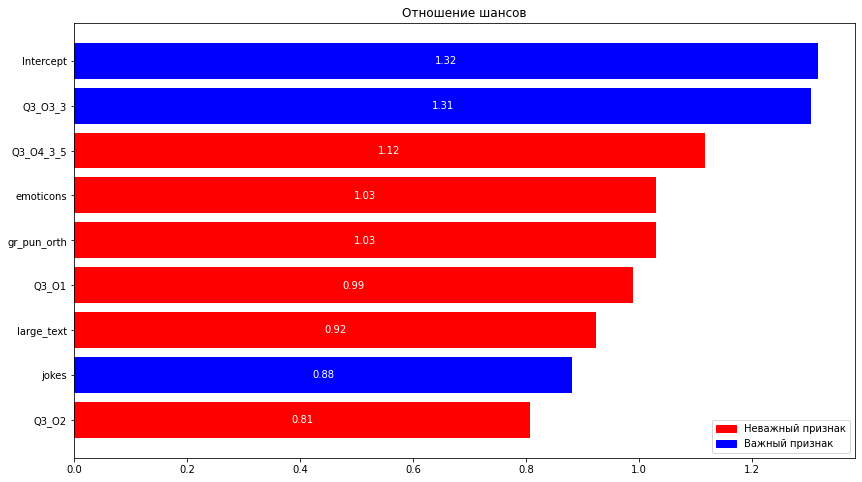

1.1436702949439745


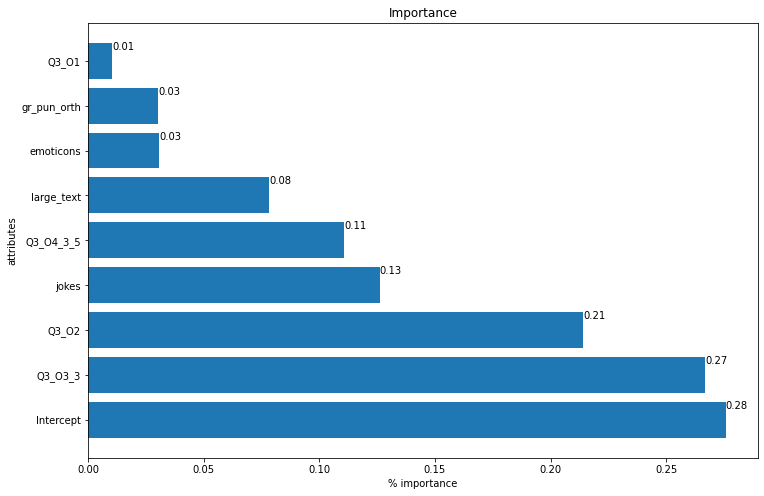

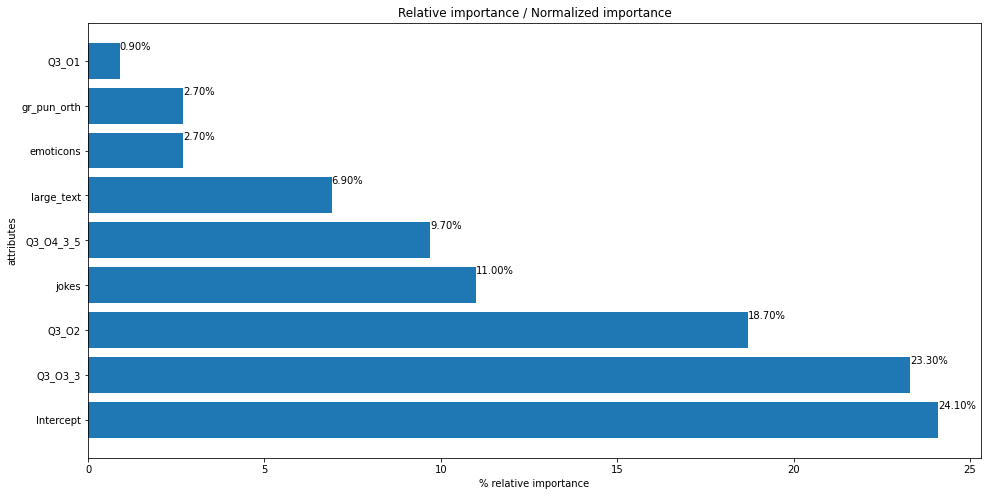

In [ ]:
# importance of social expertice
res_wo_int = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + Q3_O1 + Q3_O2 + Q3_O3_3 + Q3_O4_3_5", data= facts_dummy).fit()
print(res_wo_int.summary())
print(odds_ratios(res_wo_int))
feature_or(res_wo_int)
rel = feature_importance(res_wo_int)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.688649
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7700
Model:                          Logit   Df Residuals:                     7696
Method:                           MLE   Df Model:                            3
Date:                Mon, 30 May 2022   Pseudo R-squ.:               -0.002894
Time:                        17:11:26   Log-Likelihood:                -5302.6
converged:                       True   LL-Null:                       -5287.3
Covariance Type:            nonrobust   LLR p-value:                     1.000
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
emoticons       0.1319      0.044      2.994      0.003       0.046       0.218
gr_pun_orth     0.1535    

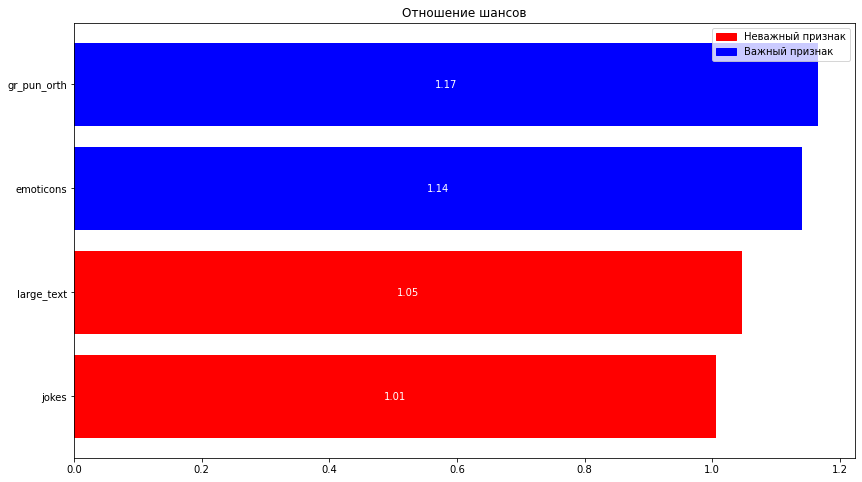

0.33725782579057123


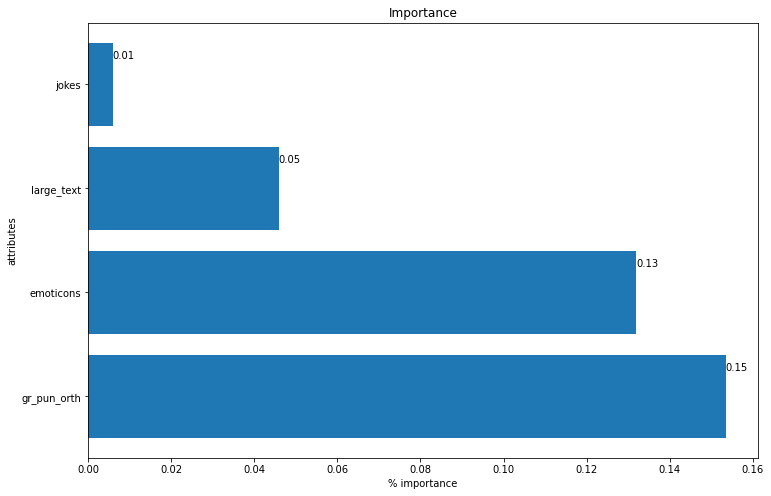

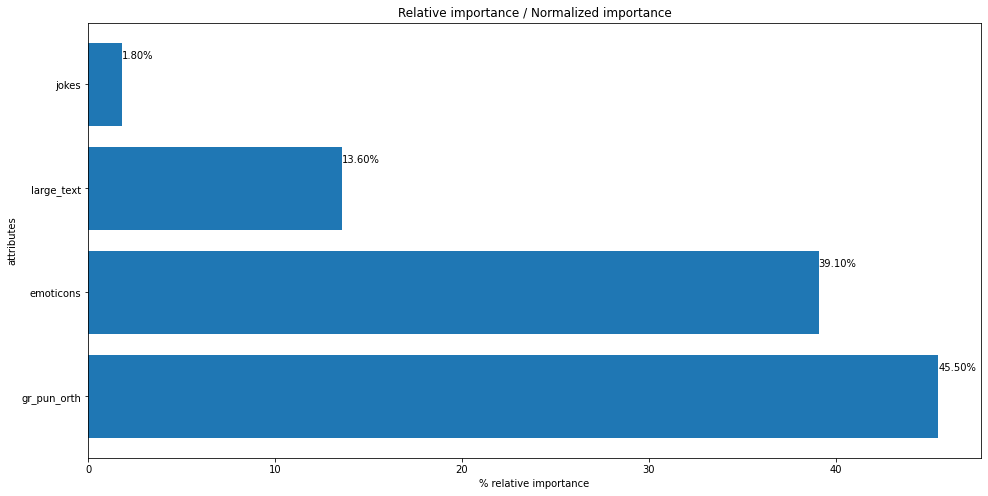

In [ ]:
res_wo_int = sm_log.logit(formula="CHOICE_INDICATOR~0+emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy).fit()
print(res_wo_int.summary())
print(odds_ratios(res_wo_int))
feature_or(res_wo_int)
rel = feature_importance(res_wo_int)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.685998
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7700
Model:                          Logit   Df Residuals:                     7695
Method:                           MLE   Df Model:                            4
Date:                Mon, 30 May 2022   Pseudo R-squ.:               0.0009671
Time:                        17:11:27   Log-Likelihood:                -5282.2
converged:                       True   LL-Null:                       -5287.3
Covariance Type:            nonrobust   LLR p-value:                   0.03678
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.2913      0.046      6.369      0.000       0.202       0.381
emoticons       0.0303    

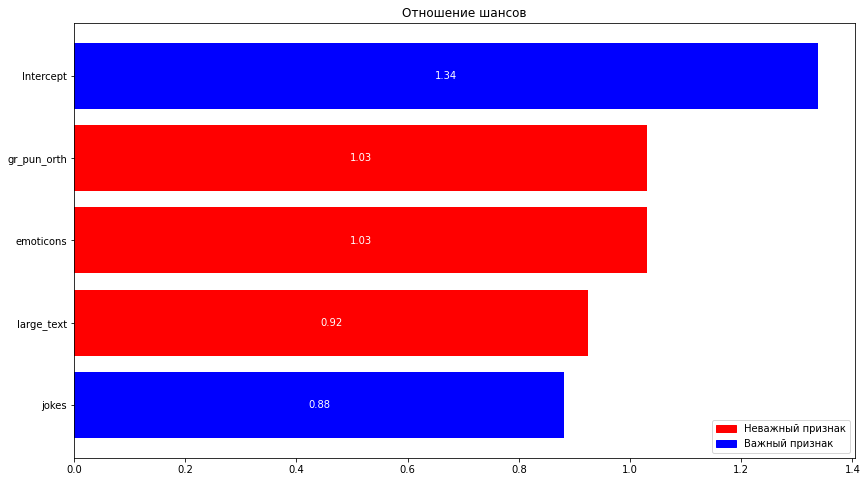

0.5566386579283558


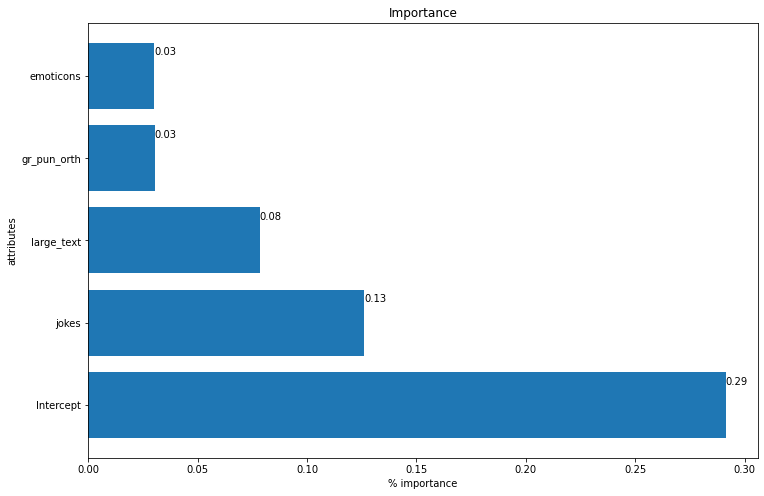

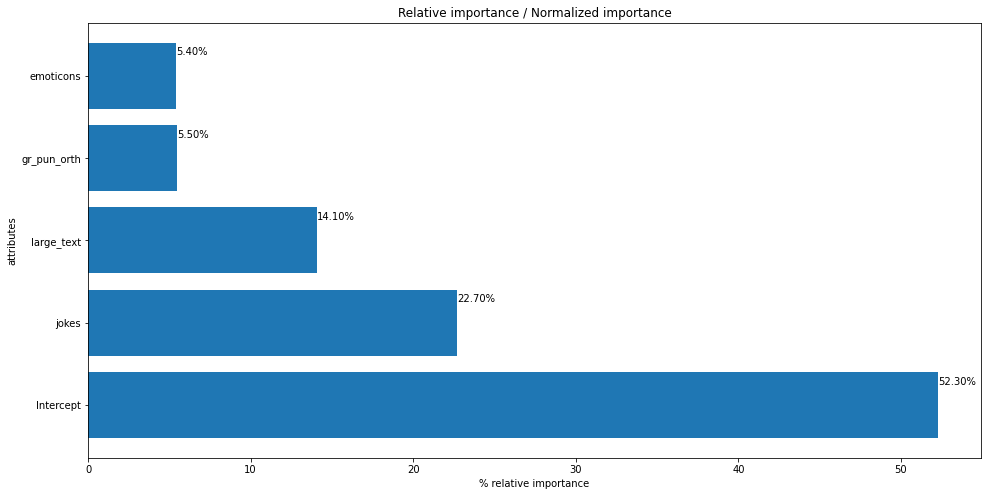

In [ ]:
res_w_int = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)
rel = feature_importance(res_w_int)
relative_importance(rel)

Наличие шуток связано с (1 - e^{-0.1261}) * 100 = 11.84% уменьшением доверия к диалогу. Мы на 95% уверены, что диалогам с шутками в среднем от -0.2 до -0.035 больше шансов доверят, чем при отсутствии данного атрибута. 

Поскольку свободный коэффициент положительный и является важным, то с вероятностью более 0.5 доверие к диалогам без шуток, грамматики, смайликов и текстом с разбиением будет больше. [Ссылка](https://quantifyinghealth.com/interpret-logistic-regression-coefficients/)








Анализируя confidence level я принимаю во внимание следующий факт: If the lower endpoint of a confidence interval for a population percentage is negative, it is completely legitimate to replace the lower endpoint by zero: It does not decrease the confidence level. Similarly, a population percentage cannot be greater than 100%. [ссылка на текст](https://www.stat.berkeley.edu/~stark/SticiGui/Text/confidenceIntervals.htm)



In [ ]:
LR, pval = likelihood_ratio(res_wo_int.llf,res_w_int.llf, 1)

Likelihood Ratio Statistic:  40.82736414577448
Отклоняем нулевую гипотезу о том, что две модели одинаково описывают данные, p-value =  0.019680072342510336


### Здравоохранение

In [ ]:
health_dummy = dummy_health(health_regr_merge_sorted, 3, 5, 3, 3)
health_dummy.head()

,RESPONDENT_ID,CHOICE_INDICATOR,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons,gr_pun_orth,jokes,large_text,...,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__4,jokes__5,large_text__1,large_text__2,large_text__4,large_text__5
0,120457015,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,0
1,120457015,1,0,0,0,0,0,1,1,0,...,0,0,0,0,0,1,0,0,0,0
2,120457015,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
3,120457015,1,0,0,0,0,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
4,120457015,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0


Optimization terminated successfully.
         Current function value: 0.645668
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7660
Model:                          Logit   Df Residuals:                     7651
Method:                           MLE   Df Model:                            8
Date:                Mon, 30 May 2022   Pseudo R-squ.:                 0.04509
Time:                        17:11:27   Log-Likelihood:                -4945.8
converged:                       True   LL-Null:                       -5179.4
Covariance Type:            nonrobust   LLR p-value:                 8.011e-96
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.6039      0.048     12.541      0.000       0.510       0.698
emoticons      -0.2622    

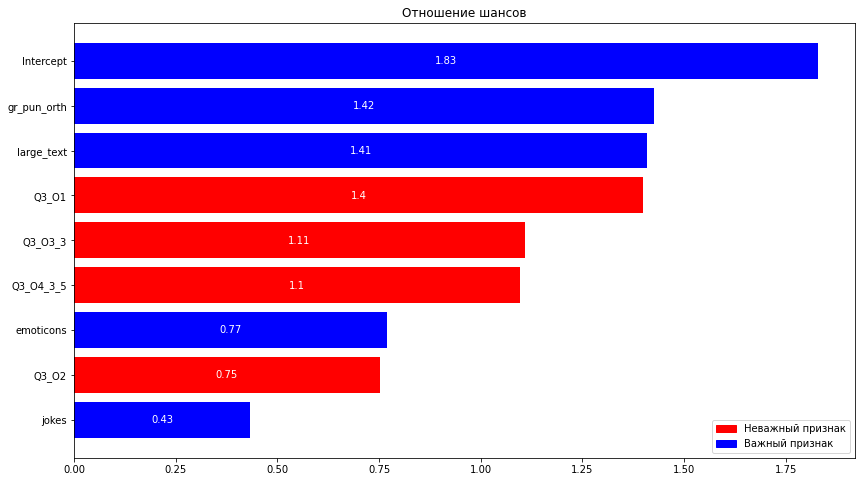

3.2179171749041564


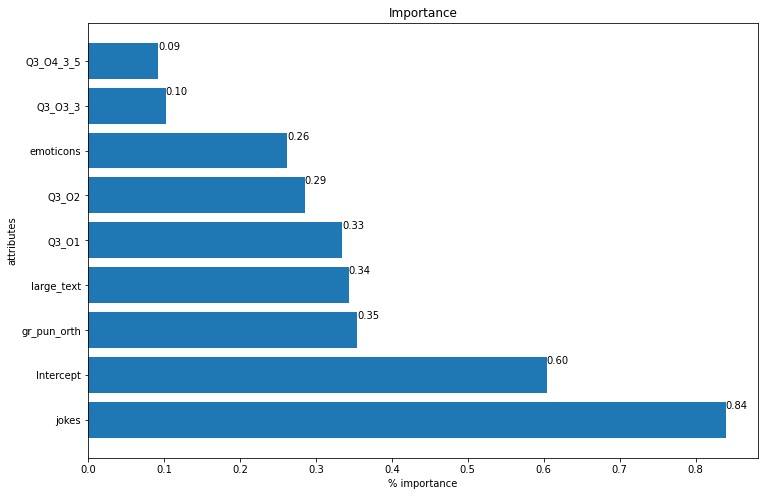

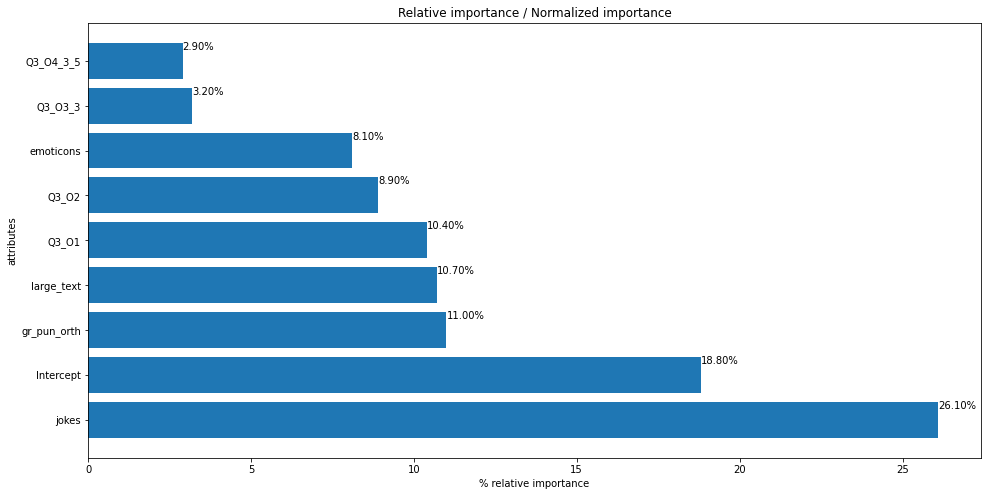

In [ ]:
#  + Q3_O1 + Q3_O2 + Q3_O3_3 + Q3_O4_3_5
res_wo_int_h = sm_log.logit(formula="CHOICE_INDICATOR~ emoticons + gr_pun_orth + jokes + large_text+ Q3_O1 + Q3_O2 + Q3_O3_3 + Q3_O4_3_5", data= health_dummy).fit()
print(res_wo_int_h.summary())
print(odds_ratios(res_wo_int_h))
feature_or(res_wo_int_h)
rel = feature_importance(res_wo_int_h)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.646098
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7660
Model:                          Logit   Df Residuals:                     7655
Method:                           MLE   Df Model:                            4
Date:                Mon, 30 May 2022   Pseudo R-squ.:                 0.04446
Time:                        17:11:28   Log-Likelihood:                -4949.1
converged:                       True   LL-Null:                       -5179.4
Covariance Type:            nonrobust   LLR p-value:                 2.325e-98
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.6110      0.047     12.865      0.000       0.518       0.704
emoticons      -0.2621    

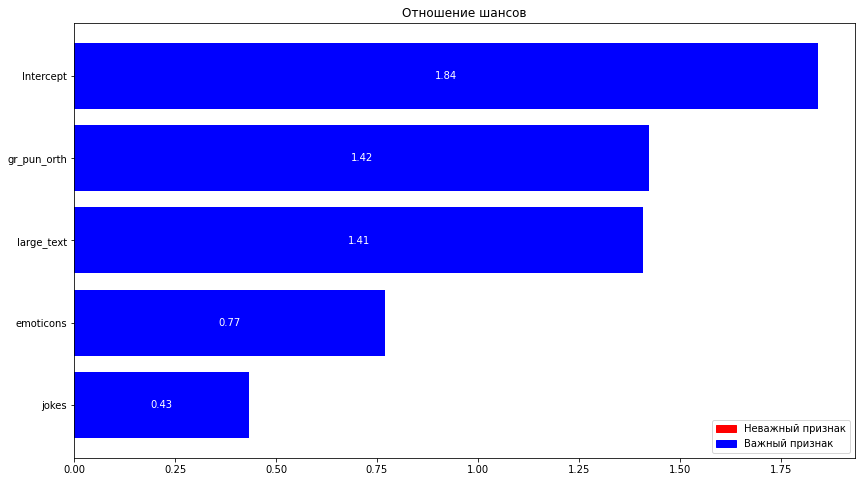

,OR,p-value,Lower CI: 2.5%,Upper CI: 97.5%,is_sig_95,c
jokes,0.432532,0.0,0.393498,0.475438,True,blue
emoticons,0.769434,0.0,0.698847,0.847150,True,blue
large_text,1.408707,0.0,1.278483,1.552194,True,blue
gr_pun_orth,1.424397,0.0,1.294159,1.567742,True,blue
Intercept,1.842225,0.0,1.678487,2.021937,True,blue


In [ ]:
res_wo_int_h = sm_log.logit(formula="CHOICE_INDICATOR~ emoticons + gr_pun_orth + jokes + large_text", data= health_dummy).fit()
print(res_wo_int_h.summary())
print(odds_ratios(res_wo_int_h))
feature_or(res_wo_int_h)

Optimization terminated successfully.
         Current function value: 0.657215
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7660
Model:                          Logit   Df Residuals:                     7656
Method:                           MLE   Df Model:                            3
Date:                Mon, 30 May 2022   Pseudo R-squ.:                 0.02801
Time:                        17:11:29   Log-Likelihood:                -5034.3
converged:                       True   LL-Null:                       -5179.4
Covariance Type:            nonrobust   LLR p-value:                 1.319e-62
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
emoticons      -0.0395      0.046     -0.868      0.386      -0.129       0.050
gr_pun_orth     0.6035    

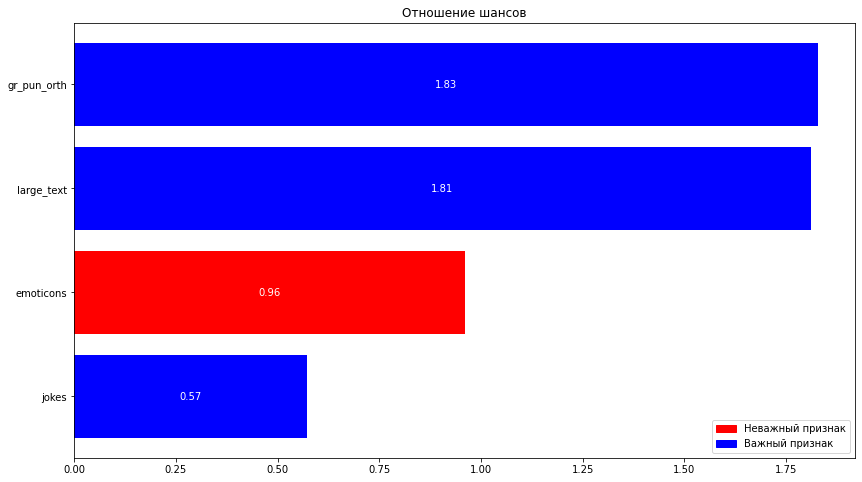

,OR,p-value,Lower CI: 2.5%,Upper CI: 97.5%,is_sig_95,c
jokes,0.571740,0.000,0.525358,0.622216,True,blue
emoticons,0.961275,0.386,0.879240,1.050965,False,red
large_text,1.810191,0.000,1.657625,1.976798,True,blue
gr_pun_orth,1.828429,0.000,1.676140,1.994555,True,blue


In [ ]:
res_w_int_h = sm_log.logit(formula="CHOICE_INDICATOR~ 0+emoticons + gr_pun_orth + jokes + large_text", data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_or(res_w_int_h)

In [ ]:
LR, pval = likelihood_ratio(res_w_int_h.llf,res_wo_int_h.llf, 1)

Likelihood Ratio Statistic:  170.31433896534872
Отклоняем нулевую гипотезу о том, что две модели одинаково описывают данные, p-value =  0.019680072342510336


## Регрессия на всех данных 

Добавив interaction всех переменных конджоинта с переменной тематики: Показало, что для инт фактов то же самое. А для здоровья все ещё усиливается. Это объединение результат двух обычных моделей. 
**Модель со свободным коэффициентом:** <br>
В объединенных данных все атрибуты влияют на зависимую переменную. В большей степени влияет атрибут про шутки, в обратную сторону (коэффициент отрицательный). Затем идет свободный коэффициент. Грамматика, пунктуация, орфография и оформление сообщения без разбиений положительно влияют на доверие пользователя. Однако смайлики оказывают отрицательное влияние. Только 1.3% выбора определяется такими атрибутами, как смайлики, шутки, грамматика&пунктуация&орфография и текст без разбиений, тематика. <br>
Стоит отметить, что переменная, определяющая тематику диалога, является четвертой по важности. То есть **в тематике здравоохранения пользователи больше обращают внимание на выбранные факторы.** 
 
 
 - Наличие шуток связано с $(1 - e^{-0.4704}) * 100 = 37.52\%$ уменьшением доверия к диалогу, p-value = 0.000, что меньше, чем заданный уровень значимости $α=0.05.$ 
 - Наличие смайликов связано с $(1 - e^{-0.1105}) * 100 = 10.46\%$ уменьшением доверия к диалогу, p-value = 0.001, что меньше, чем заданный уровень значимости $α=0.05.$  
 - Наличие правильной грамматики, орфографии, пунктуации связано с $(-1 + e^{0.1838}) * 100 = 20.18\%$ увеличением доверия к диалогу. Мы на 95% уверены, что диалогам с правильной грамматикой, пунктуацией, орфографией в среднем от 11.8% до 24.9% больше шансов доверят, чем при отсутствии данного атрибута (p-value=0.000). 
 - Наличие текста без разбиений связано с $(-1 + e^{0.1228}) * 100 = 13.07\%$ увеличением доверия к диалогу. Мы на 95% уверены, что диалогам с правильной грамматикой, пунктуацией, орфографией в среднем от 5.7% до 18.9% больше шансов доверят, чем при отсутствии данного атрибута(p-value=0.000).  
 - Поскольку свободный коэффициент положительный и является важным, то с вероятностью более 0.5 доверие к диалогам без шуток, грамматики, смайликов, текстом с разбиением и переменной, отвечающей за тематику, будет больше. 
 - Наличие переменной, отвечающей за тематику, связано с $(-1 + e^{0.1450}) * 100 = 15.6\%$ увеличением доверия к диалогу. Мы на 95% уверены, что диалогам с правильной грамматикой, пунктуацией, орфографией в среднем от 8% до 21% больше шансов доверят, чем при отсутствии данного атрибута. 


**Модель без свободного коэффициента:** <br>
В объединенных данных все атрибуты влияют на зависимую переменную кроме смайликов. В большей степени влияет атрибут про шутки, в обратную сторону (коэффициент отрицательный). Затем грамматика, пунктуация, орфография и оформление сообщения без разбиений положительно влияют на доверие пользователя. Только 1.3% выбора определяется такими атрибутами, как смайлики, шутки, грамматика&пунктуация&орфография и текст без разбиений, тематика. <br>
Стоит отметить, что переменная, определяющая тематику диалога, является четвертой по важности. То есть **в тематике здравоохранения пользователи больше обращают внимание на выбранные факторы.** 
 
 
 - Наличие шуток связано с $(1 - e^{-0.3358}) * 100 = 28.52\%$ уменьшением доверия к диалогу, p-value = 0.000, что меньше, чем заданный уровень значимости $α=0.05.$
 - Наличие правильной грамматики, орфографии, пунктуации связано с $(-1 + e^{0.3084}) * 100 = 36.12\%$ увеличением доверия к диалогу. Мы на 95% уверены, что диалогам с правильной грамматикой, пунктуацией, орфографией в среднем от 24.7% до 36.9% больше шансов доверят, чем при отсутствии данного атрибута (p-value=0.000). 
 - Наличие текста без разбиений связано с $(-1 + e^{0.2491}) * 100 = 28.29\%$ увеличением доверия к диалогу. Мы на 95% уверены, что диалогам с правильной грамматикой, пунктуацией, орфографией в среднем от 18.8% до 31.1% больше шансов доверят, чем при отсутствии данного атрибута (p-value=0.000). 
 - Наличие переменной, отвечающей за тематику, связано с $(-1 + e^{0.2948}) * 100 = 34.29\%$ увеличением доверия к диалогу. Мы на 95% уверены, что диалогам с правильной грамматикой, пунктуацией, орфографией в среднем от 23.7% до 35.2% больше шансов доверят, чем при отсутствии данного атрибута (p-value=0.000). 

### Данные

Объединяем две базы данных и создаем дополнительную бинарную переменную, которая равна 0, если ответ из интересных фактов, и 1 - из здравоохранения. 

Также удаляем одну и ту же категорию dummy переменных, пусть это будет первая категория у Q5, Q6, Q7, Q8. 

In [ ]:
facts_dummy_1 = dummy_facts(facts_regr_merge_sorted_q6, 1, 1, 1, 1)
health_dummy_1 = dummy_health(health_regr_merge_sorted, 1, 1, 1, 1)

# создаем доп. столбец, идентифицирующий тематику: 0 - интересные факты, 1 - здоровье
facts_dummy_1['topic'] = 0
health_dummy_1['topic'] = 1

In [ ]:
joined_data = pd.concat([facts_dummy_1, health_dummy_1])

In [ ]:
joined_data.head()

,RESPONDENT_ID,CHOICE_INDICATOR,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons,gr_pun_orth,jokes,large_text,...,gr_pun_orth__5,jokes__2,jokes__3,jokes__4,jokes__5,large_text__2,large_text__3,large_text__4,large_text__5,topic
0,120470635,0,0,0,0,0,1,0,0,1,...,1,0,0,0,1,0,0,0,1,0
1,120470635,1,0,0,0,0,1,1,0,0,...,1,0,0,0,1,0,0,0,1,0
2,120470635,1,0,0,0,0,0,0,1,1,...,1,0,0,0,1,0,0,0,1,0
3,120470635,0,0,0,0,0,1,0,1,1,...,1,0,0,0,1,0,0,0,1,0
4,120470635,0,0,0,0,0,1,1,0,1,...,1,0,0,0,1,0,0,0,1,0


### Регрессия

Optimization terminated successfully.
         Current function value: 0.665661
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                15360
Model:                          Logit   Df Residuals:                    15342
Method:                           MLE   Df Model:                           17
Date:                Mon, 30 May 2022   Pseudo R-squ.:                 0.02403
Time:                        17:11:33   Log-Likelihood:                -10225.
converged:                       True   LL-Null:                       -10476.
Covariance Type:            nonrobust   LLR p-value:                 3.461e-96
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.2758      0.047      5.930      0.000       0.185       0.367
emoticon

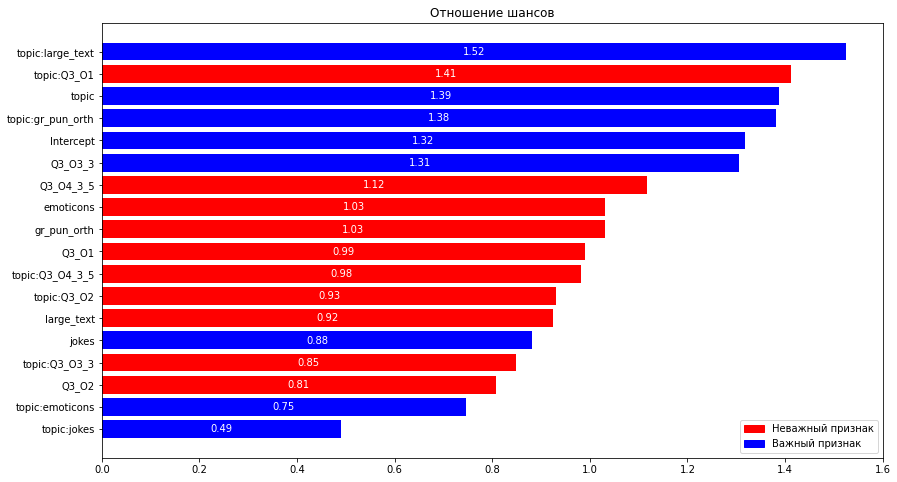

3.8226638363460994


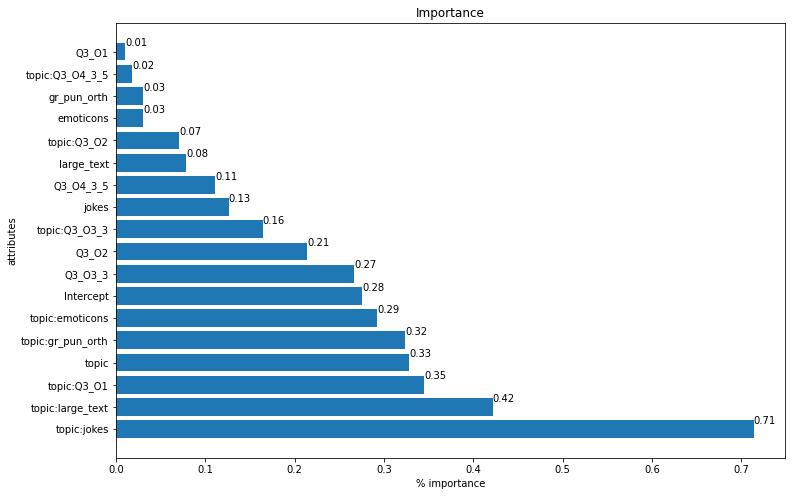

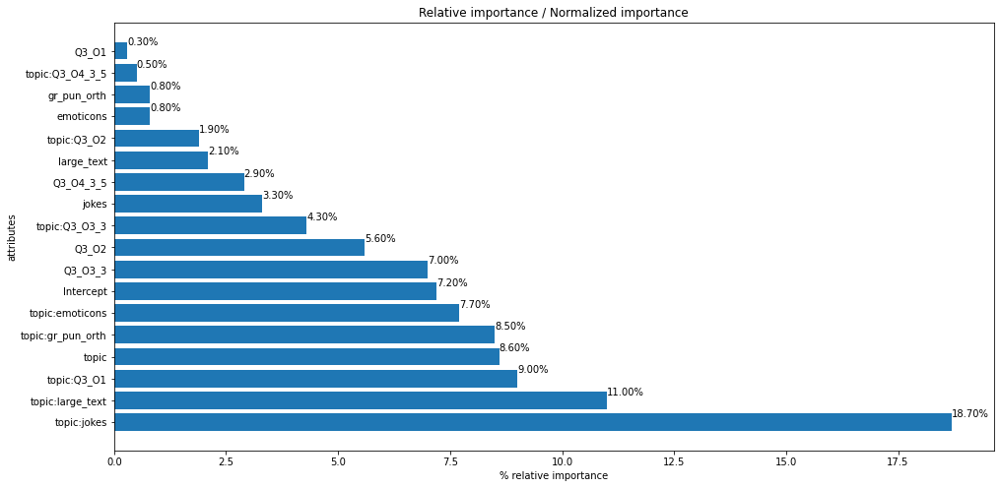

In [ ]:
formula = """CHOICE_INDICATOR~ emoticons  + gr_pun_orth + jokes + large_text+topic + Q3_O1 + Q3_O2 + Q3_O3_3 + Q3_O4_3_5 + 
topic:emoticons + topic:gr_pun_orth + topic:jokes + topic:large_text+ topic:Q3_O1 + topic:Q3_O2 + topic:Q3_O3_3 + topic:Q3_O4_3_5"""
res_w_int = sm_log.logit(formula=formula, data= joined_data).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)
rel = feature_importance(res_w_int)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.666100
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                15360
Model:                          Logit   Df Residuals:                    15350
Method:                           MLE   Df Model:                            9
Date:                Mon, 30 May 2022   Pseudo R-squ.:                 0.02339
Time:                        17:11:34   Log-Likelihood:                -10231.
converged:                       True   LL-Null:                       -10476.
Covariance Type:            nonrobust   LLR p-value:                7.937e-100
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.2913      0.046      6.369      0.000       0.202       0.381
emoticon

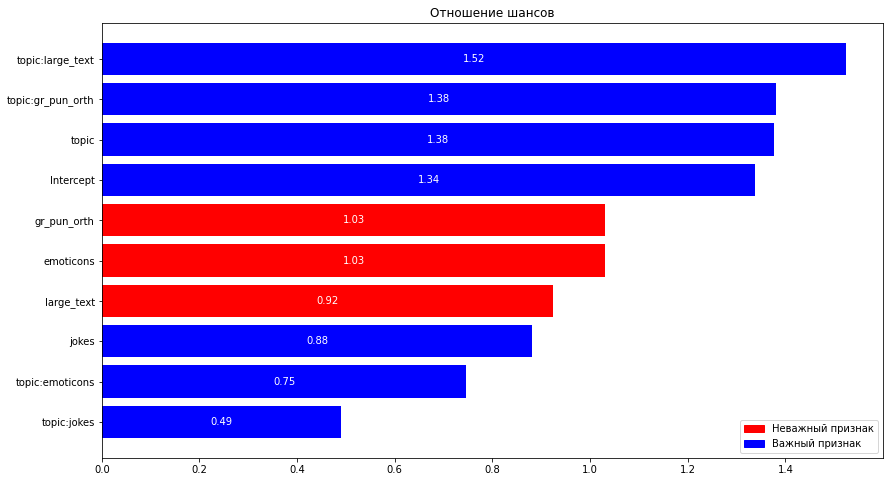

2.6250956806860573


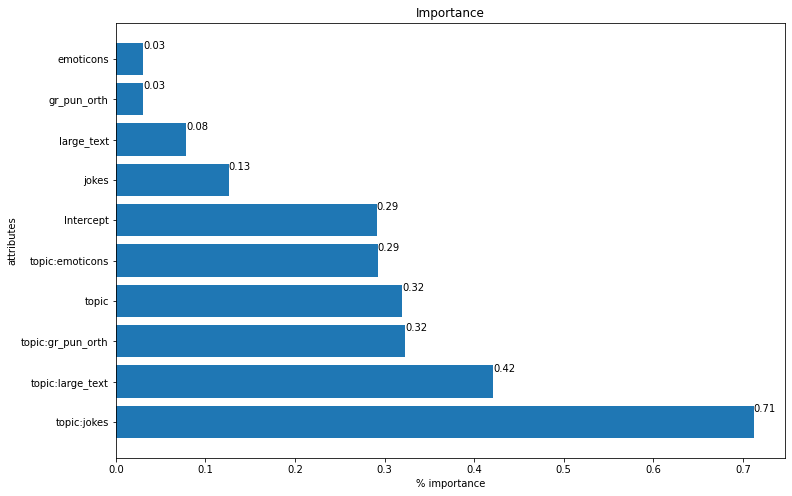

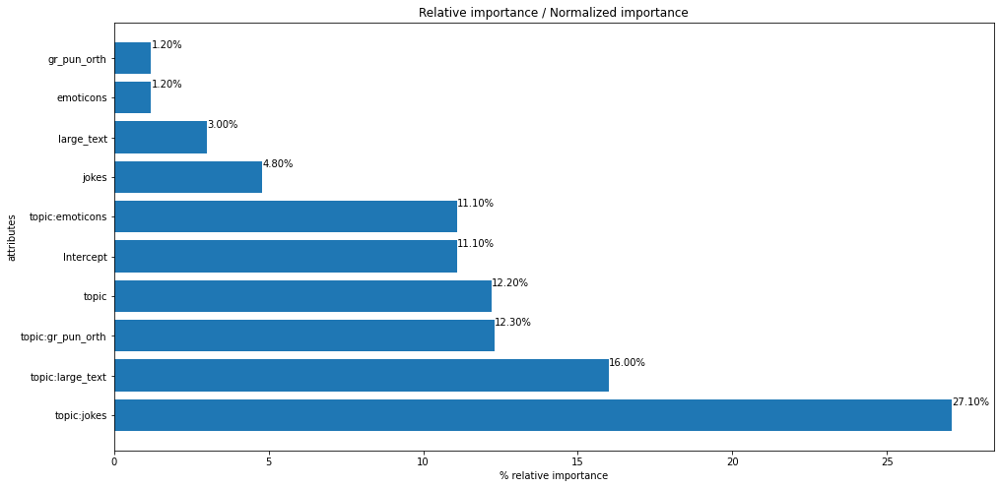

In [ ]:
formula = """CHOICE_INDICATOR~ emoticons  + gr_pun_orth + jokes + large_text+topic + 
topic:emoticons + topic:gr_pun_orth + topic:jokes + topic:large_text"""
res_w_int = sm_log.logit(formula=formula, data= joined_data).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)
rel = feature_importance(res_w_int)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.667429
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                15360
Model:                          Logit   Df Residuals:                    15351
Method:                           MLE   Df Model:                            8
Date:                Mon, 30 May 2022   Pseudo R-squ.:                 0.02144
Time:                        17:11:35   Log-Likelihood:                -10252.
converged:                       True   LL-Null:                       -10476.
Covariance Type:            nonrobust   LLR p-value:                 5.551e-92
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
emoticons             0.1319      0.044      2.994      0.003       0.046       0.218
gr_pun_o

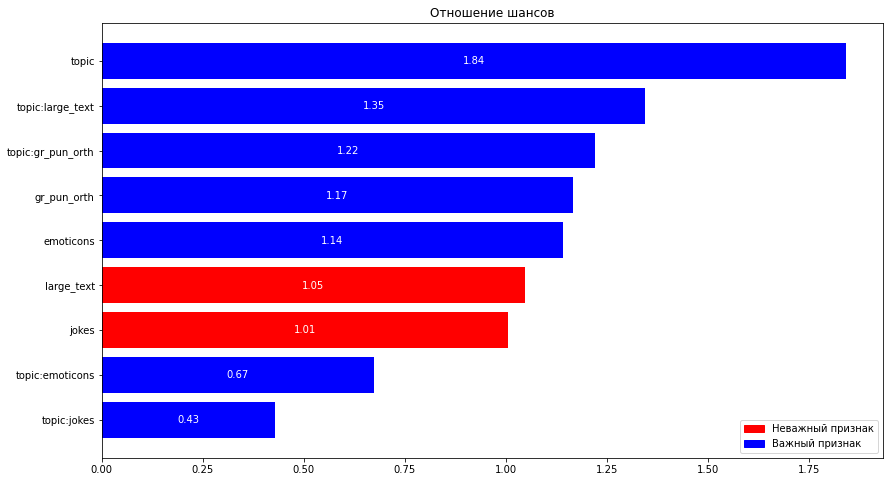

,OR,p-value,Lower CI: 2.5%,Upper CI: 97.5%,is_sig_95,c
topic:jokes,0.429962,0.000,0.379507,0.487124,True,blue
topic:emoticons,0.674352,0.000,0.592565,0.767428,True,blue
jokes,1.005979,0.886,0.927284,1.091353,False,red
large_text,1.046988,0.282,0.962987,1.138316,False,red
emoticons,1.140997,0.003,1.046599,1.243909,True,blue
gr_pun_orth,1.165881,0.000,1.073009,1.266792,True,blue
topic:gr_pun_orth,1.221734,0.002,1.076208,1.386938,True,blue
topic:large_text,1.345485,0.000,1.183742,1.529329,True,blue
topic,1.842225,0.000,1.678487,2.021937,True,blue


In [ ]:
formula = """CHOICE_INDICATOR~ 0 + emoticons  + gr_pun_orth + jokes + large_text+topic + 
topic:emoticons + topic:gr_pun_orth + topic:jokes + topic:large_text"""
res_wo_int = sm_log.logit(formula=formula, data= joined_data).fit()
print(res_wo_int.summary())
print(odds_ratios(res_wo_int))
feature_or(res_wo_int)

In [ ]:
LR_joined, pval_joined = likelihood_ratio(res_wo_int.llf,res_w_int.llf, 1)

Likelihood Ratio Statistic:  40.82736414577448
Отклоняем нулевую гипотезу о том, что две модели одинаково описывают данные, p-value =  0.019680072342510336


## Регрессия частей (кластеризация по пост вопросам)

![Интересные факты](https://drive.google.com/uc?export=view&id=19SpvhnLlAhcHpszBNMdVoq2SskREIjQX)
**Кластер 1:**
- Значимым фактором является только свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация. 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 2:** 
- Шансы того, что диалогу доверят, увеличиваются в 1.49 раз при наличии текста без разбиений. 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.36) при наличии смайликов. 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.63) при наличии шуток. 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация. 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 3:** 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.76) при наличии смайликов. 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.75) при наличии шуток. 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация. 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 4:**
- Значимым фактором является только свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация. 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 5:** 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.64) при наличии текста без разбиений. 
- Шансы того, что диалогу доверят, увеличиваются в 2.63 раза при наличии смайликов. 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 


![Здравоохранение](https://drive.google.com/uc?export=view&id=1JehfL-uYEwfoT5zvLgyTRRVqf8qFwU31)
**Кластер 1:**
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.5) при наличии смайликов. 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.29) при 
наличии шуток. 
- Шансы того, что диалогу доверят, увеличиваются в 1.71 раз при правильной грамматики, орфографии и пунктуации. 
- Шансы того, что диалогу доверят, увеличиваются в 1.47 раза при наличии текста без разбиений. 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация. 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 2:**
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.62) при наличии смайликов. 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.39) при 
наличии шуток. 
- Шансы того, что диалогу доверят, увеличиваются в 1.52 раз при правильной грамматики, орфографии и пунктуации. 
- Шансы того, что диалогу доверят, увеличиваются в 1.65 раза при наличии текста без разбиений. 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация. 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 3:**
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.53) при 
наличии шуток. 
- Шансы того, что диалогу доверят, увеличиваются в 1.47 раза при наличии текста без разбиений. 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация. 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 4:**
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.61) при 
наличии шуток. 
- Шансы того, что диалогу доверят, увеличиваются в 1.28 раз при правильной грамматики, орфографии и пунктуации. 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация. 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

### Кластеризация

In [ ]:
def elbow_method(df):
  inertia = []
  for k in range(1, 10):
      kmeans = KMeans(n_clusters=k, random_state=1).fit(df)
      inertia.append(np.sqrt(kmeans.inertia_))

  plt.plot(range(1, 10), inertia, marker='s');
  plt.xlabel('Количество кластеров')
  plt.ylabel('Ошибка')
  plt.title('Метод локтя')

In [ ]:
from sklearn import metrics
def silhouette(df):
  sil = []
  for k in range(2, 10):
      kmeans = KMeans(n_clusters=k, random_state=1).fit(df)
      sil.append(metrics.silhouette_score(df, kmeans.labels_))

  plt.plot(range(2, 10), sil, marker='s');
  plt.xlabel('Число кластеров')
  plt.ylabel('Силуэт');

In [ ]:
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder, StandardScaler
scaler = StandardScaler()

#### Интересные факты

**Описание кластеров в интересных фактах:** <br>
Кластеры поделились примерно в одинаковом соотношении по количеству пользователей размерами 96, 64, 71, 66, 88. 
- 1 кластер:
 - Нет пользователей, у которых опыт пользования **соц. сетями** от полугода до года (90% пользователей этой группы имеют опыт более 5 лет).
 - 45% пользователей этой группы любят **смайлики**, поскольку проголосовали за них оценками 4, 5 (самая многочисленная группа по выбору 4 - 36 человек). 39% пользоветелей выбрали без разницы (3).
 - К **грамматики, пунктуации и орфографии** относятся положительно (выбрали 4&5 88% респондентов). 
 - Все пользователи проголосовали 4 за шутки. 
 - Почти ровно часть пользователей проголосовало за разбиение текста (28%), часть против (27%), остальным без разницы (44%). 

- 2 кластер:
 - Нет пользователей, у которых опыт пользования **соц. сетями** от полугода до года (89% пользователей этой группы имеют опыт более 5 лет). 
 - Никто не выбрал 5 за смайлики. Лишь 3% положительно относятся к смайликам (4). 69% пользователей этой группы против **смайликов** (поставили 1/2).
 - Никто не считает в данной группе, что грамматика, пунктуация и орфография не важны (не выбрали 1, 2). К **грамматики, пунктуации и орфографии** относятся положительно (выбрали 4&5 98% респондентов), но это единственная группа, где процент безразличных пользователей составляет 2%, в остальных больше. 
 - Одинаковый процент пользователей выбрали 1/2 к **шуткам** - 8%. Почти одинаковы процент пользователей выбрали 3/4 - 25% и 27% соответственно. 5 выбрали 33% пользователей. 
 - Единственная группа, где абсолютно все проголосовали за то, чтобы текст был без разбиений. 

- 3 кластер: 
 - Единственная группа, где есть пользователи с опытом использования **социальных сетей** от полугода до года (всего 2 человека) (85% пользователей этой группы имеют опыт более 5 лет). 
 - Никто не выбрал 5 за смайлики. 27% пользователей выбрали 4 за **смайлики**, лишь 37% эта идея не нравится. 
 - Тут больший процент людей прогосовал 3 за **грамматику, пунктуацию и орфографию** (13%), большинство же относятся положительно (83%). 
 - Единственная группа, где пользователи нейтрально относятся к шуткам. Им без разницы.  
 - 32% пользователей выбрали текст с разбиениями, 25% - без разбиения, остальным 57% без разницы. 

- 4 кластер: 
 - Нет пользователей, у которых опыт пользования **соц. сетями** от полугода до года (88% пользователей этой группы имеют опыт более 5 лет). 
 - Никто не выбрал 5 за смайлики. 36% пользователя выбрали 4 за **смайлики**, когда как 30% никак к ним не относятся (выбрали 3). 
 - Тут больший процент людей прогосовал 3 за **грамматику, пунктуацию и орфографию** (4 человека - 0.06%), большинство же относятся положительно (88%). 
 - Все выбрали либо 1/2 по отношению к **шуткам** - 35%, либо строго положительно (5) - 65%.  
 - Никто не выбрал 5 за текст без разбиений. 41% пользователей за разбиения сообщения, 36% без разницы. 


- 5 кластер:
 - Нет пользователей, у которых опыт пользования **соц. сетями** от полугода до года и менее полугода (90% пользователей этой группы имеют опыт более 5 лет). 
 - Все пользователи этой группы очень любят **смайлики**, поскольку проголосовали за них оценкой 5 -> Это единственная категория в регрессии, где к смайликам относятся однозначно положительно.
 - К **грамматики, пунктуации и орфографии** относятся положительно (выбрали 4&5 90% респондентов).
 - Отрицательно к шуткам никто не относится вообще. Нейтрально относятся лишь 3%. Положительно (4/5) - 97%. 
 -  Часть пользователей проголосовало за разбиение текста (30%), часть против (42%), остальным без разницы (28%). 

In [ ]:
facts_dummy.head()

,RESPONDENT_ID,CHOICE_INDICATOR,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons,gr_pun_orth,jokes,large_text,...,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
0,120470635,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,1
1,120470635,1,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,120470635,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,1
3,120470635,0,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,1
4,120470635,0,0,0,0,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
# метод локтя
columns_id = ['RESPONDENT_ID', 'CHOICE_INDICATOR', 'emoticons', 'gr_pun_orth', 'jokes', 'large_text',
              'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5',
              'emoticons__1', 'emoticons__2', 'emoticons__4', 'emoticons__5',
              'gr_pun_orth__1', 'gr_pun_orth__2', 'gr_pun_orth__3', 'gr_pun_orth__4',
              'jokes__1', 'jokes__2', 'jokes__3', 'jokes__4', 
              'large_text__1', 'large_text__2', 'large_text__4', 'large_text__5']

columns = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5',
                          'emoticons__1', 'emoticons__2', 'emoticons__4', 'emoticons__5',
                          'gr_pun_orth__1', 'gr_pun_orth__2', 'gr_pun_orth__3', 'gr_pun_orth__4',
                          'jokes__1', 'jokes__2', 'jokes__3', 'jokes__4', 
                          'large_text__1', 'large_text__2', 'large_text__4', 'large_text__5']

columns_duplicates = ['RESPONDENT_ID', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5',
                          'emoticons__1', 'emoticons__2', 'emoticons__4', 'emoticons__5',
                          'gr_pun_orth__1', 'gr_pun_orth__2', 'gr_pun_orth__3', 'gr_pun_orth__4',
                          'jokes__1', 'jokes__2', 'jokes__3', 'jokes__4', 
                          'large_text__1', 'large_text__2', 'large_text__4', 'large_text__5']

In [ ]:
7700// 20

385

In [ ]:
# то есть оставляем одну строку с каждым респондентом, поскольку тут важны только результаты пост-вопросов
facts_dummy_post = facts_dummy[columns_id].copy()
facts_dummy_post.drop_duplicates(subset=columns_duplicates, keep='first', inplace=True, ignore_index=True)

In [ ]:
facts_dummy_post.head()

,RESPONDENT_ID,CHOICE_INDICATOR,emoticons,gr_pun_orth,jokes,large_text,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,...,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
0,120470635,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,120470672,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
2,120470716,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
3,120470783,1,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
4,120470813,0,0,0,1,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1


In [ ]:
from sklearn.cluster import KMeans

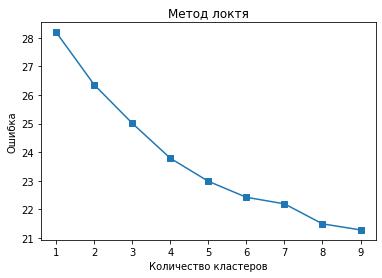

In [ ]:
# метод локтя
elbow_method(facts_dummy_post[columns])

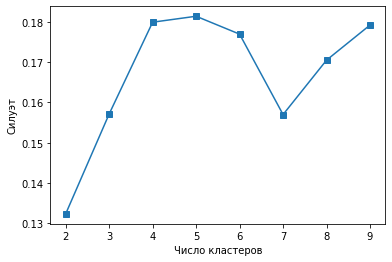

In [ ]:
silhouette(facts_dummy_post[columns])

Значения силуэта, близкие к 1, соответствуют чётко выделенным кластерам. В нашем случае максимальный силуэт достигается при количестве кластеров = 9, аналогично результатам метода локтя. Однако для текущего объема данных это слишком много. По графику следующее ярко выделенное значение - это 5, но тоже большое число. Затем идет 4. Поэтому выбираем 4 кластера

In [ ]:
kmodel_post = KMeans(n_clusters = 5, random_state=1)
kmodel_post.fit(facts_dummy_post[columns])
kmodel_post.cluster_centers_

array([[ 2.08333333e-02,  0.00000000e+00,  4.16666667e-02,
         4.16666667e-02,  4.16666667e-02,  1.25000000e-01,
         3.75000000e-01,  7.29166667e-02,  1.04166667e-02,
         5.20833333e-02,  6.25000000e-02,  4.37500000e-01,
         1.73472348e-17, -6.93889390e-18, -1.38777878e-16,
         1.00000000e+00,  9.37500000e-02,  1.77083333e-01,
         2.70833333e-01,  1.04166667e-02],
       [ 3.12500000e-02, -8.67361738e-19,  3.12500000e-02,
         4.68750000e-02,  3.90625000e-01,  2.96875000e-01,
         3.12500000e-02, -1.94289029e-16,  0.00000000e+00,
         3.46944695e-18,  1.56250000e-02,  2.65625000e-01,
         7.81250000e-02,  7.81250000e-02,  2.50000000e-01,
         2.65625000e-01,  4.16333634e-17,  2.77555756e-17,
         8.32667268e-17,  1.00000000e+00],
       [-3.46944695e-18,  2.81690141e-02,  5.63380282e-02,
         7.04225352e-02,  9.85915493e-02,  2.67605634e-01,
         2.67605634e-01, -2.22044605e-16,  1.40845070e-02,
         2.81690141e-02,  1.2

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  after removing the cwd from sys.path.


In [ ]:
res = facts_dummy_post[columns].copy()
res["cluster"] = kmodel_post.labels_
mean_df = res.groupby("cluster", as_index=False).mean()
mean_df

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
0,0,0.020833,0.000000,0.041667,0.041667,0.041667,0.125000,0.375000,0.072917,0.010417,0.052083,0.062500,0.437500,0.000000,0.000000,0.000000,1.000000,0.093750,0.177083,0.270833,0.010417
1,1,0.031250,0.000000,0.031250,0.046875,0.390625,0.296875,0.031250,0.000000,0.000000,0.000000,0.015625,0.265625,0.078125,0.078125,0.250000,0.265625,0.000000,0.000000,0.000000,1.000000
2,2,0.000000,0.028169,0.056338,0.070423,0.098592,0.267606,0.267606,0.000000,0.014085,0.028169,0.126761,0.366197,0.000000,0.000000,1.000000,0.000000,0.169014,0.154930,0.225352,0.028169
3,3,0.060606,0.000000,0.045455,0.015152,0.136364,0.196970,0.363636,0.000000,0.030303,0.030303,0.060606,0.272727,0.060606,0.287879,0.000000,0.000000,0.136364,0.272727,0.227273,0.000000
4,4,0.000000,0.000000,0.045455,0.056818,0.000000,0.000000,0.000000,1.000000,0.011364,0.022727,0.068182,0.261364,0.000000,0.000000,0.034091,0.125000,0.147727,0.147727,0.125000,0.295455


In [ ]:
mean_df[mean_df['cluster'] == 0] * 96

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
0,0,2.0,0.0,4.0,4.0,4.0,12.0,36.0,7.0,1.0,5.0,6.0,42.0,0.0,0.0,0.0,96.0,9.0,17.0,26.0,1.0


In [ ]:
mean_df[mean_df['cluster'] == 1] * 64

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
1,64,2.0,0.0,2.0,3.0,25.0,19.0,2.0,0.0,0.0,0.0,1.0,17.0,5.0,5.0,16.0,17.0,0.0,0.0,0.0,64.0


In [ ]:
mean_df[mean_df['cluster'] == 2] * 71

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
2,142,0.0,2.0,4.0,5.0,7.0,19.0,19.0,0.0,1.0,2.0,9.0,26.0,0.0,0.0,71.0,0.0,12.0,11.0,16.0,2.0


In [ ]:
mean_df[mean_df['cluster'] == 3] * 66

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
3,198,4.0,0.0,3.0,1.0,9.0,13.0,24.0,0.0,2.0,2.0,4.0,18.0,4.0,19.0,0.0,0.0,9.0,18.0,15.0,0.0


In [ ]:
mean_df[mean_df['cluster'] == 4] * 88

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
4,352,0.0,0.0,4.0,5.0,0.0,0.0,0.0,88.0,1.0,2.0,6.0,23.0,0.0,0.0,3.0,11.0,13.0,13.0,11.0,26.0


In [ ]:
describe_df = res.groupby("cluster", as_index=False).describe()
describe_df

Q3_O1                                              Q3_O2            \
  count      mean       std  min  25%  50%  75%  max count      mean   
0  96.0  0.020833  0.143576  0.0  0.0  0.0  0.0  1.0  96.0  0.000000   
1  64.0  0.031250  0.175368  0.0  0.0  0.0  0.0  1.0  64.0  0.000000   
2  71.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  71.0  0.028169   
3  66.0  0.060606  0.240435  0.0  0.0  0.0  0.0  1.0  66.0  0.000000   
4  88.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  88.0  0.000000   

                                     Q3_O3_3                                \
        std  min  25%  50%  75%  max   count      mean       std  min  25%   
0  0.000000  0.0  0.0  0.0  0.0  0.0  96.0    0.041667  0.200875  0.0  0.0   
1  0.000000  0.0  0.0  0.0  0.0  0.0  64.0    0.031250  0.175368  0.0  0.0   
2  0.166633  0.0  0.0  0.0  0.0  1.0  71.0    0.056338  0.232214  0.0  0.0   
3  0.000000  0.0  0.0  0.0  0.0  0.0  66.0    0.045455  0.209895  0.0  0.0   
4  0.000000  0.0  0.0  0.0  0.0  0.0  88.0    0.045455  0.209493  0.0  0.0   

                 Q3_O4_3_5                                               \
   50%  75%  max     count      mean       std  min  25%  50%  75%  max   
0  0.0  0.0  1.0  96.0      0.041667  0.200875  0.0  0.0  0.0  0.0  1.0   
1  0.0  0.0  1.0  64.0      0.046875  0.213042  0.0  0.0  0.0  0.0  1.0   
2  0.0  0.0  1.0  71.0      0.070423  0.257679  0.0  0.0  0.0  0.0  1.0   
3  0.0  0.0  1.0  66.0      0.015152  0.123091  0.0  0.0  0.0  0.0  1.0   
4  0.0  0.0  1.0  88.0      0.056818  0.232822  0.0  0.0  0.0  0.0  1.0   

  emoticons__1                                              emoticons__2  \
         count      mean       std  min  25%  50%  75%  max        count   
0  96.0         0.041667  0.200875  0.0  0.0  0.0  0.0  1.0  96.0          
1  64.0         0.390625  0.491747  0.0  0.0  0.0  1.0  1.0  64.0          
2  71.0         0.098592  0.300235  0.0  0.0  0.0  0.0  1.0  71.0          
3  66.0         0.136364  0.345804  0.0  0.0  0.0  0.0  1.0  66.0          
4  88.0         0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  88.0          

                                               emoticons__4            \
       mean       std  min  25%  50%  75%  max        count      mean   
0  0.125000  0.332455  0.0  0.0  0.0  0.0  1.0  96.0         0.375000   
1  0.296875  0.460493  0.0  0.0  0.0  1.0  1.0  64.0         0.031250   
2  0.267606  0.445862  0.0  0.0  0.0  1.0  1.0  71.0         0.267606   
3  0.196970  0.400757  0.0  0.0  0.0  0.0  1.0  66.0         0.363636   
4  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  88.0         0.000000   

                                     emoticons__5                           \
        std  min  25%  50%  75%  max        count      mean       std  min   
0  0.486664  0.0  0.0  0.0  1.0  1.0  96.0         0.072917  0.261365  0.0   
1  0.175368  0.0  0.0  0.0  0.0  1.0  64.0         0.000000  0.000000  0.0   
2  0.445862  0.0  0.0  0.0  1.0  1.0  71.0         0.000000  0.000000  0.0   
3  0.484732  0.0  0.0  0.0  1.0  1.0  66.0         0.000000  0.000000  0.0   
4  0.000000  0.0  0.0  0.0  0.0  0.0  88.0         1.000000  0.000000  1.0   

                      gr_pun_orth__1                                          \
   25%  50%  75%  max          count      mean       std  min  25%  50%  75%   
0  0.0  0.0  0.0  1.0  96.0           0.010417  0.102062  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  64.0           0.000000  0.000000  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  71.0           0.014085  0.118678  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  66.0           0.030303  0.172733  0.0  0.0  0.0  0.0   
4  1.0  1.0  1.0  1.0  88.0           0.011364  0.106600  0.0  0.0  0.0  0.0   

       gr_pun_orth__2                                               \
   max          count      mean       std  min  25%  50%  75%  max   
0  1.0  96.0           0.052083  0.223361  0.0  0.0  0.0  0.0  1.0   
1  0.0  64.0           0.000000  0.000000  0.0  0.0  0.0  0.0

In [ ]:
facts_dummy_post['cluster'] = pd.Series(kmodel_post.labels_, index=facts_dummy_post.index)
facts_dummy_cluster = facts_dummy.merge(facts_dummy_post[['RESPONDENT_ID', 'cluster']], how='inner', on='RESPONDENT_ID', )

In [ ]:
facts_dummy_post0 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 0]
facts_dummy_post1 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 1]
facts_dummy_post2 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 2]
facts_dummy_post3 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 3]
facts_dummy_post4 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 4]

In [ ]:
len(facts_dummy_post4) // 20

88

#### Здравоохранение

**Описание кластеров в здравоохранении:** <br>
Кластеры поделились примерно в одинаковом соотношении по количеству пользователей размерами 87, 145, 81, 70, не считая второй. 
- 1 кластер: 
 - Есть пользователи различного опыты использования **соц. сетей** (90% пользователей этой группы имеют опыт более 5 лет). 
 - Самая многочисленная группа по негативу к **смайликам** (80% против), без разницы - 12%. 
 - К **грамматике, пунктуации и орфографии** относятся очень положительно (выбрали 5 - 76% респондентов).
 - Большинство пользователей в кластере, проголосовавших за **шутки** оценкой 1 - 92%. Нет вообще таких, кому шутки нравятся. 
 - Часть пользователей проголосовало за разбиение текста (21%), часть против (48%), остальным без разницы. 


- 2 кластер: 
 - Есть пользователи различного опыты использования **соц. сетей** (90% пользователей этой группы имеют опыт более 5 лет). 
 - Негативно к **смайликам** относятся 33%, за - 21%, без разницы - 46%. НО В РЕГРЕССИИ ЭТО НЕГАТИВНЫЙ ПРИЗНАК
 - К **грамматике, пунктуации и орфографии** относятся очень положительно (выбрали 4, 5 - 82% респондентов).
 - Пользователи в кластере голосуют либо 2 за **шутки** - 48%, либо 3 - 52%. Нет вообще таких, кому шутки категорично не нравятся (1) и немного нравятся (4). ХОТЯ ПРЕДСКАЗАНИЕ ДЛЯ 1 и 2 КЛАСТЕРОВ ОДИНАКОВОЕ. 
 - Часть пользователей проголосовало за разбиение текста (19%), часть против (46%), остальным без разницы. 

- 3 кластер: 
 - Есть пользователи различного опыты использования **соц. сетей** (90% пользователей этой группы имеют опыт более 5 лет). 
 - Нет вообще пользователей, кто строго негативно относится **смайликам** (1), за - 86%. 
 - К **грамматике, пунктуации и орфографии** относятся очень положительно (выбрали 4, 5 - 89% респондентов). Нет вообще ответов 2. 
 - Пользователи в кластере голосуют либо 5 за **шутки** - 83%, либо 3 - 17%. Нет вообще таких, кому шутки не нравятся (1, 2) и немного нравятся (4). ХОТЯ ПРЕДСКАЗАНИЕ ДАЕТ НЕГАТИВНОЕ ВЛИЯНИЕ ШУТОК В ТЕКСТЕ. 
 - Часть пользователей проголосовало против разбиения текста(77%). Это самая многочисленная группа по таким ответам. В регрессии как раз это положительный важный фактор. 

- 4 кластер: 
 - Есть пользователи различного опыты использования **соц. сетей** (90% пользователей этой группы имеют опыт более 5 лет). 
 - Мало пользователей, кто негативно относится **смайликам** (1, 2) - 14% (10 человек), за - 61%. 
 - К **грамматике, пунктуации и орфографии** относятся очень положительно (выбрали 4, 5 - 87% респондентов). Всего 2 ответа по очень негативному ответу о важности грамматики (2).
 - Пользователи в кластере голосуют либо 4 за **шутки** - 97%, либо 3 - 3%. Нет вообще таких, кому шутки не нравятся (1, 2) и очень нравятся (5). ХОТЯ ПРЕДСКАЗАНИЕ ДАЕТ НЕГАТИВНОЕ ВЛИЯНИЕ ШУТОК В ТЕКСТЕ. 
 - Часть пользователей проголосовало против разбиения текста(40%) (4, 5). За разбиение (1, 2) - 16%.

In [ ]:
health_dummy.columns

Index(['RESPONDENT_ID', 'CHOICE_INDICATOR', 'Q3_O1', 'Q3_O2', 'Q3_O3_3',
       'Q3_O4_3_5', 'emoticons', 'gr_pun_orth', 'jokes', 'large_text',
       'emoticons__1', 'emoticons__2', 'emoticons__4', 'emoticons__5',
       'gr_pun_orth__1', 'gr_pun_orth__2', 'gr_pun_orth__3', 'gr_pun_orth__4',
       'jokes__1', 'jokes__2', 'jokes__4', 'jokes__5', 'large_text__1',
       'large_text__2', 'large_text__4', 'large_text__5'],
      dtype='object')

In [ ]:
columns_id = ['RESPONDENT_ID', 'CHOICE_INDICATOR', 'emoticons', 'gr_pun_orth', 'jokes', 'large_text',
              'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5',
              'emoticons__1', 'emoticons__2', 'emoticons__4', 'emoticons__5',
              'gr_pun_orth__1', 'gr_pun_orth__2', 'gr_pun_orth__3', 'gr_pun_orth__4',
              'jokes__1', 'jokes__2', 'jokes__5', 'jokes__4', 
              'large_text__1', 'large_text__2', 'large_text__4', 'large_text__5']

columns = ['Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5',
                          'emoticons__1', 'emoticons__2', 'emoticons__4', 'emoticons__5',
                          'gr_pun_orth__1', 'gr_pun_orth__2', 'gr_pun_orth__3', 'gr_pun_orth__4',
                          'jokes__1', 'jokes__2', 'jokes__5', 'jokes__4', 
                          'large_text__1', 'large_text__2', 'large_text__4', 'large_text__5']

columns_duplicates = ['RESPONDENT_ID', 'Q3_O1', 'Q3_O2', 'Q3_O3_3', 'Q3_O4_3_5',
                          'emoticons__1', 'emoticons__2', 'emoticons__4', 'emoticons__5',
                          'gr_pun_orth__1', 'gr_pun_orth__2', 'gr_pun_orth__3', 'gr_pun_orth__4',
                          'jokes__1', 'jokes__2', 'jokes__5', 'jokes__4', 
                          'large_text__1', 'large_text__2', 'large_text__4', 'large_text__5']

In [ ]:
7660// 20

383

In [ ]:
health_dummy_post = health_dummy[columns_id].copy()
health_dummy_post.drop_duplicates(subset=columns_duplicates, keep='first', inplace=True, ignore_index=True)

In [ ]:
health_dummy_post.head()

,RESPONDENT_ID,CHOICE_INDICATOR,emoticons,gr_pun_orth,jokes,large_text,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__5,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
0,120457015,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,120457369,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1
2,120457375,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1
3,120457378,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0
4,120457379,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0


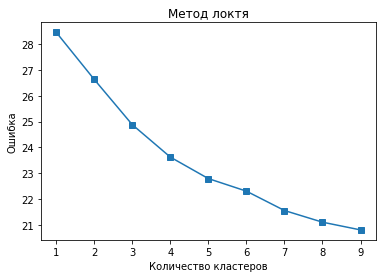

In [ ]:
# метод локтя
elbow_method(health_dummy_post[columns])


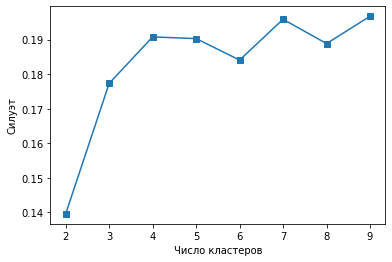

In [ ]:
silhouette(health_dummy_post[columns])

Значения силуэта, близкие к 1, соответствуют чётко выделенным кластерам. В нашем случае максимальный силуэт достигается при количестве кластеров = 9, аналогично результатам метода локтя. Однако для текущего объема данных это слишком много. По графику следующее ярко выделенное значение - это 7, но тоже большое число. Затем идет 4. Поэтому выбираем 4 кластера

In [ ]:
# изначально было 4, но два кластера по описанию получились идентичны
kmodel_post = KMeans(n_clusters = 4, random_state=1)
kmodel_post.fit(health_dummy_post[columns])
kmodel_post.cluster_centers_

array([[ 1.14942529e-02,  1.14942529e-02,  2.29885057e-02,
         5.74712644e-02,  6.20689655e-01,  1.83908046e-01,
         1.14942529e-02,  5.74712644e-02,  6.89655172e-02,
         4.59770115e-02,  6.89655172e-02,  5.74712644e-02,
         9.19540230e-01,  2.77555756e-17,  8.32667268e-17,
         1.94289029e-16,  1.26436782e-01,  8.04597701e-02,
         1.14942529e-01,  3.67816092e-01],
       [ 2.75862069e-02,  6.89655172e-03,  1.37931034e-02,
         4.82758621e-02,  1.31034483e-01,  2.00000000e-01,
         1.72413793e-01,  4.13793103e-02,  3.44827586e-02,
         1.37931034e-02,  1.31034483e-01,  2.13793103e-01,
         2.77555756e-16,  4.82758621e-01,  8.32667268e-17,
         3.05311332e-16,  7.58620690e-02,  1.10344828e-01,
         1.65517241e-01,  2.96551724e-01],
       [ 1.23456790e-02,  1.23456790e-02,  2.46913580e-02,
         4.93827160e-02, -1.94289029e-16,  4.93827160e-02,
         8.64197531e-02,  7.77777778e-01,  4.93827160e-02,
        -3.46944695e-18,  6.1

In [ ]:
res_h = health_dummy_post[columns].copy()
res_h["cluster"] = kmodel_post.labels_
res_mean_h = res_h.groupby("cluster", as_index=False).mean()

In [ ]:
res_mean_h

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__5,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
0,0,0.011494,0.011494,0.022989,0.057471,0.620690,0.183908,0.011494,0.057471,0.068966,0.045977,0.068966,0.057471,0.91954,0.000000,0.00000,0.000000,0.126437,0.080460,0.114943,0.367816
1,1,0.027586,0.006897,0.013793,0.048276,0.131034,0.200000,0.172414,0.041379,0.034483,0.013793,0.131034,0.213793,0.00000,0.482759,0.00000,0.000000,0.075862,0.110345,0.165517,0.296552
2,2,0.012346,0.012346,0.024691,0.049383,0.000000,0.049383,0.086420,0.777778,0.049383,0.000000,0.061728,0.086420,0.00000,0.000000,0.82716,0.000000,0.074074,0.086420,0.074074,0.432099
3,3,0.014286,0.042857,0.028571,0.014286,0.028571,0.114286,0.485714,0.128571,0.028571,0.042857,0.057143,0.371429,0.00000,0.000000,0.00000,0.971429,0.028571,0.128571,0.314286,0.228571


In [ ]:
res_mean_h[res_mean_h['cluster'] == 0] * 87

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__5,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
0,0,1.0,1.0,2.0,5.0,54.0,16.0,1.0,5.0,6.0,4.0,6.0,5.0,80.0,0.0,0.0,0.0,11.0,7.0,10.0,32.0


In [ ]:
res_mean_h[res_mean_h['cluster'] == 1] * 145

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__5,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
1,145,4.0,1.0,2.0,7.0,19.0,29.0,25.0,6.0,5.0,2.0,19.0,31.0,0.0,70.0,0.0,0.0,11.0,16.0,24.0,43.0


In [ ]:
res_mean_h[res_mean_h['cluster'] == 2] * 81

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__5,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
2,162,1.0,1.0,2.0,4.0,0.0,4.0,7.0,63.0,4.0,0.0,5.0,7.0,0.0,0.0,67.0,0.0,6.0,7.0,6.0,35.0


In [ ]:
res_mean_h[res_mean_h['cluster'] == 3] * 70

,cluster,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__5,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
3,210,1.0,3.0,2.0,1.0,2.0,8.0,34.0,9.0,2.0,3.0,4.0,26.0,0.0,0.0,0.0,68.0,2.0,9.0,22.0,16.0


In [ ]:
res_h.groupby("cluster").describe()

Q3_O1                                               Q3_O2            \
         count      mean       std  min  25%  50%  75%  max  count      mean   
cluster                                                                        
0        87.0   0.011494  0.107211  0.0  0.0  0.0  0.0  1.0  87.0   0.011494   
1        145.0  0.027586  0.164352  0.0  0.0  0.0  0.0  1.0  145.0  0.006897   
2        81.0   0.012346  0.111111  0.0  0.0  0.0  0.0  1.0  81.0   0.012346   
3        70.0   0.014286  0.119523  0.0  0.0  0.0  0.0  1.0  70.0   0.042857   

                                           Q3_O3_3                           \
              std  min  25%  50%  75%  max   count      mean       std  min   
cluster                                                                       
0        0.107211  0.0  0.0  0.0  0.0  1.0  87.0    0.022989  0.150736  0.0   
1        0.083045  0.0  0.0  0.0  0.0  1.0  145.0   0.013793  0.117036  0.0   
2        0.111111  0.0  0.0  0.0  0.0  1.0  81.0    0.024691  0.156150  0.0   
3        0.203997  0.0  0.0  0.0  0.0  1.0  70.0    0.028571  0.167802  0.0   

                            Q3_O4_3_5                                          \
         25%  50%  75%  max     count      mean       std  min  25%  50%  75%   
cluster                                                                         
0        0.0  0.0  0.0  1.0  87.0      0.057471  0.234090  0.0  0.0  0.0  0.0   
1        0.0  0.0  0.0  1.0  145.0     0.048276  0.215092  0.0  0.0  0.0  0.0   
2        0.0  0.0  0.0  1.0  81.0      0.049383  0.218016  0.0  0.0  0.0  0.0   
3        0.0  0.0  0.0  1.0  70.0      0.014286  0.119523  0.0  0.0  0.0  0.0   

             emoticons__1                                               \
         max        count      mean       std  min  25%  50%  75%  max   
cluster                                                                  
0        1.0  87.0         0.620690  0.488028  0.0  0.0  1.0  1.0  1.0   
1        1.0  145.0        0.131034  0.338608  0.0  0.0  0.0  0.0  1.0   
2        1.0  81.0         0.000000  0.000000  0.0  0.0  0.0  0.0  0.0   
3        1.0  70.0         0.028571  0.167802  0.0  0.0  0.0  0.0  1.0   

        emoticons__2                                               \
               count      mean       std  min  25%  50%  75%  max   
cluster                                                             
0        87.0         0.183908  0.389655  0.0  0.0  0.0  0.0  1.0   
1        145.0        0.200000  0.401386  0.0  0.0  0.0  0.0  1.0   
2        81.0         0.049383  0.218016  0.0  0.0  0.0  0.0  1.0   
3        70.0         0.114286  0.320455  0.0  0.0  0.0  0.0  1.0   

        emoticons__4                                               \
               count      mean       std  min  25%  50%  75%  max   
cluster                                                             
0        87.0         0.011494  0.107211  0.0  0.0  0.0  0.0  1.0   
1        145.0        0.172414  0.379049  0.0  0.0  0.0  0.0  1.0   
2        81.0         0.086420  0.282734  0.0  0.0  0.0  0.0  1.0   
3        70.0         0.485714  0.503405  0.0  0.0  0.0  1.0  1.0   

        emoticons__5                                               \
               count      mean       std  min  25%  50%  75%  max   
cluster                                                             
0        87.0         0.057471  0.234090  0.0  0.0  0.0  0.0  1.0   
1        145.0        0.041379  0.199856  0.0  0.0  0.0  0.0  1.0   
2        81.0         0.777778  0.418330  0.0  1.0  1.0  1.0  1.0   
3        70.0         0.128571  0.337142  0.0  0.0  0.0  0.0  1.0   

        gr_pun_orth__1                                               \
                 count      mean       std  min  25%  50%  75%  max   
cluster                                                               
0        87.0           0.068966  0.254864  0.0  0.0  0.0  0.0  1.0   
1        145.0          0.034483  0.183098  0.0  0.0  0.0  0.0  1.0   


In [ ]:
health_dummy_post['cluster'] = pd.Series(kmodel_post.labels_, index=health_dummy_post.index)
health_dummy_cluster = health_dummy.merge(health_dummy_post[['RESPONDENT_ID', 'cluster']], how='inner', on='RESPONDENT_ID', )

In [ ]:
health_dummy_post0 = health_dummy_cluster[health_dummy_cluster['cluster'] == 0]
health_dummy_post1 = health_dummy_cluster[health_dummy_cluster['cluster'] == 1]
health_dummy_post2 = health_dummy_cluster[health_dummy_cluster['cluster'] == 2]
health_dummy_post3 = health_dummy_cluster[health_dummy_cluster['cluster'] == 3]

In [ ]:
health_dummy_post0

,RESPONDENT_ID,CHOICE_INDICATOR,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons,gr_pun_orth,jokes,large_text,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__4,jokes__5,large_text__1,large_text__2,large_text__4,large_text__5,cluster
140,120457395,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
141,120457395,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
142,120457395,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
143,120457395,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
144,120457395,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
145,120457395,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
146,120457395,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
147,120457395,0,0,0,1,0,1,0,1,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
148,120457395,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
149,120457395,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


### Регрессия

#### Интересные факты

In [ ]:
facts_dummy_cluster.head()

,RESPONDENT_ID,CHOICE_INDICATOR,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons,gr_pun_orth,jokes,large_text,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5,cluster
0,120470635,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,4
1,120470635,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,4
2,120470635,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,4
3,120470635,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,4
4,120470635,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,4


Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6838453878889922
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1920
Model:                          Logit   Df Residuals:                     1915
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                0.002143
Time:                        14:07:26   Log-Likelihood:                -1313.0
converged:                       True   LL-Null:                       -1315.8
Covariance Type:            nonrobust   LLR p-value:                    0.2277
                  coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

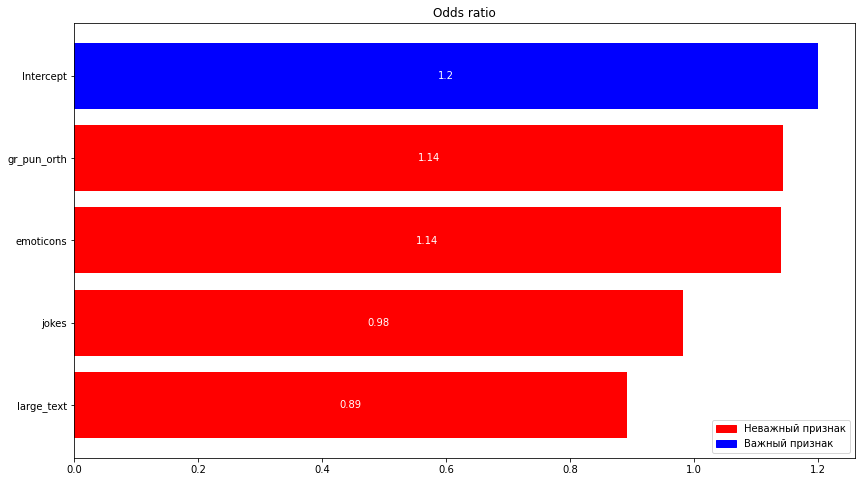

0.5806825437853884


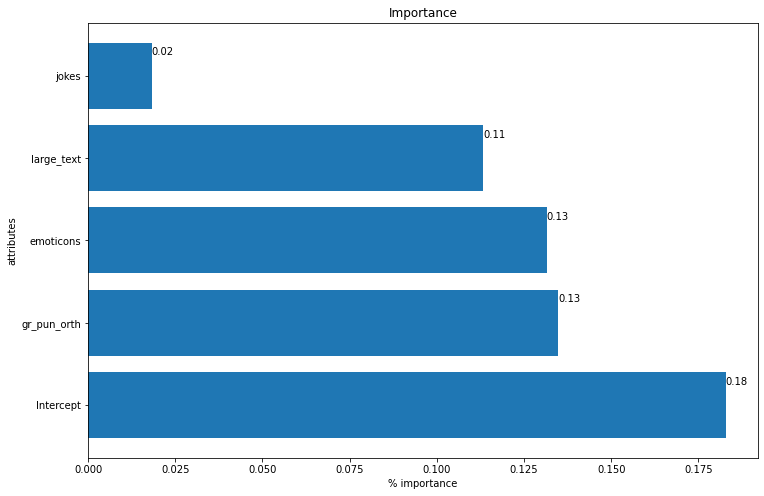

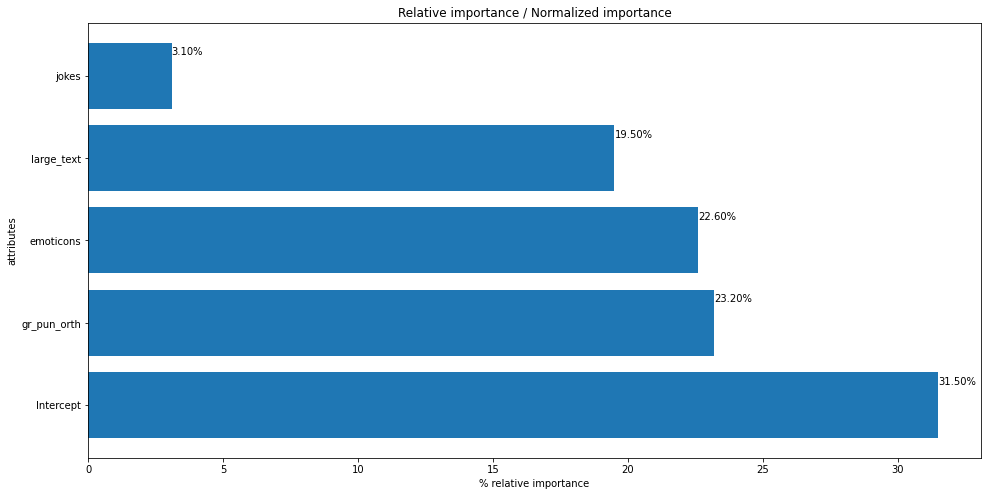

In [ ]:
res_w_int_clust0 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post0).fit_regularized()
print(res_w_int_clust0.summary())
print(odds_ratios(res_w_int_clust0))
odds_ratios(res_w_int_clust0)
odr0 = feature_or(res_w_int_clust0)
rel = feature_importance(res_w_int_clust0)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.649216
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1280
Model:                          Logit   Df Residuals:                     1275
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.05872
Time:                        14:07:27   Log-Likelihood:                -831.00
converged:                       True   LL-Null:                       -882.83
Covariance Type:            nonrobust   LLR p-value:                 1.623e-21
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.7121      0.118      6.059      0.000       0.482       0.942
emoticons      -1.0159    

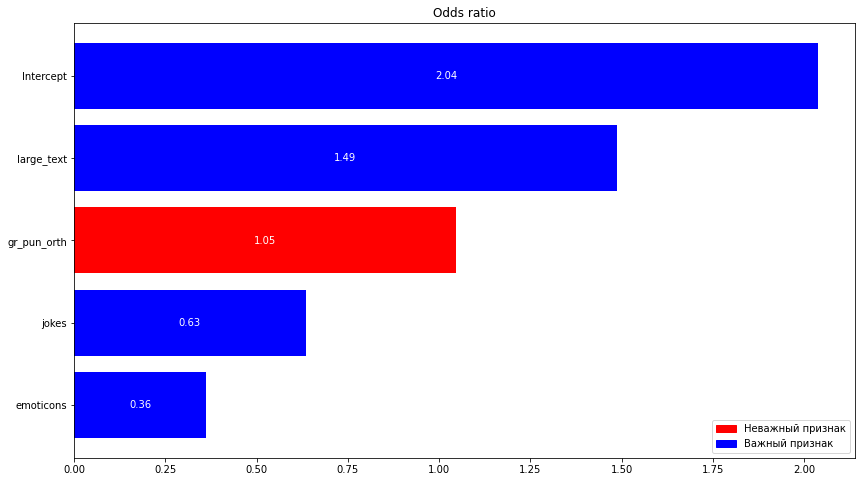

2.6246504014607885


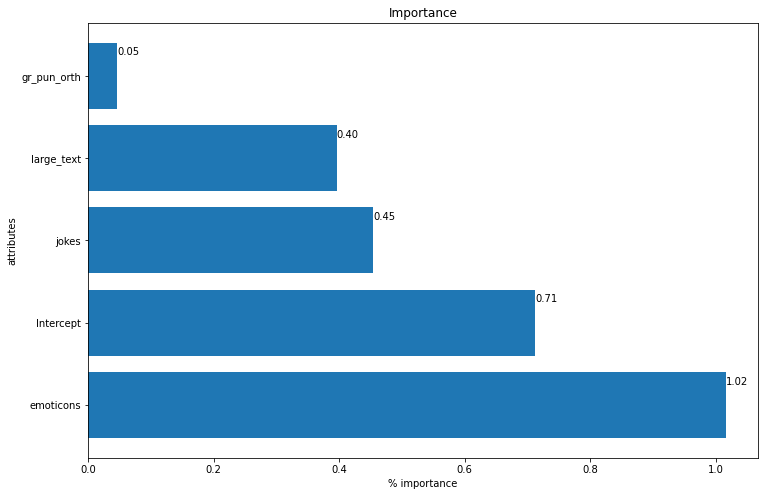

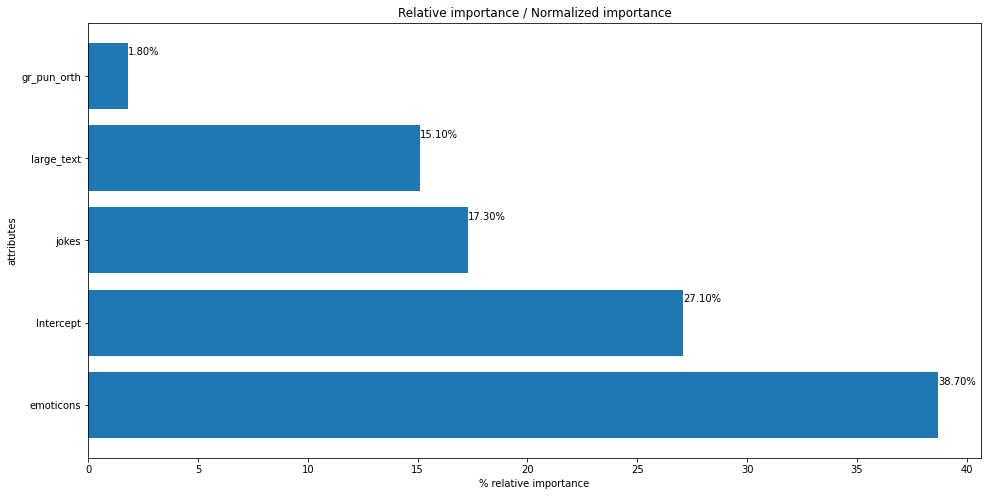

In [ ]:
res_w_int_clust1 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post1).fit()
print(res_w_int_clust1.summary())
print(odds_ratios(res_w_int_clust1))
odds_ratios(res_w_int_clust1)
odr1 = feature_or(res_w_int_clust1)
rel = feature_importance(res_w_int_clust1)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.686324
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1420
Model:                          Logit   Df Residuals:                     1415
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                0.007899
Time:                        14:07:27   Log-Likelihood:                -974.58
converged:                       True   LL-Null:                       -982.34
Covariance Type:            nonrobust   LLR p-value:                  0.003738
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.3081      0.106      2.902      0.004       0.100       0.516
emoticons      -0.2724    

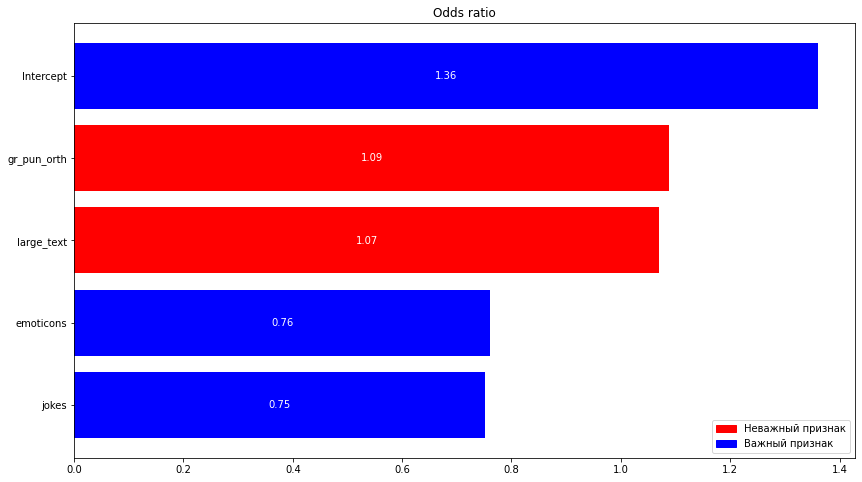

1.019386727338504


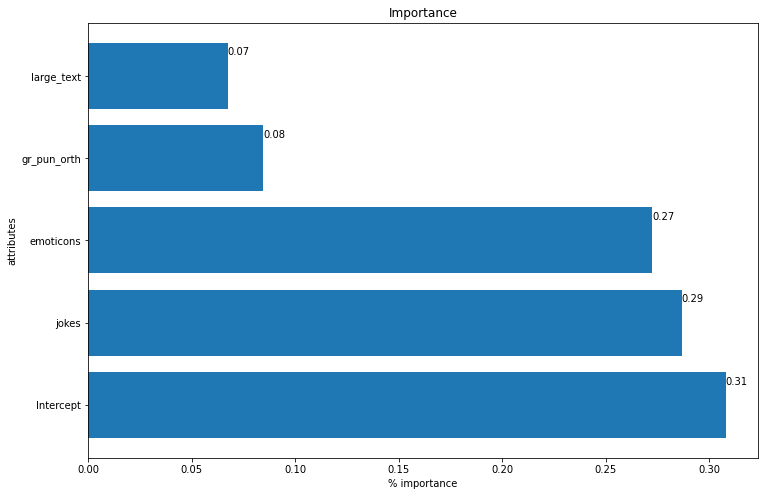

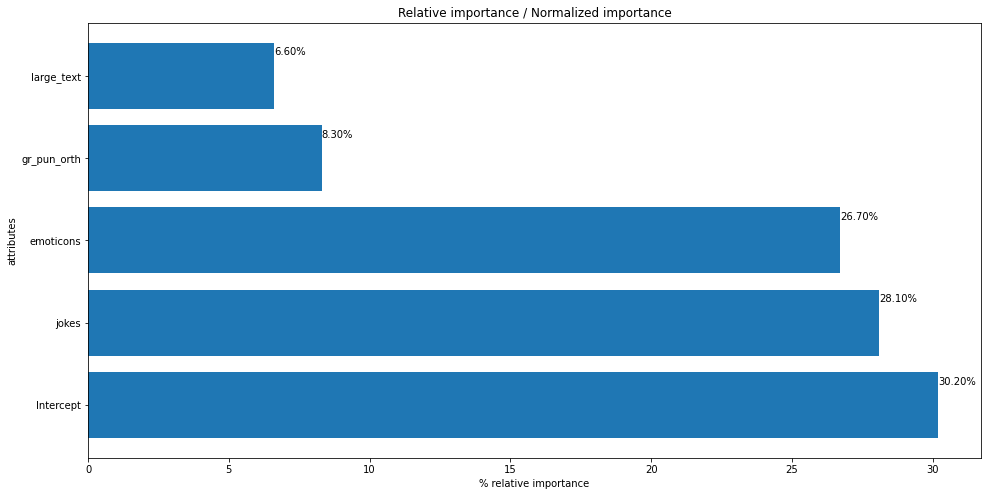

In [ ]:
res_w_int_clust2 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post2).fit()
print(res_w_int_clust2.summary())
print(odds_ratios(res_w_int_clust2))
odds_ratios(res_w_int_clust2)
odr2 = feature_or(res_w_int_clust2)
rel = feature_importance(res_w_int_clust2)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.678933
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1320
Model:                          Logit   Df Residuals:                     1315
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                0.002212
Time:                        14:07:28   Log-Likelihood:                -896.19
converged:                       True   LL-Null:                       -898.18
Covariance Type:            nonrobust   LLR p-value:                    0.4097
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.3839      0.112      3.416      0.001       0.164       0.604
emoticons      -0.0199    

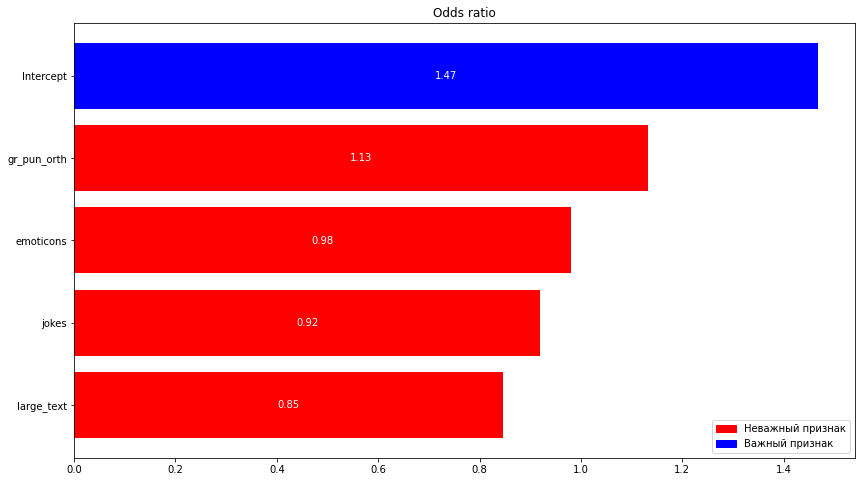

0.7786052198250263


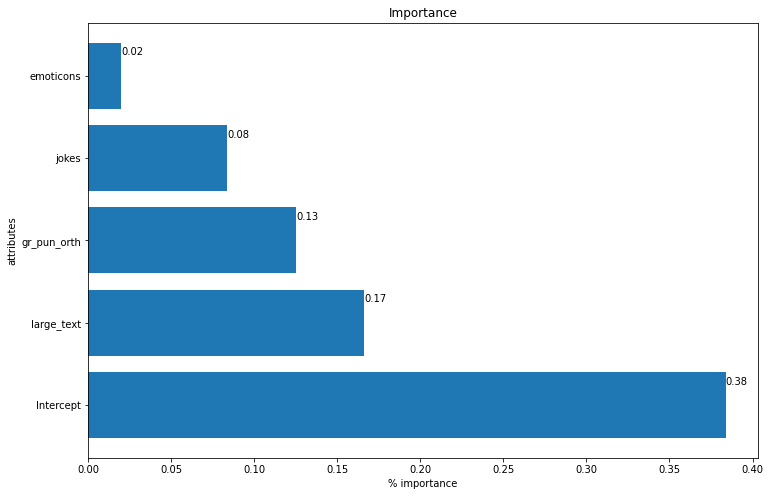

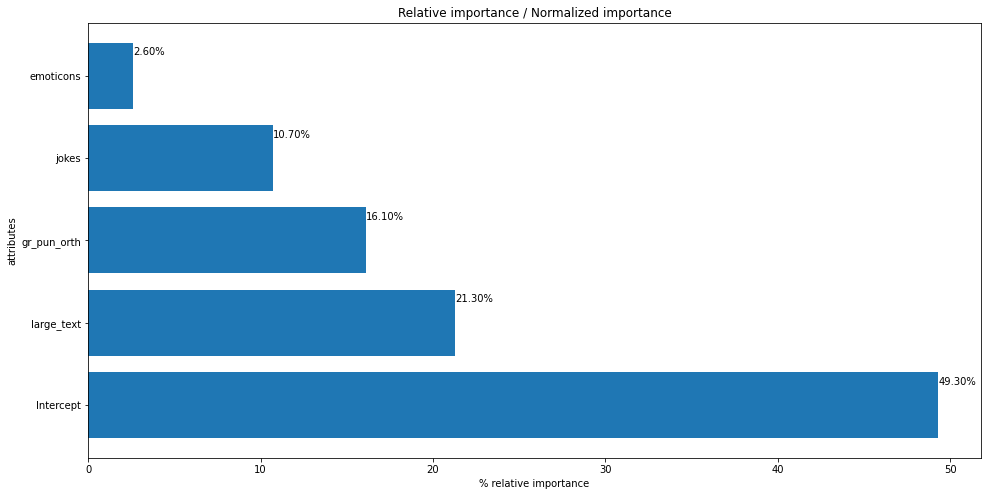

In [ ]:
res_w_int_clust3 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post3).fit()
print(res_w_int_clust3.summary())
print(odds_ratios(res_w_int_clust3))
odds_ratios(res_w_int_clust3)
odr3 = feature_or(res_w_int_clust3)
rel = feature_importance(res_w_int_clust3)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.653093
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1760
Model:                          Logit   Df Residuals:                     1755
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.04427
Time:                        14:07:29   Log-Likelihood:                -1149.4
converged:                       True   LL-Null:                       -1202.7
Covariance Type:            nonrobust   LLR p-value:                 4.067e-22
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0619      0.097      0.640      0.522      -0.128       0.252
emoticons       0.9688    

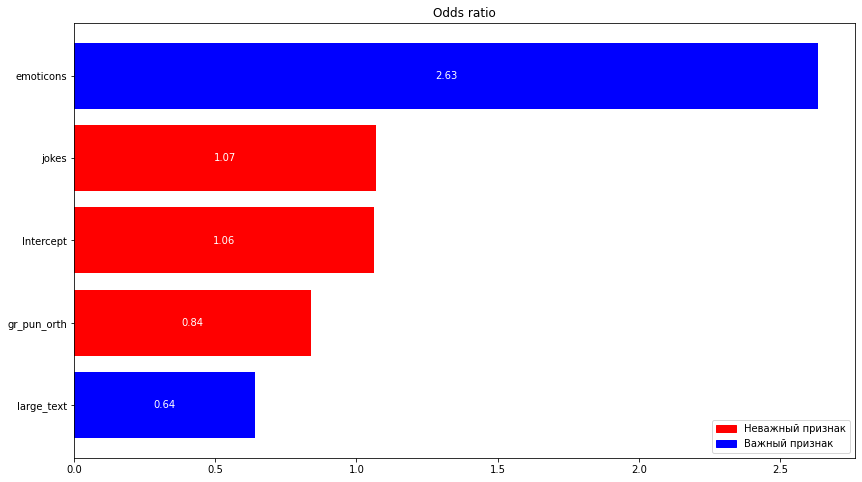

1.7161903003700205


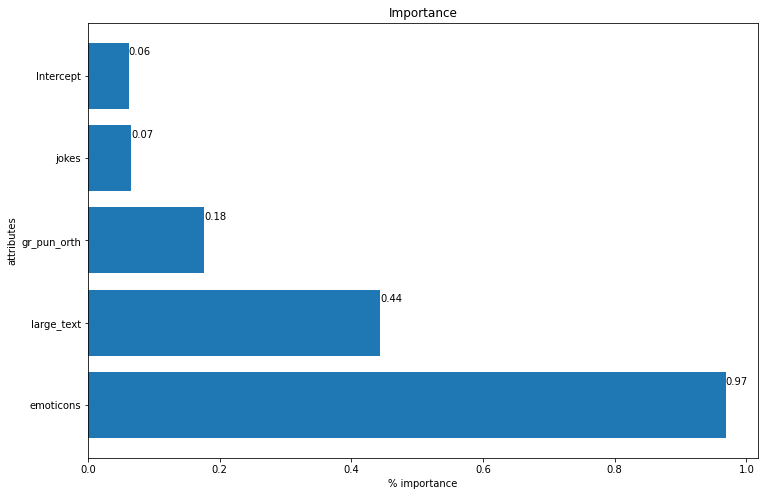

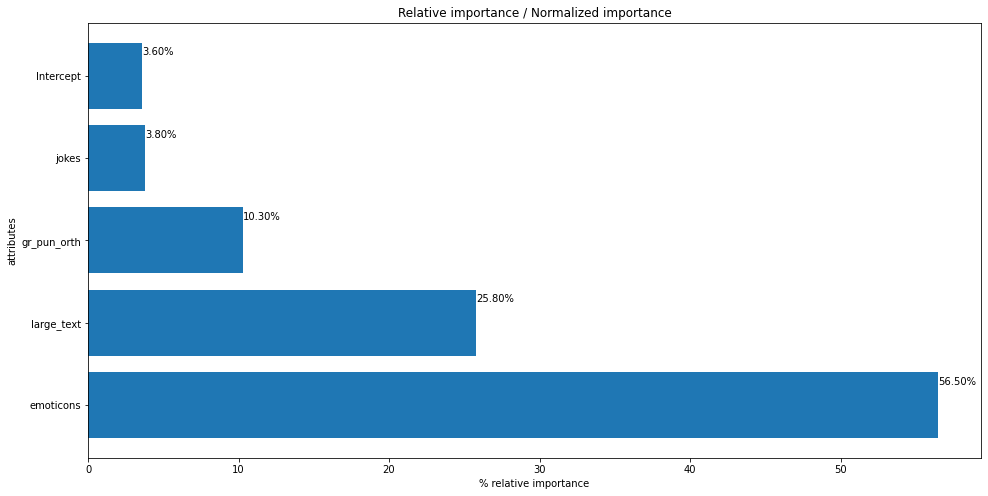

In [ ]:
res_w_int_clust4 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post4).fit()
print(res_w_int_clust4.summary())
print(odds_ratios(res_w_int_clust4))
odds_ratios(res_w_int_clust4)
odr4 = feature_or(res_w_int_clust4)
rel = feature_importance(res_w_int_clust4)
relative_importance(rel)

Объединенный график важности атрибутов среди всех кластеров:

[Text(0, 0, '1.20'),
 Text(0, 0, '2.04'),
 Text(0, 0, '1.36'),
 Text(0, 0, '1.47'),
 Text(0, 0, '')]

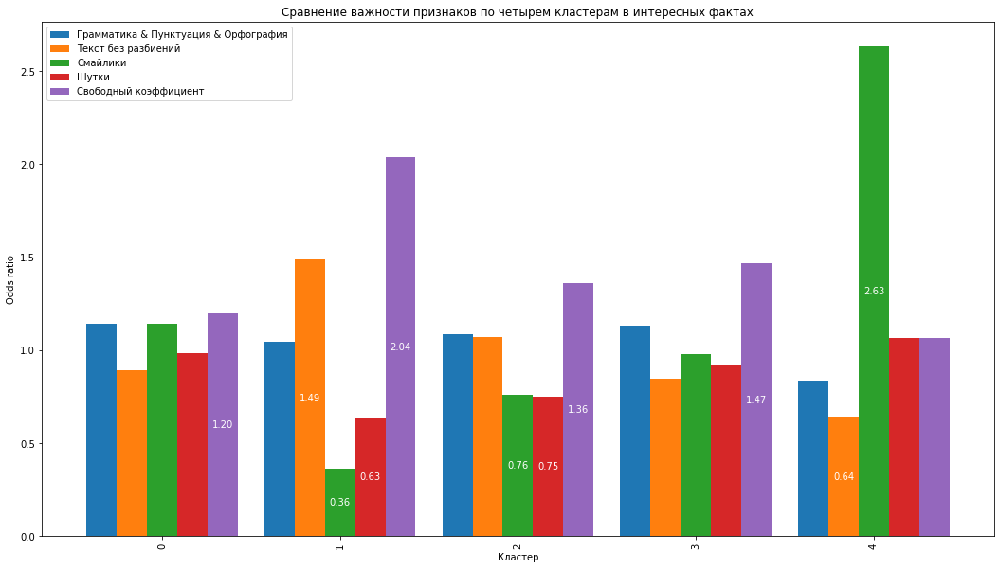

In [ ]:
# create data
df = pd.DataFrame([['0', odr0.loc['gr_pun_orth']['OR'], odr0.loc['large_text']['OR'], odr0.loc['emoticons']['OR'], odr0.loc['jokes']['OR'], odr0.loc['Intercept']['OR']],
                   ['1', odr1.loc['gr_pun_orth']['OR'], odr1.loc['large_text']['OR'], odr1.loc['emoticons']['OR'], odr1.loc['jokes']['OR'], odr1.loc['Intercept']['OR']],
                   ['2', odr2.loc['gr_pun_orth']['OR'], odr2.loc['large_text']['OR'], odr2.loc['emoticons']['OR'], odr2.loc['jokes']['OR'], odr2.loc['Intercept']['OR']],
                   ['3', odr3.loc['gr_pun_orth']['OR'], odr3.loc['large_text']['OR'], odr3.loc['emoticons']['OR'], odr3.loc['jokes']['OR'], odr3.loc['Intercept']['OR']],
                   ['4', odr4.loc['gr_pun_orth']['OR'], odr4.loc['large_text']['OR'], odr4.loc['emoticons']['OR'], odr4.loc['jokes']['OR'], odr4.loc['Intercept']['OR']]],
                  columns=['Кластер', 'Грамматика & Пунктуация & Орфография', 'Текст без разбиений', 'Смайлики', 'Шутки', 'Свободный коэффициент'])

  
# plot grouped bar chart
ax = df.plot(x='Кластер', 
             ylabel='Odds ratio',
        kind='bar',
        stacked=False,
        figsize = (18,10),
        width=0.85,
        title='Сравнение важности признаков по четырем кластерам в интересных фактах')
col_gr = [odr0['c']['gr_pun_orth'], odr1['c']['gr_pun_orth'], odr2['c']['gr_pun_orth'], odr3['c']['gr_pun_orth'], odr4['c']['gr_pun_orth']]
col_text = [odr0['c']['large_text'], odr1['c']['large_text'], odr2['c']['large_text'], odr3['c']['large_text'], odr4['c']['large_text']]
col_em = [odr0['c']['emoticons'], odr1['c']['emoticons'], odr2['c']['emoticons'], odr3['c']['emoticons'], odr4['c']['emoticons']]
col_jokes = [odr0['c']['jokes'], odr1['c']['jokes'], odr2['c']['jokes'], odr3['c']['jokes'], odr4['c']['jokes']]
col_int = [odr0['c']['Intercept'], odr1['c']['Intercept'], odr2['c']['Intercept'], odr3['c']['Intercept'], odr4['c']['Intercept']]

ax.bar_label(ax.containers[0], labels=['%.2f' % df['Грамматика & Пунктуация & Орфография'].iloc[e] if col_gr[e] == 'blue' else '' for e in range(len(df['Грамматика & Пунктуация & Орфография']))], color='white', label_type='center')
ax.bar_label(ax.containers[1], labels=['%.2f' % df['Текст без разбиений'].iloc[e] if col_text[e] == 'blue' else '' for e in range(len(df['Текст без разбиений']))], color='white', label_type='center')
ax.bar_label(ax.containers[2], labels=['%.2f' % df['Смайлики'].iloc[e] if col_em[e] == 'blue' else '' for e in range(len(df['Смайлики']))], color='white', label_type='center')
ax.bar_label(ax.containers[3], labels=['%.2f' % df['Шутки'].iloc[e] if col_jokes[e] == 'blue' else '' for e in range(len(df['Шутки']))], color='white', label_type='center')
ax.bar_label(ax.containers[4], labels=['%.2f' % df['Свободный коэффициент'].iloc[e] if col_int[e] == 'blue' else '' for e in range(len(df['Свободный коэффициент']))], color='white', label_type='center')



Только у важных признаков подписана относительная полезность. 

#### Здравоохранение

In [ ]:
health_dummy_cluster.head()

,RESPONDENT_ID,CHOICE_INDICATOR,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons,gr_pun_orth,jokes,large_text,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__4,jokes__5,large_text__1,large_text__2,large_text__4,large_text__5,cluster
0,120457015,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2
1,120457015,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2
2,120457015,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2
3,120457015,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2
4,120457015,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2


Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6126718326123556
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1740
Model:                          Logit   Df Residuals:                     1735
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.09870
Time:                        14:08:51   Log-Likelihood:                -1066.0
converged:                       True   LL-Null:                       -1182.8
Covariance Type:            nonrobust   LLR p-value:                 2.338e-49
                  coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

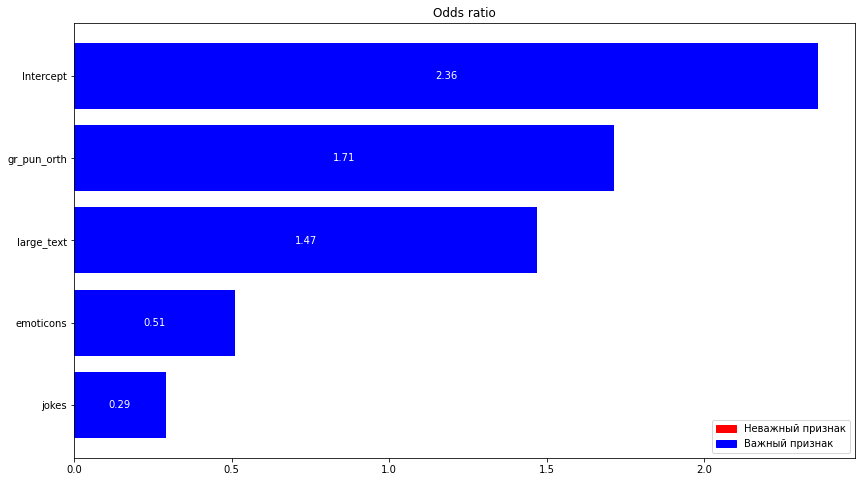

3.6900352030624743


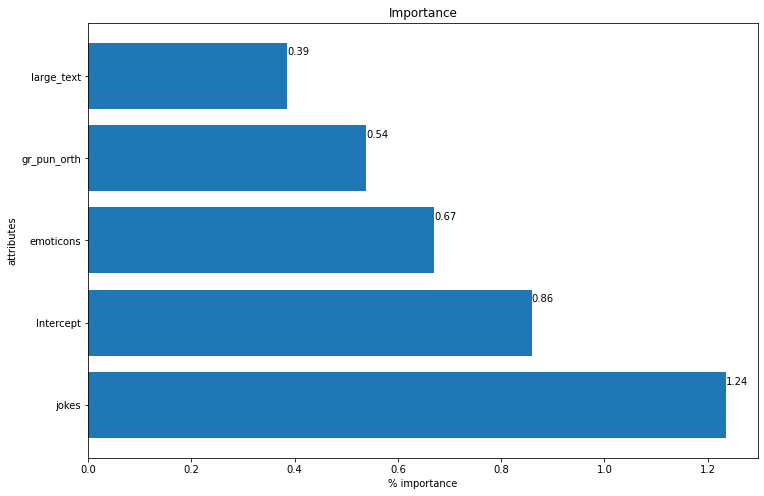

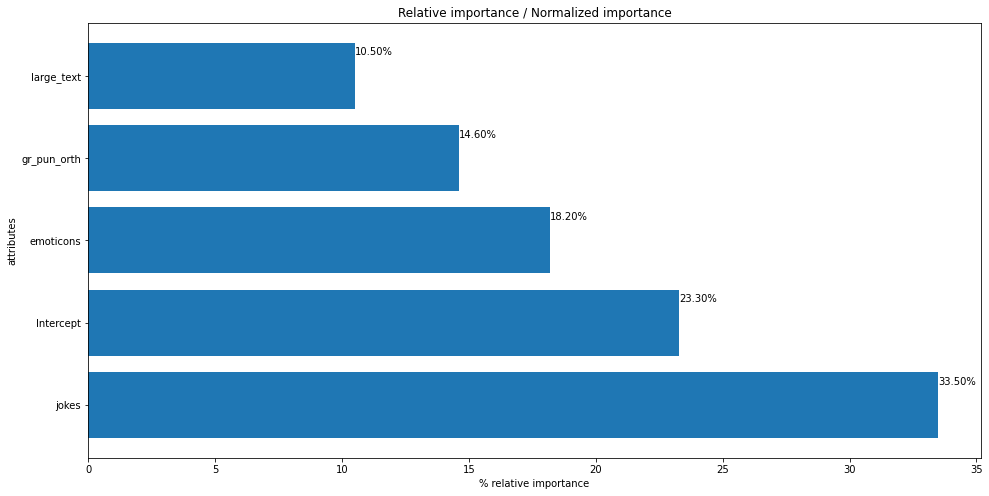

In [ ]:
res_w_int_clust0 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= health_dummy_post0).fit_regularized()
print(res_w_int_clust0.summary())
print(odds_ratios(res_w_int_clust0))
odds_ratios(res_w_int_clust0)
odr0 = feature_or(res_w_int_clust0)
rel = feature_importance(res_w_int_clust0)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.635302
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 2900
Model:                          Logit   Df Residuals:                     2895
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.06209
Time:                        14:08:52   Log-Likelihood:                -1842.4
converged:                       True   LL-Null:                       -1964.3
Covariance Type:            nonrobust   LLR p-value:                 1.331e-51
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.6544      0.078      8.373      0.000       0.501       0.808
emoticons      -0.4679    

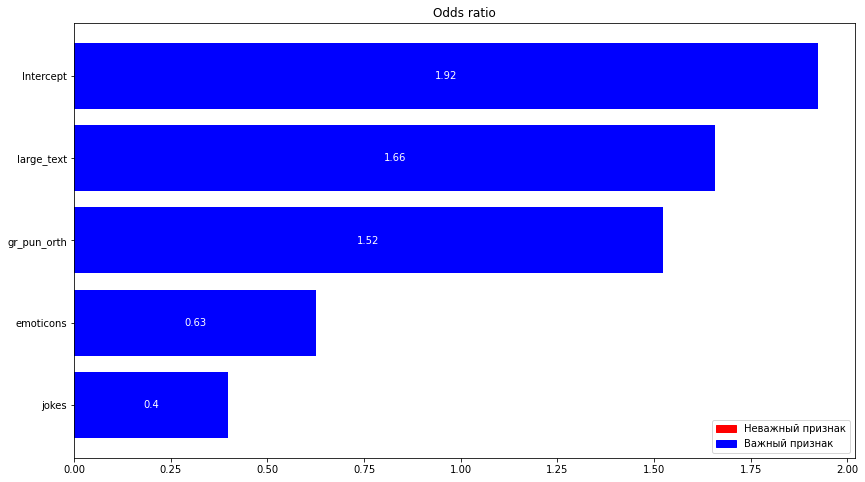

2.967614822475637


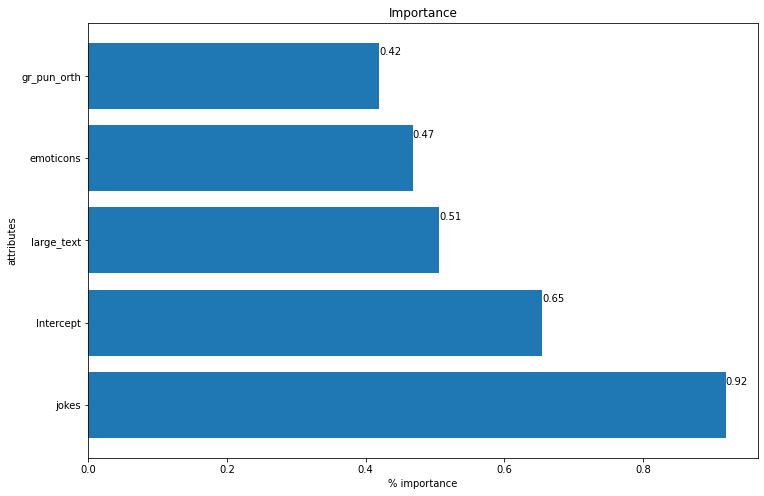

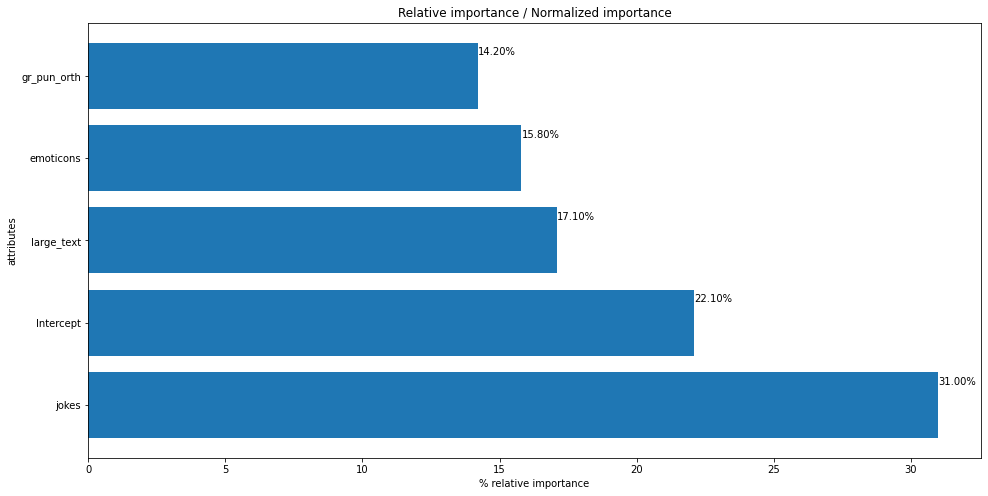

In [ ]:
res_w_int_clust1 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= health_dummy_post1).fit()
print(res_w_int_clust1.summary())
print(odds_ratios(res_w_int_clust1))
odds_ratios(res_w_int_clust1)
odr1 = feature_or(res_w_int_clust1)
rel = feature_importance(res_w_int_clust1)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.649521
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1620
Model:                          Logit   Df Residuals:                     1615
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.02680
Time:                        14:08:53   Log-Likelihood:                -1052.2
converged:                       True   LL-Null:                       -1081.2
Covariance Type:            nonrobust   LLR p-value:                 7.848e-12
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.4753      0.103      4.635      0.000       0.274       0.676
emoticons       0.1048    

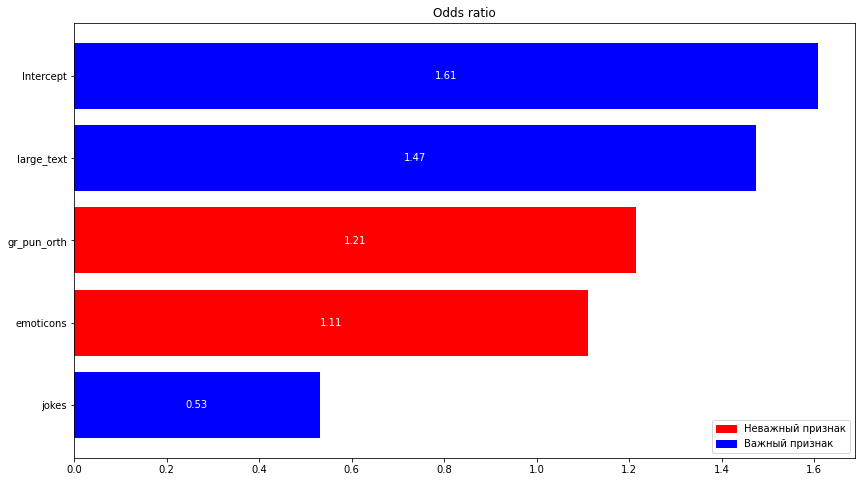

1.7958117245120961


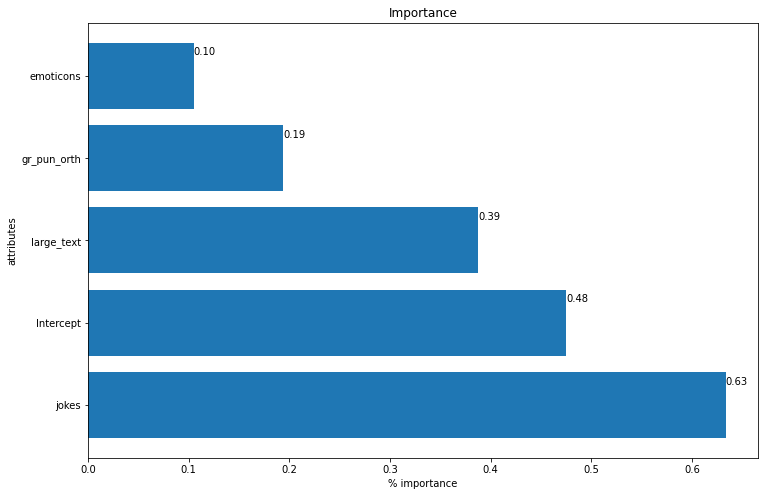

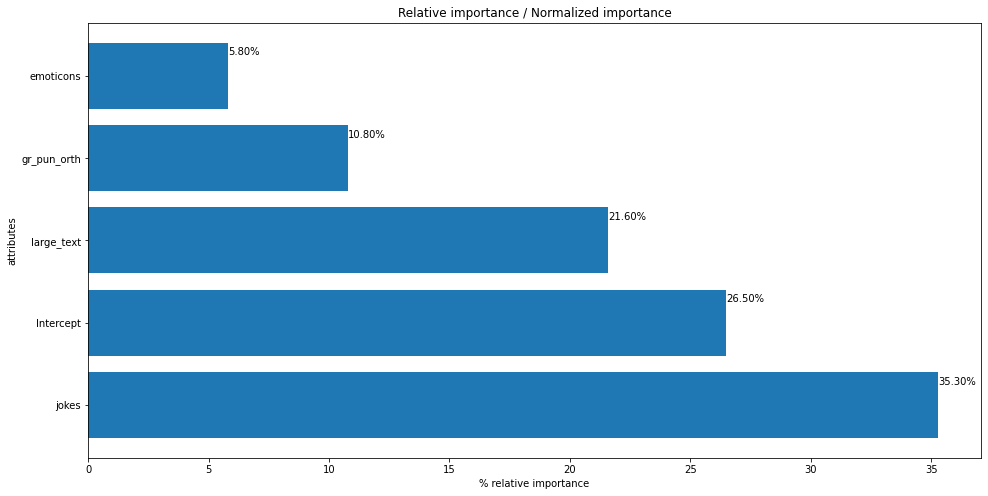

In [ ]:
res_w_int_clust2 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= health_dummy_post2).fit()
print(res_w_int_clust2.summary())
print(odds_ratios(res_w_int_clust2))
odds_ratios(res_w_int_clust2)
odr2 = feature_or(res_w_int_clust2)
rel = feature_importance(res_w_int_clust2)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.668165
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1400
Model:                          Logit   Df Residuals:                     1395
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.01433
Time:                        14:08:55   Log-Likelihood:                -935.43
converged:                       True   LL-Null:                       -949.03
Covariance Type:            nonrobust   LLR p-value:                 1.806e-05
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.3941      0.109      3.623      0.000       0.181       0.607
emoticons       0.1772    

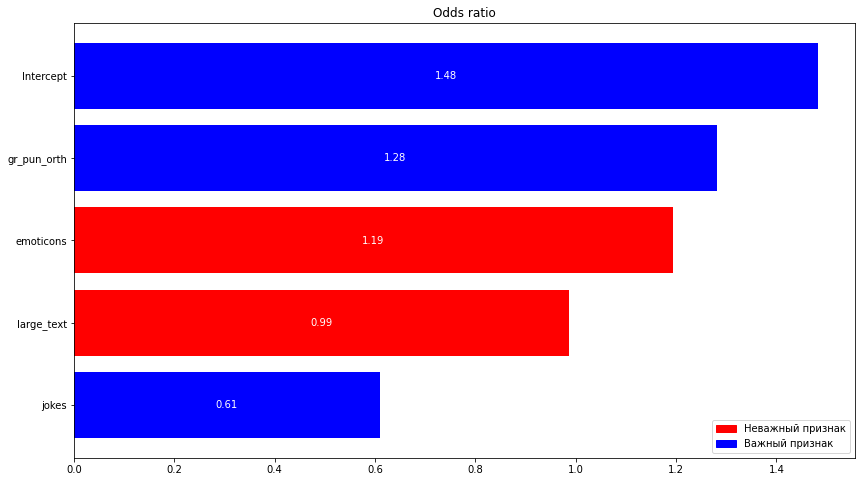

1.3273495953967858


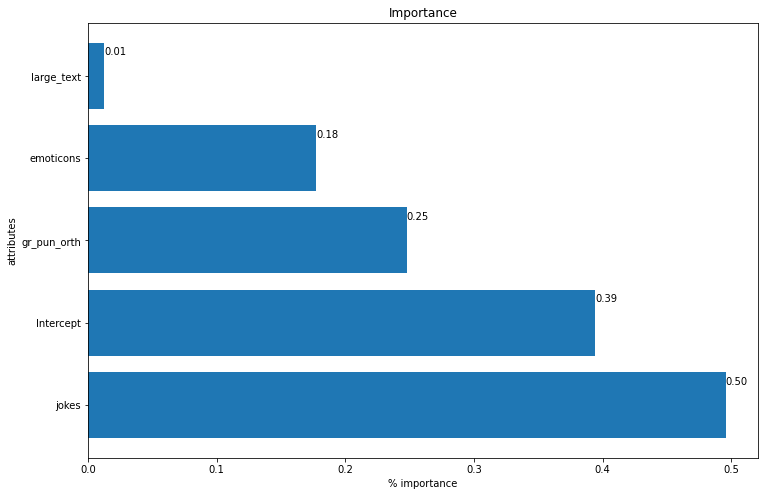

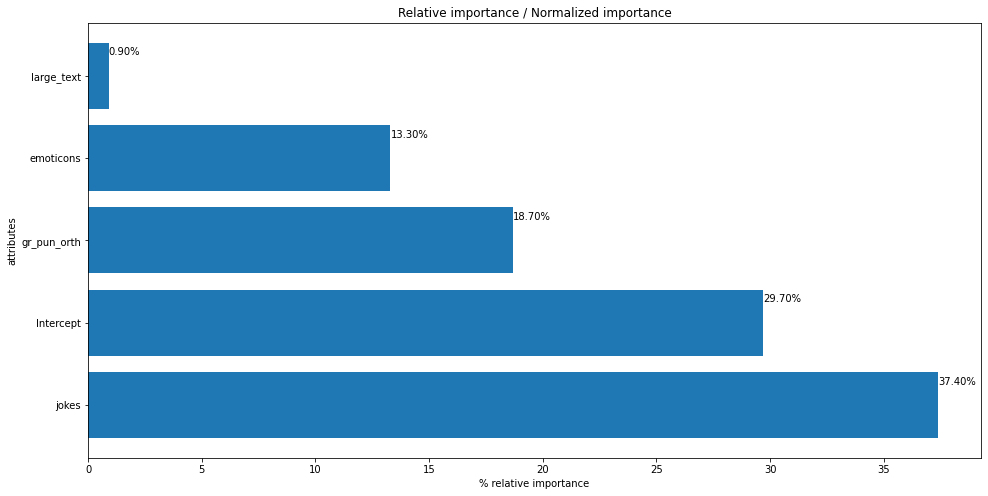

In [ ]:
res_w_int_clust3 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= health_dummy_post3).fit()
print(res_w_int_clust3.summary())
print(odds_ratios(res_w_int_clust3))
odds_ratios(res_w_int_clust3)
odr3 = feature_or(res_w_int_clust3)
rel = feature_importance(res_w_int_clust3)
relative_importance(rel)

Объединенный график важности атрибутов среди всех кластеров:

[Text(0, 0, '2.36'),
 Text(0, 0, '1.92'),
 Text(0, 0, '1.61'),
 Text(0, 0, '1.48')]

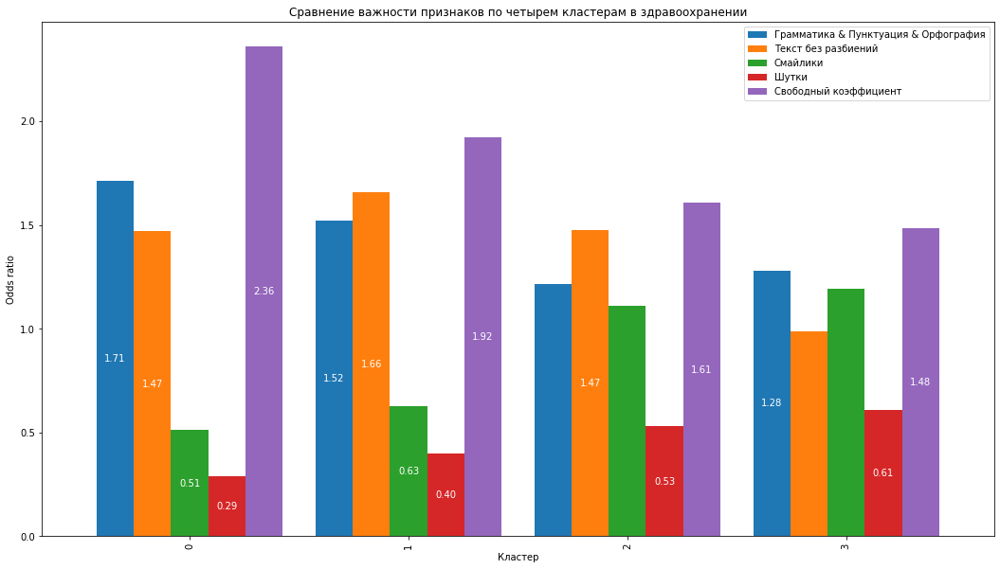

In [ ]:
# create data
df = pd.DataFrame([['0', odr0.loc['gr_pun_orth']['OR'], odr0.loc['large_text']['OR'], odr0.loc['emoticons']['OR'], odr0.loc['jokes']['OR'], odr0.loc['Intercept']['OR']],
                   ['1', odr1.loc['gr_pun_orth']['OR'], odr1.loc['large_text']['OR'], odr1.loc['emoticons']['OR'], odr1.loc['jokes']['OR'], odr1.loc['Intercept']['OR']],
                   ['2', odr2.loc['gr_pun_orth']['OR'], odr2.loc['large_text']['OR'], odr2.loc['emoticons']['OR'], odr2.loc['jokes']['OR'], odr2.loc['Intercept']['OR']],
                   ['3', odr3.loc['gr_pun_orth']['OR'], odr3.loc['large_text']['OR'], odr3.loc['emoticons']['OR'], odr3.loc['jokes']['OR'], odr3.loc['Intercept']['OR']]],
                  columns=['Кластер', 'Грамматика & Пунктуация & Орфография', 'Текст без разбиений', 'Смайлики', 'Шутки', 'Свободный коэффициент'])

  
# plot grouped bar chart
ax = df.plot(x='Кластер', 
             ylabel='Odds ratio',
        kind='bar',
        stacked=False,
        figsize = (18,10),
        width=0.85,
        title='Сравнение важности признаков по четырем кластерам в здравоохранении')

col_gr = [odr0['c']['gr_pun_orth'], odr1['c']['gr_pun_orth'], odr2['c']['gr_pun_orth'], odr3['c']['gr_pun_orth']]
col_text = [odr0['c']['large_text'], odr1['c']['large_text'], odr2['c']['large_text'], odr3['c']['large_text']]
col_em = [odr0['c']['emoticons'], odr1['c']['emoticons'], odr2['c']['emoticons'], odr3['c']['emoticons']]
col_jokes = [odr0['c']['jokes'], odr1['c']['jokes'], odr2['c']['jokes'], odr3['c']['jokes']]
col_int = [odr0['c']['Intercept'], odr1['c']['Intercept'], odr2['c']['Intercept'], odr3['c']['Intercept']]

ax.bar_label(ax.containers[0], labels=['%.2f' % df['Грамматика & Пунктуация & Орфография'].iloc[e] if col_gr[e] == 'blue' else '' for e in range(len(df['Грамматика & Пунктуация & Орфография']))], color='white', label_type='center')
ax.bar_label(ax.containers[1], labels=['%.2f' % df['Текст без разбиений'].iloc[e] if col_text[e] == 'blue' else '' for e in range(len(df['Текст без разбиений']))], color='white', label_type='center')
ax.bar_label(ax.containers[2], labels=['%.2f' % df['Смайлики'].iloc[e] if col_em[e] == 'blue' else '' for e in range(len(df['Смайлики']))], color='white', label_type='center')
ax.bar_label(ax.containers[3], labels=['%.2f' % df['Шутки'].iloc[e] if col_jokes[e] == 'blue' else '' for e in range(len(df['Шутки']))], color='white', label_type='center')
ax.bar_label(ax.containers[4], labels=['%.2f' % df['Свободный коэффициент'].iloc[e] if col_int[e] == 'blue' else '' for e in range(len(df['Свободный коэффициент']))], color='white', label_type='center')



Только у важных признаков подписана относительная полезность. 

## Регрессия по тематикам с доп. переменной, отвечающей за кластер по результатам совместного анализа

![Интересные факты](https://drive.google.com/uc?export=view&id=1nkQu0KD_FSyw_nquW3eJnRek3837gxTy)
**Кластер 1:**
- Шансы того, что диалогу доверят, увеличиваются в 1.78 раз при наличии текста без разбиений (p-value = 0.006). 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация (p-value = 0.000). 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 2:** 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.63) при наличии смайликов (p-value = 0.000). 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.32) при наличии шуток (p-value = 0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 2.15 раза при наличии текста без разбиений (p-value = 0.000). 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация (p-value=0.000). 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 3:** 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.06) при наличии смайликов (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 2.58 раз при правильной грамматики, орфографии и пунктуации (p-value=0.000). 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация (p-value=0.000). 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 4:** 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.52) при правильной грамматики, орфографии и пунктуации (p-value=0.000). 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.48) при 
наличии шуток (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 11.02 раз при присутствии смайликов (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 1.40 раза при наличии текста без разбиений (p-value=0.015). 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация (p-value=0.000). 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05.

**Кластер 5:** 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.37) при наличии смайликов (p-value=0.000). 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.49) при правильной грамматики, орфографии и пунктуации (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 2.42 раза при присутствии шуток (p-value=0.000). 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация (p-value=0.000). 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 6:** 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.28) при наличии текста без разбиений (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 1.72 раза при правильной грамматики, орфографии и пунктуации (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 2.53 раза при наличии смайликов (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 1.36 раза при наличии шуток (p-value=0.003). 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

![Здравоохранение](https://drive.google.com/uc?export=view&id=12fQxSk3-ELmur9Q7nuY9n-EzJCg1BU_a)

**Кластер 1:**
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.32) при наличии шуток (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 1.41 раз при правильной грамматики, орфографии и пунктуации (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 1.62 раза при наличии текста без разбиений (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 1.44 раз при наличии смайликов (p-value=0.000). 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация (p-value=0.000). 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 2:** 
- Шансы того, что диалогу доверят, увеличиваются в 1.74 раза при правильной грамматики, орфографии и пунктуации (p-value=0.007). 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация (p-value=0.000). 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 

**Кластер 3:**
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.21) при наличии смайликов (p-value=0.000). 
- Шансы того, что диалогу доверят, уменьшаются (увеличиваются в 0.52) при наличии шуток (p-value=0.000). 
- Шансы того, что диалогу доверят, увеличиваются в 1.49 раз при правильной грамматики, орфографии и пунктуации (p-value=0.000). 
- Также значимым фактором является свободный коэффициент, то есть когда в диалоге отсутствуют шутки, смайлики, присутствует разбиение текста и неправильно поставленные грамматика, орфография и пунктуация (p-value=0.000). 
- Остальные факторы не влияют на принятие решения при статистической значимости 0.05. 




In [ ]:
# функция для подсчета предпочтений каждого пользователя отдельно

def ind_preferences(df):
  df_ind_pref = pd.DataFrame(columns=['RESPONDENT_ID', 'emoticons', 'large_text', 'gr_pun_orth', 'jokes', 'Intercept',
                                      'p_value_em', 'p_value_text', 'p_value_gr', 'p_value_jokes', 'p_value_int'])

  i = 0
  while i < len(df) // 20:
    user_data = df.iloc[20 * i : (20 * i +20), :]
    print(np.linalg.matrix_rank(user_data[['CHOICE_INDICATOR', 'emoticons', 'gr_pun_orth', 'jokes', 'large_text']]))
    res = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= user_data).fit(maxiter=100, method='bfgs')
    # res = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= user_data).fit_regularized(maxiter=100)
    # print(user_data['RESPONDENT_ID'])
    
    list_values = [0] * 5 # 'emoticons', 'large_text', 'gr_pun_orth', 'jokes', 'Intercept'
    for j in range(5):
      if res.params.keys()[j] == 'emoticons':
        list_values[0] = res.params.values[j]
      elif res.params.keys()[j] == 'large_text':
        list_values[1] = res.params.values[j]
      elif res.params.keys()[j] == 'gr_pun_orth':
        list_values[2] = res.params.values[j]
      elif res.params.keys()[j] == 'jokes':
        list_values[3] = res.params.values[j]
      else:
        list_values[4] = res.params.values[j]

    new_row = {'RESPONDENT_ID': int(user_data.iloc[0]['RESPONDENT_ID']), 'emoticons': list_values[0], 'large_text': list_values[1], 
              'gr_pun_orth': list_values[2], 'jokes': list_values[3], 'Intercept': list_values[4],
              'p_value_em': res.pvalues['emoticons'], 'p_value_text': res.pvalues['large_text'], 
              'p_value_gr': res.pvalues['gr_pun_orth'], 'p_value_jokes': res.pvalues['jokes'], 
              'p_value_int': res.pvalues['Intercept']}
    df_ind_pref = df_ind_pref.append(new_row, ignore_index=True)
    i = i + 1

  df_ind_pref['RESPONDENT_ID'] = df_ind_pref['RESPONDENT_ID'].astype(int)
  return df_ind_pref

### Интересные факты

#### Интересные факты - индивидуальные предпочтения

In [ ]:
facts_dummy[['CHOICE_INDICATOR', 'emoticons', 'gr_pun_orth', 'jokes', 'large_text']].head()

,CHOICE_INDICATOR,emoticons,gr_pun_orth,jokes,large_text
0,0,1,0,0,1
1,1,1,1,0,0
2,1,0,0,1,1
3,0,1,0,1,1
4,0,1,1,0,1


In [ ]:
# чтобы разделить данные конджоинта на кластеры, нужно сначала создать таблицу предпочтений по пользователям

In [ ]:
df_ind_pref = ind_preferences(facts_dummy)

5
Optimization terminated successfully.
         Current function value: 0.671503
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
5
Optimization terminated successfully.
         Current function value: 0.095477
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
5
Optimization terminated successfully.
         Current function value: 0.433080
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
5
Optimization terminated successfully.
         Current function value: 0.576625
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
5
Optimization terminated successfully.
         Current function value: 0.640381
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
5
Optimization terminated successfully.
         Current function value: 0.369745
         Iterations: 42
         Function evalua

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.396995
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
5
Optimization terminated successfully.
         Current function value: 0.448564
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
5
Optimization terminated successfully.
         Current function value: 0.523317
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.475316
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.069317
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
5
Optimization terminated successfully.
         Current function value: 0.446297
         Iterations: 29
         Function evaluati

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


5
Optimization terminated successfully.
         Current function value: 0.453047
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.483638
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.552805
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.664126
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
5
Optimization terminated successfully.
         Current function value: 0.546517
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
5
Optimization terminated successfully.
         Current function value: 0.474719
         Iterations: 28
         Function evalua

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.555999
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.366015
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
5
Optimization terminated successfully.
         Current function value: 0.377443
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
5
Optimization terminated successfully.
         Current function value: 0.360245
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
5
Optimization terminated successfully.
         Current function value: 0.457960
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
5
Optimization terminated successfully.
         Current function value: 0.421517
         Iterations: 30
         Function evaluati

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.340685
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
5
Optimization terminated successfully.
         Current function value: 0.520781
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.669807
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
5
Optimization terminated successfully.
         Current function value: 0.459797
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
5
Optimization terminated successfully.
         Current function value: 0.548328
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.648686
         Iterations: 25
         Function evaluati

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


5
Optimization terminated successfully.
         Current function value: 0.069315
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
5
Optimization terminated successfully.
         Current function value: 0.488945
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
5


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.523952
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.613831
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
5
Optimization terminated successfully.
         Current function value: 0.434087
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
5
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
5
Optimization terminated successfully.
         Current function value: 0.235881
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
5
Optimization terminated successfully.
         Current function value: 0.434312
         Iterations: 30
         Function evaluati

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


5
Optimization terminated successfully.
         Current function value: 0.380728
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
5
Optimization terminated successfully.
         Current function value: 0.530452
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.593251
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.511946
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
5
Optimization terminated successfully.
         Current function value: 0.359402
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
5
Optimization terminated successfully.
         Current function value: 0.598460
         Iterations: 25
         Function evalua

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


5
Optimization terminated successfully.
         Current function value: 0.517147
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.564738
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.424928
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
5
Optimization terminated successfully.
         Current function value: 0.613459
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
5
Optimization terminated successfully.
         Current function value: 0.533240
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
5
Optimization terminated successfully.
         Current function value: 0.563772
         Iterations: 27
         Function evalua

In [ ]:
# то есть присутствуют нулевые значения pvalue, как раз для которых ошибка выдавалась
df_ind_pref[df_ind_pref.isna().any(axis=1)]

,RESPONDENT_ID,emoticons,large_text,gr_pun_orth,jokes,Intercept,p_value_em,p_value_text,p_value_gr,p_value_jokes,p_value_int
45,120500608,-79.102467,23.834335,90.365752,93.082403,-0.000132,NaN,NaN,NaN,NaN,NaN
77,120500934,-117.943096,56.679969,-108.486632,120.777873,48.971637,NaN,NaN,NaN,NaN,NaN
92,120501388,153.672625,23.864298,-54.217915,-34.036663,-0.693323,NaN,NaN,NaN,NaN,NaN
133,120505884,49.299300,41.901348,18.286333,-30.507643,-0.693354,NaN,NaN,NaN,NaN,NaN
209,120549846,-214.933596,96.825086,37.667537,-79.787096,126.726095,NaN,NaN,NaN,NaN,NaN
211,120549851,-116.175713,-33.810953,-101.539055,88.908008,128.806531,NaN,NaN,NaN,NaN,NaN
256,120554409,-59.078867,15.866497,-1.733197,-58.584333,59.450826,NaN,NaN,NaN,NaN,NaN
338,120590731,-284.370914,-101.213983,83.006296,69.795493,201.364834,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_ind_pref.columns

Index(['RESPONDENT_ID', 'emoticons', 'large_text', 'gr_pun_orth', 'jokes',
       'Intercept', 'p_value_em', 'p_value_text', 'p_value_gr',
       'p_value_jokes', 'p_value_int'],
      dtype='object')

#### Интересные факты - кластеризация

In [ ]:
columns = ['emoticons', 'large_text', 'gr_pun_orth', 'jokes', 'Intercept']

In [ ]:
7700// 20

385

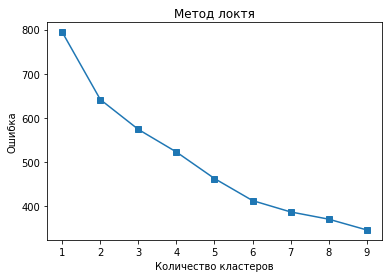

In [ ]:
# метод локтя
elbow_method(df_ind_pref[columns])


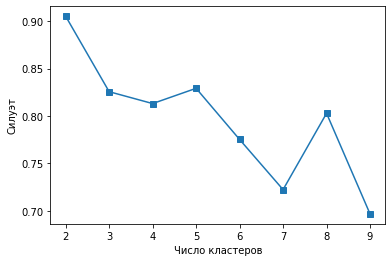

In [ ]:
silhouette(df_ind_pref[columns])

Максимальное значение силуэта соответствует двум кластерам. Поэтому выбираем 2. По методу локтя нет явного падения вниз при каком-то количестве кластеров. ПОСМОТРЕТЬ 5 КЛАСТЕРОВ, ТАК КАК 2 ОБЫЧНО ОПУСКАЮТ

In [ ]:
kmodel_conjoint = KMeans(n_clusters = 2, random_state=1)
kmodel_conjoint.fit(df_ind_pref[columns])
kmodel_conjoint.cluster_centers_

array([[ 1.47144769e+00,  1.01782181e-01,  2.62789152e-01,
        -5.46566904e-01,  1.17558098e+00],
       [-1.65583061e+02,  1.56527134e+01, -2.26706273e+01,
         2.10404451e+01,  1.24872481e+02]])

In [ ]:
res = df_ind_pref[columns].copy()
res["cluster"] = kmodel_conjoint.labels_
res.groupby("cluster").mean()

,emoticons,large_text,gr_pun_orth,jokes,Intercept
cluster,,,,,
0,1.471448,0.101782,0.262789,-0.546567,1.175581
1,-165.583061,15.652713,-22.670627,21.040445,124.872481


In [ ]:

# неравное деление на кластеры: 380 пользователей и 5
res.groupby("cluster").describe()

emoticons                                                             \
            count        mean        std         min         25%         50%   
cluster                                                                        
0        380.0     1.471448    19.756165 -79.102467  -1.657332    0.157351     
1        5.0      -165.583061  81.102747 -284.370914 -214.933596 -117.943096   

                                large_text                                    \
                75%         max      count       mean        std         min   
cluster                                                                        
0        1.912399    153.672625  380.0      0.101782   9.345408  -76.890690    
1       -116.175713 -94.491985   5.0        15.652713  81.123657 -101.213983   

                                                    gr_pun_orth             \
               25%        50%        75%        max       count       mean   
cluster                                                                      
0       -1.356160  -0.126964   1.028930   41.901348  380.0       0.262789    
1       -33.810953  56.679969  59.783448  96.825086  5.0        -22.670627   

                                                                             \
               std         min         25%        50%        75%        max   
cluster                                                                       
0        8.971436  -54.217915  -0.869034    0.012024   1.057383   90.365752   
1        84.253623 -108.486632 -101.539055 -24.001283  37.667537  83.006296   

         jokes                                                          \
         count       mean         std        min        25%        50%   
cluster                                                                  
0        380.0 -0.546567   10.728824  -78.035768 -1.497841  -0.231480    
1        5.0    21.040445  100.554172 -94.492052 -79.787096  69.795493   

                               Intercept                                    \
               75%         max     count        mean        std        min   
cluster                                                                      
0        1.012558   93.082403   380.0     1.175581    7.773357  -44.354396   
1        88.908008  120.777873  5.0       124.872481  54.017647  48.971637   

                                                         
                25%         50%         75%         max  
cluster                                                  
0       -0.418849    0.312726    1.239736    60.636064   
1        118.493310  126.726095  128.806531  201.364834

In [ ]:
df_ind_pref['cluster'] = pd.Series(kmodel_conjoint.labels_, index=df_ind_pref.index)
facts_dummy_cluster = facts_dummy.merge(df_ind_pref[['RESPONDENT_ID', 'cluster']], how='inner', on='RESPONDENT_ID', )

In [ ]:
facts_dummy_post0 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 0]
facts_dummy_post1 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 1]

In [ ]:
len(facts_dummy_post0) // 20

380

#### Интересные факты - индивидуальные предпочтения по относительному количеству профилей

In [ ]:
def ind_preferences_ratio(df):
  df_ind_pref = pd.DataFrame(columns=['RESPONDENT_ID', 'emoticons', 'large_text', 'gr_pun_orth', 'jokes'])

  i = 0
  while i < len(df) // 20:
    user_data = df.iloc[20 * i : (20 * i +20), :]
    emoticons = user_data['emoticons'].sum()
    large_text = user_data['large_text'].sum()
    gr_pun_orth = user_data['gr_pun_orth'].sum()
    jokes = user_data['jokes'].sum()

    list_values = [0] * 4 # 'emoticons', 'large_text', 'gr_pun_orth', 'jokes'
    if emoticons != 0:
      list_values[0] = (user_data[user_data['emoticons'] == 1]['emoticons'] *
                        user_data[user_data['emoticons'] == 1]['CHOICE_INDICATOR']).sum() / emoticons
    else:
      list_values[0] = 0

    if large_text != 0:
      list_values[1] = (user_data[user_data['large_text'] == 1]['large_text'] *
                        user_data[user_data['large_text'] == 1]['CHOICE_INDICATOR']).sum() / large_text
    else:
      list_values[1] = 0

    if gr_pun_orth != 0:
      list_values[2] = (user_data[user_data['gr_pun_orth'] == 1]['gr_pun_orth'] *
                        user_data[user_data['gr_pun_orth'] == 1]['CHOICE_INDICATOR']).sum() / gr_pun_orth
    else:
      list_values[2] = 0

    if jokes != 0:
      list_values[3] = (user_data[user_data['jokes'] == 1]['jokes'] *
                        user_data[user_data['jokes'] == 1]['CHOICE_INDICATOR']).sum() / jokes
    else:
      list_values[3] = 0

    new_row = {'RESPONDENT_ID': int(user_data.iloc[0]['RESPONDENT_ID']), 'emoticons': list_values[0], 'large_text': list_values[1], 
              'gr_pun_orth': list_values[2], 'jokes': list_values[3]}
    df_ind_pref = df_ind_pref.append(new_row, ignore_index=True)
    i = i + 1

  df_ind_pref['RESPONDENT_ID'] = df_ind_pref['RESPONDENT_ID'].astype(int)
  return df_ind_pref

In [ ]:
facts_dummy.head()

,RESPONDENT_ID,CHOICE_INDICATOR,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons,gr_pun_orth,jokes,large_text,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__3,jokes__4,large_text__1,large_text__2,large_text__4,large_text__5
0,120470635,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
1,120470635,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
2,120470635,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
3,120470635,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
4,120470635,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
df_ind_pref = ind_preferences_ratio(facts_dummy)

In [ ]:
df_ind_pref.head()

,RESPONDENT_ID,emoticons,large_text,gr_pun_orth,jokes
0,120470635,0.545455,0.428571,0.555556,0.454545
1,120470672,1.000000,0.500000,0.444444,0.555556
2,120470716,0.300000,0.333333,0.333333,0.250000
3,120470783,0.583333,0.300000,0.625000,0.555556
4,120470813,0.500000,0.500000,0.555556,0.333333


#### Интересные факты - кластеризация по долям

**Описание кластеров в интересных фактах:**<br>
Получилось примерно одинаковое количество пользователей в кластерах: 34, 86, 40, 61, 73, 91. 

Кластер 1:<br>
- **Смайлики:** тут больше всего людей, которые выбирали профили со смайликами в среднем чаще всего, в 83% случаях в среднем. 
- **Шутки:** тут больше всего людей, которые выбирали профили с шутками в среднем чаще всего, в 85% случаях в среднем. 
- **Грамматика, орфография, пунктуация:** тут больше всего людей, которые выбирали профили с правильными грамматикой, пунктуацией, орфографией в среднем чаще всего, в 82% случаях в среднем. 
- **Текст без разбиений:** тут больше всего людей, которые выбирали профили с текстом без разбиений в среднем чаще всего, в 79% случаях в среднем. 

Кластер 2:<br>
- Смайлики: в среднем в 48% случаях из всех появлений профилей со смайликами пользователь выбирает профиль со смайликами.
- Шутки: тут больше всего людей, которые выбирали профили с шутками в среднем реже всего, в 37% случаях в среднем. (50% пользователей в среднем выбирают не больше 36% профилей с шутками. Понятно, почему оказывает негативное влияние.)
- Грамматика, орфография, пунктуация: в среднем в 53% случаях из всех появлений профилей с правильной грамматикой, пунктуацией и орфографией пользователь выбирает профиль со правильной грамматикой, пунктуацией и орфографией.
- **Текст без разбиений:** в среднем в 64% случаях из всех появлений профилей с текстом без разбиений пользователь выбирает профиль с текстом без разбиений.

Кластер 3:<br>
- Смайлики: тут больше всего людей, которые выбирали профили со смайликами в среднем реже всегов, в 18% случаях в среднем.
- Шутки: в среднем в 47% случаях из всех появлений профилей с шутками пользователь выбирает профиль с шутками.
- **Грамматика, орфография, пунктуация:** в среднем в 60% случаях из всех появлений профилей с правильной грамматикой, пунктуацией и орфографией пользователь выбирает профиль со правильной грамматикой, пунктуацией и орфографией. (50% пользователей в среднем выбирают ниже 66% профилей с шутками. Понятно, почему оказывает негативное влияние.)
- Текст без разбиений: в среднем в 46% случаях из всех появлений профилей с текстом без разбиений пользователь выбирает профиль с текстом без разбиений.

Кластер 4:<br>
- **Смайлики:** в среднем в 79% случаях из всех появлений профилей со смайликами пользователь выбирает профиль со смайликами.
- Шутки: в среднем в 50% случаях из всех появлений профилей с шутками пользователь выбирает профиль с шутками.
- Грамматика, орфография, пунктуация: в среднем в 49% случаях из всех появлений профилей с правильной грамматикой, пунктуацией и орфографией пользователь выбирает профиль со правильной грамматикой, пунктуацией и орфографией.
- **Текст без разбиений:** в среднем в 62% случаях из всех появлений профилей с текстом без разбиений пользователь выбирает профиль с текстом без разбиений.

Кластер 5:<br>
- Смайлики: в среднем в 42% случаях из всех появлений профилей со смайликами пользователь выбирает профиль со смайликами.
- **Шутки:** в среднем в 62% случаях из всех появлений профилей с шутками пользователь выбирает профиль с шутками.
- Грамматика, орфография, пунктуация: тут больше всего людей, которые выбирали профили с правильными грамматикой, пунктуацией, орфографией в среднем реже всего, в 41% случаях в среднем.
- Текст без разбиений: в среднем в 50% случаях из всех появлений профилей с текстом без разбиений пользователь выбирает профиль с текстом без разбиений.

Кластер 6:<br>
- **Смайлики:** в среднем в 65% случаях из всех появлений профилей со смайликами пользователь выбирает профиль со смайликами.
- **Шутки:** в среднем в 59% случаях из всех появлений профилей с шутками пользователь выбирает профиль с шутками.
- **Грамматика, орфография, пунктуация:** в среднем в 65% случаях из всех появлений профилей с правильной грамматикой, пунктуацией и орфографией пользователь выбирает профиль со правильной грамматикой, пунктуацией и орфографией.
- Текст без разбиений: тут больше всего людей, которые выбирали профили с текстом без разбиений в среднем реже всего, в 38% случаях в среднем.

In [ ]:
columns = ['emoticons', 'large_text', 'gr_pun_orth', 'jokes']

In [ ]:
7700// 20

385

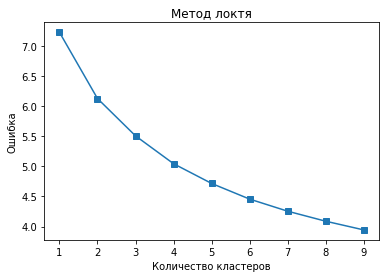

In [ ]:
# метод локтя
elbow_method(df_ind_pref[columns])


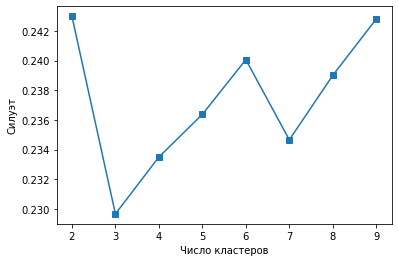

In [ ]:
silhouette(df_ind_pref[columns])

Выбираем 6 кластеров

In [ ]:
kmodel_conjoint = KMeans(n_clusters =6, random_state=1)
kmodel_conjoint.fit(df_ind_pref[columns])
kmodel_conjoint.cluster_centers_

array([[0.83006536, 0.84805089, 0.81862745, 0.79040404],
       [0.47520848, 0.64414452, 0.52810078, 0.37273902],
       [0.18111742, 0.4552381 , 0.60138889, 0.47238005],
       [0.79254016, 0.61540463, 0.48770492, 0.49857178],
       [0.42388958, 0.49597739, 0.40829528, 0.62365089],
       [0.64695582, 0.37702337, 0.65277778, 0.59521035]])

In [ ]:
res = df_ind_pref[columns].copy()
res["cluster"] = kmodel_conjoint.labels_
res_mean = res.groupby("cluster", as_index=False).mean()
res_mean

,cluster,emoticons,large_text,gr_pun_orth,jokes
0,0,0.830065,0.848051,0.818627,0.790404
1,1,0.475208,0.644145,0.528101,0.372739
2,2,0.181117,0.455238,0.601389,0.472380
3,3,0.792540,0.615405,0.487705,0.498572
4,4,0.423890,0.495977,0.408295,0.623651
5,5,0.646956,0.377023,0.652778,0.595210


In [ ]:
# неравное деление на кластеры: 380 пользователей и 5
res.groupby("cluster").describe()

emoticons                                                              \
            count      mean       std       min       25%       50%       75%   
cluster                                                                         
0        34.0      0.830065  0.138685  0.500000  0.777778  0.854167  0.914773   
1        86.0      0.475208  0.100511  0.272727  0.375000  0.500000  0.545455   
2        40.0      0.181117  0.109831  0.000000  0.121528  0.162500  0.250000   
3        61.0      0.792540  0.095661  0.625000  0.750000  0.777778  0.818182   
4        73.0      0.423890  0.112438  0.200000  0.333333  0.416667  0.500000   
5        91.0      0.646956  0.106123  0.375000  0.583333  0.636364  0.727273   

                  large_text                                          \
              max      count      mean       std       min       25%   
cluster                                                                
0        1.000000  34.0       0.848051  0.143983  0.571429  0.750000   
1        0.700000  86.0       0.644145  0.123479  0.375000  0.559524   
2        0.400000  40.0       0.455238  0.126383  0.250000  0.364583   
3        1.000000  61.0       0.615405  0.115309  0.375000  0.500000   
4        0.636364  73.0       0.495977  0.113639  0.250000  0.400000   
5        0.909091  91.0       0.377023  0.111210  0.125000  0.285714   

                                      gr_pun_orth                      \
              50%       75%       max       count      mean       std   
cluster                                                                 
0        0.881944  1.000000  1.000000  34.0        0.818627  0.112779   
1        0.625000  0.714286  0.875000  86.0        0.528101  0.119950   
2        0.500000  0.500000  0.750000  40.0        0.601389  0.087965   
3        0.625000  0.666667  0.888889  61.0        0.487705  0.123215   
4        0.500000  0.600000  0.750000  73.0        0.408295  0.125891   
5        0.375000  0.428571  0.625000  91.0        0.652778  0.122191   

                                                          jokes            \
              min       25%       50%       75%       max count      mean   
cluster                                                                     
0        0.555556  0.777778  0.826389  0.888889  1.000000  34.0  0.790404   
1        0.333333  0.444444  0.555556  0.607639  0.888889  86.0  0.372739   
2        0.333333  0.555556  0.666667  0.666667  0.777778  40.0  0.472380   
3        0.222222  0.444444  0.444444  0.555556  0.777778  61.0  0.498572   
4        0.125000  0.333333  0.444444  0.500000  0.666667  73.0  0.623651   
5        0.444444  0.555556  0.666667  0.750000  0.888889  91.0  0.595210   

                                                                     
              std       min       25%       50%       75%       max  
cluster                                                              
0        0.116157  0.625000  0.727273  0.777778  0.888889  1.000000  
1        0.115774  0.125000  0.272727  0.363636  0.444444  0.666667  
2        0.098006  0.250000  0.427083  0.444444  0.555556  0.666667  
3        0.101367  0.333333  0.444444  0.500000  0.555556  0.750000  
4        0.109251  0.375000  0.555556  0.625000  0.666667  0.888889  
5        0.115514  0.333333  0.545455  0.555556  0.666667  1.000000

In [ ]:
df_ind_pref['cluster'] = pd.Series(kmodel_conjoint.labels_, index=df_ind_pref.index)
facts_dummy_cluster = facts_dummy.merge(df_ind_pref[['RESPONDENT_ID', 'cluster']], how='inner', on='RESPONDENT_ID', )

In [ ]:
facts_dummy_post0 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 0]
facts_dummy_post1 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 1]
facts_dummy_post2 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 2]
facts_dummy_post3 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 3]
facts_dummy_post4 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 4]
facts_dummy_post5 = facts_dummy_cluster[facts_dummy_cluster['cluster'] == 5]

In [ ]:
len(facts_dummy_post0) // 20

34

#### Интересные факты - регрессия

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.4952809160497785
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                  680
Model:                          Logit   Df Residuals:                      675
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.02207
Time:                        14:10:09   Log-Likelihood:                -336.79
converged:                       True   LL-Null:                       -344.39
Covariance Type:            nonrobust   LLR p-value:                  0.004302
                  coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

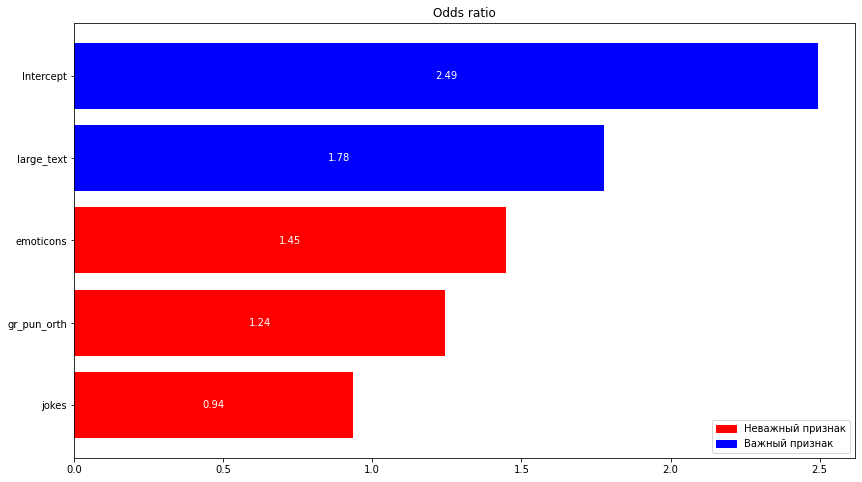

2.1431645016099465


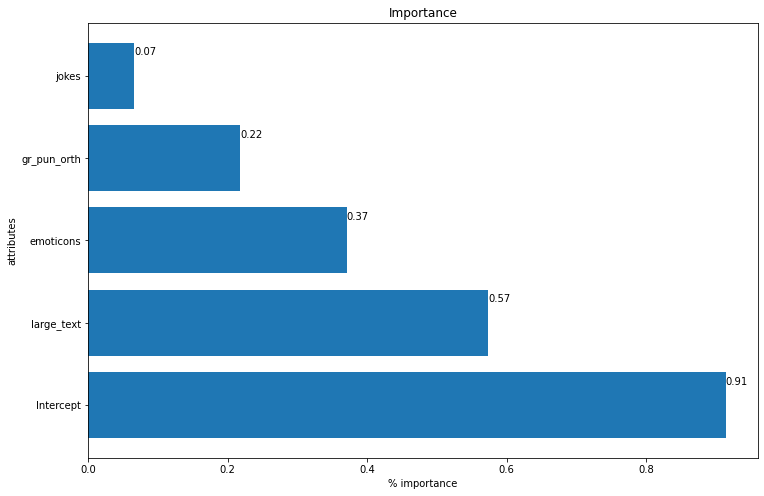

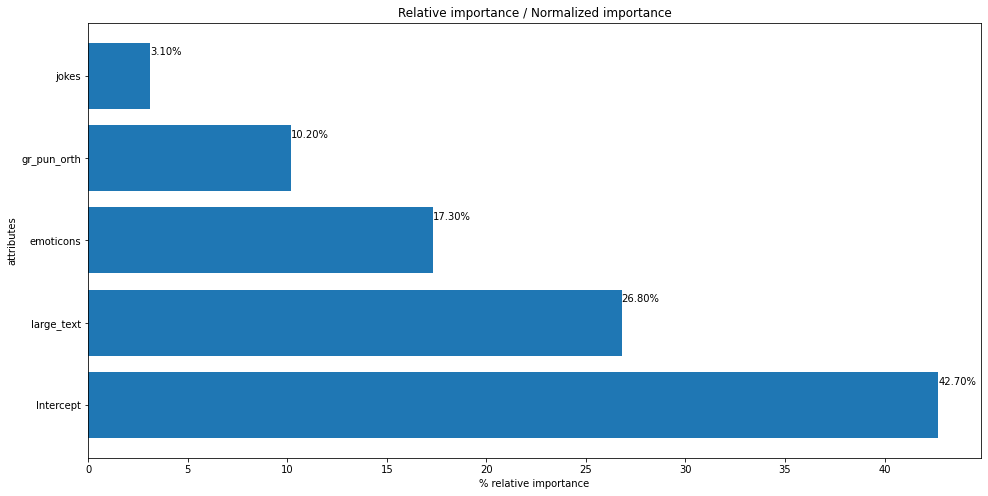

In [ ]:
res_w_int_clust0 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post0).fit_regularized()
print(res_w_int_clust0.summary())
print(odds_ratios(res_w_int_clust0))
odds_ratios(res_w_int_clust0)
odr0 = feature_or(res_w_int_clust0)
rel = feature_importance(res_w_int_clust0)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.628484
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1720
Model:                          Logit   Df Residuals:                     1715
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.09070
Time:                        14:10:10   Log-Likelihood:                -1081.0
converged:                       True   LL-Null:                       -1188.8
Covariance Type:            nonrobust   LLR p-value:                 1.614e-45
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.6005      0.102      5.900      0.000       0.401       0.800
emoticons      -0.4675    

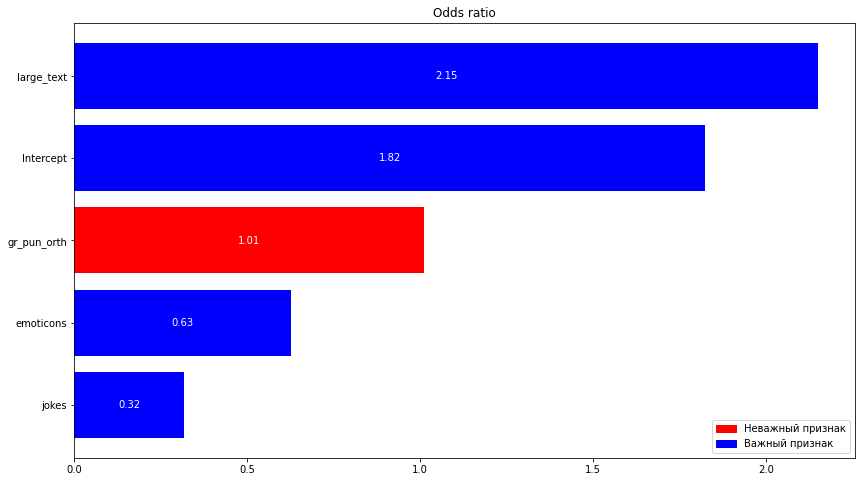

2.990809405565414


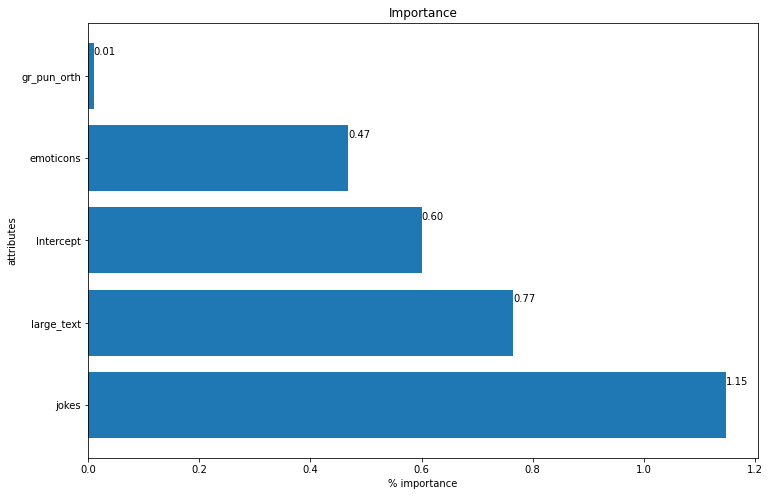

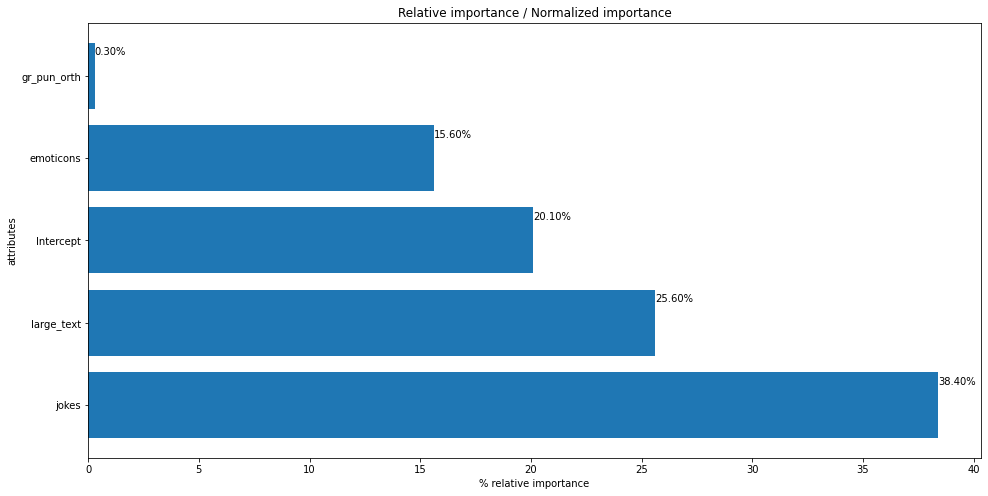

In [ ]:
res_w_int_clust1 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post1).fit()
print(res_w_int_clust1.summary())
print(odds_ratios(res_w_int_clust1))
odds_ratios(res_w_int_clust1)
odr1 = feature_or(res_w_int_clust1)
rel = feature_importance(res_w_int_clust1)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.487547
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                  800
Model:                          Logit   Df Residuals:                      795
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                  0.2962
Time:                        14:10:12   Log-Likelihood:                -390.04
converged:                       True   LL-Null:                       -554.16
Covariance Type:            nonrobust   LLR p-value:                 8.734e-70
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.9091      0.164      5.528      0.000       0.587       1.231
emoticons      -2.8684    

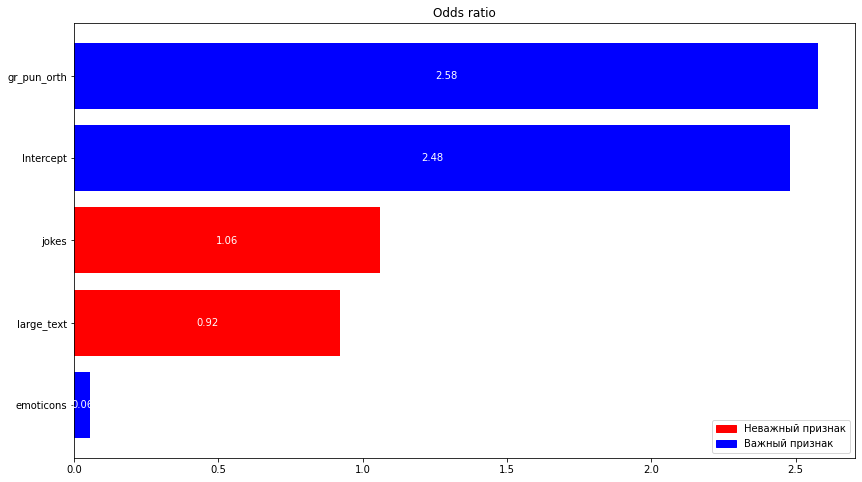

4.8641738281683535


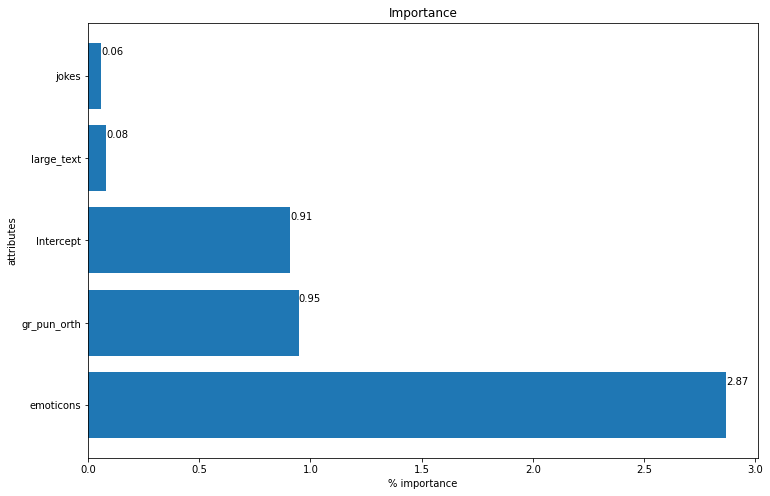

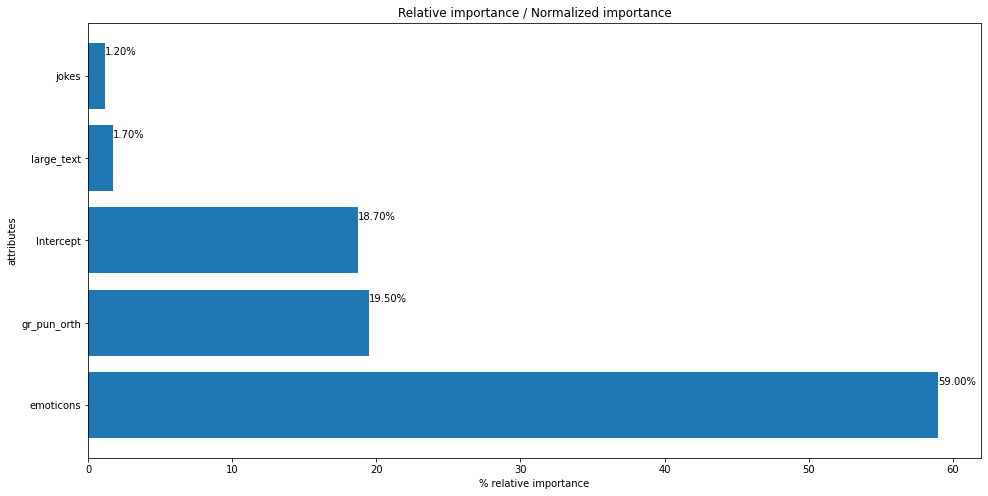

In [ ]:
res_w_int_clust2 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post2).fit()
print(res_w_int_clust2.summary())
print(odds_ratios(res_w_int_clust2))
odds_ratios(res_w_int_clust2)
odr2 = feature_or(res_w_int_clust2)
rel = feature_importance(res_w_int_clust2)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.541079
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1220
Model:                          Logit   Df Residuals:                     1215
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                  0.2171
Time:                        14:10:13   Log-Likelihood:                -660.12
converged:                       True   LL-Null:                       -843.14
Covariance Type:            nonrobust   LLR p-value:                 5.984e-78
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -0.4750      0.124     -3.833      0.000      -0.718      -0.232
emoticons       2.3999    

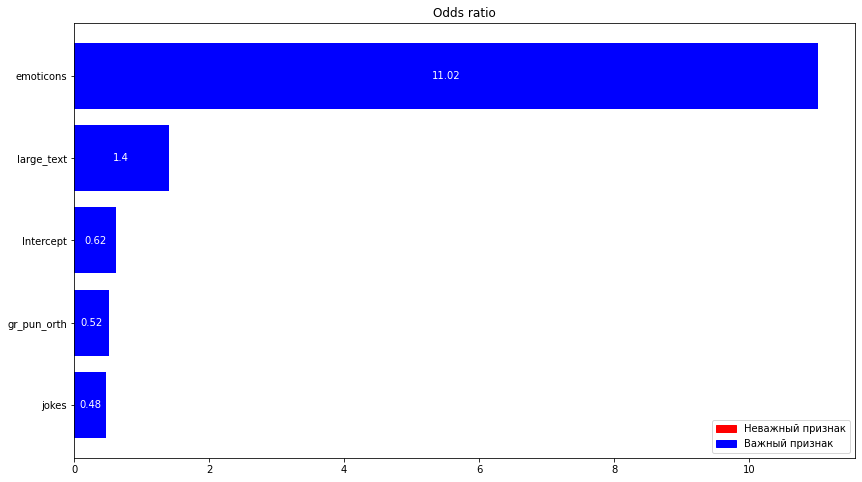

4.607109836068959


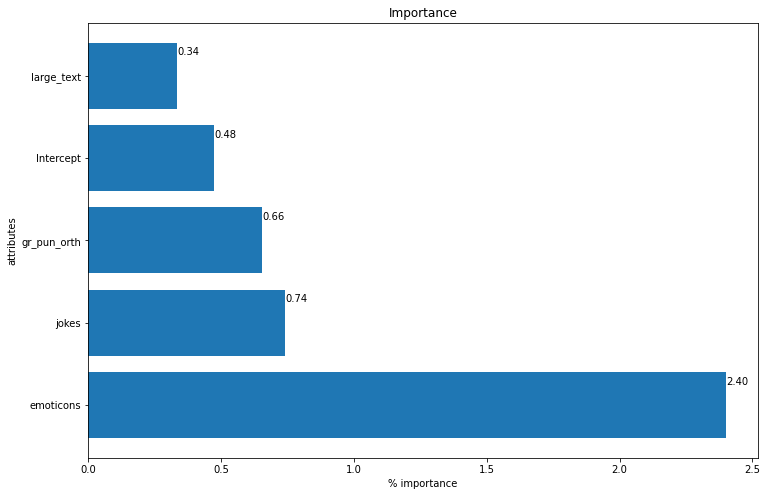

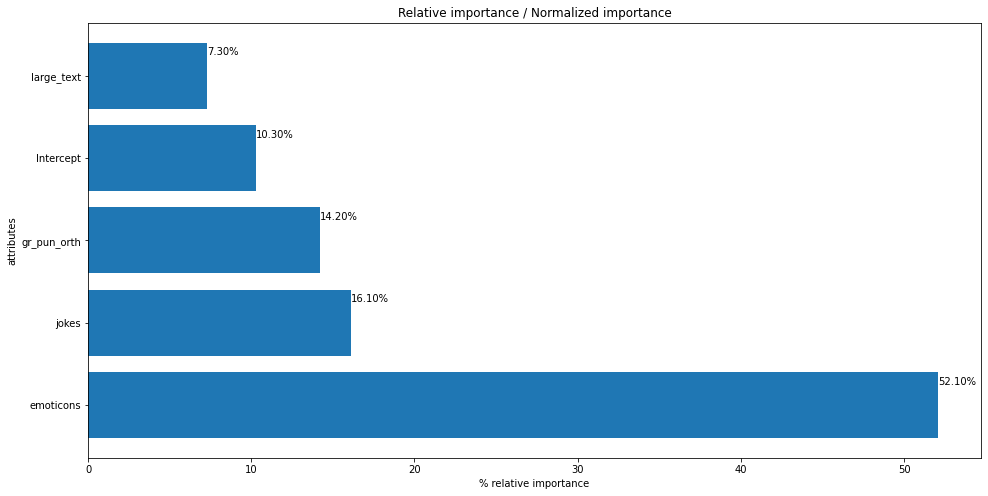

In [ ]:
res_w_int_clust3 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post3).fit()
print(res_w_int_clust3.summary())
print(odds_ratios(res_w_int_clust3))
odds_ratios(res_w_int_clust3)
odr3 = feature_or(res_w_int_clust3)
rel = feature_importance(res_w_int_clust3)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.627689
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1460
Model:                          Logit   Df Residuals:                     1455
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.09195
Time:                        14:10:14   Log-Likelihood:                -916.43
converged:                       True   LL-Null:                       -1009.2
Covariance Type:            nonrobust   LLR p-value:                 4.703e-39
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.6598      0.110      6.002      0.000       0.444       0.875
emoticons      -0.9878    

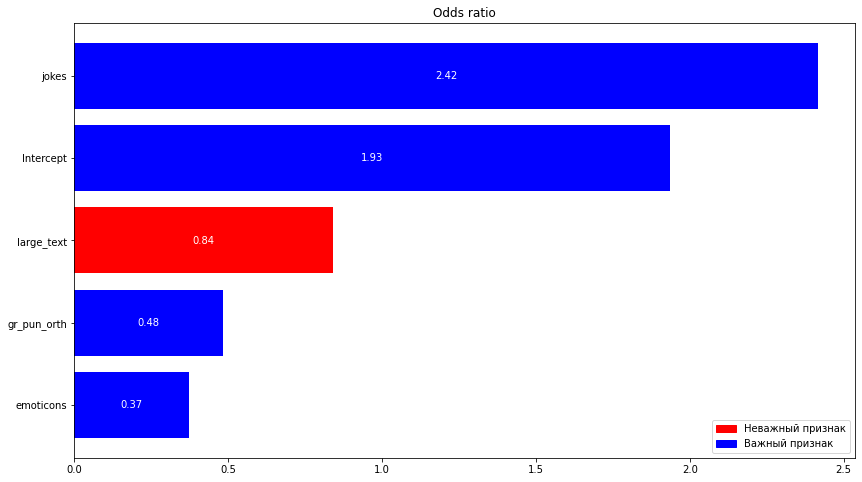

3.4278073551963875


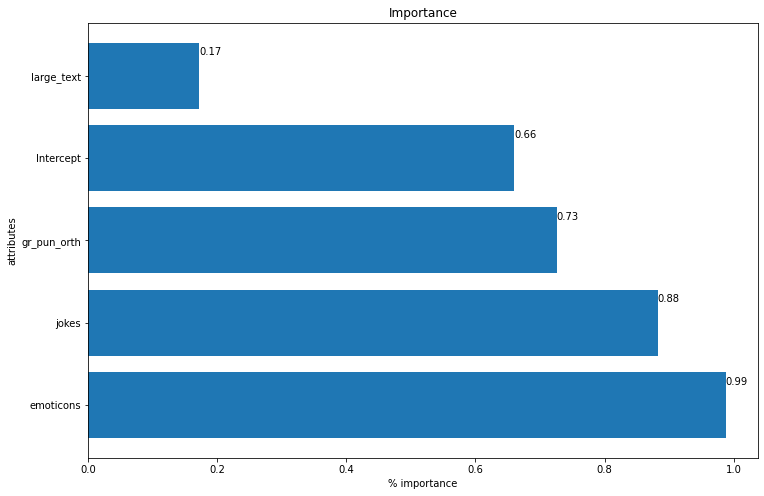

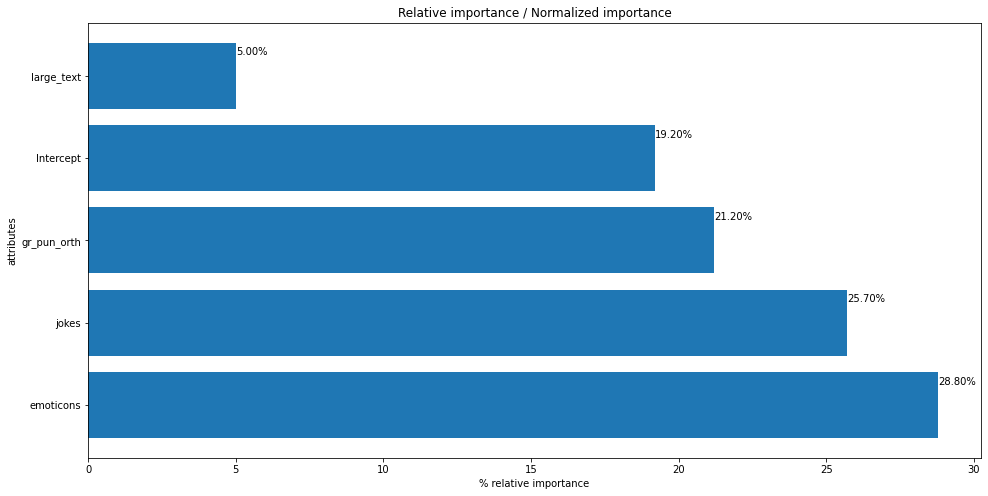

In [ ]:
res_w_int_clust4 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post4).fit()
print(res_w_int_clust4.summary())
print(odds_ratios(res_w_int_clust4))
odds_ratios(res_w_int_clust4)
odr4 = feature_or(res_w_int_clust4)
rel = feature_importance(res_w_int_clust4)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.609450
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 1820
Model:                          Logit   Df Residuals:                     1815
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                  0.1149
Time:                        14:10:16   Log-Likelihood:                -1109.2
converged:                       True   LL-Null:                       -1253.2
Covariance Type:            nonrobust   LLR p-value:                 4.203e-61
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -0.1186      0.099     -1.195      0.232      -0.313       0.076
emoticons       0.9282    

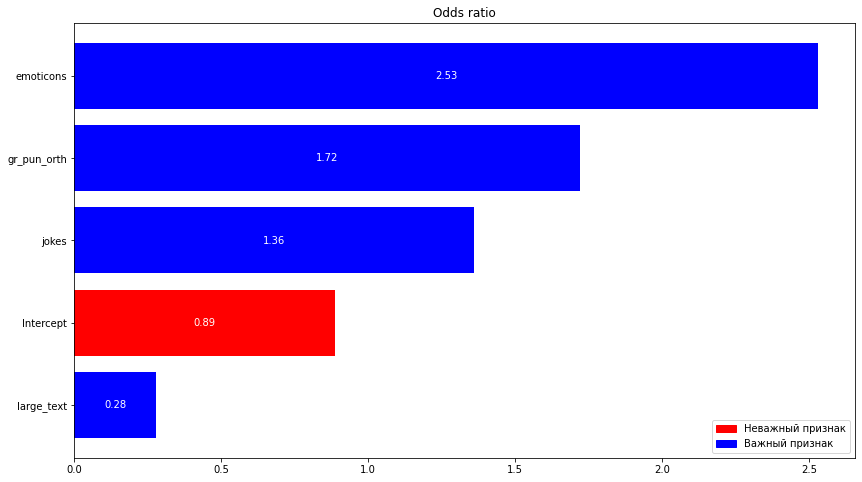

3.173666167784571


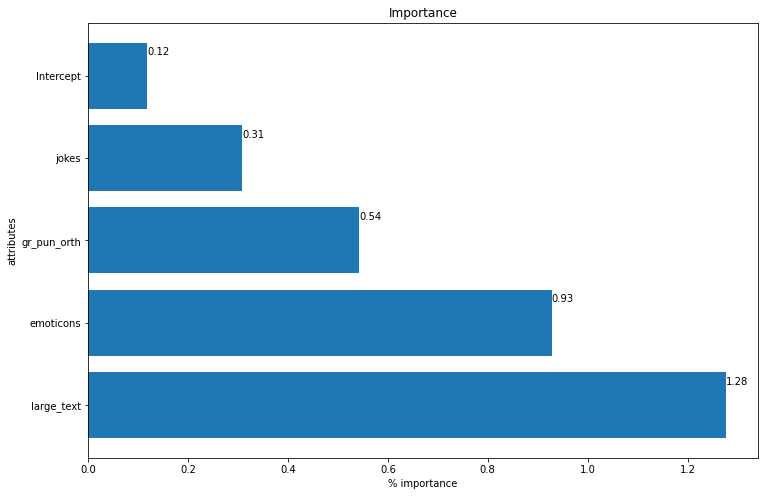

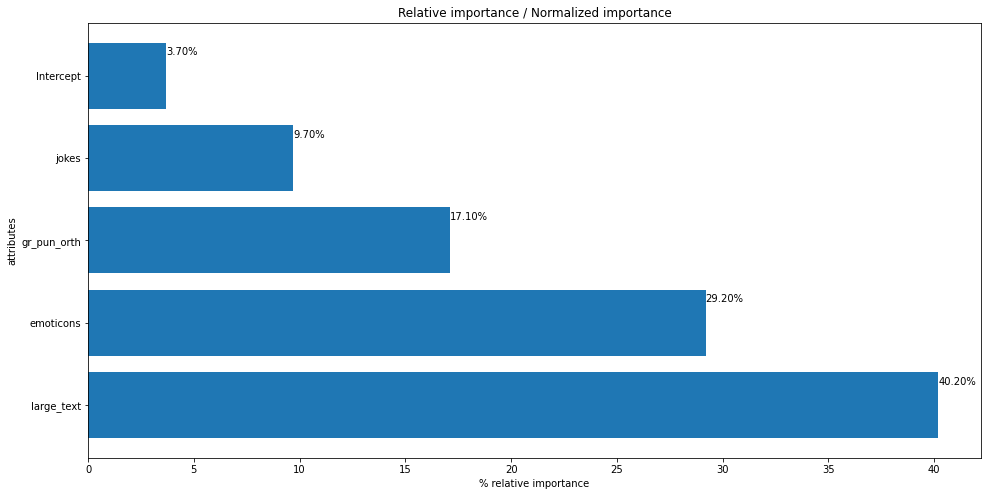

In [ ]:
res_w_int_clust5 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= facts_dummy_post5).fit()
print(res_w_int_clust5.summary())
print(odds_ratios(res_w_int_clust5))
odds_ratios(res_w_int_clust5)
odr5 = feature_or(res_w_int_clust5)
rel = feature_importance(res_w_int_clust5)
relative_importance(rel)

Объединенный график важности атрибутов среди всех кластеров:

[Text(0, 0, '2.49'),
 Text(0, 0, '1.82'),
 Text(0, 0, '2.48'),
 Text(0, 0, '0.62'),
 Text(0, 0, '1.93'),
 Text(0, 0, '')]

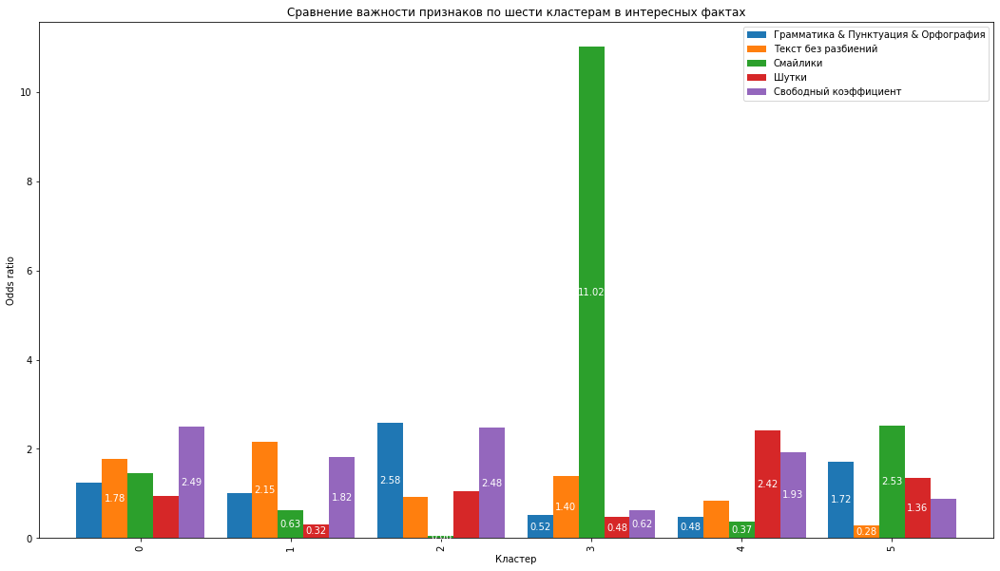

In [ ]:
# create data
df = pd.DataFrame([['0', odr0.loc['gr_pun_orth']['OR'], odr0.loc['large_text']['OR'], odr0.loc['emoticons']['OR'], odr0.loc['jokes']['OR'], odr0.loc['Intercept']['OR']],
                   ['1', odr1.loc['gr_pun_orth']['OR'], odr1.loc['large_text']['OR'], odr1.loc['emoticons']['OR'], odr1.loc['jokes']['OR'], odr1.loc['Intercept']['OR']],
                   ['2', odr2.loc['gr_pun_orth']['OR'], odr2.loc['large_text']['OR'], odr2.loc['emoticons']['OR'], odr2.loc['jokes']['OR'], odr2.loc['Intercept']['OR']],
                   ['3', odr3.loc['gr_pun_orth']['OR'], odr3.loc['large_text']['OR'], odr3.loc['emoticons']['OR'], odr3.loc['jokes']['OR'], odr3.loc['Intercept']['OR']],
                   ['4', odr4.loc['gr_pun_orth']['OR'], odr4.loc['large_text']['OR'], odr4.loc['emoticons']['OR'], odr4.loc['jokes']['OR'], odr4.loc['Intercept']['OR']],
                   ['5', odr5.loc['gr_pun_orth']['OR'], odr5.loc['large_text']['OR'], odr5.loc['emoticons']['OR'], odr5.loc['jokes']['OR'], odr5.loc['Intercept']['OR']]],
                  columns=['Кластер', 'Грамматика & Пунктуация & Орфография', 'Текст без разбиений', 'Смайлики', 'Шутки', 'Свободный коэффициент'])

 
 # plot grouped bar chart
ax = df.plot(x='Кластер', 
             ylabel='Odds ratio',
        kind='bar',
        stacked=False,
        figsize = (18,10),
        width=0.85,
        title='Сравнение важности признаков по шести кластерам в интересных фактах')

col_gr = [odr0['c']['gr_pun_orth'], odr1['c']['gr_pun_orth'], odr2['c']['gr_pun_orth'], odr3['c']['gr_pun_orth'], odr4['c']['gr_pun_orth'], odr5['c']['gr_pun_orth']]
col_text = [odr0['c']['large_text'], odr1['c']['large_text'], odr2['c']['large_text'], odr3['c']['large_text'], odr4['c']['large_text'], odr5['c']['large_text']]
col_em = [odr0['c']['emoticons'], odr1['c']['emoticons'], odr2['c']['emoticons'], odr3['c']['emoticons'], odr4['c']['emoticons'], odr5['c']['emoticons']]
col_jokes = [odr0['c']['jokes'], odr1['c']['jokes'], odr2['c']['jokes'], odr3['c']['jokes'], odr4['c']['jokes'], odr5['c']['jokes']]
col_int = [odr0['c']['Intercept'], odr1['c']['Intercept'], odr2['c']['Intercept'], odr3['c']['Intercept'], odr4['c']['Intercept'], odr5['c']['Intercept']]

ax.bar_label(ax.containers[0], labels=['%.2f' % df['Грамматика & Пунктуация & Орфография'].iloc[e] if col_gr[e] == 'blue' else '' for e in range(len(df['Грамматика & Пунктуация & Орфография']))], color='white', label_type='center')
ax.bar_label(ax.containers[1], labels=['%.2f' % df['Текст без разбиений'].iloc[e] if col_text[e] == 'blue' else '' for e in range(len(df['Текст без разбиений']))], color='white', label_type='center')
ax.bar_label(ax.containers[2], labels=['%.2f' % df['Смайлики'].iloc[e] if col_em[e] == 'blue' else '' for e in range(len(df['Смайлики']))], color='white', label_type='center')
ax.bar_label(ax.containers[3], labels=['%.2f' % df['Шутки'].iloc[e] if col_jokes[e] == 'blue' else '' for e in range(len(df['Шутки']))], color='white', label_type='center')
ax.bar_label(ax.containers[4], labels=['%.2f' % df['Свободный коэффициент'].iloc[e] if col_int[e] == 'blue' else '' for e in range(len(df['Свободный коэффициент']))], color='white', label_type='center')



Только у важных признаков подписана относительная полезность. 

### Здравоохранение

#### Здравоохранение - индивидуальные предпочтения

In [ ]:
health_dummy[['CHOICE_INDICATOR', 'emoticons', 'gr_pun_orth', 'jokes', 'large_text']]

,CHOICE_INDICATOR,emoticons,gr_pun_orth,jokes,large_text
0,0,0,0,1,1
1,1,0,1,1,0
2,0,0,1,0,0
3,1,1,1,1,0
4,0,0,1,0,0
5,1,1,0,0,0
6,0,0,1,1,0
7,1,1,0,0,1
8,1,1,1,0,1
9,0,1,1,1,1


In [ ]:
# чтобы разделить данные конджоинта на кластеры, нужно сначала создать таблицу предпочтений по пользователям

In [ ]:
# инд. предпочтения к атрибутам
df_ind_pref = ind_preferences(health_dummy)

5
Optimization terminated successfully.
         Current function value: 0.457288
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
5
Optimization terminated successfully.
         Current function value: 0.372574
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
5
Optimization terminated successfully.
         Current function value: 0.475316
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.428203
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
5
Optimization terminated successfully.
         Current function value: 0.330784
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
5
Optimization terminated successfully.
         Current function value: 0.381330
         Iterations: 31
         Function evalua

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.454890
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
5
Optimization terminated successfully.
         Current function value: 0.478967
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
5
Optimization terminated successfully.
         Current function value: 0.190955
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
5
Optimization terminated successfully.
         Current function value: 0.575325
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
5
Optimization terminated successfully.
         Current function value: 0.501252
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.603500
         Iterations: 23
         Function evaluati

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



Optimization terminated successfully.
         Current function value: 0.527085
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.645001
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.585886
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.207346
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
5
Optimization terminated successfully.
         Current function value: 0.190955
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.511439
         Iterations: 27
         Function evaluat

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.394149
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
5
Optimization terminated successfully.
         Current function value: 0.069317
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.492448
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
5
Optimization terminated successfully.
         Current function value: 0.640719
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
5
Optimization terminated successfully.
         Current function value: 0.330595
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
5
Optimization terminated successfully.
         Current function value: 0.604048
         Iterations: 26
         Function evaluati

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.610879
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
5
Optimization terminated successfully.
         Current function value: 0.425008
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
5
Optimization terminated successfully.
         Current function value: 0.459802
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
5
Optimization terminated successfully.
         Current function value: 0.607677
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
5
Optimization terminated successfully.
         Current function value: 0.301285
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
5
Optimization terminated successfully.
         Current function value: 0.629483
         Iterations: 23
         Function evaluati

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.333544
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
5
Optimization terminated successfully.
         Current function value: 0.622528
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
5
Optimization terminated successfully.
         Current function value: 0.330595
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
5
Optimization terminated successfully.
         Current function value: 0.330595
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
5
Optimization terminated successfully.
         Current function value: 0.371794
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
5
Optimization terminated successfully.
         Current function value: 0.665174
         Iterations: 24
         Function evaluati

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.615014
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
5
Optimization terminated successfully.
         Current function value: 0.205883
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
5
Optimization terminated successfully.
         Current function value: 0.431369
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
5
Optimization terminated successfully.
         Current function value: 0.517147
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.368217
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
5
Optimization terminated successfully.
         Current function value: 0.592925
         Iterations: 26
         Function evaluati

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


5
Optimization terminated successfully.
         Current function value: 0.559120
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
5
Optimization terminated successfully.
         Current function value: 0.348547
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
5
Optimization terminated successfully.
         Current function value: 0.605365
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
5
Optimization terminated successfully.
         Current function value: 0.659326
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
5
Optimization terminated successfully.
         Current function value: 0.455499
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
5
Optimization terminated successfully.
         Current function value: 0.347357
         Iterations: 28
         Function evalua

In [ ]:
# то есть присутствуют нулевые значения pvalue, как раз для которых ошибка выдавалась
df_ind_pref[df_ind_pref.isna().any(axis=1)]

,RESPONDENT_ID,emoticons,large_text,gr_pun_orth,jokes,Intercept,p_value_em,p_value_text,p_value_gr,p_value_jokes,p_value_int
13,120457419,124.286431,-115.540533,100.317522,-76.111928,124.213676,NaN,NaN,NaN,NaN,NaN
105,120461871,11.359563,-11.360163,56.558625,-56.210895,56.211257,NaN,NaN,NaN,NaN,NaN
122,120466255,54.232863,13.550080,-171.740855,193.980212,117.508040,NaN,NaN,NaN,NaN,NaN
153,120470762,-284.370914,-101.213983,83.006296,69.795493,201.364834,NaN,NaN,NaN,NaN,NaN
206,120562935,-94.292269,-13.231175,-95.940133,123.027716,67.204655,NaN,NaN,NaN,NaN,NaN
209,120562944,41.735665,64.805075,21.974561,-140.370237,42.858790,NaN,NaN,NaN,NaN,NaN
224,120563324,-59.078867,15.866497,-1.733197,-58.584333,59.450826,NaN,NaN,NaN,NaN,NaN
244,120563403,-215.281525,-14.355283,-113.049961,167.510539,160.821136,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_ind_pref.columns

Index(['RESPONDENT_ID', 'emoticons', 'large_text', 'gr_pun_orth', 'jokes',
       'Intercept', 'p_value_em', 'p_value_text', 'p_value_gr',
       'p_value_jokes', 'p_value_int'],
      dtype='object')

#### Здравоохранение - кластеризация

In [ ]:
columns = ['emoticons', 'large_text', 'gr_pun_orth', 'jokes', 'Intercept']

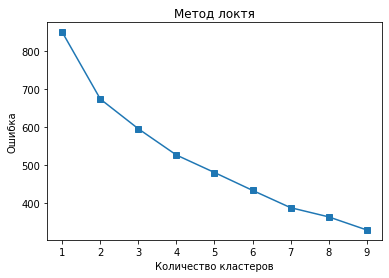

In [ ]:
# метод локтя
elbow_method(df_ind_pref[columns])


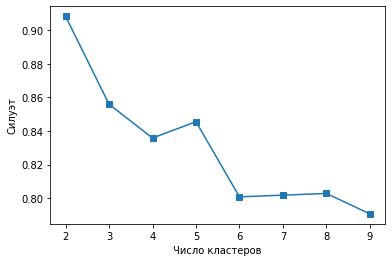

In [ ]:
silhouette(df_ind_pref[columns])

Максимальное значение силуэта соответствует двум кластерам. Поэтому выбираем 2. По методу локтя нет явного падения вниз при каком-то количестве кластеров. 

In [ ]:
kmodel_conjoint = KMeans(n_clusters = 2, random_state=1)
kmodel_conjoint.fit(df_ind_pref[columns])
kmodel_conjoint.cluster_centers_

array([[  -1.15583549,    1.71595556,    2.22894253,   -4.18023065,
           3.46649038],
       [-128.80592982,  -28.25311405,  -69.22004505,  129.69441331,
         122.99557632]])

In [ ]:
res = df_ind_pref[columns].copy()
res["cluster"] = kmodel_conjoint.labels_
res.groupby("cluster").mean()

,emoticons,large_text,gr_pun_orth,jokes,Intercept
cluster,,,,,
0,-1.155835,1.715956,2.228943,-4.180231,3.466490
1,-128.805930,-28.253114,-69.220045,129.694413,122.995576


In [ ]:
# неравное деление на кластеры: 378 пользователей и 5
res.groupby("cluster").describe()

emoticons                                                              \
            count        mean         std         min         25%         50%   
cluster                                                                         
0        378.0    -1.155835    16.172597  -78.509507  -1.717161   -0.200776     
1        5.0      -128.805930  129.395280 -284.370914 -215.281525 -104.317805   

                               large_text                                    \
               75%         max      count       mean        std         min   
cluster                                                                       
0        1.109676   124.286431  378.0      1.715956   10.365591 -115.540533   
1       -94.292269  54.232863   5.0       -28.253114  43.285714 -101.213983   

                                                    gr_pun_orth             \
               25%        50%        75%        max       count       mean   
cluster                                                                      
0       -0.526531   0.451498   1.814596   64.805075  378.0       2.228943    
1       -26.015210 -14.355283 -13.231175  13.550080  5.0        -69.220045   

                                                                              \
               std         min         25%        50%        75%         max   
cluster                                                                        
0        8.887850  -25.340364  -0.266407    0.561079   1.475102   100.317522   
1        95.855219 -171.740855 -113.049961 -95.940133 -48.375572  83.006296    

         jokes                                                            \
         count        mean        std         min        25%         50%   
cluster                                                                    
0        378.0 -4.180231    15.733543 -147.672744 -2.642277  -1.413226     
1        5.0    129.694413  51.131883  69.795493   94.158106  123.027716   

                                Intercept                                    \
                75%         max     count        mean        std        min   
cluster                                                                       
0       -0.117829    20.853267   378.0     3.466490    12.285792 -15.535522   
1        167.510539  193.980212  5.0       122.995576  58.589803  67.204655   

                                                       
               25%        50%         75%         max  
cluster                                                
0       -0.046811   0.77992    1.716692    124.213676  
1        68.079216  117.50804  160.821136  201.364834

In [ ]:
df_ind_pref['cluster'] = pd.Series(kmodel_conjoint.labels_, index=df_ind_pref.index)
health_dummy_cluster = health_dummy.merge(df_ind_pref[['RESPONDENT_ID', 'cluster']], how='inner', on='RESPONDENT_ID', )

In [ ]:
health_dummy_post0 = health_dummy_cluster[health_dummy_cluster['cluster'] == 0]
health_dummy_post1 = health_dummy_cluster[health_dummy_cluster['cluster'] == 1]

In [ ]:
len(health_dummy_post0) // 20

378

#### Здравоохранение - индивидуальные предпочтения по относительному количеству профилей

In [ ]:
health_dummy.head()

,RESPONDENT_ID,CHOICE_INDICATOR,Q3_O1,Q3_O2,Q3_O3_3,Q3_O4_3_5,emoticons,gr_pun_orth,jokes,large_text,emoticons__1,emoticons__2,emoticons__4,emoticons__5,gr_pun_orth__1,gr_pun_orth__2,gr_pun_orth__3,gr_pun_orth__4,jokes__1,jokes__2,jokes__4,jokes__5,large_text__1,large_text__2,large_text__4,large_text__5
0,120457015,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,120457015,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,120457015,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,120457015,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,120457015,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
df_ind_pref = ind_preferences_ratio(health_dummy)

In [ ]:
df_ind_pref.head()

,RESPONDENT_ID,emoticons,large_text,gr_pun_orth,jokes
0,120457015,0.875000,0.625000,0.444444,0.444444
1,120457369,0.800000,0.666667,0.555556,0.375000
2,120457375,0.363636,0.714286,0.666667,0.454545
3,120457378,0.500000,0.666667,0.555556,0.875000
4,120457379,0.900000,1.000000,0.777778,0.750000


#### Здравоохранение - кластеризация по долям

**Описание кластеров в здравоохранении:**<br>
Получилось примерно одинаковое количество пользователей в кластерах: 224, 40, 119. 

Кластер 1:<br>
- **Смайлики:** в среднем в 62% случаях из всех появлений профилей со смайликами пользователь выбирает профиль со смайликами. (Минимум 36%, так что понятно, почему отрицательное влияние. И 50% пользователей в среднем в 63% и меньше слуачаях выбирают смайлики. Поэтому ввиду этого признак может оказывать отрицательное влияние.)
- Шутки: в среднем в 44% случаях из всех появлений профилей с шутками пользователь выбирает профиль с шутками. (И 50% пользователей в среднем в 44% и меньше случаях выбирают смайлики. )
- **Грамматика, орфография, пунктуация:** в среднем в 66% случаях из всех появлений профилей с правильной грамматикой, пунктуацией и орфографией пользователь выбирает профиль со правильной грамматикой, пунктуацией и орфографией.
- **Текст без разбиений:** в среднем в 66% случаях из всех появлений профилей с текстом без разбиений пользователь выбирает профиль с текстом без разбиений.

Кластер 2:<br>
- **Смайлики:** тут больше всего людей, которые выбирали профили со смайликами в среднем чаще всего, в 85% случаях в среднем.
- **Шутки:** тут больше всего людей, которые выбирали профили с шутками в среднем чаще всего, в 84% случаях в среднем. 
- **Грамматика, орфография, пунктуация:** тут больше всего людей, которые выбирали профили с правильными грамматикой, пунктуацией, орфографией в среднем чаще всего, в 88% случаях в среднем. 
- **Текст без разбиений:** тут больше всего людей, которые выбирали профили с текстом без разбиений в среднем чаще всего, в 86% случаях в среднем. 

Почему важна только грамматика, не понятно. 

Кластер 3:<br>
- Смайлики: тут больше всего людей, которые выбирали профили с текстом без разбиений в среднем реже всего, в 33% случаях в среднем. 
- Шутки: тут больше всего людей, которые выбирали профили с шутками в среднем реже всего, в 44% случаях в среднем.
- **Грамматика, орфография, пунктуация:** тут больше всего людей, которые выбирали профили с правильными грамматикой, пунктуацией, орфографией в среднем реже всего, в 55% случаях в среднем.
- Текст без разбиений: тут больше всего людей, которые выбирали профили с текстом без разбиений в среднем реже всего, в 53% случаях в среднем. (И 50% пользователей в среднем в 50% и меньше случаях выбирают текст без разбиений. Поэтому ввиду этого признак может не оказывать никакого влияния.)


In [ ]:
columns = ['emoticons', 'large_text', 'gr_pun_orth', 'jokes']

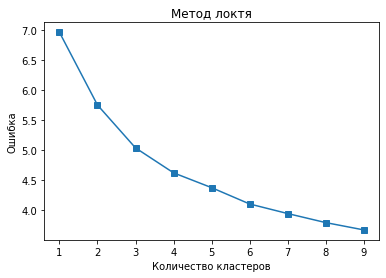

In [ ]:
# метод локтя
elbow_method(df_ind_pref[columns])


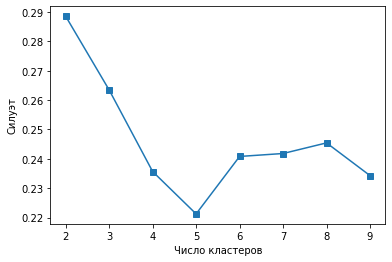

In [ ]:
silhouette(df_ind_pref[columns])

Выбираем 3 кластера

In [ ]:
kmodel_conjoint = KMeans(n_clusters = 3, random_state=1)
kmodel_conjoint.fit(df_ind_pref[columns])
kmodel_conjoint.cluster_centers_

array([[0.61855948, 0.66408376, 0.63318452, 0.44235322],
       [0.85431818, 0.85945437, 0.87847222, 0.84289773],
       [0.3320601 , 0.52820795, 0.55112045, 0.42056065]])

In [ ]:
res = df_ind_pref[columns].copy()
res["cluster"] = kmodel_conjoint.labels_
res.groupby("cluster").mean()

,emoticons,large_text,gr_pun_orth,jokes
cluster,,,,
0,0.618559,0.664084,0.633185,0.442353
1,0.854318,0.859454,0.878472,0.842898
2,0.332060,0.528208,0.551120,0.420561


In [ ]:
# неравное деление на кластеры: 380 пользователей и 5
res.groupby("cluster").describe()

emoticons                                                              \
            count      mean       std       min       25%       50%       75%   
cluster                                                                         
0        224.0     0.618559  0.114297  0.363636  0.545455  0.625000  0.666667   
1        40.0      0.854318  0.109274  0.625000  0.794444  0.888889  0.910985   
2        119.0     0.332060  0.126723  0.000000  0.250000  0.333333  0.416667   

                  large_text                                          \
              max      count      mean       std       min       25%   
cluster                                                                
0        1.000000  224.0      0.664084  0.135849  0.250000  0.571429   
1        1.000000  40.0       0.859454  0.127234  0.571429  0.794444   
2        0.583333  119.0      0.528208  0.133414  0.142857  0.444444   

                                   gr_pun_orth                                \
              50%    75%       max       count      mean       std       min   
cluster                                                                        
0        0.666667  0.750  1.000000  224.0       0.633185  0.126429  0.333333   
1        0.875000  1.000  1.000000  40.0        0.878472  0.092917  0.666667   
2        0.500000  0.625  0.857143  119.0       0.551120  0.126778  0.125000   

                                                 jokes                      \
              25%       50%       75%       max  count      mean       std   
cluster                                                                      
0        0.555556  0.645833  0.750000  1.000000  224.0  0.442353  0.138402   
1        0.777778  0.888889  0.916667  1.000000  40.0   0.842898  0.124004   
2        0.500000  0.555556  0.666667  0.777778  119.0  0.420561  0.147301   

                                                           
              min       25%       50%       75%       max  
cluster                                                    
0        0.125000  0.333333  0.444444  0.555556  0.875000  
1        0.555556  0.750000  0.875000  0.931818  1.000000  
2        0.125000  0.333333  0.444444  0.555556  0.777778

In [ ]:
df_ind_pref['cluster'] = pd.Series(kmodel_conjoint.labels_, index=df_ind_pref.index)
health_dummy_cluster = health_dummy.merge(df_ind_pref[['RESPONDENT_ID', 'cluster']], how='inner', on='RESPONDENT_ID', )

In [ ]:
health_dummy_post0 = health_dummy_cluster[health_dummy_cluster['cluster'] == 0]
health_dummy_post1 = health_dummy_cluster[health_dummy_cluster['cluster'] == 1]
health_dummy_post2 = health_dummy_cluster[health_dummy_cluster['cluster'] == 2]

#### Здравоохранение - регрессия

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6289813815616677
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 4480
Model:                          Logit   Df Residuals:                     4475
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.07334
Time:                        14:10:40   Log-Likelihood:                -2817.8
converged:                       True   LL-Null:                       -3040.9
Covariance Type:            nonrobust   LLR p-value:                 3.094e-95
                  coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

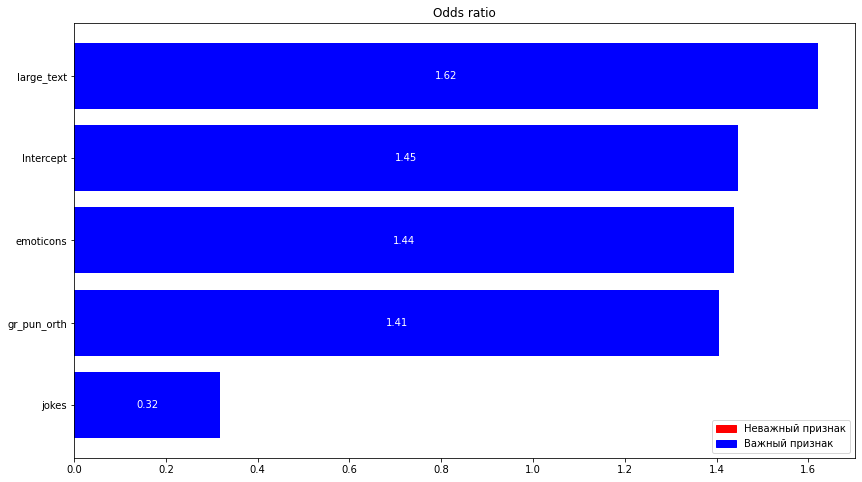

2.7030290414796956


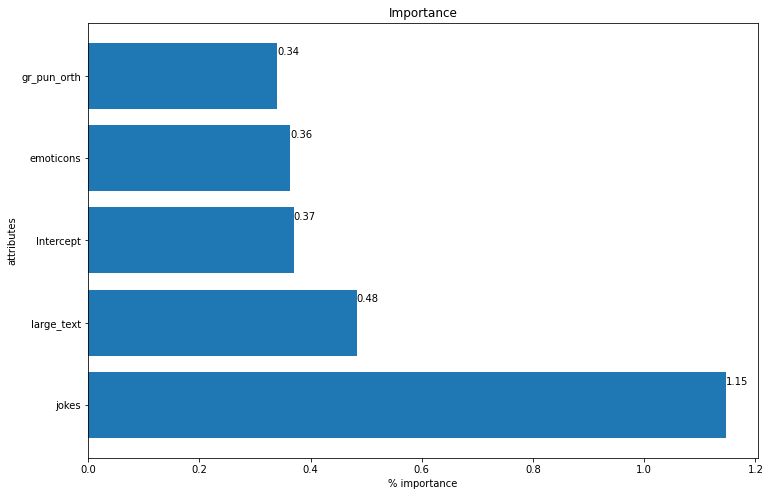

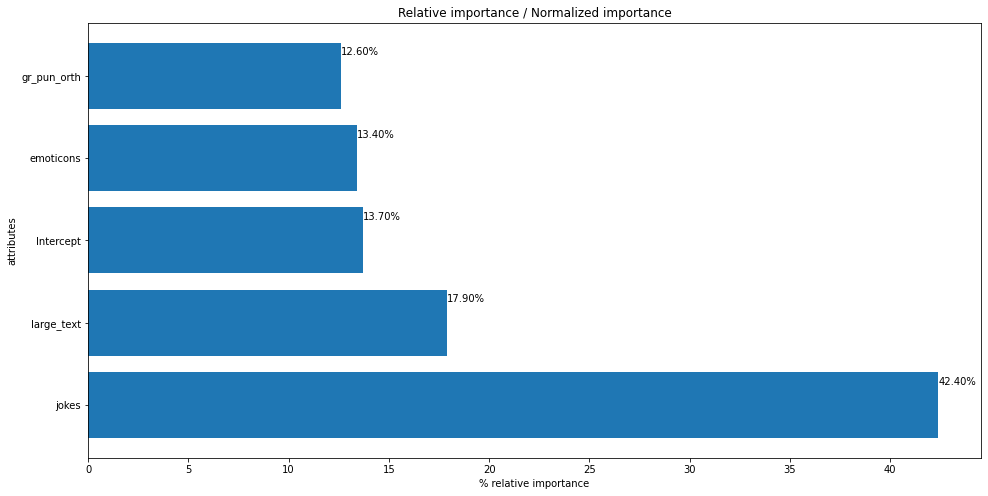

In [ ]:
res_w_int_clust0 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= health_dummy_post0).fit_regularized()
print(res_w_int_clust0.summary())
print(odds_ratios(res_w_int_clust0))
odr0 = feature_or(res_w_int_clust0)
rel = feature_importance(res_w_int_clust0)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.440432
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                  800
Model:                          Logit   Df Residuals:                      795
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                 0.01660
Time:                        14:10:41   Log-Likelihood:                -352.35
converged:                       True   LL-Null:                       -358.30
Covariance Type:            nonrobust   LLR p-value:                   0.01812
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       1.1699      0.178      6.560      0.000       0.820       1.519
emoticons       0.2007    

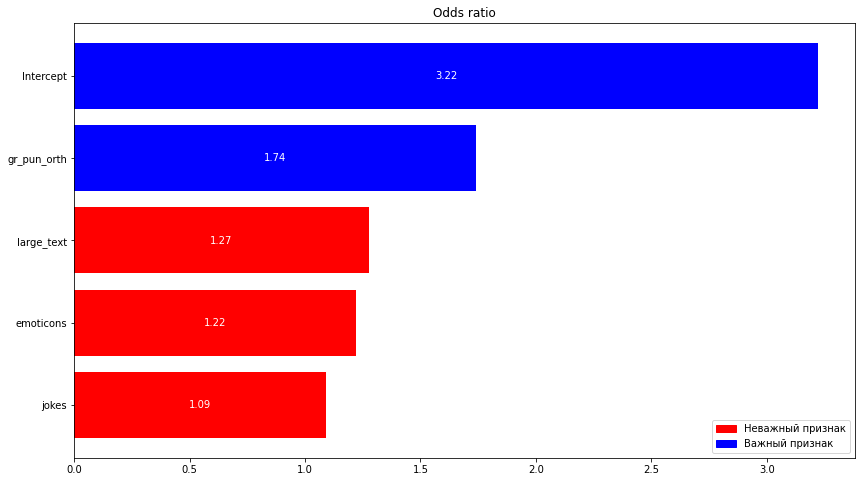

2.2549261366639315


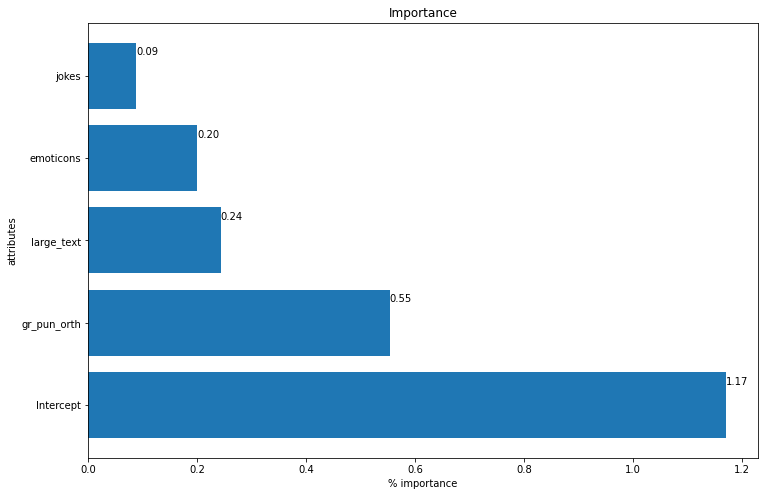

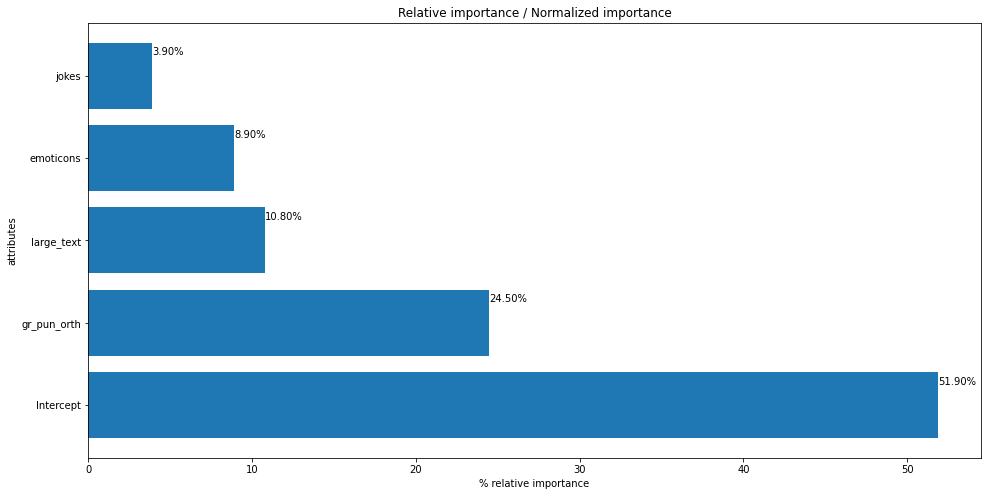

In [ ]:
res_w_int_clust1 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= health_dummy_post1).fit()
print(res_w_int_clust1.summary())
print(odds_ratios(res_w_int_clust1))
odr1 = feature_or(res_w_int_clust1)
rel = feature_importance(res_w_int_clust1)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.606698
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 2380
Model:                          Logit   Df Residuals:                     2375
Method:                           MLE   Df Model:                            4
Date:                Fri, 20 May 2022   Pseudo R-squ.:                  0.1233
Time:                        14:10:42   Log-Likelihood:                -1443.9
converged:                       True   LL-Null:                       -1647.0
Covariance Type:            nonrobust   LLR p-value:                 1.380e-86
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.9238      0.090     10.317      0.000       0.748       1.099
emoticons      -1.5611    

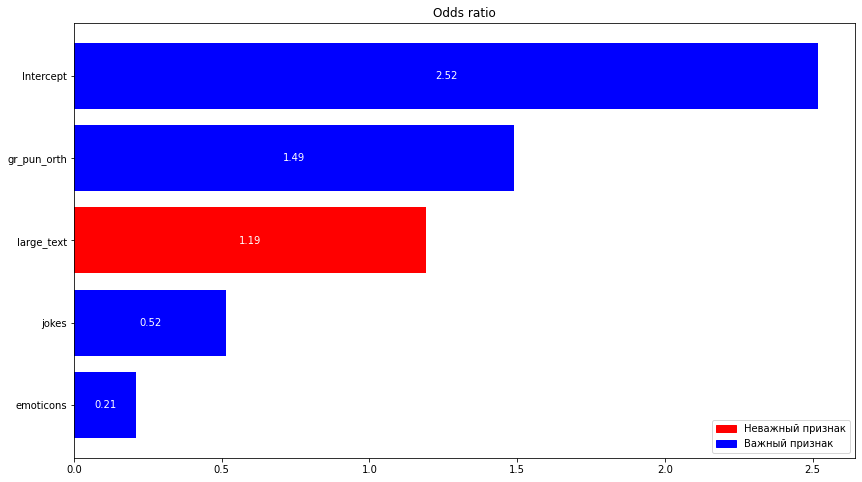

3.7215096860839174


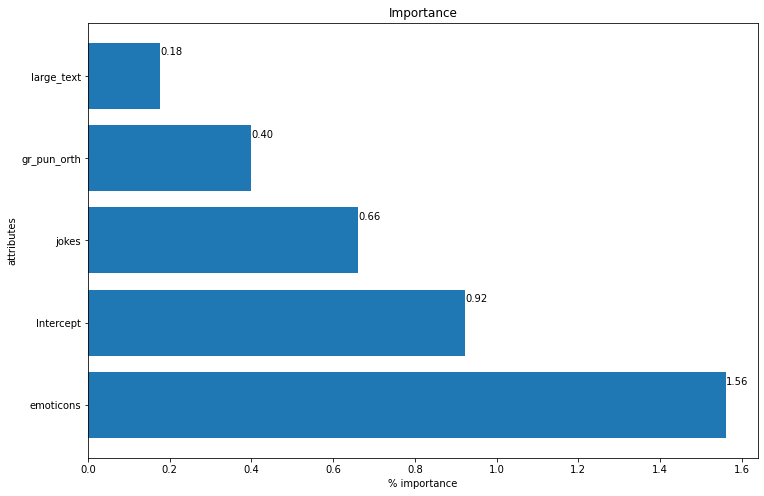

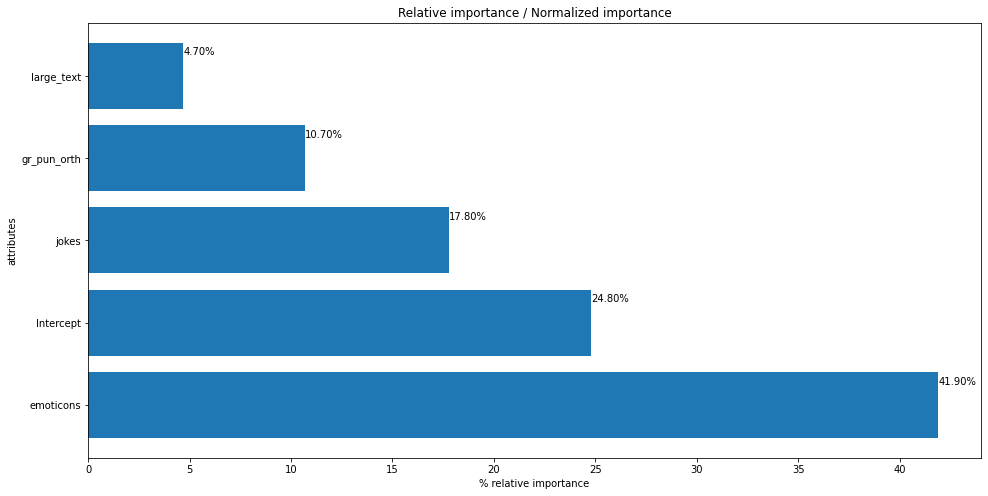

In [ ]:
res_w_int_clust2 = sm_log.logit(formula="CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text", data= health_dummy_post2).fit()
print(res_w_int_clust2.summary())
print(odds_ratios(res_w_int_clust2))
odr2 = feature_or(res_w_int_clust2)
rel = feature_importance(res_w_int_clust2)
relative_importance(rel)

Объединенный график важности атрибутов среди всех кластеров:

[Text(0, 0, '1.45'), Text(0, 0, '3.22'), Text(0, 0, '2.52')]

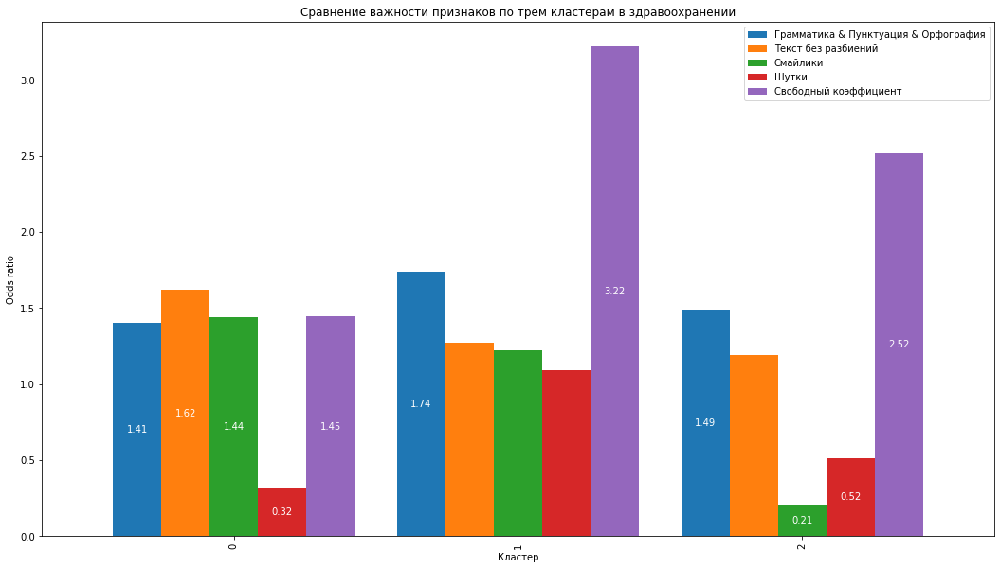

In [ ]:
# create data
df = pd.DataFrame([['0', odr0.loc['gr_pun_orth']['OR'], odr0.loc['large_text']['OR'], odr0.loc['emoticons']['OR'], odr0.loc['jokes']['OR'], odr0.loc['Intercept']['OR']],
                   ['1', odr1.loc['gr_pun_orth']['OR'], odr1.loc['large_text']['OR'], odr1.loc['emoticons']['OR'], odr1.loc['jokes']['OR'], odr1.loc['Intercept']['OR']],
                   ['2', odr2.loc['gr_pun_orth']['OR'], odr2.loc['large_text']['OR'], odr2.loc['emoticons']['OR'], odr2.loc['jokes']['OR'], odr2.loc['Intercept']['OR']]],
                  columns=['Кластер', 'Грамматика & Пунктуация & Орфография', 'Текст без разбиений', 'Смайлики', 'Шутки', 'Свободный коэффициент'])

 
 # plot grouped bar chart
ax = df.plot(x='Кластер', 
             ylabel='Odds ratio',
        kind='bar',
        stacked=False,
        figsize = (18,10),
        width=0.85,
        title='Сравнение важности признаков по трем кластерам в здравоохранении')

col_gr = [odr0['c']['gr_pun_orth'], odr1['c']['gr_pun_orth'], odr2['c']['gr_pun_orth']]
col_text = [odr0['c']['large_text'], odr1['c']['large_text'], odr2['c']['large_text']]
col_em = [odr0['c']['emoticons'], odr1['c']['emoticons'], odr2['c']['emoticons']]
col_jokes = [odr0['c']['jokes'], odr1['c']['jokes'], odr2['c']['jokes']]
col_int = [odr0['c']['Intercept'], odr1['c']['Intercept'], odr2['c']['Intercept']]

ax.bar_label(ax.containers[0], labels=['%.2f' % df['Грамматика & Пунктуация & Орфография'].iloc[e] if col_gr[e] == 'blue' else '' for e in range(len(df['Грамматика & Пунктуация & Орфография']))], color='white', label_type='center')
ax.bar_label(ax.containers[1], labels=['%.2f' % df['Текст без разбиений'].iloc[e] if col_text[e] == 'blue' else '' for e in range(len(df['Текст без разбиений']))], color='white', label_type='center')
ax.bar_label(ax.containers[2], labels=['%.2f' % df['Смайлики'].iloc[e] if col_em[e] == 'blue' else '' for e in range(len(df['Смайлики']))], color='white', label_type='center')
ax.bar_label(ax.containers[3], labels=['%.2f' % df['Шутки'].iloc[e] if col_jokes[e] == 'blue' else '' for e in range(len(df['Шутки']))], color='white', label_type='center')
ax.bar_label(ax.containers[4], labels=['%.2f' % df['Свободный коэффициент'].iloc[e] if col_int[e] == 'blue' else '' for e in range(len(df['Свободный коэффициент']))], color='white', label_type='center')


## Регрессия с доп. переменными (произведение ответов на пост вопросы)

Для каждой тематики я построила 4 модели регрессии, добавляя по очереди одну переменную из пост-вопросов и соотвутствующие перемножения этой переменной (она состоит из 4 бинарных переменных) с аналогичной из конджоинта. 

Интересные факты:

- **Смайлики:** в моделе добавленные бинарные пост-ответы про смайлики и их перемножение с переменной смайликов из конджоинта являются важными переменными. ***Interaction говорит нам о том, что в зависимости от пост-ответа про смайлики меняется ответ в конджоинте про смайлики.***
- **Грамматика, пунктуация, орфография:** в моделе добавленные бинарные пост-ответы про грамматику, пунктуацию, орфографию и их перемножение с аналогичной переменной из конджоинта не являются важными переменными. Это говорит о том, что в зависимости от пост-ответа про грамматику, пунктуацию, орфографию, ответ в конджоинте всегда один и тот же. 
- **Шутки:** в моделе добавленные бинарные пост-ответы про шутки и их перемножение с переменной смайликов из конджоинта являются важными переменными. ***Interaction говорит нам о том, что в зависимости от пост-ответа про шутки (именно рейтинг 1, 2, 3) меняется ответ в конджоинте про шутки.***
- **Текст без разбиений:** в моделе добавленные бинарные пост-ответы про текст без разбиений и их перемножение с аналогичной переменной из конджоинта являются важными переменными только для рейтинга 2 (тот, кто предпочел бы увидеть разбиение сообщений). ***Interaction говорит нам о том, что в зависимости от пост-ответа про текст без разбиений (2) меняется ответ в конджоинте про шутки.***


Здравоохранение:

- **Смайлики:** в моделе добавленные бинарные пост-ответы про смайлики и их перемножение с переменной смайликов из конджоинта являются важными переменными. ***Interaction говорит нам о том, что в зависимости от пост-ответа про смайлики меняется ответ в конджоинте про смайлики.***
- **Грамматика, пунктуация, орфография:** в моделе добавленные бинарные пост-ответы про грамматику, пунктуацию, орфографию и их перемножение с аналогичной переменной из конджоинта не являются важными переменными. Это говорит о том, что в зависимости от пост-ответа про грамматику, пунктуацию, орфографию, ответ в конджоинте всегда один и тот же. *Однако становятся они неважными только при постепенном удалении неважных переменных из формулы.* А так в модели добавленные бинарные пост-ответы про грамматику, пунктуацию, орфографию и их перемножение с переменной смайликов из конджоинта являются важными переменными, точнее только gr_pun_orth:gr_pun_orth__5. ***Interaction говорит нам о том, что в зависимости от пост-ответа про грамматику, пунктуацию, орфографию меняется ответ в конджоинте про грамматику, пунктуацию, орфографию (только рейтинг 5).***
- **Шутки:** в моделе добавленные бинарные пост-ответы про шутки и их перемножение с переменной смайликов из конджоинта являются важными переменными. ***Interaction говорит нам о том, что в зависимости от пост-ответа про шутки (именно рейтинг 1, 4, 5) меняется ответ в конджоинте про шутки.***
- **Текст без разбиений:** в моделе добавленные бинарные пост-ответы про текст без разбиений и их перемножение с аналогичной переменной из конджоинта являются неважными переменными. Это говорит о том, что в зависимости от пост-ответа про разбиение текста ответ в конджоинте всегда один и тот же.

### Интересные факты

In [ ]:
facts_dummy.columns

In [ ]:
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + jokes : large_text + 
emoticons : gr_pun_orth + emoticons : jokes + gr_pun_orth : jokes + large_text : gr_pun_orth +
emoticons:large_text""" 
res = sm_log.logit(formula=formula, data= facts_dummy).fit()
print(res.summary())
print(odds_ratios(res))
feature_or(res)

In [ ]:

formula_all_dummy = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + Q3_O1 + 
Q3_O2 + Q3_O3_3 + Q3_O4_3_5 + emoticons__1 + emoticons__2 + emoticons__4 + emoticons__5 
+ gr_pun_orth__1 + gr_pun_orth__2 + gr_pun_orth__3 + gr_pun_orth__4
 + jokes__1 + jokes__2 + jokes__3 + jokes__4 + 
 large_text__1 + large_text__2 + large_text__4 + large_text__5"""
formula_imp = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + Q3_O3_3
 + jokes__3 """
formula_int =  """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + jokes : large_text + 
emoticons : gr_pun_orth + emoticons : jokes + gr_pun_orth : jokes + large_text : gr_pun_orth"""
formula =  """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
emoticons : gr_pun_orth + gr_pun_orth : jokes"""
formula_imp_int = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + Q3_O3_3
 + jokes__3 + jokes__3 : jokes """

 # emoticons  + gr_pun_orth + large_text - являются неважными
formula_emo = """CHOICE_INDICATOR~jokes+ emoticons  + gr_pun_orth + large_text + emoticons__1 + 
emoticons__2 + emoticons__4 + emoticons__5 + emoticons:emoticons__1 + emoticons:emoticons__2 + 
emoticons:emoticons__4 + emoticons:emoticons__5"""
res_w_int = sm_log.logit(formula=formula_emo, data= facts_dummy).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)

In [ ]:
# то есть пост-вопросы по грамматике не являются влиятельными
formula_gr = """CHOICE_INDICATOR~jokes +  emoticons  + gr_pun_orth + large_text + 
gr_pun_orth__1+gr_pun_orth__2+gr_pun_orth__4+gr_pun_orth__3+
gr_pun_orth:gr_pun_orth__1 + gr_pun_orth:gr_pun_orth__2 + 
gr_pun_orth:gr_pun_orth__4 + gr_pun_orth:gr_pun_orth__3"""
res_w_int = sm_log.logit(formula=formula_gr, data= facts_dummy).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)

In [ ]:
# то есть пост-вопросы про шутки имеют взаимосвязь с данными совместного анализа
formula_jokes = """CHOICE_INDICATOR~jokes+ emoticons  + gr_pun_orth + large_text + jokes__1 + 
jokes__2 + jokes__3 + jokes__4 + jokes:jokes__1 + jokes:jokes__2 + jokes:jokes__3 + jokes:jokes__4"""
res_w_int = sm_log.logit(formula=formula_jokes, data= facts_dummy).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)


In [ ]:
# то есть пост-вопросы про текст без разбиений имеют взаимосвязь с конджоинт вопросами, однако только рейтинг 2 и его interaction
formula_text = """CHOICE_INDICATOR~jokes + large_text + emoticons + gr_pun_orth 
+ large_text:large_text__1 + large_text:large_text__2 
+ large_text:large_text__4+ large_text:large_text__5
+ large_text__1 + large_text__2 + large_text__4 + large_text__5 """
#"""formula_text = """CHOICE_INDICATOR~jokes+ large_text:large_text__2
# + large_text__2""""""
res_w_int = sm_log.logit(formula=formula_text, data= facts_dummy).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)


### Здравоохранение

Вообще пост ответы не являются важными. 

In [ ]:
health_dummy = dummy_health(health_regr_merge_sorted, 3, 4, 3, 3)

In [ ]:
'''
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + Q3_O1 + 
Q3_O2 + Q3_O3_3 + Q3_O4_3_5 + emoticons__1 + emoticons__2 + emoticons__4 + emoticons__5 
+ gr_pun_orth__1 + gr_pun_orth__2 + gr_pun_orth__3 + gr_pun_orth__4
 + jokes__1 + jokes__2 + jokes__3 + jokes__4 + 
 large_text__1 + large_text__2 + large_text__4 + large_text__5"""  '''

formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text +
 emoticons : jokes + gr_pun_orth : jokes""" 
res_w_int_h = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_or(res_w_int_h)


In [ ]:
# emoticons__4 + emoticons__5 - являются неважными
# то есть пост-вопросы про смайлики имеют взаимосвязь с данными совместного анализа
formula_emo = """CHOICE_INDICATOR~jokes+emoticons  + gr_pun_orth + large_text+ emoticons__1 + 
emoticons__2  +emoticons__4  +emoticons__5  + emoticons:emoticons__1 + emoticons:emoticons__2 + 
emoticons:emoticons__4 + emoticons:emoticons__5"""
res_w_int = sm_log.logit(formula=formula_emo, data= health_dummy).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)


In [ ]:
health_dummy = dummy_health(health_regr_merge_sorted, 3, 4, 3, 3)

In [ ]:
# то есть пост-вопросы по грамматике не являются влиятельными
# постепенное удаление неважных переменных приводит к тому, что они все неважны. Как поступать в этом случае?
formula_gr = """CHOICE_INDICATOR~jokes +  emoticons  + gr_pun_orth + large_text +
gr_pun_orth__1+gr_pun_orth__2+gr_pun_orth__3+gr_pun_orth__5 +
gr_pun_orth:gr_pun_orth__1 + gr_pun_orth:gr_pun_orth__2 + gr_pun_orth:gr_pun_orth__3 + gr_pun_orth:gr_pun_orth__5
"""
res_w_int = sm_log.logit(formula=formula_gr, data= health_dummy).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)


In [ ]:
health_dummy.columns

In [ ]:
# то есть пост-вопросы про шутки имеют взаимосвязь с данными совместного анализа
formula_jokes = """CHOICE_INDICATOR~jokes+ emoticons  + gr_pun_orth + large_text +jokes__1 +jokes__2+
jokes__5+jokes__4 + jokes:jokes__1 + jokes:jokes__4+ jokes:jokes__5+ jokes:jokes__2"""
res_w_int = sm_log.logit(formula=formula_jokes, data= health_dummy).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)


In [ ]:
# то есть пост-вопросы про текст без разбиений не имеют взаимосвязь с конджоинт вопросами
formula_text = """CHOICE_INDICATOR~jokes+ emoticons  + gr_pun_orth + large_text 
+ large_text:large_text__1 + large_text:large_text__2 + large_text:large_text__4
+ large_text:large_text__5 + large_text__1 + large_text__2 + large_text__4 + large_text__5 """
"""formula_text = '''CHOICE_INDICATOR~jokes+ emoticons  + gr_pun_orth + large_text '''"""
res_w_int = sm_log.logit(formula=formula_text, data= health_dummy).fit()
print(res_w_int.summary())
print(odds_ratios(res_w_int))
feature_or(res_w_int)


## Interaction доп. переменных ПО ДАММИ
По результатам предварительного анализа

**Интересные факты:**
- Грамматика 1 - текст без разбиений 1: глядя на график видно, что у грамматика 1 распределение по тексту без разбиений равномерное. То есть каждой сфере по 20%. Только здесь для 1 такой большой процент. 
- ***Грамматика 1 - шутка 2:* тут также. У грамматики 1 распределение по шуткам почти равномерное без категории 1. Шутки 2 занимают 20%.** 
- **Смайлики 5 - текст без разбиений 1: в этой категории смайликов самый большой процент пользователей, выбравших 1 по тексту без разбиения. (13.68%)**

**Здравоохранение:** 

- ***Смайлики 1 - шутки 2:* не понятно, почему важная связь. 
Смайлики 5 - шутки 5: именно в этой категории смайликов самый большой процент пользователей, проголосовавших за шутки 5 (62.67%).**
- *Смайлики 1 - грамматика 5:* именно в этой категории смайликов самый большой процент пользователей, проголосовавших за грамматику 5 (74.67%).
- **Грамматика 1 - шутки 1: не понятно, почему важная связь.**
- Грамматика 3 - текст без разбиений 2: это одна из самых малочисленных категорий (2.94% - 1 человек).
- *Шутки 5 - текст без разбиений 4:* это одна из самых малочисленных категорий (7.46% - 5 человек).


### Интересные факты

In [ ]:
facts_dummy.columns

In [ ]:
def variance_threshold_selector(data, threshold=0.5):
    # https://stackoverflow.com/a/39813304/1956309
    selector = VarianceThreshold(threshold)
    selector.fit(data)
    return data[data.columns[selector.get_support(indices=True)]]

# min_variance = .9 * (1 - .9)  # You can play here with different values.
min_variance = 0.0001
# low_variance = variance_threshold_selector(facts_dummy[['CHOICE_INDICATOR', 'emoticons', 'gr_pun_orth',
#                                                         'jokes', 'large_text', 'emoticons__4':jokes__1 + emoticons__4:jokes__2]], min_variance) 
print('columns removed:')

In [ ]:
# emoticons  + gr_pun_orth + large_text - являются неважными
formula = """CHOICE_INDICATOR ~ emoticons + gr_pun_orth + jokes + large_text + 
emoticons__5:large_text__1"""
res = sm_log.logit(formula=formula, data= facts_dummy).fit()
print(res.summary())
#print(odds_ratios(res))
feature_importance_dummy(res)

In [ ]:
facts_dummy = dummy_facts(facts_regr_merge_sorted_q6, 3, 5, 5, 5)

In [ ]:
formula = """CHOICE_INDICATOR ~ emoticons + gr_pun_orth + jokes + large_text + 
gr_pun_orth__1:large_text__1"""
res = sm_log.logit(formula=formula, data= facts_dummy).fit()
print(res.summary())
feature_importance_dummy(res)

In [ ]:
formula = """CHOICE_INDICATOR ~ emoticons + gr_pun_orth + jokes + large_text + 
gr_pun_orth__1:jokes__2"""
res = sm_log.logit(formula=formula, data= facts_dummy).fit()
print(res.summary())
feature_importance_dummy(res)

У следующих двух моделей все одинаковое, но набор переммножений разный. Получается, что две переменные полностью описывают третью. 

In [ ]:
# модель со всеми важными interactios
formula = """CHOICE_INDICATOR ~ emoticons + gr_pun_orth + jokes + large_text + 
gr_pun_orth__1:jokes__2+ emoticons__5:large_text__1"""

#  gr_pun_orth__1:jokes__2 - yes
# emoticons__5:large_text__1 - no
# gr_pun_orth__1:large_text__1 - yes
res = sm_log.logit(formula=formula, data= facts_dummy).fit()
print(res.summary())
feature_importance_dummy(res)

In [ ]:
# модель со всеми важными interactios
formula = """CHOICE_INDICATOR ~ emoticons + gr_pun_orth + jokes + large_text + 
gr_pun_orth__1:large_text__1+ emoticons__5:large_text__1"""

#  gr_pun_orth__1:jokes__2 - yes
# emoticons__5:large_text__1 - no
# gr_pun_orth__1:large_text__1 - yes
res = sm_log.logit(formula=formula, data= facts_dummy).fit()
print(res.summary())
feature_importance_dummy(res)

### Здравоохранение

In [ ]:
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
emoticons__1:jokes__2""" 
res_w_int_h = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_importance_dummy(res_w_int_h)

In [ ]:
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
emoticons__5:jokes__5""" 
res_w_int_h = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_importance_dummy(res_w_int_h)

In [ ]:
health_dummy = dummy_health(health_regr_merge_sorted, 3, 4, 5, 5)

In [ ]:
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
emoticons__5:gr_pun_orth__5 + emoticons__4:gr_pun_orth__5 +emoticons__2:gr_pun_orth__5+emoticons__1:gr_pun_orth__5""" 
res_w_int_h = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_importance_dummy(res_w_int_h)

In [ ]:
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
gr_pun_orth__1:jokes__1 + gr_pun_orth__1+jokes__1""" 
res_w_int_h = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_importance_dummy(res_w_int_h)

In [ ]:
health_dummy = dummy_health(health_regr_merge_sorted, 3, 4, 1, 1)

In [ ]:
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
gr_pun_orth__3:large_text__2""" 
res_w_int_h = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_importance_dummy(res_w_int_h)

In [ ]:
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
jokes__5:large_text__4""" 
res_w_int_h = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_importance_dummy(res_w_int_h)

In [ ]:
health_dummy = dummy_health(health_regr_merge_sorted, 3, 4, 3, 1)

In [ ]:
# все важные interaction
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
emoticons__1:jokes__2 +emoticons__5:jokes__5 + emoticons__1:gr_pun_orth__5 +
gr_pun_orth__1:jokes__1 + gr_pun_orth__3:large_text__2 + 
jokes__5:large_text__4""" 
res = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res.summary())
print(odds_ratios(res))
feature_importance_dummy(res)

## Interaction КОНДЖОИНТ ПЕРЕМЕННЫМ ПО ПОСТ-ВОПРОСАМ

### Интересные факты

Таких же зависимостей, как в пост-ответах, не наблюдается. 

Optimization terminated successfully.
         Current function value: 0.685021
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7700
Model:                          Logit   Df Residuals:                     7692
Method:                           MLE   Df Model:                            7
Date:                Mon, 30 May 2022   Pseudo R-squ.:                0.002390
Time:                        17:11:51   Log-Likelihood:                -5274.7
converged:                       True   LL-Null:                       -5287.3
Covariance Type:            nonrobust   LLR p-value:                 0.0006788
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                0.2300      0.055      4.181      0.000       0.122       0.338

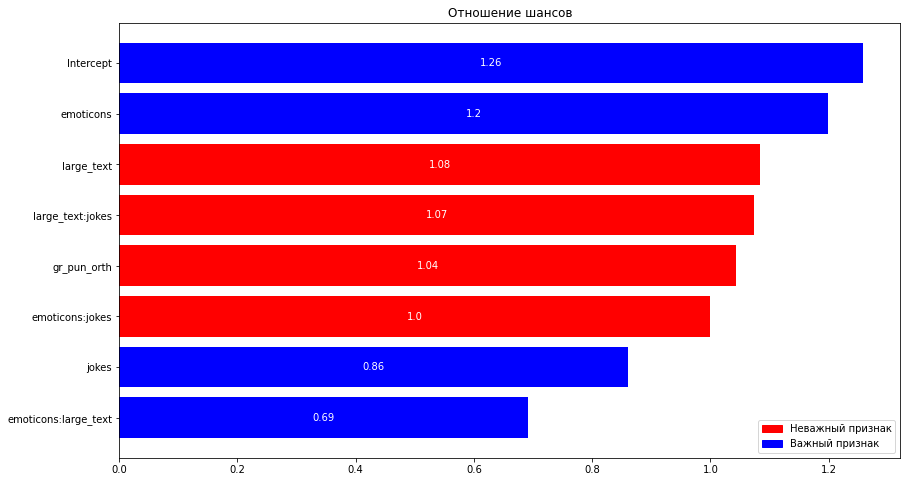

,OR,p-value,Lower CI: 2.5%,Upper CI: 97.5%,is_sig_95,c
emoticons:large_text,0.692062,0.000,0.573914,0.834533,True,blue
jokes,0.860947,0.043,0.744975,0.994973,True,blue
emoticons:jokes,0.999030,0.992,0.830307,1.202040,False,red
gr_pun_orth,1.043994,0.363,0.951595,1.145364,False,red
large_text:jokes,1.073975,0.461,0.888434,1.298266,False,red
large_text,1.084324,0.292,0.932756,1.260520,False,red
emoticons,1.199442,0.018,1.031157,1.395191,True,blue
Intercept,1.258554,0.000,1.129938,1.401810,True,blue


In [ ]:
# по зависимостям пост-ответов
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes +
 large_text + emoticons : jokes + emoticons:large_text + 
  large_text : jokes""" 
res = sm_log.logit(formula=formula, data= facts_dummy).fit()
print(res.summary())
print(odds_ratios(res))
feature_or(res)

Optimization terminated successfully.
         Current function value: 0.685021
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7700
Model:                          Logit   Df Residuals:                     7692
Method:                           MLE   Df Model:                            7
Date:                Mon, 30 May 2022   Pseudo R-squ.:                0.002390
Time:                        17:11:51   Log-Likelihood:                -5274.7
converged:                       True   LL-Null:                       -5287.3
Covariance Type:            nonrobust   LLR p-value:                 0.0006788
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                0.2300      0.055      4.181      0.000       0.122       0.338

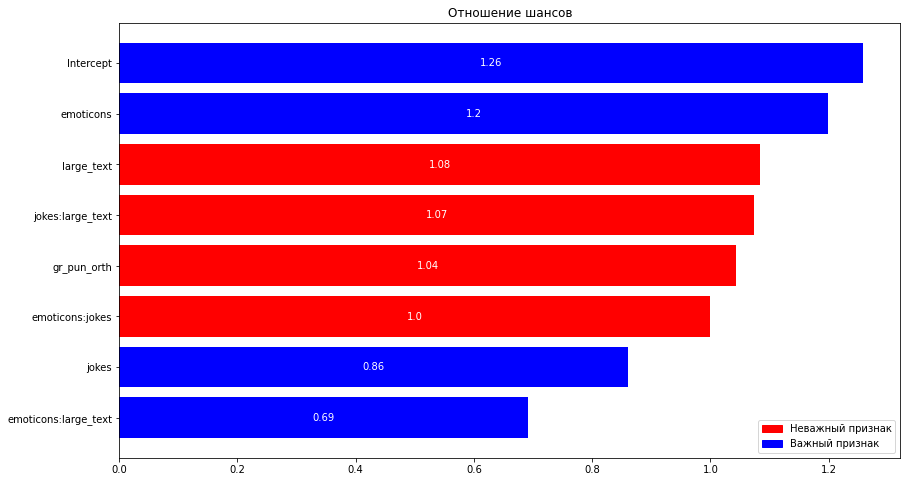

1.1259686016051667


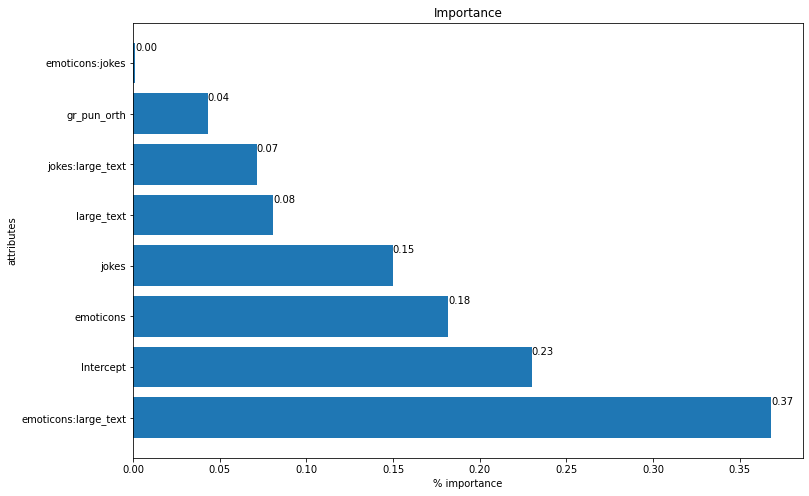

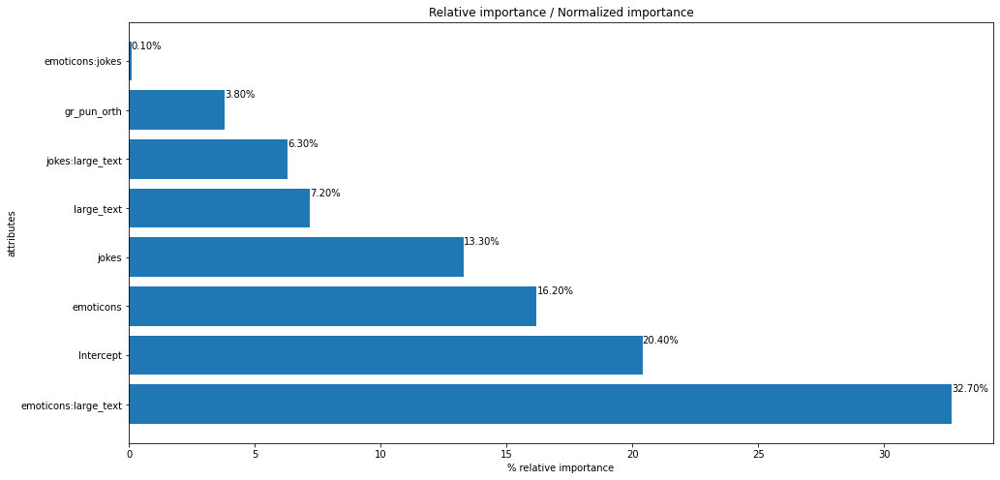

In [ ]:
# по зависимостям в конджоинте
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text +
 emoticons : jokes  + emoticons:large_text + jokes:large_text """ 
res = sm_log.logit(formula=formula, data= facts_dummy).fit()
print(res.summary())
print(odds_ratios(res))
feature_or(res)
rel = feature_importance(res)
relative_importance(rel)

### Здравоохранение

Согласно критерию хи

Optimization terminated successfully.
         Current function value: 0.643735
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7660
Model:                          Logit   Df Residuals:                     7652
Method:                           MLE   Df Model:                            7
Date:                Mon, 30 May 2022   Pseudo R-squ.:                 0.04795
Time:                        17:11:54   Log-Likelihood:                -4931.0
converged:                       True   LL-Null:                       -5179.4
Covariance Type:            nonrobust   LLR p-value:                4.087e-103
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                0.5056      0.057      8.901      0.000       0.394       0.617

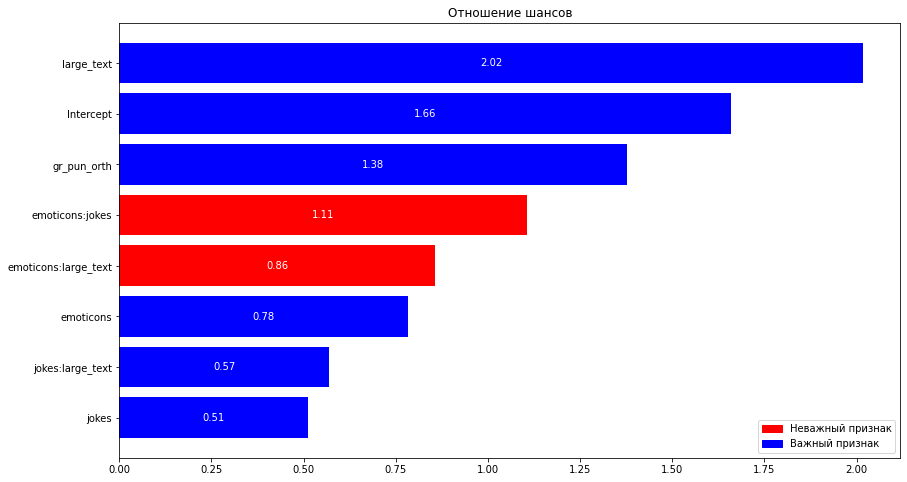

3.255126111926568


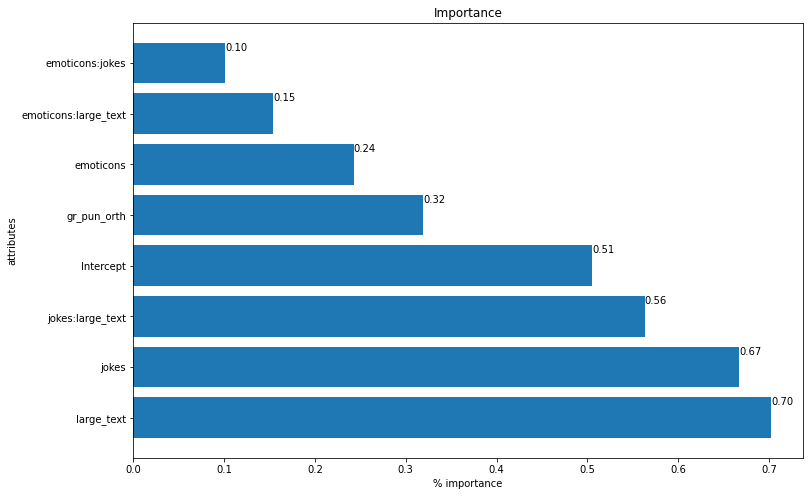

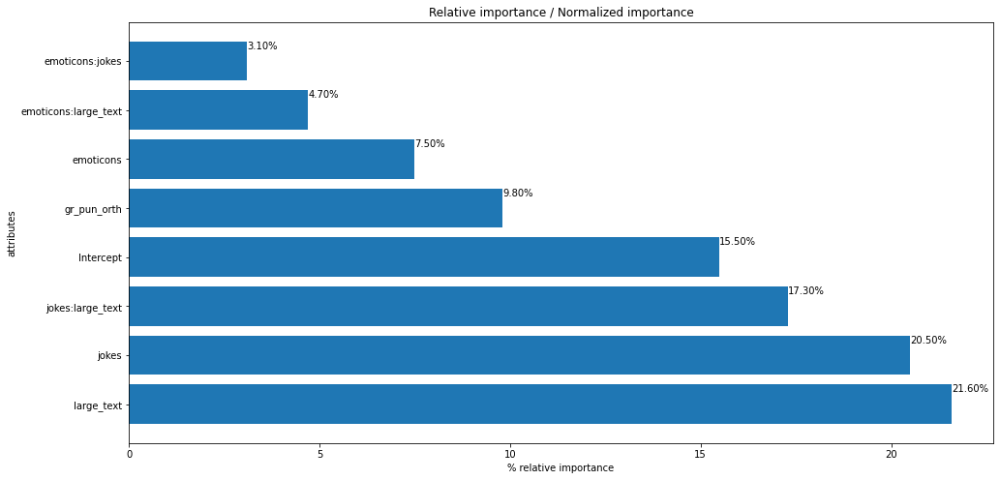

In [ ]:
# согласно зависимостям в пост-вопросах
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text +
 emoticons : jokes + jokes:large_text + emoticons:large_text """ 
res_w_int_h = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_or(res_w_int_h)
rel = feature_importance(res_w_int_h)
relative_importance(rel)

Optimization terminated successfully.
         Current function value: 0.642019
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       CHOICE_INDICATOR   No. Observations:                 7660
Model:                          Logit   Df Residuals:                     7651
Method:                           MLE   Df Model:                            8
Date:                Mon, 30 May 2022   Pseudo R-squ.:                 0.05049
Time:                        17:11:54   Log-Likelihood:                -4917.9
converged:                       True   LL-Null:                       -5179.4
Covariance Type:            nonrobust   LLR p-value:                8.151e-108
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 0.4088      0.060      6.856      0.000       0.292       0.

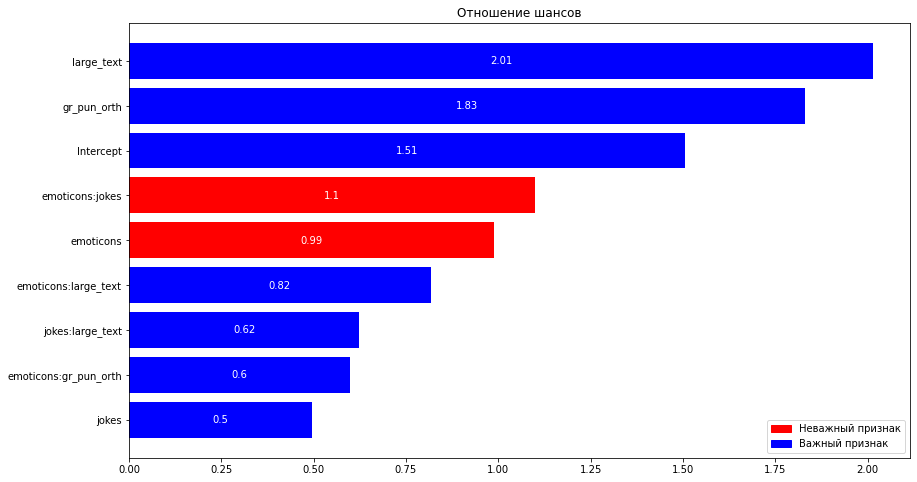

3.7085060028978862


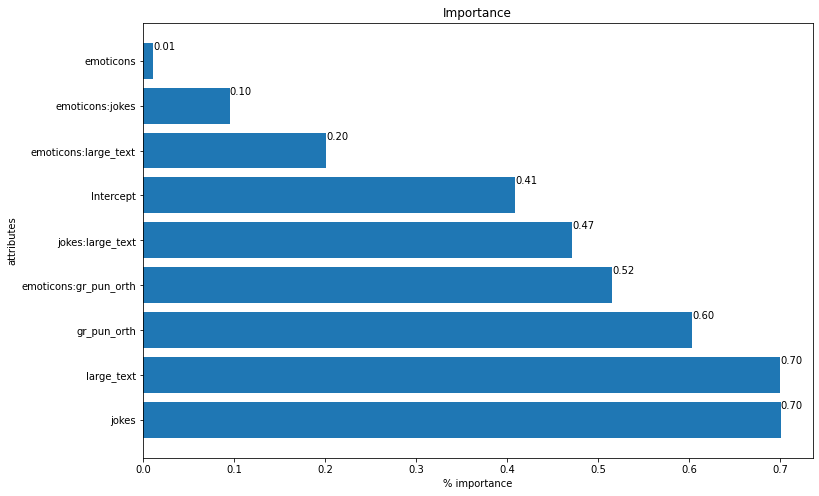

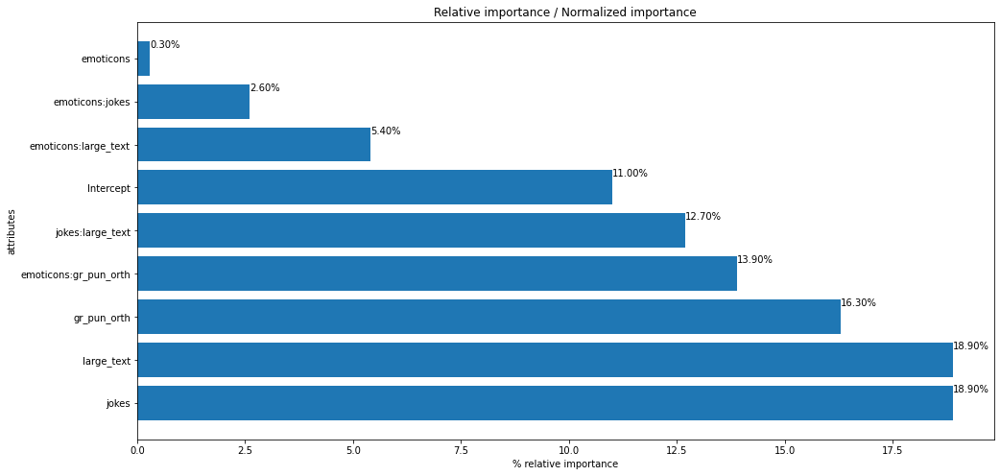

In [ ]:
# согласно зависимостям в конджоинте
formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text +
 emoticons : jokes + emoticons:gr_pun_orth + emoticons:large_text + jokes:large_text """ 
res_w_int_h = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res_w_int_h.summary())
print(odds_ratios(res_w_int_h))
feature_or(res_w_int_h)
rel = feature_importance(res_w_int_h)
relative_importance(rel)

## Сумма всех interaction доп. переменных

### Интересные факты

In [ ]:
formula_emo = """CHOICE_INDICATOR~jokes+ emoticons__1 + 
emoticons__2 + emoticons__4 + emoticons__5 + emoticons:emoticons__1 + emoticons:emoticons__2 + 
emoticons:emoticons__4 + emoticons:emoticons__5"""
formula_jokes = """CHOICE_INDICATOR~jokes+ emoticons  + gr_pun_orth + large_text +
jokes:jokes__1 + jokes:jokes__2 + jokes:jokes__3"""
formula_text = """CHOICE_INDICATOR~jokes+ large_text:large_text__2
 + large_text__2"""
# модель со всеми важными interactions по предварительному анализу
formula_all = """CHOICE_INDICATOR ~ emoticons + gr_pun_orth + jokes + large_text + 
gr_pun_orth__1:large_text__1+ emoticons__5:large_text__1"""
formula = """CHOICE_INDICATOR~jokes +  
gr_pun_orth__1:large_text__1+ emoticons__5:large_text__1 +
large_text:large_text__2 + large_text__2+
jokes:jokes__1 + jokes:jokes__2 + jokes:jokes__3 + 
emoticons__1 + emoticons__2 + emoticons__4 + emoticons__5 + emoticons:emoticons__1 + emoticons:emoticons__2 + 
emoticons:emoticons__4 + emoticons:emoticons__5 + 
emoticons:large_text + emoticons : gr_pun_orth
"""

#  gr_pun_orth__1:jokes__2 - yes
# emoticons__5:large_text__1 - no
# gr_pun_orth__1:large_text__1 - yes
res = sm_log.logit(formula=formula, data= facts_dummy).fit()
print(res.summary())
feature_importance_dummy(res)

### Здравоохранение

In [ ]:
formula_conjoint = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + jokes : large_text + 
emoticons : gr_pun_orth + emoticons : jokes + gr_pun_orth : jokes + large_text : gr_pun_orth""" 

formula_emo = """CHOICE_INDICATOR~jokes+ emoticons__1 + 
emoticons__2  + emoticons:emoticons__1 + emoticons:emoticons__2 + 
emoticons:emoticons__4 + emoticons:emoticons__5"""
formula_jokes = """CHOICE_INDICATOR~jokes+ emoticons  + gr_pun_orth + large_text + jokes__4
 + jokes:jokes__1 + jokes:jokes__4+ jokes:jokes__5"""
formula_gr = """CHOICE_INDICATOR~jokes +  emoticons  + gr_pun_orth + large_text +
gr_pun_orth__1+gr_pun_orth__2+gr_pun_orth__3+gr_pun_orth__5 +
gr_pun_orth:gr_pun_orth__1 + gr_pun_orth:gr_pun_orth__2 + gr_pun_orth:gr_pun_orth__3 + gr_pun_orth:gr_pun_orth__5
"""

formula_all = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
emoticons__1:jokes__2 +emoticons__5:jokes__5 + emoticons__1:gr_pun_orth__5 +
gr_pun_orth__1:jokes__1 + gr_pun_orth__3:large_text__2 + 
jokes__5:large_text__4""" 

formula = """CHOICE_INDICATOR~emoticons + gr_pun_orth + jokes + large_text + 
emoticons__1:jokes__2 +emoticons__5:jokes__5 + emoticons__1:gr_pun_orth__5 +
gr_pun_orth__1:jokes__1 + gr_pun_orth__3:large_text__2 + 
jokes__5:large_text__4 + 
gr_pun_orth__5 + gr_pun_orth:gr_pun_orth__5 +
jokes__4 + jokes:jokes__1 + jokes:jokes__4+ jokes:jokes__5 + 
emoticons__1 + emoticons__2  + emoticons:emoticons__1 + emoticons:emoticons__2 + 
emoticons:emoticons__4 + emoticons:emoticons__5 + 
jokes : large_text + emoticons : gr_pun_orth + emoticons : jokes + gr_pun_orth : jokes + large_text : gr_pun_orth
""" 
res = sm_log.logit(formula=formula, data= health_dummy).fit()
print(res.summary())
print(odds_ratios(res))
feature_importance_dummy(res)

In [ ]:
relative_imp0 = feature_importance(res)
# relative_importance(res_w_int_clust0)